In [ ]:
#@title ##### License { display-mode: "form" }
# Copyright 2019 DeepMind Technologies Ltd. All rights reserved.
#
# Licensed under the Apache License, Version 2.0 (the "License");
# you may not use this file except in compliance with the License.
# You may obtain a copy of the License at
#
#     http://www.apache.org/licenses/LICENSE-2.0
#
# Unless required by applicable law or agreed to in writing, software
# distributed under the License is distributed on an "AS IS" BASIS,
# WITHOUT WARRANTIES OR CONDITIONS OF ANY KIND, either express or implied.
# See the License for the specific language governing permissions and
# limitations under the License.

# OpenSpiel

* This Colab gets you started with installing OpenSpiel and its dependencies.
* OpenSpiel is a framework for reinforcement learning in games.
* The instructions are adapted from [here](https://github.com/deepmind/open_spiel/blob/master/docs/install.md).

## Install

Install OpenSpiel via pip:


In [ ]:
!pip install --upgrade open_spiel

# It's play time!

In [1]:
####

In [7]:
#!/usr/bin/env python3
"""
Standalone: runs OMWU variants on random 5x5 zero-sum games and plots results.

Variants implemented (directions d_t exactly as specified by user):
- OMWU:                d_t = 2 g_t − g_{t−1}
- OMWU-L:              d_t = (L+1) g_t − sum_{i=1}^L g_{t−i}
- OMWU-EO:             d_t = (L+1) g_t − L g_{t−1}
- OMWU-EOO:            d_t = (L+1) g_t − g_{t−1} − pending_t
                        pending_{t+1} = max(L−1,0) · g_{t−1}
- OMWU-DECAY:          d_t = α_b g_t − (α_b−1) g_{t−1}
                             + sum_{j=0}^{K_f−1} α_s ρ^j (g_{t−j} − g_{t−j−1})
                        (ρ=1): d_t = (α_b+α_s) g_t − (α_b−1) g_{t−1} − α_s g_{t−K_f}
- OMWU-DECAY-Gt:       d_t = α_b g_t − (α_b−1) g_{t−1}
                             + sum_{j=0}^{K_f−1} α_s ρ^j (g_t − g_{t−j−1})
                        (ρ=1): d_t = (α_b + K_f α_s) g_t − α_s * sum_{j=1}^{K_f} g_{t−j}
- OMWU-KD:             per step: Δb_t = η (2 g_t − g_{t−1}); b += Δb_t
                        every K_win steps: b -= sum of the first D_drop increments from that window
- KOMWU-Cautious:      direction is 2 g_t − g_{t−1}, but step size λ_t ∈ (0, η]
                        chosen by maximizing f(λ;r_t) = (α−1) log λ + log Σ_i exp(λ r_{t,i})
                        with r_t = U_t + u_{t−1},  u_t = g_t − <g_t, x_t> · 1
                        and full-step guard if max(r_t) ≥ −β (log d)^2
"""

from __future__ import annotations
import numpy as np
import matplotlib.pyplot as plt
from dataclasses import dataclass, asdict
from typing import Callable, Dict, List, Tuple

# ========================== CONFIG (edit me) ==========================
@dataclass
class Config:
    n_actions: int = 25                 # 5x5 game
    n_games: int = 3                   # number of random games to average
    T: int = 240000                     # iterations per game
    eta: float = 0.1                   # base step size
    L: int = 5                         # breadth for *-L, EO, EOO
    alpha_b: float = 1.0               # DECAY base weight
    alpha_s: float = 5.0               # DECAY suffix weight
    rho: float = 1.0                   # DECAY geometric factor
    Kf: int = 5                        # DECAY filter length
    K_win: int = 10                    # KD window length
    D_drop: int = 5                    # KD drop count at each window end
    cautious_alpha: float = 4.0        # Cautious (α in f(λ))
    cautious_beta: float = 70.0        # Cautious (β threshold)
    cautious_newton_iters: int = 8     # Cautious Newton steps
    cautious_newton_tol: float = 1e-12 # Cautious Newton tol
    seed: int = 1                      # RNG seed
    print_every: int = 500             # progress print freq
    plot_every: int = 100              # curve sampling freq

CFG = Config()
# =====================================================================

# ============== numerics (stable softmax, helpers) ====================
def softmax(b: np.ndarray) -> np.ndarray:
    z = b - np.max(b)
    e = np.exp(z)
    s = e / np.sum(e)
    return s

def row_grad(A: np.ndarray, y: np.ndarray) -> np.ndarray:
    # g_row = A y
    return A @ y

def col_grad(A: np.ndarray, x: np.ndarray) -> np.ndarray:
    # g_col = -A^T x
    return -(A.T @ x)

def best_response_value_row(A: np.ndarray, y: np.ndarray) -> float:
    return float(np.max(A @ y))

def best_response_value_col(A: np.ndarray, x: np.ndarray) -> float:
    return float(np.max(-(A.T @ x)))

def nashconv_and_exploit(A: np.ndarray, x: np.ndarray, y: np.ndarray) -> Tuple[float, float]:
    ev_row = float(x @ (A @ y))
    br_row = best_response_value_row(A, y)
    br_col = best_response_value_col(A, x)
    nconv = (br_row - ev_row) + (br_col + ev_row)  # since ev_col = -ev_row
    exploit = 0.5 * nconv
    return nconv, exploit

# ============================ base agent ==============================
class AgentBase:
    def __init__(self, n: int, eta: float, label: str):
        self.n = n
        self.eta = float(eta)
        self.label = label
        self.b = np.zeros(n, dtype=float)
        self.x = softmax(self.b)
        self.t = 0
        self.g_prev = np.zeros(n, dtype=float)  # g_{t-1}, zero if missing
        self._g_hist: List[np.ndarray] = []

    def next_strategy(self) -> np.ndarray:
        return self.x

    def _push_grad(self, g: np.ndarray):
        self._g_hist.append(g.copy())

    def _get_g(self, t_idx: int) -> np.ndarray:
        if t_idx <= 0 or t_idx > len(self._g_hist):
            return np.zeros(self.n, dtype=float)
        return self._g_hist[t_idx - 1]

    def observe_gradient(self, g_t: np.ndarray):
        raise NotImplementedError

# ============================ variants ================================
class OMWU(AgentBase):
    def observe_gradient(self, g_t: np.ndarray):
        self.t += 1
        d_t = 2.0 * g_t - self.g_prev
        self.b += self.eta * d_t
        self.x = softmax(self.b)
        self.g_prev = g_t.copy()
        self._push_grad(g_t)

class OMWU_L(AgentBase):
    def __init__(self, n: int, eta: float, L: int):
        super().__init__(n, eta, f"OMWU-L(L={L})")
        self.L = int(L)

    def observe_gradient(self, g_t: np.ndarray):
        self.t += 1
        sum_past = np.zeros(self.n, dtype=float)
        for i in range(1, self.L + 1):
            sum_past += self._get_g(self.t - i)
        d_t = (self.L + 1.0) * g_t - sum_past
        self.b += self.eta * d_t
        self.x = softmax(self.b)
        self.g_prev = g_t.copy()
        self._push_grad(g_t)

class OMWU_EO(AgentBase):
    def __init__(self, n: int, eta: float, L: int):
        super().__init__(n, eta, f"OMWU-EO(L={L})")
        self.L = int(L)

    def observe_gradient(self, g_t: np.ndarray):
        self.t += 1
        d_t = (self.L + 1.0) * g_t - (self.L * self.g_prev)
        self.b += self.eta * d_t
        self.x = softmax(self.b)
        self.g_prev = g_t.copy()
        self._push_grad(g_t)

class OMWU_EOO(AgentBase):
    def __init__(self, n: int, eta: float, L: int):
        super().__init__(n, eta, f"OMWU-EOO(L={L})")
        self.L = int(L)
        self.pending = np.zeros(n, dtype=float)

    def observe_gradient(self, g_t: np.ndarray):
        self.t += 1
        d_t = (self.L + 1.0) * g_t - self.g_prev - self.pending
        self.b += self.eta * d_t
        self.x = softmax(self.b)
        new_pending = max(self.L - 1, 0) * self.g_prev
        self.g_prev = g_t.copy()
        self.pending = new_pending
        self._push_grad(g_t)

class OMWU_DECAY(AgentBase):
    def __init__(self, n: int, eta: float, alpha_b: float, alpha_s: float, rho: float, Kf: int):
        super().__init__(n, eta, f"OMWU-DECAY(αb={alpha_b},αs={alpha_s},ρ={rho},Kf={Kf})")
        self.alpha_b = float(alpha_b)
        self.alpha_s = float(alpha_s)
        self.rho = float(rho)
        self.Kf = int(Kf)

    def observe_gradient(self, g_t: np.ndarray):
        self.t += 1
        base = self.alpha_b * g_t - (self.alpha_b - 1.0) * self.g_prev
        tail = np.zeros(self.n, dtype=float)
        for j in range(0, self.Kf):
            g_tj  = self._get_g(self.t - j) if j > 0 else g_t
            g_tj1 = self._get_g(self.t - j - 1)
            tail += (self.alpha_s * (self.rho ** j)) * (g_tj - g_tj1)
        d_t = base + tail
        self.b += self.eta * d_t
        self.x = softmax(self.b)
        self.g_prev = g_t.copy()
        self._push_grad(g_t)

class OMWU_DECAY_Gt(AgentBase):
    def __init__(self, n: int, eta: float, alpha_b: float, alpha_s: float, rho: float, Kf: int):
        super().__init__(n, eta, f"OMWU-DECAY-Gt(αb={alpha_b},αs={alpha_s},ρ={rho},Kf={Kf})")
        self.alpha_b = float(alpha_b)
        self.alpha_s = float(alpha_s)
        self.rho = float(rho)
        self.Kf = int(Kf)

    def observe_gradient(self, g_t: np.ndarray):
        self.t += 1
        base = self.alpha_b * g_t - (self.alpha_b - 1.0) * self.g_prev
        tail = np.zeros(self.n, dtype=float)
        for j in range(0, self.Kf):
            g_tjm1 = self._get_g(self.t - j - 1)
            tail += (self.alpha_s * (self.rho ** j)) * (g_t - g_tjm1)
        d_t = base + tail
        self.b += self.eta * d_t
        self.x = softmax(self.b)
        self.g_prev = g_t.copy()
        self._push_grad(g_t)

class OMWU_KD(AgentBase):
    """
    Block-window KD: per step Δb_t = η (2 g_t − g_{t−1}); after each K_win steps,
    subtract the sum of the FIRST D_drop increments from that block (drop-first).
    Then start a fresh window.
    """
    def __init__(self, n: int, eta: float, K_win: int, D_drop: int):
        super().__init__(n, eta, f"OMWU-KD(K={K_win},D={D_drop})")
        self.K_win = int(K_win)
        self.D_drop = int(D_drop)
        self._win_increments: List[np.ndarray] = []
        self._steps_in_block = 0

    def _end_block_prune(self):
        drop = min(self.D_drop, len(self._win_increments))
        if drop > 0:
            to_sub = np.sum(self._win_increments[:drop], axis=0)
            self.b -= to_sub
        self._win_increments.clear()
        self._steps_in_block = 0
        self.x = softmax(self.b)

    def observe_gradient(self, g_t: np.ndarray):
        self.t += 1
        d_t = 2.0 * g_t - self.g_prev
        delta_b = self.eta * d_t
        self.b += delta_b
        self._win_increments.append(delta_b)
        self._steps_in_block += 1
        self.x = softmax(self.b)
        self.g_prev = g_t.copy()
        self._push_grad(g_t)
        if self._steps_in_block >= self.K_win:
            self._end_block_prune()

class KOMWU_Cautious(AgentBase):
    """
    Same direction as OMWU: d_t = 2 g_t − g_{t−1}, but adaptive step λ_t ∈ (0, η]
    via f(λ; r) = (α−1) log λ + log sum_i exp(λ r_i),
    with r_t = U_t + u_{t−1}, u_t = g_t − <g_t, x_t> 1.
    Full step if max(r) ≥ −β (log d)^2.
    """
    def __init__(self, n: int, eta: float, alpha: float, beta: float, iters: int, tol: float):
        super().__init__(n, eta, f"KOMWU-Cautious(α={alpha},β={beta})")
        self.alpha = float(alpha)
        self.beta = float(beta)
        self.iters = int(iters)
        self.tol = float(tol)
        self._ones = np.ones(n, dtype=float)
        self._U = np.zeros(n, dtype=float)
        self._u_last = np.zeros(n, dtype=float)
        self._d_ref = n

    def _choose_lambda(self, r: np.ndarray) -> float:
        maxr = float(np.max(r))
        d = float(self._d_ref)
        thresh = - self.beta * (np.log(d) ** 2.0) if d > 1.0 else -self.beta
        if maxr >= thresh:
            return float(self.eta)
        eps = np.finfo(float).tiny
        lam = max((self.alpha - 1.0) / (-maxr + 1e-30), eps)
        lam = min(lam, float(self.eta))
        for _ in range(self.iters):
            z = lam * r
            m = float(np.max(z))
            e = np.exp(z - m)
            Z = float(np.sum(e))
            p = e / Z
            Er = float(p @ r)
            Er2 = float(p @ (r * r))
            Var = max(Er2 - Er * Er, 0.0)
            f1 = (self.alpha - 1.0) / lam + Er
            f2 = -(self.alpha - 1.0) / (lam * lam) + Var
            if f2 >= -1e-30:
                break
            new_lam = lam - f1 / f2
            new_lam = float(min(max(new_lam, eps), float(self.eta)))
            if abs(new_lam - lam) <= self.tol * max(1.0, lam):
                lam = new_lam
                break
            lam = new_lam
        return float(lam)

    def observe_gradient(self, g_t: np.ndarray):
        self.t += 1
        x_t = self.x
        gt_bar = float(g_t @ x_t)
        u_t = g_t - gt_bar * self._ones
        r_t = self._U + self._u_last
        lam_t = self._choose_lambda(r_t)
        d_t = 2.0 * g_t - self.g_prev
        self.b += lam_t * d_t
        self.x = softmax(self.b)
        self.g_prev = g_t.copy()
        self._U += u_t
        self._u_last = u_t.copy()
        self._push_grad(g_t)

# ========================== experiment harness =========================
def make_random_zero_sum_game(n: int, rng: np.random.Generator) -> np.ndarray:
    return rng.normal(0.0, 1.0, size=(n, n)).astype(float)

def build_agents(n: int, cfg: Config) -> Dict[str, Tuple[AgentBase, AgentBase]]:
    agents: Dict[str, Tuple[AgentBase, AgentBase]] = {}

    def pair(factory: Callable[[], AgentBase]) -> Tuple[AgentBase, AgentBase]:
        a = factory()
        b = factory()
        return a, b

    agents["OMWU"] = pair(lambda: OMWU(n, cfg.eta, "OMWU"))
    agents[f"OMWU-L(L={cfg.L})"] = pair(lambda: OMWU_L(n, cfg.eta, cfg.L))
    agents[f"OMWU-EO(L={cfg.L})"] = pair(lambda: OMWU_EO(n, cfg.eta, cfg.L))
    agents[f"OMWU-EOO(L={cfg.L})"] = pair(lambda: OMWU_EOO(n, cfg.eta, cfg.L))
    agents[f"OMWU-DECAY(αb={cfg.alpha_b},αs={cfg.alpha_s},ρ={cfg.rho},Kf={cfg.Kf})"] = pair(
        lambda: OMWU_DECAY(n, cfg.eta, cfg.alpha_b, cfg.alpha_s, cfg.rho, cfg.Kf)
    )
    agents[f"OMWU-DECAY-Gt(αb={cfg.alpha_b},αs={cfg.alpha_s},ρ={cfg.rho},Kf={cfg.Kf})"] = pair(
        lambda: OMWU_DECAY_Gt(n, cfg.eta, cfg.alpha_b, cfg.alpha_s, cfg.rho, cfg.Kf)
    )
    agents[f"OMWU-KD(K={cfg.K_win},D={cfg.D_drop})"] = pair(
        lambda: OMWU_KD(n, cfg.eta, cfg.K_win, cfg.D_drop)
    )
    agents[f"KOMWU-Cautious(α={cfg.cautious_alpha},β={cfg.cautious_beta})"] = pair(
        lambda: KOMWU_Cautious(n, cfg.eta, cfg.cautious_alpha, cfg.cautious_beta,
                               cfg.cautious_newton_iters, cfg.cautious_newton_tol)
    )
    return agents

def sampling_times(cfg: Config) -> List[int]:
    # Align with logging rule: we record at t==1 and at each multiple of plot_every.
    return [1] + list(range(cfg.plot_every, cfg.T + 1, cfg.plot_every))

def run_one_game(A: np.ndarray, cfg: Config, rng: np.random.Generator):
    n = A.shape[0]
    agents = build_agents(n, cfg)

    times = sampling_times(cfg)
    records = {lbl: {"times": [], "exploit": []} for lbl in agents.keys()}

    for t in range(1, cfg.T + 1):
        for lbl, (row, col) in agents.items():
            x = row.next_strategy()
            y = col.next_strategy()
            g_row = row_grad(A, y)
            g_col = col_grad(A, x)
            row.observe_gradient(g_row)
            col.observe_gradient(g_col)

            if t == 1 or (t % cfg.plot_every) == 0:
                x2 = row.next_strategy()
                y2 = col.next_strategy()
                _, ex = nashconv_and_exploit(A, x2, y2)
                records[lbl]["times"].append(t)
                records[lbl]["exploit"].append(ex)

        if (t % cfg.print_every) == 0 or t == 1:
            msg = [f"t={t:6d}"]
            for lbl in agents.keys():
                ex = records[lbl]["exploit"][-1] if records[lbl]["exploit"] else float('nan')
                msg.append(f"{lbl}: ex={ex:.3e}")
            print("[progress]", "  ".join(msg))

    # Sanity: align lengths
    for lbl in records:
        if len(records[lbl]["times"]) != len(times):
            # make sure plotting won't crash; this should not trigger now
            min_len = min(len(records[lbl]["times"]), len(records[lbl]["exploit"]), len(times))
            records[lbl]["times"] = records[lbl]["times"][:min_len]
            records[lbl]["exploit"] = records[lbl]["exploit"][:min_len]

    return times, records

def aggregate_results(all_runs: List[Tuple[List[int], Dict[str, Dict[str, List[float]]]]]) -> Dict[str, Dict[str, np.ndarray]]:
    labels = list(all_runs[0][1].keys())
    # assume same times schedule for all runs
    times = np.array(all_runs[0][0], dtype=float)
    agg = {lbl: {"times": times.copy(),
                 "exploit_mean": np.zeros_like(times),
                 "exploit_std": np.zeros_like(times)} for lbl in labels}
    for lbl in labels:
        mat = []
        for times_i, rec in all_runs:
            ys = np.array(rec[lbl]["exploit"], dtype=float)
            if ys.shape[0] != times.shape[0]:
                # truncate/pad if needed (shouldn't happen with fixed sampling)
                m = min(len(ys), len(times))
                ys = ys[:m]
            mat.append(ys)
        M = np.vstack(mat)
        agg[lbl]["exploit_mean"] = M.mean(axis=0)
        agg[lbl]["exploit_std"]  = M.std(axis=0)
    return agg

def main():
    print("Config:", asdict(CFG))
    rng = np.random.default_rng(CFG.seed)
    all_runs: List[Tuple[List[int], Dict[str, Dict[str, List[float]]]]] = []
    per_game_records: List[Tuple[int, List[int], Dict[str, Dict[str, List[float]]], np.ndarray]] = []

    for g in range(1, CFG.n_games + 1):
        A = rng.normal(0.0, 1.0, size=(CFG.n_actions, CFG.n_actions)).astype(float)
        print(f"\n=== Game {g}/{CFG.n_games} (random {CFG.n_actions}x{CFG.n_actions}) ===")
        times, records = run_one_game(A, CFG, rng)
        all_runs.append((times, records))
        per_game_records.append((g, times, records, A))

    # ---------- Aggregate plot ----------
    agg = aggregate_results(all_runs)
    plt.figure(figsize=(9,6))
    for lbl, data in agg.items():
        xs = data["times"]
        ys = data["exploit_mean"]
        plt.plot(xs, ys, label=lbl)
    plt.yscale("log")
    plt.xlabel("Iterations")
    plt.ylabel("Exploitability (average over games)")
    plt.title(f"OMWU variants on random {CFG.n_actions}x{CFG.n_actions} zero-sum games (n={CFG.n_games})")
    plt.grid(True, which="both", ls=":")
    plt.legend(fontsize=9, ncol=1)
    plt.tight_layout()
    plt.show()

    # ---------- Individual plots, one per game ----------
    for (g, times, records, A) in per_game_records:
        plt.figure(figsize=(9,6))
        for lbl, rec in records.items():
            xs = np.array(rec["times"], dtype=float)
            ys = np.array(rec["exploit"], dtype=float)
            plt.plot(xs, ys, label=lbl)
        plt.yscale("log")
        plt.xlabel("Iterations")
        plt.ylabel("Exploitability (this game)")
        plt.title(f"Game {g}: random {CFG.n_actions}x{CFG.n_actions}")
        plt.grid(True, which="both", ls=":")
        plt.legend(fontsize=9, ncol=1)
        plt.tight_layout()
        plt.show()

if __name__ == "__main__":
    main()


Config: {'n_actions': 25, 'n_games': 3, 'T': 240000, 'eta': 0.1, 'L': 5, 'alpha_b': 1.0, 'alpha_s': 5.0, 'rho': 1.0, 'Kf': 5, 'K_win': 10, 'D_drop': 5, 'cautious_alpha': 4.0, 'cautious_beta': 70.0, 'cautious_newton_iters': 8, 'cautious_newton_tol': 1e-12, 'seed': 1, 'print_every': 500, 'plot_every': 100}

=== Game 1/3 (random 25x25) ===
[progress] t=     1  OMWU: ex=3.102e-01  OMWU-L(L=5): ex=2.887e-01  OMWU-EO(L=5): ex=2.887e-01  OMWU-EOO(L=5): ex=2.887e-01  OMWU-DECAY(αb=1.0,αs=5.0,ρ=1.0,Kf=5): ex=2.887e-01  OMWU-DECAY-Gt(αb=1.0,αs=5.0,ρ=1.0,Kf=5): ex=3.171e-01  OMWU-KD(K=10,D=5): ex=3.102e-01  KOMWU-Cautious(α=4.0,β=70.0): ex=3.102e-01
[progress] t=   500  OMWU: ex=1.570e-01  OMWU-L(L=5): ex=6.308e-02  OMWU-EO(L=5): ex=9.809e-02  OMWU-EOO(L=5): ex=6.911e-02  OMWU-DECAY(αb=1.0,αs=5.0,ρ=1.0,Kf=5): ex=5.516e-02  OMWU-DECAY-Gt(αb=1.0,αs=5.0,ρ=1.0,Kf=5): ex=7.841e-01  OMWU-KD(K=10,D=5): ex=1.087e-01  KOMWU-Cautious(α=4.0,β=70.0): ex=1.570e-01
[progress] t=  1000  OMWU: ex=1.534e-01  OMWU

KeyboardInterrupt: 

In [8]:
#######################################

Config: {'n_actions': 35, 'n_games': 1, 'T': 280000, 'eta': 0.1, 'L': 5, 'alpha_b': 1.0, 'alpha_s': 5.0, 'rho': 1.0, 'Kf': 5, 'K_win': 10, 'D_drop': 5, 'cautious_alpha': 4.0, 'cautious_beta': 70.0, 'cautious_newton_iters': 8, 'cautious_newton_tol': 1e-12, 'geo_gamma': 0.5, 'L_max': 5, 'ema_beta': 0.9, 'th_alpha_s1': 5.0, 'th_rho1': 1.0, 'th_Kf1': 5, 'th_alpha_s2': 2.0, 'th_rho2': 1.0, 'th_Kf2': 20, 'seed': 0, 'print_every': 500, 'plot_every': 100}

=== Game 1/1  seed=5874934615388537134  (random 35x35) ===
[progress] t=     1  OMWU: ex=3.164e-01  OMWU-L(L=5): ex=3.028e-01  OMWU-EO(L=5): ex=3.028e-01  OMWU-EOO(L=5): ex=3.028e-01  OMWU-KD(K=10,D=5): ex=3.164e-01  KOMWU-Cautious(α=4.0,β=70.0): ex=3.164e-01  OMWU-L+KD(L=5,K=10,D=5): ex=3.028e-01  OMWU-EO+KD(L=5,K=10,D=5): ex=3.028e-01  OMWU-EOO+KD(L=5,K=10,D=5): ex=3.028e-01  KOMWU-Cautious-L(L=5): ex=3.028e-01  KOMWU-Cautious-EO(L=5): ex=3.028e-01  KOMWU-Cautious+KD(K=10,D=5): ex=3.164e-01  OMWU-EO-Adapt(Lmax=5): ex=3.028e-01
[progress] t

/tmp/ipython-input-2750364901.py:586: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('tab20', len(labels))  # discrete sampling, repeats gracefully >20


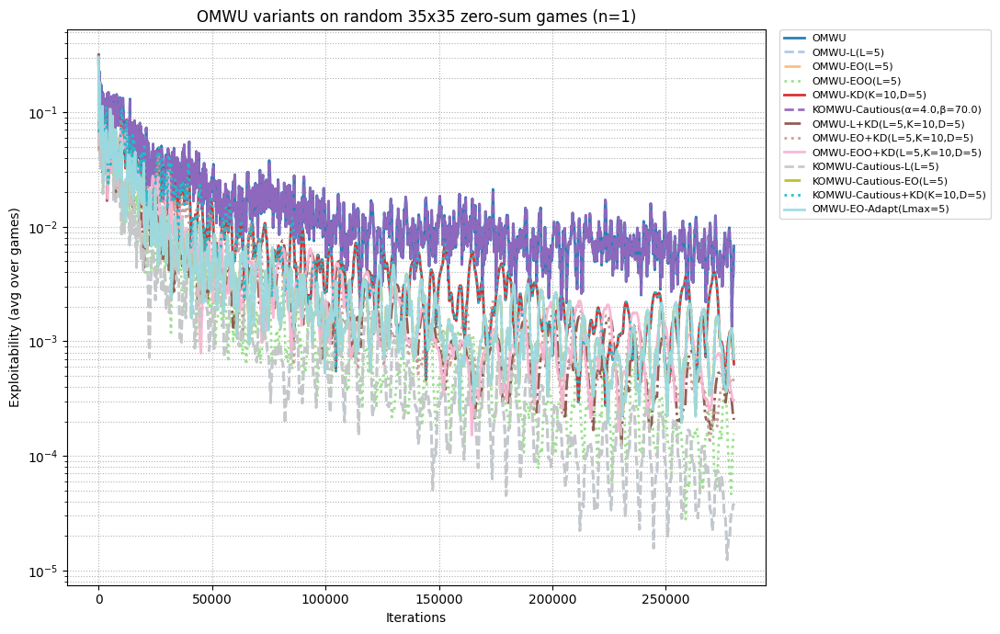

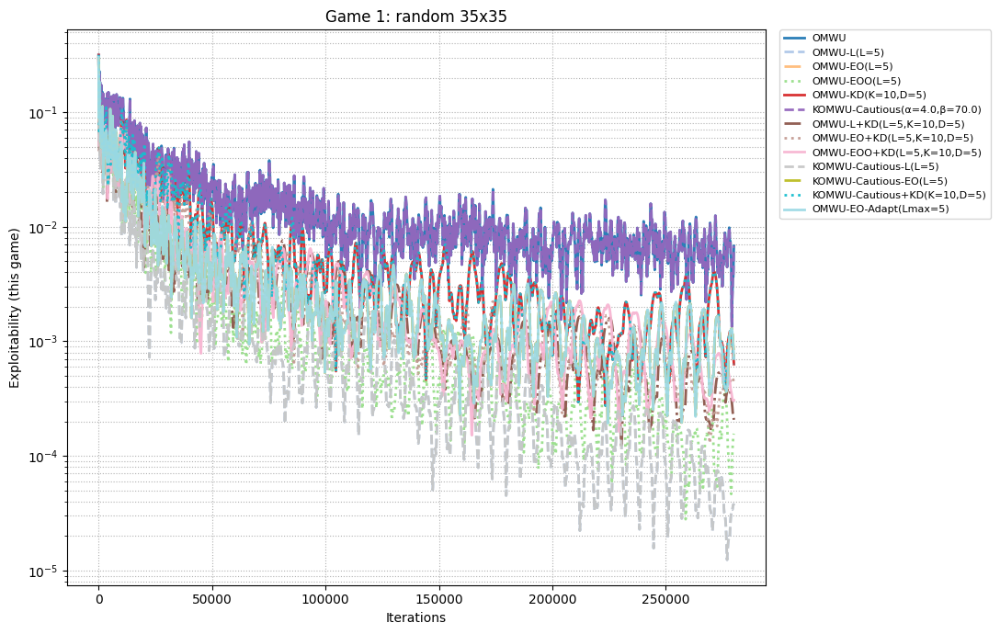

In [6]:
#!/usr/bin/env python3
"""
Standalone: OMWU family on random 5x5 zero-sum games, originals + new variants.
- DECAY-Gt variants removed per request.
- Prints the RNG seed used for each game.
- Distinct, consistent color+linestyle per variant across all plots.
- Per-game plots and an aggregate plot at the end.

Original variants (exact per user's spec, DECAY-Gt removed):
  OMWU:                d_t = 2 g_t − g_{t−1}
  OMWU-L:              d_t = (L+1) g_t − sum_{i=1}^L g_{t−i}
  OMWU-EO:             d_t = (L+1) g_t − L g_{t−1}
  OMWU-EOO:            d_t = (L+1) g_t − g_{t−1} − pending_t
                        pending_{t+1} = max(L−1,0) · g_{t−1}
  OMWU-DECAY:          d_t = α_b g_t − (α_b−1) g_{t−1}
                             + sum_{j=0}^{K_f−1} α_s ρ^j (g_{t−j} − g_{t−j−1})
                        (ρ=1): d_t = (α_b+α_s) g_t − (α_b−1) g_{t−1} − α_s g_{t−K_f}
  OMWU-KD:             per step: Δb_t = η (2 g_t − g_{t−1}); b += Δb_t
                        every K_win steps: b -= sum of the first D_drop increments
  KOMWU-Cautious:      direction 2 g_t − g_{t−1}, adaptive step λ_t ∈ (0,η] from f(λ;r_t)

New variants included (mix & match of the same building blocks, still no DECAY-Gt):
  OMWU-DECAY-EO, OMWU-DECAY-L, OMWU-DECAY-EOO,
  KD-L, KD-EO, KD-EOO, DECAY-KD,
  KOMWU-Cautious-L, KOMWU-Cautious-EO, KOMWU-Cautious-KD,
  OMWU-EOO-Geo(γ), OMWU-EO-Adaptive(L_max),
  OMWU-EMA-BC (bias-corrected EMA tail),
  OMWU-DECAY-2H (two-horizon decay sums).
"""

from __future__ import annotations
import numpy as np
import matplotlib.pyplot as plt
from dataclasses import dataclass, asdict
from typing import Callable, Dict, List, Tuple

# ========================== CONFIG (edit me) ==========================
@dataclass
class Config:
    n_actions: int = 35           # 5x5 game
    n_games: int = 1             # number of random games
    T: int = 280000               # iterations per game
    eta: float = 0.1             # base step size

    # core breadth/decay defaults
    L: int = 5
    alpha_b: float = 1.0
    alpha_s: float = 5.0
    rho: float = 1.0
    Kf: int = 5

    # KD defaults
    K_win: int = 10
    D_drop: int = 5

    # cautious step defaults
    cautious_alpha: float = 4.0
    cautious_beta: float = 70.0
    cautious_newton_iters: int = 8
    cautious_newton_tol: float = 1e-12

    # extras for new variants
    geo_gamma: float = 0.5            # for OMWU-EOO-Geo
    L_max: int = 5                    # for OMWU-EO-Adaptive
    ema_beta: float = 0.9             # for OMWU-EMA-BC

    # two-horizon decay (2H)
    th_alpha_s1: float = 5.0
    th_rho1: float = 1.0
    th_Kf1: int = 5
    th_alpha_s2: float = 2.0
    th_rho2: float = 1.0
    th_Kf2: int = 20

    # logging / plotting
    seed: int = 0
    print_every: int = 500
    plot_every: int = 100

CFG = Config()
# =====================================================================

# ============== numerics (stable softmax, helpers) ====================
def softmax(b: np.ndarray) -> np.ndarray:
    z = b - np.max(b)
    e = np.exp(z)
    s = e / np.sum(e)
    return s

def row_grad(A: np.ndarray, y: np.ndarray) -> np.ndarray:
    return A @ y

def col_grad(A: np.ndarray, x: np.ndarray) -> np.ndarray:
    return -(A.T @ x)

def best_response_value_row(A: np.ndarray, y: np.ndarray) -> float:
    return float(np.max(A @ y))

def best_response_value_col(A: np.ndarray, x: np.ndarray) -> float:
    return float(np.max(-(A.T @ x)))

def nashconv_and_exploit(A: np.ndarray, x: np.ndarray, y: np.ndarray) -> Tuple[float, float]:
    ev_row = float(x @ (A @ y))
    br_row = best_response_value_row(A, y)
    br_col = best_response_value_col(A, x)
    nconv = (br_row - ev_row) + (br_col + ev_row)
    exploit = 0.5 * nconv
    return nconv, exploit

# ============================ base agent ==============================
class AgentBase:
    def __init__(self, n: int, eta: float, label: str):
        self.n = n
        self.eta = float(eta)
        self.label = label
        self.b = np.zeros(n, dtype=float)
        self.x = softmax(self.b)
        self.t = 0
        self.g_prev = np.zeros(n, dtype=float)
        self._g_hist: List[np.ndarray] = []

    def next_strategy(self) -> np.ndarray:
        return self.x

    def _push_grad(self, g: np.ndarray):
        self._g_hist.append(g.copy())

    def _get_g(self, t_idx: int) -> np.ndarray:
        if t_idx <= 0 or t_idx > len(self._g_hist):
            return np.zeros(self.n, dtype=float)
        return self._g_hist[t_idx - 1]

    def observe_gradient(self, g_t: np.ndarray):
        raise NotImplementedError

# ============================ originals ===============================
class OMWU(AgentBase):
    def __init__(self, n: int, eta: float):
        super().__init__(n, eta, "OMWU")
    def observe_gradient(self, g_t: np.ndarray):
        self.t += 1
        d_t = 2.0 * g_t - self.g_prev
        self.b += self.eta * d_t
        self.x = softmax(self.b)
        self.g_prev = g_t.copy()
        self._push_grad(g_t)

class OMWU_L(AgentBase):
    def __init__(self, n: int, eta: float, L: int):
        super().__init__(n, eta, f"OMWU-L(L={L})")
        self.L = int(L)
    def observe_gradient(self, g_t: np.ndarray):
        self.t += 1
        sum_past = np.zeros(self.n, dtype=float)
        for i in range(1, self.L + 1):
            sum_past += self._get_g(self.t - i)
        d_t = (self.L + 1.0) * g_t - sum_past
        self.b += self.eta * d_t
        self.x = softmax(self.b)
        self.g_prev = g_t.copy()
        self._push_grad(g_t)

class OMWU_EO(AgentBase):
    def __init__(self, n: int, eta: float, L: int):
        super().__init__(n, eta, f"OMWU-EO(L={L})")
        self.L = int(L)
    def observe_gradient(self, g_t: np.ndarray):
        self.t += 1
        d_t = (self.L + 1.0) * g_t - (self.L * self.g_prev)
        self.b += self.eta * d_t
        self.x = softmax(self.b)
        self.g_prev = g_t.copy()
        self._push_grad(g_t)

class OMWU_EOO(AgentBase):
    def __init__(self, n: int, eta: float, L: int):
        super().__init__(n, eta, f"OMWU-EOO(L={L})")
        self.L = int(L)
        self.pending = np.zeros(n, dtype=float)
    def observe_gradient(self, g_t: np.ndarray):
        self.t += 1
        d_t = (self.L + 1.0) * g_t - self.g_prev - self.pending
        self.b += self.eta * d_t
        self.x = softmax(self.b)
        new_pending = max(self.L - 1, 0) * self.g_prev
        self.g_prev = g_t.copy()
        self.pending = new_pending
        self._push_grad(g_t)

class OMWU_DECAY(AgentBase):
    def __init__(self, n: int, eta: float, alpha_b: float, alpha_s: float, rho: float, Kf: int):
        super().__init__(n, eta, f"OMWU-DECAY(αb={alpha_b},αs={alpha_s},ρ={rho},Kf={Kf})")
        self.alpha_b = float(alpha_b); self.alpha_s = float(alpha_s)
        self.rho = float(rho); self.Kf = int(Kf)
    def observe_gradient(self, g_t: np.ndarray):
        self.t += 1
        base = self.alpha_b * g_t - (self.alpha_b - 1.0) * self.g_prev
        tail = np.zeros(self.n, dtype=float)
        for j in range(0, self.Kf):
            g_tj  = self._get_g(self.t - j) if j > 0 else g_t
            g_tj1 = self._get_g(self.t - j - 1)
            tail += (self.alpha_s * (self.rho ** j)) * (g_tj - g_tj1)
        d_t = base + tail
        self.b += self.eta * d_t
        self.x = softmax(self.b)
        self.g_prev = g_t.copy()
        self._push_grad(g_t)

class OMWU_KD(AgentBase):
    def __init__(self, n: int, eta: float, K_win: int, D_drop: int):
        super().__init__(n, eta, f"OMWU-KD(K={K_win},D={D_drop})")
        self.K_win = int(K_win); self.D_drop = int(D_drop)
        self._win_increments: List[np.ndarray] = []; self._steps_in_block = 0
    def _end_block_prune(self):
        drop = min(self.D_drop, len(self._win_increments))
        if drop > 0:
            to_sub = np.sum(self._win_increments[:drop], axis=0)
            self.b -= to_sub
        self._win_increments.clear(); self._steps_in_block = 0
        self.x = softmax(self.b)
    def observe_gradient(self, g_t: np.ndarray):
        self.t += 1
        d_t = 2.0 * g_t - self.g_prev
        delta_b = self.eta * d_t
        self.b += delta_b
        self._win_increments.append(delta_b)
        self._steps_in_block += 1
        self.x = softmax(self.b)
        self.g_prev = g_t.copy()
        self._push_grad(g_t)
        if self._steps_in_block >= self.K_win:
            self._end_block_prune()

# ======================= cautious step base/class =====================
class KOMWU_Cautious(AgentBase):
    """
    Direction: 2 g_t − g_{t−1}, step λ_t ∈ (0, η] via f(λ;r_t).
    """
    def __init__(self, n: int, eta: float, alpha: float, beta: float, iters: int, tol: float):
        super().__init__(n, eta, f"KOMWU-Cautious(α={alpha},β={beta})")
        self.alpha = float(alpha); self.beta = float(beta)
        self.iters = int(iters); self.tol = float(tol)
        self._ones = np.ones(n, dtype=float); self._U = np.zeros(n, dtype=float); self._u_last = np.zeros(n, dtype=float)
        self._d_ref = n
    def _choose_lambda(self, r: np.ndarray) -> float:
        maxr = float(np.max(r)); d = float(self._d_ref)
        thresh = - self.beta * (np.log(d) ** 2.0) if d > 1.0 else -self.beta
        if maxr >= thresh: return float(self.eta)
        eps = np.finfo(float).tiny
        lam = max((self.alpha - 1.0) / (-maxr + 1e-30), eps); lam = min(lam, float(self.eta))
        for _ in range(self.iters):
            z = lam * r; m = float(np.max(z)); e = np.exp(z - m); Z = float(np.sum(e)); p = e / Z
            Er = float(p @ r); Er2 = float(p @ (r * r)); Var = max(Er2 - Er * Er, 0.0)
            f1 = (self.alpha - 1.0) / lam + Er; f2 = -(self.alpha - 1.0) / (lam * lam) + Var
            if f2 >= -1e-30: break
            new_lam = float(min(max(lam - f1 / f2, eps), float(self.eta)))
            if abs(new_lam - lam) <= self.tol * max(1.0, lam): lam = new_lam; break
            lam = new_lam
        return float(lam)
    def _lambda_step(self, g_t: np.ndarray, base_direction: np.ndarray):
        r_t = self._U + self._u_last
        lam_t = self._choose_lambda(r_t)
        self.b += lam_t * base_direction
        self.x = softmax(self.b)
        gt_bar = float(g_t @ self.x)
        u_t = g_t - gt_bar * self._ones
        self._U += u_t; self._u_last = u_t.copy()
    def observe_gradient(self, g_t: np.ndarray):
        self.t += 1
        d_t = 2.0 * g_t - self.g_prev
        self._lambda_step(g_t, d_t)
        self.g_prev = g_t.copy()
        self._push_grad(g_t)

# Cautious on EO base
class KOMWU_Cautious_EO(KOMWU_Cautious):
    def __init__(self, n: int, eta: float, L: int, alpha: float, beta: float, iters: int, tol: float):
        super().__init__(n, eta, alpha, beta, iters, tol)
        self.L = int(L); self.label = f"KOMWU-Cautious-EO(L={L})"
    def observe_gradient(self, g_t: np.ndarray):
        self.t += 1
        d_t = (self.L + 1.0) * g_t - (self.L * self.g_prev)
        self._lambda_step(g_t, d_t)
        self.g_prev = g_t.copy()
        self._push_grad(g_t)

# Cautious on L base
class KOMWU_Cautious_L(KOMWU_Cautious):
    def __init__(self, n: int, eta: float, L: int, alpha: float, beta: float, iters: int, tol: float):
        super().__init__(n, eta, alpha, beta, iters, tol)
        self.L = int(L); self.label = f"KOMWU-Cautious-L(L={L})"
    def observe_gradient(self, g_t: np.ndarray):
        self.t += 1
        sum_past = np.zeros(self.n, dtype=float)
        for i in range(1, self.L + 1):
            sum_past += self._get_g(self.t - i)
        d_t = (self.L + 1.0) * g_t - sum_past
        self._lambda_step(g_t, d_t)
        self.g_prev = g_t.copy()
        self._push_grad(g_t)

# ================= new base/combination directions ====================
# DECAY + EO base
class OMWU_DECAY_EO(AgentBase):
    def __init__(self, n: int, eta: float, L: int, alpha_s: float, rho: float, Kf: int):
        super().__init__(n, eta, f"OMWU-DECAY-EO(L={L},αs={alpha_s},ρ={rho},Kf={Kf})")
        self.L = int(L); self.alpha_s = float(alpha_s); self.rho = float(rho); self.Kf = int(Kf)
    def observe_gradient(self, g_t: np.ndarray):
        self.t += 1
        base = (self.L + 1.0) * g_t - (self.L * self.g_prev)
        tail = np.zeros(self.n, dtype=float)
        for j in range(0, self.Kf):
            g_tj  = self._get_g(self.t - j) if j > 0 else g_t
            g_tj1 = self._get_g(self.t - j - 1)
            tail += (self.alpha_s * (self.rho ** j)) * (g_tj - g_tj1)
        d_t = base + tail
        self.b += self.eta * d_t; self.x = softmax(self.b)
        self.g_prev = g_t.copy(); self._push_grad(g_t)

# DECAY + L base
class OMWU_DECAY_L_base(AgentBase):
    def __init__(self, n: int, eta: float, L: int, alpha_s: float, rho: float, Kf: int):
        super().__init__(n, eta, f"OMWU-DECAY-L(L={L},αs={alpha_s},ρ={rho},Kf={Kf})")
        self.L = int(L); self.alpha_s = float(alpha_s); self.rho = float(rho); self.Kf = int(Kf)
    def observe_gradient(self, g_t: np.ndarray):
        self.t += 1
        sum_past = np.zeros(self.n, dtype=float)
        for i in range(1, self.L + 1):
            sum_past += self._get_g(self.t - i)
        base = (self.L + 1.0) * g_t - sum_past
        tail = np.zeros(self.n, dtype=float)
        for j in range(0, self.Kf):
            g_tj  = self._get_g(self.t - j) if j > 0 else g_t
            g_tj1 = self._get_g(self.t - j - 1)
            tail += (self.alpha_s * (self.rho ** j)) * (g_tj - g_tj1)
        d_t = base + tail
        self.b += self.eta * d_t; self.x = softmax(self.b)
        self.g_prev = g_t.copy(); self._push_grad(g_t)

# DECAY + EOO base
class OMWU_DECAY_EOO(AgentBase):
    def __init__(self, n: int, eta: float, L: int, alpha_s: float, rho: float, Kf: int):
        super().__init__(n, eta, f"OMWU-DECAY-EOO(L={L},αs={alpha_s},ρ={rho},Kf={Kf})")
        self.L = int(L); self.alpha_s = float(alpha_s); self.rho = float(rho); self.Kf = int(Kf)
        self.pending = np.zeros(n, dtype=float)
    def observe_gradient(self, g_t: np.ndarray):
        self.t += 1
        base = (self.L + 1.0) * g_t - self.g_prev - self.pending
        tail = np.zeros(self.n, dtype=float)
        for j in range(0, self.Kf):
            g_tj  = self._get_g(self.t - j) if j > 0 else g_t
            g_tj1 = self._get_g(self.t - j - 1)
            tail += (self.alpha_s * (self.rho ** j)) * (g_tj - g_tj1)
        d_t = base + tail
        self.b += self.eta * d_t; self.x = softmax(self.b)
        new_pending = max(self.L - 1, 0) * self.g_prev
        self.g_prev = g_t.copy(); self.pending = new_pending; self._push_grad(g_t)

# EOO with geometric pending
class OMWU_EOO_Geo(AgentBase):
    def __init__(self, n: int, eta: float, L: int, gamma: float):
        super().__init__(n, eta, f"OMWU-EOO-Geo(L={L},γ={gamma})")
        self.L = int(L); self.gamma = float(gamma)
        self.pending = np.zeros(n, dtype=float)
    def observe_gradient(self, g_t: np.ndarray):
        self.t += 1
        d_t = (self.L + 1.0) * g_t - self.g_prev - self.pending
        self.b += self.eta * d_t; self.x = softmax(self.b)
        self.pending = self.gamma * self.pending + max(self.L - 1, 0) * self.g_prev
        self.g_prev = g_t.copy(); self._push_grad(g_t)

# Adaptive EO breadth
class OMWU_EO_Adaptive(AgentBase):
    def __init__(self, n: int, eta: float, L_max: int):
        super().__init__(n, eta, f"OMWU-EO-Adapt(Lmax={L_max})")
        self.L_max = int(L_max)
    def observe_gradient(self, g_t: np.ndarray):
        self.t += 1
        align = float(g_t @ self.g_prev)
        L_t = self.L_max if align >= 0.0 else 1
        d_t = (L_t + 1.0) * g_t - (L_t * self.g_prev)
        self.b += self.eta * d_t; self.x = softmax(self.b)
        self.g_prev = g_t.copy(); self._push_grad(g_t)

# Bias-corrected EMA tail (not DECAY-Gt)
class OMWU_EMA_BC(AgentBase):
    """
    EMA S_t = β S_{t-1} + (1-β) g_t, debiased Ŝ_t = S_t / (1-β^t).
    d_t = α_b g_t − (α_b−1) g_{t−1} + α_s (Ŝ_t − g_t).
    """
    def __init__(self, n: int, eta: float, alpha_b: float, alpha_s: float, beta: float):
        super().__init__(n, eta, f"OMWU-EMA-BC(αb={alpha_b},αs={alpha_s},β={beta})")
        self.alpha_b = float(alpha_b); self.alpha_s = float(alpha_s); self.beta = float(beta)
        self.S = np.zeros(n, dtype=float)
    def observe_gradient(self, g_t: np.ndarray):
        self.t += 1
        self.S = self.beta * self.S + (1.0 - self.beta) * g_t
        debias = 1.0 - (self.beta ** self.t)
        S_hat = self.S / max(debias, 1e-30)
        base = self.alpha_b * g_t - (self.alpha_b - 1.0) * self.g_prev
        tail = self.alpha_s * (S_hat - g_t)
        d_t = base + tail
        self.b += self.eta * d_t; self.x = softmax(self.b)
        self.g_prev = g_t.copy(); self._push_grad(g_t)

# Two-horizon decay: sum of two finite-diff tails
class OMWU_DECAY_2H(AgentBase):
    """
    d_t = α_b g_t − (α_b−1) g_{t−1}
          + sum_{j=0}^{Kf1−1} α_s1 ρ1^j (g_{t−j} − g_{t−j−1})
          + sum_{j=0}^{Kf2−1} α_s2 ρ2^j (g_{t−j} − g_{t−j−1})
    """
    def __init__(self, n: int, eta: float, alpha_b: float,
                 alpha_s1: float, rho1: float, Kf1: int,
                 alpha_s2: float, rho2: float, Kf2: int):
        super().__init__(n, eta,
            f"OMWU-DECAY-2H(αb={alpha_b}; αs1={alpha_s1},ρ1={rho1},K1={Kf1}; αs2={alpha_s2},ρ2={rho2},K2={Kf2})")
        self.alpha_b = float(alpha_b)
        self.alpha_s1 = float(alpha_s1); self.rho1 = float(rho1); self.Kf1 = int(Kf1)
        self.alpha_s2 = float(alpha_s2); self.rho2 = float(rho2); self.Kf2 = int(Kf2)
    def observe_gradient(self, g_t: np.ndarray):
        self.t += 1
        base = self.alpha_b * g_t - (self.alpha_b - 1.0) * self.g_prev
        tail = np.zeros(self.n, dtype=float)
        for j in range(0, self.Kf1):
            g_tj  = self._get_g(self.t - j) if j > 0 else g_t
            g_tj1 = self._get_g(self.t - j - 1)
            tail += (self.alpha_s1 * (self.rho1 ** j)) * (g_tj - g_tj1)
        for j in range(0, self.Kf2):
            g_tj  = self._get_g(self.t - j) if j > 0 else g_t
            g_tj1 = self._get_g(self.t - j - 1)
            tail += (self.alpha_s2 * (self.rho2 ** j)) * (g_tj - g_tj1)
        d_t = base + tail
        self.b += self.eta * d_t; self.x = softmax(self.b)
        self.g_prev = g_t.copy(); self._push_grad(g_t)

# ====================== KD wrapper for any agent ======================
class KDWrapper(AgentBase):
    """
    Wrap any AgentBase and apply KD pruning on its logits.
    We capture per-step Δb by diffing inner.b before/after.
    """
    def __init__(self, inner_factory: Callable[[], AgentBase], K_win: int, D_drop: int, label_prefix: str):
        inner = inner_factory()
        super().__init__(inner.n, inner.eta, f"{label_prefix}+KD(K={K_win},D={D_drop})")
        self.inner = inner
        self.K_win = int(K_win); self.D_drop = int(D_drop)
        self._win_increments: List[np.ndarray] = []; self._steps_in_block = 0
    def next_strategy(self) -> np.ndarray: return self.inner.next_strategy()
    def observe_gradient(self, g_t: np.ndarray):
        b_before = self.inner.b.copy()
        self.inner.observe_gradient(g_t)
        delta_b = self.inner.b - b_before
        self._win_increments.append(delta_b); self._steps_in_block += 1
        if self._steps_in_block >= self.K_win:
            drop = min(self.D_drop, len(self._win_increments))
            if drop > 0:
                to_sub = np.sum(self._win_increments[:drop], axis=0)
                self.inner.b -= to_sub
                self.inner.x = softmax(self.inner.b)
            self._win_increments.clear(); self._steps_in_block = 0

# ========================== experiment harness ========================
def make_random_zero_sum_game(n: int, rng: np.random.Generator) -> np.ndarray:
    return rng.normal(0.0, 1.0, size=(n, n)).astype(float)

def build_agents(n: int, cfg: Config) -> Dict[str, Tuple[AgentBase, AgentBase]]:
    agents: Dict[str, Tuple[AgentBase, AgentBase]] = {}
    def pair(factory: Callable[[], AgentBase]) -> Tuple[AgentBase, AgentBase]:
        a = factory(); b = factory(); return a, b

    # originals (DECAY-Gt removed)
    agents["OMWU"] = pair(lambda: OMWU(n, cfg.eta))
    agents[f"OMWU-L(L={cfg.L})"] = pair(lambda: OMWU_L(n, cfg.eta, cfg.L))
    agents[f"OMWU-EO(L={cfg.L})"] = pair(lambda: OMWU_EO(n, cfg.eta, cfg.L))
    agents[f"OMWU-EOO(L={cfg.L})"] = pair(lambda: OMWU_EOO(n, cfg.eta, cfg.L))
    # agents[f"OMWU-DECAY(αb={cfg.alpha_b},αs={cfg.alpha_s},ρ={cfg.rho},Kf={cfg.Kf})"] = pair(
    #     lambda: OMWU_DECAY(n, cfg.eta, cfg.alpha_b, cfg.alpha_s, cfg.rho, cfg.Kf)
    # )
    agents[f"OMWU-KD(K={cfg.K_win},D={cfg.D_drop})"] = pair(
        lambda: OMWU_KD(n, cfg.eta, cfg.K_win, cfg.D_drop)
    )
    agents[f"KOMWU-Cautious(α={cfg.cautious_alpha},β={cfg.cautious_beta})"] = pair(
        lambda: KOMWU_Cautious(n, cfg.eta, cfg.cautious_alpha, cfg.cautious_beta,
                               cfg.cautious_newton_iters, cfg.cautious_newton_tol)
    )

    ###########D0
    # new combos (all DECAY-Gt references removed)
    # agents[f"OMWU-DECAY-EO(L={cfg.L},αs={cfg.alpha_s},ρ={cfg.rho},Kf={cfg.Kf})"] = pair(
    #     lambda: OMWU_DECAY_EO(n, cfg.eta, cfg.L, cfg.alpha_s, cfg.rho, cfg.Kf)
    # )
    # agents[f"OMWU-DECAY-L(L={cfg.L},αs={cfg.alpha_s},ρ={cfg.rho},Kf={cfg.Kf})"] = pair(
    #     lambda: OMWU_DECAY_L_base(n, cfg.eta, cfg.L, cfg.alpha_s, cfg.rho, cfg.Kf)
    # )
    # agents[f"OMWU-DECAY-EOO(L={cfg.L},αs={cfg.alpha_s},ρ={cfg.rho},Kf={cfg.Kf})"] = pair(
    #     lambda: OMWU_DECAY_EOO(n, cfg.eta, cfg.L, cfg.alpha_s, cfg.rho, cfg.Kf)
    # )

    # # KD wrappers for other bases
    agents[f"OMWU-L+KD(L={cfg.L},K={cfg.K_win},D={cfg.D_drop})"] = pair(
        lambda: KDWrapper(lambda: OMWU_L(n, cfg.eta, cfg.L), cfg.K_win, cfg.D_drop, f"OMWU-L(L={cfg.L})")
    )
    agents[f"OMWU-EO+KD(L={cfg.L},K={cfg.K_win},D={cfg.D_drop})"] = pair(
        lambda: KDWrapper(lambda: OMWU_EO(n, cfg.eta, cfg.L), cfg.K_win, cfg.D_drop, f"OMWU-EO(L={cfg.L})")
    )
    agents[f"OMWU-EOO+KD(L={cfg.L},K={cfg.K_win},D={cfg.D_drop})"] = pair(
        lambda: KDWrapper(lambda: OMWU_EOO(n, cfg.eta, cfg.L), cfg.K_win, cfg.D_drop, f"OMWU-EOO(L={cfg.L})")
    )
    # agents[f"OMWU-DECAY+KD(K={cfg.K_win},D={cfg.D_drop})"] = pair(
    #     lambda: KDWrapper(lambda: OMWU_DECAY(n, cfg.eta, cfg.alpha_b, cfg.alpha_s, cfg.rho, cfg.Kf),
    #                       cfg.K_win, cfg.D_drop, "OMWU-DECAY")
    # )

    ###########D9

    # cautious on other bases
    agents[f"KOMWU-Cautious-L(L={cfg.L})"] = pair(
        lambda: KOMWU_Cautious_L(n, cfg.eta, cfg.L, cfg.cautious_alpha, cfg.cautious_beta,
                                 cfg.cautious_newton_iters, cfg.cautious_newton_tol)
    )
    agents[f"KOMWU-Cautious-EO(L={cfg.L})"] = pair(
        lambda: KOMWU_Cautious_EO(n, cfg.eta, cfg.L, cfg.cautious_alpha, cfg.cautious_beta,
                                  cfg.cautious_newton_iters, cfg.cautious_newton_tol)
    )
    agents[f"KOMWU-Cautious+KD(K={cfg.K_win},D={cfg.D_drop})"] = pair(
        lambda: KDWrapper(lambda: KOMWU_Cautious(n, cfg.eta, cfg.cautious_alpha, cfg.cautious_beta,
                                                 cfg.cautious_newton_iters, cfg.cautious_newton_tol),
                          cfg.K_win, cfg.D_drop, "KOMWU-Cautious")
    )

    # # geo pending / adaptive EO / EMA-BC / two-horizon
    # agents[f"OMWU-EOO-Geo(L={cfg.L},γ={cfg.geo_gamma})"] = pair(
    #     lambda: OMWU_EOO_Geo(n, cfg.eta, cfg.L, cfg.geo_gamma)
    # )
    agents[f"OMWU-EO-Adapt(Lmax={cfg.L_max})"] = pair(
        lambda: OMWU_EO_Adaptive(n, cfg.eta, cfg.L_max)
    )
    # agents[f"OMWU-EMA-BC(β={cfg.ema_beta})"] = pair(
    #     lambda: OMWU_EMA_BC(n, cfg.eta, cfg.alpha_b, cfg.alpha_s, cfg.ema_beta)
    # )
    # agents["OMWU-DECAY-2H"] = pair(
    #     lambda: OMWU_DECAY_2H(n, cfg.eta, cfg.alpha_b,
    #                           cfg.th_alpha_s1, cfg.th_rho1, cfg.th_Kf1,
    #                           cfg.th_alpha_s2, cfg.th_rho2, cfg.th_Kf2)
    # )
    return agents

def sampling_times(cfg: Config) -> List[int]:
    return [1] + list(range(cfg.plot_every, cfg.T + 1, cfg.plot_every))

def run_one_game(A: np.ndarray, cfg: Config):
    agents = build_agents(A.shape[0], cfg)
    times = sampling_times(cfg)
    records = {lbl: {"times": [], "exploit": []} for lbl in agents.keys()}

    for t in range(1, cfg.T + 1):
        for lbl, (row, col) in agents.items():
            x = row.next_strategy(); y = col.next_strategy()
            g_row = row_grad(A, y); g_col = col_grad(A, x)
            row.observe_gradient(g_row); col.observe_gradient(g_col)
            if t == 1 or (t % cfg.plot_every) == 0:
                x2 = row.next_strategy(); y2 = col.next_strategy()
                _, ex = nashconv_and_exploit(A, x2, y2)
                records[lbl]["times"].append(t); records[lbl]["exploit"].append(ex)
        if (t % cfg.print_every) == 0 or t == 1:
            msg = [f"t={t:6d}"]
            for lbl in agents.keys():
                ex = records[lbl]["exploit"][-1] if records[lbl]["exploit"] else float('nan')
                msg.append(f"{lbl}: ex={ex:.3e}")
            print("[progress]", "  ".join(msg))

    # align lengths (safety)
    Tref = len(times)
    for lbl in records:
        if len(records[lbl]["times"]) != Tref:
            m = min(len(records[lbl]["times"]), len(records[lbl]["exploit"]), Tref)
            records[lbl]["times"] = records[lbl]["times"][:m]
            records[lbl]["exploit"] = records[lbl]["exploit"][:m]
    return times, records

# ---------- plotting helpers: consistent styles across figures ----------
def make_style_map(labels: List[str]):
    # Build a long, distinct palette and rotate linestyles for extra separation.
    import matplotlib.cm as cm
    cmap = cm.get_cmap('tab20', len(labels))  # discrete sampling, repeats gracefully >20
    linestyles = ['-', '--', '-.', ':']
    style_map = {}
    for i, lbl in enumerate(labels):
        color = cmap(i)
        ls = linestyles[i % len(linestyles)]
        style_map[lbl] = dict(color=color, linestyle=ls, linewidth=2.0, alpha=0.95)
    return style_map

def plot_aggregate(all_runs: List[Tuple[List[int], Dict[str, Dict[str, List[float]]]]], style_map: Dict[str, dict], cfg: Config):
    labels = list(all_runs[0][1].keys())
    times = np.array(all_runs[0][0], dtype=float)
    # aggregate
    agg_mean = {lbl: [] for lbl in labels}
    for lbl in labels:
        mat = []
        for _, rec in all_runs:
            ys = np.array(rec[lbl]["exploit"], dtype=float)
            m = min(len(ys), len(times))
            mat.append(ys[:m])
        M = np.vstack(mat)
        agg_mean[lbl] = M.mean(axis=0)

    plt.figure(figsize=(11, 7))
    for lbl in labels:
        ys = agg_mean[lbl]
        style = style_map[lbl]
        plt.plot(times[:len(ys)], ys, label=lbl, **style)
    plt.yscale("log")
    plt.xlabel("Iterations"); plt.ylabel("Exploitability (avg over games)")
    plt.title(f"OMWU variants on random {cfg.n_actions}x{cfg.n_actions} zero-sum games (n={cfg.n_games})")
    plt.grid(True, which="both", ls=":")
    # larger legend outside the plot area for readability
    plt.legend(fontsize=8, ncol=1, bbox_to_anchor=(1.02, 1), loc="upper left", borderaxespad=0.)
    plt.tight_layout()
    plt.show()

def plot_per_game(per_game: List[Tuple[int, List[int], Dict[str, Dict[str, List[float]]], np.ndarray]], style_map: Dict[str, dict], cfg: Config):
    for (g, times, records, A) in per_game:
        plt.figure(figsize=(11, 7))
        for lbl, rec in records.items():
            xs = np.array(rec["times"], dtype=float)
            ys = np.array(rec["exploit"], dtype=float)
            style = style_map[lbl]
            plt.plot(xs, ys, label=lbl, **style)
        plt.yscale("log")
        plt.xlabel("Iterations"); plt.ylabel("Exploitability (this game)")
        plt.title(f"Game {g}: random {cfg.n_actions}x{cfg.n_actions}")
        plt.grid(True, which="both", ls=":")
        plt.legend(fontsize=8, ncol=1, bbox_to_anchor=(1.02, 1), loc="upper left", borderaxespad=0.)
        plt.tight_layout()
        plt.show()

# =============================== main =================================
def main():
    print("Config:", asdict(CFG))
    base_rng = np.random.default_rng(CFG.seed)
    all_runs: List[Tuple[List[int], Dict[str, Dict[str, List[float]]]]] = []
    per_game: List[Tuple[int, List[int], Dict[str, Dict[str, List[float]]], np.ndarray]] = []

    for g in range(1, CFG.n_games + 1):
        game_seed = int(base_rng.integers(0, 2**63 - 1))
        game_rng = np.random.default_rng(game_seed)
        A = make_random_zero_sum_game(CFG.n_actions, game_rng)
        print(f"\n=== Game {g}/{CFG.n_games}  seed={game_seed}  (random {CFG.n_actions}x{CFG.n_actions}) ===")
        times, records = run_one_game(A, CFG)
        all_runs.append((times, records))
        per_game.append((g, times, records, A))

    # Build a consistent style map (based on first run's labels)
    labels = list(all_runs[0][1].keys())
    style_map = make_style_map(labels)

    # Aggregate + per-game plots
    plot_aggregate(all_runs, style_map, CFG)
    plot_per_game(per_game, style_map, CFG)

if __name__ == "__main__":
    main()


In [7]:
######################################################
######################################################

GlobalConfig: {'n_games_per_type': 3, 'T': 4001, 'print_every': 500, 'plot_every': 100, 'seed': 0, 'dtype': 'float64'}
VariantConfig: {'OMWU': {'eta': 0.7}, 'OMWU-L': {'eta': 0.3, 'L': 3}, 'OMWU-EO': {'eta': 0.3, 'L': 3}, 'OMWU-EOO': {'eta': 0.3, 'L': 3}, 'OMWU-DECAY': {'eta': 0.3, 'alpha_b': 1.0, 'alpha_s': 3.0, 'rho': 1.0, 'Kf': 4}}

=== random_5  |  game 1/3  |  seed=5874934615388537134  |  n=5 ===
[progress] t=     1  OMWU: ex=2.874e-01  OMWU-L(L=3): ex=3.033e-01  OMWU-EO(L=3): ex=3.033e-01  OMWU-EOO(L=3): ex=3.033e-01  OMWU-DECAY(αb=1.0,αs=3.0,ρ=1.0,Kf=4): ex=3.033e-01
[progress] t=   500  OMWU: ex=8.279e-08  OMWU-L(L=3): ex=2.396e-11  OMWU-EO(L=3): ex=3.771e-07  OMWU-EOO(L=3): ex=1.861e-10  OMWU-DECAY(αb=1.0,αs=3.0,ρ=1.0,Kf=4): ex=1.904e-01
[progress] t=  1000  OMWU: ex=1.685e-13  OMWU-L(L=3): ex=3.005e-15  OMWU-EO(L=3): ex=4.614e-12  OMWU-EOO(L=3): ex=3.095e-15  OMWU-DECAY(αb=1.0,αs=3.0,ρ=1.0,Kf=4): ex=2.545e-01
[progress] t=  1500  OMWU: ex=4.191e-15  OMWU-L(L=3): ex=3.067e-15 

/tmp/ipython-input-836999885.py:385: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('tab10', len(labels))


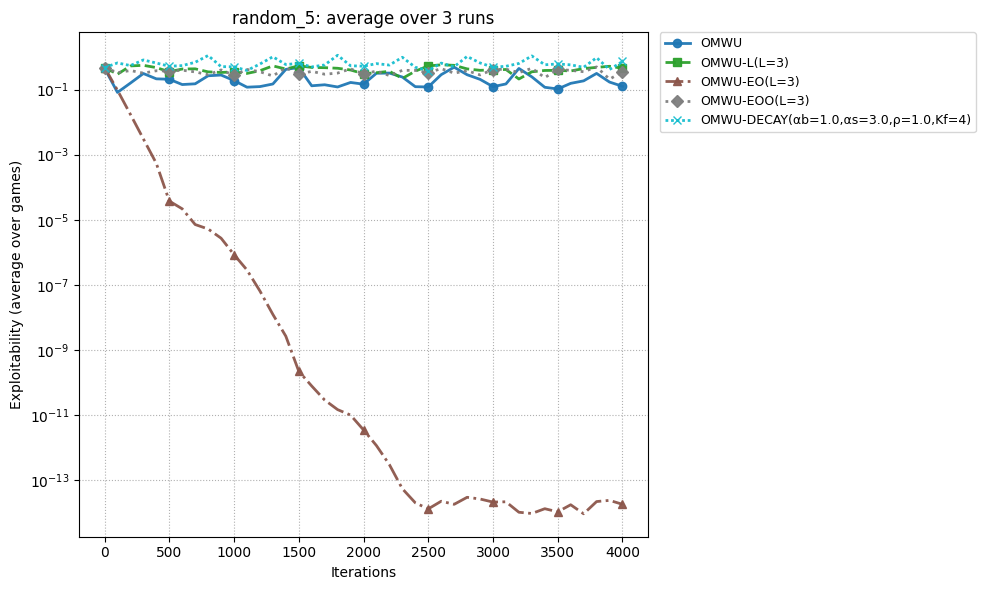

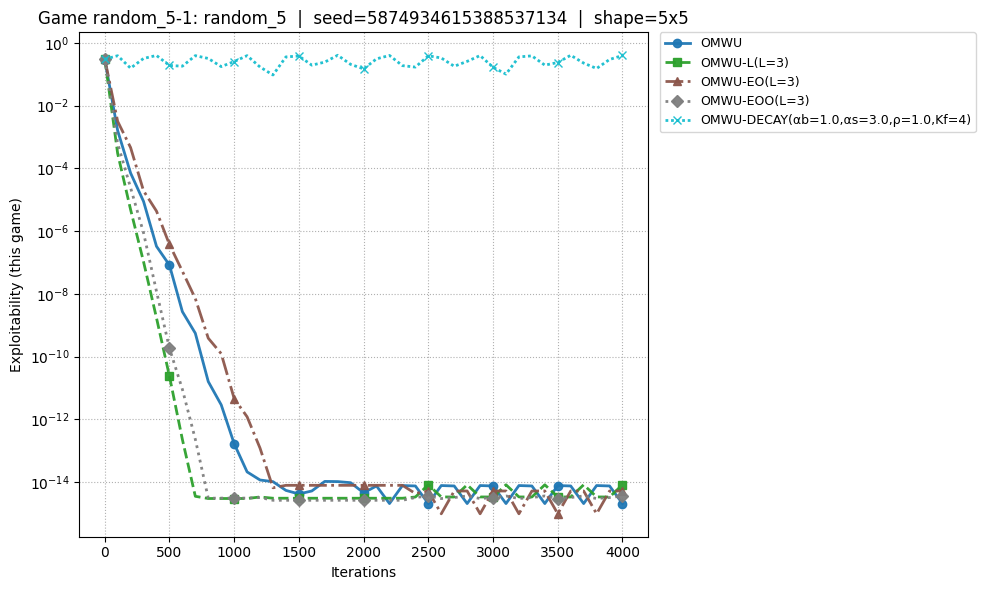

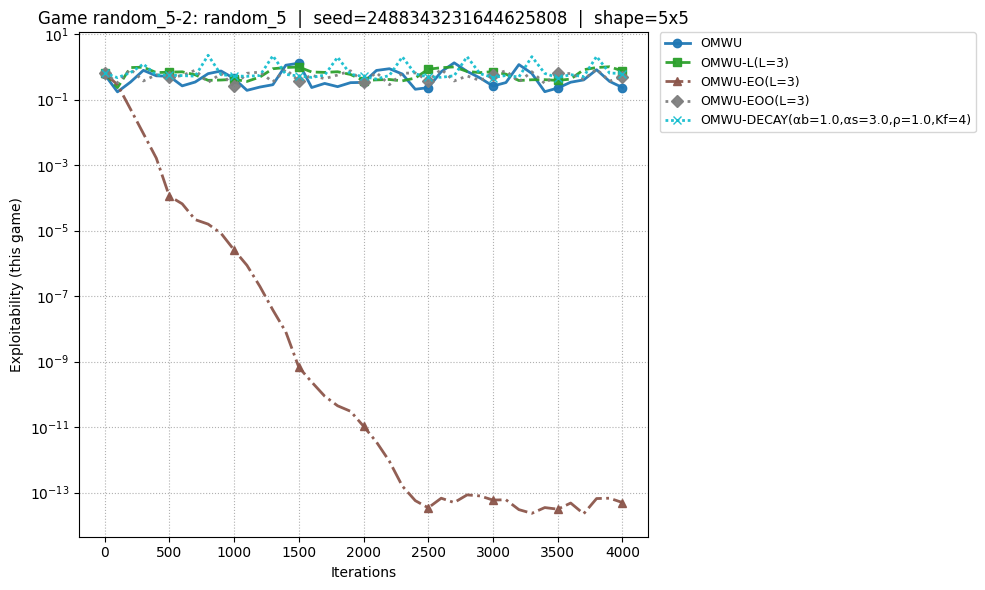

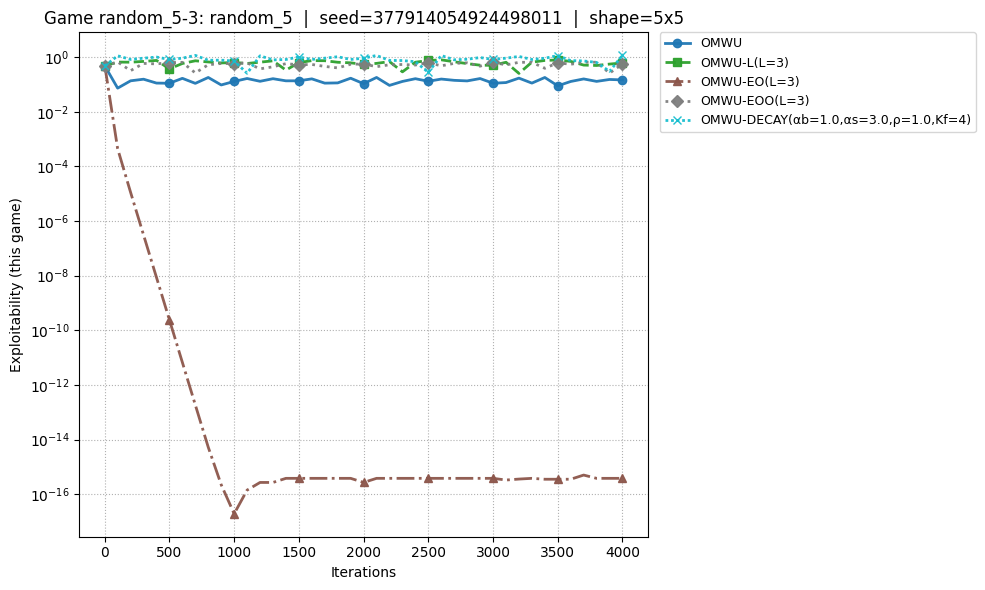

In [54]:
#!/usr/bin/env python3
"""
OMWU / L / EO / EOO / DECAY on five zero-sum game types.
- Per-variant hyperparameters (η, L, α_b, α_s, ρ, K_f) are independently configurable.
- Prints progress (with seeds), per-game plots, and an aggregate plot.
- Distinct color+linestyle per variant, consistent across figures.

Game types included:
  1) biased_rps_3    (3x3 biased Rock–Paper–Scissors)
  2) rpsls_5         (5x5 Rock–Paper–Scissors–Lizard–Spock ; non-vanilla RPS)
  3) cyclic_5        (5x5 cyclic / Shapley-style)
  4) lowrank_5       (5x5 low-rank, structured)
  5) random_5        (5x5 Gaussian random)

Row payoff = A; Column payoff = -A.
"""

from __future__ import annotations
import numpy as np
import matplotlib.pyplot as plt
from dataclasses import dataclass, asdict
from typing import Dict, List, Tuple, Callable

# ========================= USER CONFIG (edit me) =========================

@dataclass
class GlobalConfig:
    # how many different instances (seeds) per game type
    n_games_per_type: int = 3
    # iterations per run
    T: int = 4001
    # logging / sampling
    print_every: int = 500
    plot_every: int = 100
    # master RNG seed
    seed: int = 0
    # numeric dtype
    dtype: str = "float64"  # "float64" or "longdouble"

GC = GlobalConfig()

# Per-variant independent hyperparameters.
# You can change η for each variant separately and (where applicable) L, α_b, α_s, ρ, K_f.
VARIANT_CFG = {
    "OMWU":        {"eta": 0.7},
    "OMWU-L":      {"eta": 0.3, "L": 3},
    "OMWU-EO":     {"eta": 0.3, "L": 3},
    "OMWU-EOO":    {"eta": 0.3, "L": 3},
    "OMWU-DECAY":  {"eta": 0.3, "alpha_b": 1.0, "alpha_s": 3.0, "rho": 1.0, "Kf": 4},
}

# Which game types to run (from the five defined below)
GAME_TYPES = ["random_5"] #["biased_rps_3"] #, "rpsls_5", "cyclic_5", "lowrank_5", "random_5"]

# ========================================================================


# ============================ numerics helpers ===========================

def get_dtype(name: str):
    if name == "float64":
        return np.float64
    elif name == "longdouble":
        return np.longdouble
    raise ValueError("dtype must be 'float64' or 'longdouble'")

def softmax(b: np.ndarray) -> np.ndarray:
    z = b - np.max(b)
    e = np.exp(z)
    s = e / np.sum(e)
    return s

def row_grad(A: np.ndarray, y: np.ndarray) -> np.ndarray:
    return A @ y

def col_grad(A: np.ndarray, x: np.ndarray) -> np.ndarray:
    return -(A.T @ x)

def best_response_value_row(A: np.ndarray, y: np.ndarray) -> float:
    return float(np.max(A @ y))

def best_response_value_col(A: np.ndarray, x: np.ndarray) -> float:
    return float(np.max(-(A.T @ x)))

def nashconv_and_exploit(A: np.ndarray, x: np.ndarray, y: np.ndarray) -> Tuple[float, float]:
    ev_row = float(x @ (A @ y))
    br_row = best_response_value_row(A, y)
    br_col = best_response_value_col(A, x)
    nconv = (br_row - ev_row) + (br_col + ev_row)
    exploit = 0.5 * nconv
    return nconv, exploit


# ================================ agents =================================

class AgentBase:
    def __init__(self, n: int, eta: float, label: str, DTYPE):
        self.n = n
        self.eta = float(eta)
        self.label = label
        self.DTYPE = DTYPE
        self.b = np.zeros(n, dtype=DTYPE)
        self.x = softmax(self.b)
        self.g_prev = np.zeros(n, dtype=DTYPE)
        self.t = 0
        # a general gradient history (most recent at end); we use helpers to fetch safely
        self._g_hist: List[np.ndarray] = []

    def next_strategy(self) -> np.ndarray:
        return self.x

    def _push_g(self, g: np.ndarray):
        self._g_hist.append(g.copy())

    def _get_g(self, t_idx_from_1: int) -> np.ndarray:
        # t_idx_from_1==len(_g_hist) → last
        if t_idx_from_1 <= 0 or t_idx_from_1 > len(self._g_hist):
            return np.zeros(self.n, dtype=self.DTYPE)
        return self._g_hist[t_idx_from_1 - 1]

    def observe_gradient(self, g_t: np.ndarray):
        raise NotImplementedError


# ------------------------------ OMWU --------------------------------------

class OMWU(AgentBase):
    def __init__(self, n: int, eta: float, DTYPE):
        super().__init__(n, eta, "OMWU", DTYPE)
    def observe_gradient(self, g_t: np.ndarray):
        self.t += 1
        d_t = 2.0 * g_t - self.g_prev
        self.b += self.DTYPE(self.eta) * d_t
        self.x = softmax(self.b)
        self.g_prev = g_t.copy()
        self._push_g(g_t)


# ------------------------------ OMWU-L ------------------------------------

class OMWU_L(AgentBase):
    def __init__(self, n: int, eta: float, L: int, DTYPE):
        super().__init__(n, eta, f"OMWU-L(L={L})", DTYPE)
        self.L = int(L)
        self._histL: List[np.ndarray] = []
        self._sumL = np.zeros(n, dtype=DTYPE)
    def observe_gradient(self, g_t: np.ndarray):
        self.t += 1
        base = (self.DTYPE(self.L) + 1.0) * g_t - self._sumL
        d_t = base
        # update window sums after using
        self._histL.insert(0, g_t.copy())
        self._sumL += g_t
        if len(self._histL) > self.L:
            old = self._histL.pop()
            self._sumL -= old
        self.b += self.DTYPE(self.eta) * d_t
        self.x = softmax(self.b)
        self.g_prev = g_t.copy()
        self._push_g(g_t)


# ------------------------------ OMWU-EO -----------------------------------

class OMWU_EO(AgentBase):
    def __init__(self, n: int, eta: float, L: int, DTYPE):
        super().__init__(n, eta, f"OMWU-EO(L={L})", DTYPE)
        self.L = int(L)
    def observe_gradient(self, g_t: np.ndarray):
        self.t += 1
        d_t = (self.DTYPE(self.L) + 1.0) * g_t - (self.DTYPE(self.L) * self.g_prev)
        self.b += self.DTYPE(self.eta) * d_t
        self.x = softmax(self.b)
        self.g_prev = g_t.copy()
        self._push_g(g_t)


# ------------------------------ OMWU-EOO ----------------------------------

class OMWU_EOO(AgentBase):
    def __init__(self, n: int, eta: float, L: int, DTYPE):
        super().__init__(n, eta, f"OMWU-EOO(L={L})", DTYPE)
        self.L = int(L)
        self.pending = np.zeros(n, dtype=DTYPE)
    def observe_gradient(self, g_t: np.ndarray):
        self.t += 1
        d_t = (self.DTYPE(self.L) + 1.0) * g_t - self.g_prev - self.pending
        self.b += self.DTYPE(self.eta) * d_t
        self.x = softmax(self.b)
        new_pending = max(self.L - 1, 0) * self.g_prev
        self.g_prev = g_t.copy()
        self.pending = new_pending
        self._push_g(g_t)


# ------------------------------ OMWU-DECAY --------------------------------

class OMWU_DECAY(AgentBase):
    """
    d_t = α_b g_t − (α_b−1) g_{t−1} + sum_{j=0}^{Kf−1} α_s ρ^j (g_{t−j} − g_{t−j−1})
    g_{t-k} := 0 if missing.
    """
    def __init__(self, n: int, eta: float, alpha_b: float, alpha_s: float, rho: float, Kf: int, DTYPE):
        label = f"OMWU-DECAY(αb={alpha_b},αs={alpha_s},ρ={rho},Kf={Kf})"
        super().__init__(n, eta, label, DTYPE)
        self.alpha_b = DTYPE(alpha_b)
        self.alpha_s = DTYPE(alpha_s)
        self.rho = DTYPE(rho)
        self.Kf = int(Kf)

    def _finite_diff_tail(self, g_t: np.ndarray) -> np.ndarray:
        if self.Kf <= 0:
            return np.zeros_like(g_t)
        tail = np.zeros_like(g_t)
        zeros = np.zeros_like(g_t)
        # history indices: current step has index self.t after we increment in observe_gradient
        for j in range(self.Kf):
            g_tj  = g_t if j == 0 else (self._get_g(self.t - j) if (self.t - j) >= 1 else zeros)
            g_tjm1 = self._get_g(self.t - j - 1) if (self.t - j - 1) >= 1 else zeros
            tail += (self.alpha_s * (self.rho ** j)) * (g_tj - g_tjm1)
        return tail

    def observe_gradient(self, g_t: np.ndarray):
        self.t += 1
        base = self.alpha_b * g_t - (self.alpha_b - 1.0) * self.g_prev
        tail = self._finite_diff_tail(g_t)
        d_t = base + tail
        self.b += self.DTYPE(self.eta) * d_t
        self.x = softmax(self.b)
        self.g_prev = g_t.copy()
        self._push_g(g_t)


# ============================== game zoo =================================

def make_biased_rps_3(delta: float = 0.2) -> np.ndarray:
    """
    3x3 biased RPS: base antisymmetric, one edge boosted by (1+delta).
      R beats S: +1
      P beats R: +1
      S beats P: +(1+delta)  <-- bias
    """
    A = np.array([[0.0, -1.0, +1.0],
                  [+1.0, 0.0, -(1.0 + delta)],
                  [-(1.0), +(1.0 + delta), 0.0]], dtype=float)
    return A

def make_rpsls_5() -> np.ndarray:
    """
    5x5 Rock–Paper–Scissors–Lizard–Spock (non-vanilla RPS), antisymmetric with +1/-1 outcomes.
    Order: 0=Rock,1=Paper,2=Scissors,3=Lizard,4=Spock
    Edges (winner→loser): R>S,L ; P>R,Sp ; S>P,L ; L>Sp,P ; Sp>S,R
    """
    n = 5
    A = np.zeros((n, n), dtype=float)
    wins = [(0,2),(0,3),(1,0),(1,4),(2,1),(2,3),(3,4),(3,1),(4,2),(4,0)]
    for i,j in wins:
        A[i,j] = +1.0
        A[j,i] = -1.0
    return A

def make_cyclic_5(strength: float = 1.0) -> np.ndarray:
    """
    5x5 cyclic (Shapley-style): i beats (i+1) mod 5 by +strength, loses to (i-1) by -strength.
    Others 0. Antisymmetric band matrix.
    """
    n = 5
    A = np.zeros((n, n), dtype=float)
    for i in range(n):
        A[i, (i+1) % n] = +strength
        A[(i+1) % n, i] = -strength
    return A

def make_lowrank_5(rank: int = 2, scale: float = 1.0, rng=None) -> np.ndarray:
    """
    5x5 low-rank (U V^T), then antisymmetrized to ensure zero-sum skew part dominates.
    """
    if rng is None:
        rng = np.random.default_rng()
    U = rng.normal(0.0, scale, size=(5, rank))
    V = rng.normal(0.0, scale, size=(5, rank))
    M = U @ V.T
    A = (M - M.T) / 2.0  # antisymmetric part
    return A

def make_random_5(scale: float = 1.0, rng=None) -> np.ndarray:
    if rng is None:
        rng = np.random.default_rng()
    A = rng.normal(0.0, scale, size=(5, 5))
    return A

def gen_game(game_type: str, rng: np.random.Generator) -> np.ndarray:
    if game_type == "biased_rps_3":
        return make_biased_rps_3(delta=0.2)
    elif game_type == "rpsls_5":
        return make_rpsls_5()
    elif game_type == "cyclic_5":
        return make_cyclic_5(strength=1.0)
    elif game_type == "lowrank_5":
        return make_lowrank_5(rank=2, scale=1.0, rng=rng)
    elif game_type == "random_5":
        return make_random_5(scale=1.0, rng=rng)
    else:
        raise ValueError(f"Unknown game_type: {game_type}")


# ============================ experiment core =============================

def sampling_times(T: int, plot_every: int) -> List[int]:
    return [1] + list(range(plot_every, T + 1, plot_every))

def make_agents(n: int, DTYPE, variant_cfg: Dict[str, Dict]) -> Dict[str, Tuple[AgentBase, AgentBase]]:
    # Build symmetrical row/col agent pairs for each variant, with its own hyperparams
    agents: Dict[str, Tuple[AgentBase, AgentBase]] = {}

    # OMWU
    p = variant_cfg["OMWU"]
    agents["OMWU"] = (OMWU(n, p["eta"], DTYPE), OMWU(n, p["eta"], DTYPE))

    # OMWU-L
    p = variant_cfg["OMWU-L"]
    agents[f"OMWU-L(L={p['L']})"] = (OMWU_L(n, p["eta"], p["L"], DTYPE), OMWU_L(n, p["eta"], p["L"], DTYPE))

    # OMWU-EO
    p = variant_cfg["OMWU-EO"]
    agents[f"OMWU-EO(L={p['L']})"] = (OMWU_EO(n, p["eta"], p["L"], DTYPE), OMWU_EO(n, p["eta"], p["L"], DTYPE))

    # OMWU-EOO
    p = variant_cfg["OMWU-EOO"]
    agents[f"OMWU-EOO(L={p['L']})"] = (OMWU_EOO(n, p["eta"], p["L"], DTYPE), OMWU_EOO(n, p["eta"], p["L"], DTYPE))

    # OMWU-DECAY
    p = variant_cfg["OMWU-DECAY"]
    lab = f"OMWU-DECAY(αb={p['alpha_b']},αs={p['alpha_s']},ρ={p['rho']},Kf={p['Kf']})"
    agents[lab] = (
        OMWU_DECAY(n, p["eta"], p["alpha_b"], p["alpha_s"], p["rho"], p["Kf"], DTYPE),
        OMWU_DECAY(n, p["eta"], p["alpha_b"], p["alpha_s"], p["rho"], p["Kf"], DTYPE),
    )

    return agents

def run_one_game(A: np.ndarray, T: int, plot_every: int, print_every: int, agents: Dict[str, Tuple[AgentBase, AgentBase]]):
    times = sampling_times(T, plot_every)
    records = {lbl: {"times": [], "exploit": []} for lbl in agents}

    for t in range(1, T + 1):
        for lbl, (row, col) in agents.items():
            x = row.next_strategy()
            y = col.next_strategy()
            g_row = row_grad(A, y)
            g_col = col_grad(A, x)
            row.observe_gradient(g_row)
            col.observe_gradient(g_col)

        if t == 1 or (t % plot_every) == 0:
            for lbl, (row, col) in agents.items():
                x2 = row.next_strategy()
                y2 = col.next_strategy()
                _, ex = nashconv_and_exploit(A, x2, y2)
                records[lbl]["times"].append(t)
                records[lbl]["exploit"].append(ex)

        if t == 1 or (t % print_every) == 0:
            msg = [f"t={t:6d}"]
            for lbl in agents:
                ex = records[lbl]["exploit"][-1] if records[lbl]["exploit"] else float('nan')
                msg.append(f"{lbl}: ex={ex:.3e}")
            print("[progress]", "  ".join(msg))

    # align lengths (safety)
    Tref = len(times)
    for lbl in records:
        if len(records[lbl]["times"]) != Tref:
            m = min(len(records[lbl]["times"]), len(records[lbl]["exploit"]), Tref)
            records[lbl]["times"] = records[lbl]["times"][:m]
            records[lbl]["exploit"] = records[lbl]["exploit"][:m]
    return times, records


# =============================== plotting =================================

def make_style_map(labels: List[str]):
    # 5 variants → tab10 gives distinct colors; rotate linestyles to be extra clear
    import matplotlib.cm as cm
    cmap = cm.get_cmap('tab10', len(labels))
    linestyles = ['-', '--', '-.', ':', (0, (1, 1))]
    markers = ['o', 's', '^', 'D', 'x']
    style_map = {}
    for i, lbl in enumerate(labels):
        style_map[lbl] = dict(color=cmap(i), linestyle=linestyles[i % len(linestyles)],
                              linewidth=2.0, alpha=0.95, marker=markers[i % len(markers)],
                              markevery=5)
    return style_map

def plot_aggregate(all_runs: List[Tuple[List[int], Dict[str, Dict[str, List[float]]]]], style_map, title: str):
    labels = list(all_runs[0][1].keys())
    times = np.array(all_runs[0][0], dtype=float)
    agg_mean = {lbl: [] for lbl in labels}

    for lbl in labels:
        mat = []
        for _, rec in all_runs:
            ys = np.array(rec[lbl]["exploit"], dtype=float)
            m = min(len(ys), len(times))
            mat.append(ys[:m])
        M = np.vstack(mat)
        agg_mean[lbl] = M.mean(axis=0)

    plt.figure(figsize=(10, 6))
    for lbl in labels:
        ys = np.array(agg_mean[lbl], dtype=float)
        plt.plot(times[:len(ys)], ys, label=lbl, **style_map[lbl])
    plt.yscale("log")
    plt.xlabel("Iterations"); plt.ylabel("Exploitability (average over games)")
    plt.title(title)
    plt.grid(True, which="both", ls=":")
    plt.legend(fontsize=9, ncol=1, bbox_to_anchor=(1.02, 1), loc="upper left", borderaxespad=0.)
    plt.tight_layout()
    plt.show()

def plot_per_game(per_game_runs, style_map):
    for (idx, game_type, seed, times, records, A) in per_game_runs:
        plt.figure(figsize=(10, 6))
        for lbl, rec in records.items():
            xs = np.array(rec["times"], dtype=float)
            ys = np.array(rec["exploit"], dtype=float)
            plt.plot(xs, ys, label=lbl, **style_map[lbl])
        plt.yscale("log")
        plt.xlabel("Iterations"); plt.ylabel("Exploitability (this game)")
        plt.title(f"Game {idx}: {game_type}  |  seed={seed}  |  shape={A.shape[0]}x{A.shape[1]}")
        plt.grid(True, which="both", ls=":")
        plt.legend(fontsize=9, ncol=1, bbox_to_anchor=(1.02, 1), loc="upper left", borderaxespad=0.)
        plt.tight_layout()
        plt.show()


# ================================= main ===================================

def main():
    print("GlobalConfig:", asdict(GC))
    print("VariantConfig:", VARIANT_CFG)

    DTYPE = get_dtype(GC.dtype)
    base_rng = np.random.default_rng(GC.seed)

    all_runs: List[Tuple[List[int], Dict[str, Dict[str, List[float]]]]] = []
    per_game_runs = []

    all_labels = None  # capture once for consistent styling
    for gtype in GAME_TYPES:
        for j in range(1, GC.n_games_per_type + 1):
            game_seed = int(base_rng.integers(0, 2**63 - 1))
            rng = np.random.default_rng(game_seed)
            A = gen_game(gtype, rng)
            n = A.shape[0]

            # build fresh agents for this game (per-variant settings)
            agents = make_agents(n, DTYPE, VARIANT_CFG)

            # record labels (same across runs)
            if all_labels is None:
                all_labels = list(agents.keys())

            print(f"\n=== {gtype}  |  game {j}/{GC.n_games_per_type}  |  seed={game_seed}  |  n={n} ===")
            times, records = run_one_game(A, GC.T, GC.plot_every, GC.print_every, agents)
            all_runs.append((times, records))
            per_game_runs.append((f"{gtype}-{j}", gtype, game_seed, times, records, A))

    # Consistent styling across all figs
    style_map = make_style_map(all_labels)

    # Aggregate plot per game type (avg over its runs)
    # Group runs by game type
    from collections import defaultdict
    grouped: Dict[str, List[Tuple[List[int], Dict[str, Dict[str, List[float]]]]]] = defaultdict(list)
    for (idx, gtype, seed, times, records, A) in per_game_runs:
        grouped[gtype].append((times, records))

    for gtype, runs in grouped.items():
        plot_aggregate(runs, style_map, title=f"{gtype}: average over {len(runs)} runs")

    # Per-game plots
    plot_per_game(per_game_runs, style_map)


if __name__ == "__main__":
    main()


In [55]:
##################################################
##################################################

Config: {'T': 12000, 'print_every': 500, 'plot_every': 100, 'seed': 0, 'dtype': 'float64', 'n': 5, 'random_scale': 1.0}
Variant hyperparameters: {'OMWU': {'eta': 1.0}, 'OMWU-EO': {'eta': 0.5, 'L': 3}, 'OMWU-EOO': {'eta': 0.1, 'L': 5}, 'OMWU-L': {'eta': 0.1, 'L': 5}, 'OMWU-DECAY': {'eta': 0.1, 'alpha_b': 1.0, 'alpha_s': 4.0, 'rho': 1.0, 'Kf': 5}}
[info] Single random game generated  |  seed=0  |  shape=(5, 5)
[progress] t=     1  OMWU: ex=1.073e-01  OMWU-L(L=5): ex=2.260e-01  OMWU-EO(L=3): ex=1.073e-01  OMWU-EOO(L=5): ex=2.260e-01  OMWU-DECAY(αb=1.0,αs=4.0,ρ=1.0,Kf=5): ex=2.441e-01
[progress] t=   500  OMWU: ex=8.427e-03  OMWU-L(L=5): ex=1.137e-02  OMWU-EO(L=3): ex=1.018e-02  OMWU-EOO(L=5): ex=1.182e-02  OMWU-DECAY(αb=1.0,αs=4.0,ρ=1.0,Kf=5): ex=1.099e-02
[progress] t=  1000  OMWU: ex=6.292e-03  OMWU-L(L=5): ex=2.274e-02  OMWU-EO(L=3): ex=5.264e-03  OMWU-EOO(L=5): ex=2.595e-02  OMWU-DECAY(αb=1.0,αs=4.0,ρ=1.0,Kf=5): ex=1.998e-02
[progress] t=  1500  OMWU: ex=3.411e-03  OMWU-L(L=5): ex=6.2

/tmp/ipython-input-512593248.py:263: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('tab10', len(labels))


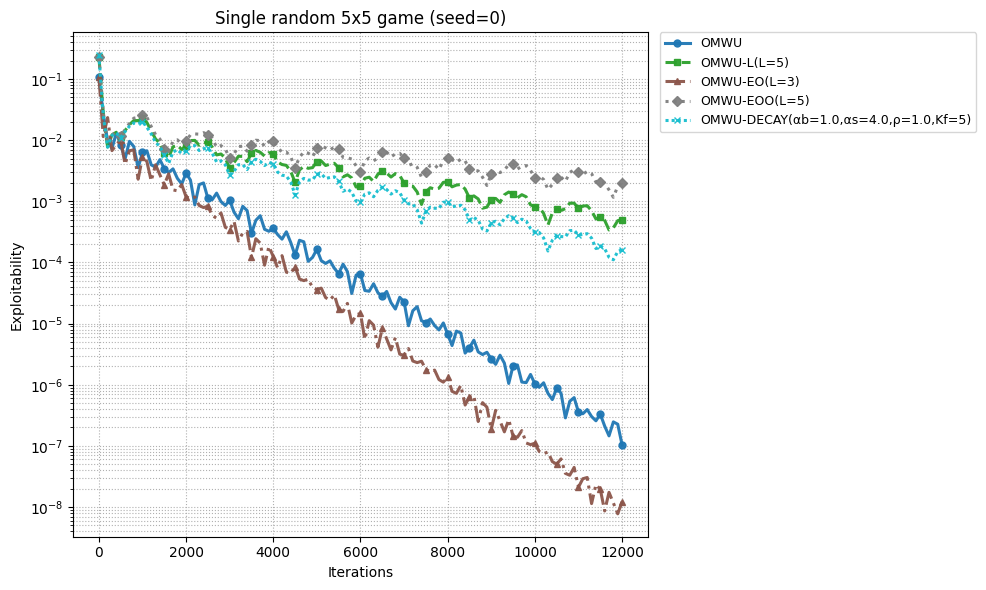

In [95]:
#!/usr/bin/env python3
"""
Single run on one random 5x5 zero-sum game:
  - Variants: OMWU, OMWU-L, OMWU-EO, OMWU-EOO, OMWU-DECAY
  - Independent hyperparameters per variant (eta, L, alpha_b, alpha_s, rho, Kf)
  - Progress printing + one plot at the end
"""

from __future__ import annotations
import numpy as np
import matplotlib.pyplot as plt
from dataclasses import dataclass, asdict
from typing import Dict, List, Tuple

# ========================= USER CONFIG (edit me) =========================

@dataclass
class Config:
    T: int = 12000               # iterations
    print_every: int = 500       # console progress
    plot_every: int = 100        # sampling for curves
    seed: int = 0                # RNG seed for the single random game
    dtype: str = "float64"       # "float64" or "longdouble"
    n: int = 5                   # game size (n x n)
    random_scale: float = 1.0    # std-dev for random payoff entries

CFG = Config()

# Per-variant independent hyperparameters
VARIANT_CFG = {
    "OMWU":        {"eta": 1.0}, # 1.05 breaks this
    # "OMWU-EO":     {"eta": 0.67, "L": 2}, # BEST 1.3333
    "OMWU-EO":     {"eta": 0.50, "L": 3},   # BEST 1.5
    # "OMWU-EO":     {"eta": 0.1, "L": 10},   #
    "OMWU-EOO":    {"eta": 0.10, "L": 5},
    "OMWU-L":      {"eta": 0.10, "L": 5},
    "OMWU-DECAY":  {"eta": 0.10, "alpha_b": 1.0, "alpha_s": 4.0, "rho": 1.0, "Kf": 5},
}

# ========================================================================

# ============================ numerics helpers ===========================

def get_dtype(name: str):
    if name == "float64":
        return np.float64
    elif name == "longdouble":
        return np.longdouble
    raise ValueError("dtype must be 'float64' or 'longdouble'")

def softmax(b: np.ndarray) -> np.ndarray:
    z = b - np.max(b)
    e = np.exp(z)
    return e / np.sum(e)

def row_grad(A: np.ndarray, y: np.ndarray) -> np.ndarray:
    return A @ y

def col_grad(A: np.ndarray, x: np.ndarray) -> np.ndarray:
    return -(A.T @ x)

def best_response_value_row(A: np.ndarray, y: np.ndarray) -> float:
    return float(np.max(A @ y))

def best_response_value_col(A: np.ndarray, x: np.ndarray) -> float:
    return float(np.max(-(A.T @ x)))

def nashconv_and_exploit(A: np.ndarray, x: np.ndarray, y: np.ndarray) -> Tuple[float, float]:
    ev_row = float(x @ (A @ y))
    br_row = best_response_value_row(A, y)
    br_col = best_response_value_col(A, x)
    nconv = (br_row - ev_row) + (br_col + ev_row)
    exploit = 0.5 * nconv
    return nconv, exploit

def sampling_times(T: int, plot_every: int) -> List[int]:
    return [1] + list(range(plot_every, T + 1, plot_every))

# ================================ agents =================================

class AgentBase:
    def __init__(self, n: int, eta: float, label: str, DTYPE):
        self.n = n
        self.eta = float(eta)
        self.label = label
        self.DTYPE = DTYPE
        self.b = np.zeros(n, dtype=DTYPE)
        self.x = softmax(self.b)
        self.g_prev = np.zeros(n, dtype=DTYPE)
        self.t = 0
        self._g_hist: List[np.ndarray] = []

    def next_strategy(self) -> np.ndarray:
        return self.x

    def _push_g(self, g: np.ndarray):
        self._g_hist.append(g.copy())

    def _get_g(self, idx_from_1: int) -> np.ndarray:
        if idx_from_1 <= 0 or idx_from_1 > len(self._g_hist):
            return np.zeros(self.n, dtype=self.DTYPE)
        return self._g_hist[idx_from_1 - 1]

    def observe_gradient(self, g_t: np.ndarray):
        raise NotImplementedError

# ------------------------------ OMWU --------------------------------------

class OMWU(AgentBase):
    def __init__(self, n: int, eta: float, DTYPE):
        super().__init__(n, eta, "OMWU", DTYPE)
    def observe_gradient(self, g_t: np.ndarray):
        self.t += 1
        d_t = 2.0 * g_t - self.g_prev
        self.b += self.DTYPE(self.eta) * d_t
        self.x = softmax(self.b)
        self.g_prev = g_t.copy()
        self._push_g(g_t)

# ------------------------------ OMWU-L ------------------------------------

class OMWU_L(AgentBase):
    def __init__(self, n: int, eta: float, L: int, DTYPE):
        super().__init__(n, eta, f"OMWU-L(L={L})", DTYPE)
        self.L = int(L)
        self._histL: List[np.ndarray] = []
        self._sumL = np.zeros(n, dtype=DTYPE)
    def observe_gradient(self, g_t: np.ndarray):
        self.t += 1
        base = (self.DTYPE(self.L) + 1.0) * g_t - self._sumL
        d_t = base
        # update window after using it
        self._histL.insert(0, g_t.copy()); self._sumL += g_t
        if len(self._histL) > self.L:
            old = self._histL.pop(); self._sumL -= old
        self.b += self.DTYPE(self.eta) * d_t
        self.x = softmax(self.b)
        self.g_prev = g_t.copy()
        self._push_g(g_t)

# ------------------------------ OMWU-EO -----------------------------------

class OMWU_EO(AgentBase):
    def __init__(self, n: int, eta: float, L: int, DTYPE):
        super().__init__(n, eta, f"OMWU-EO(L={L})", DTYPE)
        self.L = int(L)
    def observe_gradient(self, g_t: np.ndarray):
        self.t += 1
        d_t = (self.DTYPE(self.L) + 1.0) * g_t - (self.DTYPE(self.L) * self.g_prev)
        self.b += self.DTYPE(self.eta) * d_t
        self.x = softmax(self.b)
        self.g_prev = g_t.copy()
        self._push_g(g_t)

# ------------------------------ OMWU-EOO ----------------------------------

class OMWU_EOO(AgentBase):
    def __init__(self, n: int, eta: float, L: int, DTYPE):
        super().__init__(n, eta, f"OMWU-EOO(L={L})", DTYPE)
        self.L = int(L)
        self.pending = np.zeros(n, dtype=DTYPE)
    def observe_gradient(self, g_t: np.ndarray):
        self.t += 1
        d_t = (self.DTYPE(self.L) + 1.0) * g_t - self.g_prev - self.pending
        self.b += self.DTYPE(self.eta) * d_t
        self.x = softmax(self.b)
        new_pending = max(self.L - 1, 0) * self.g_prev
        self.g_prev = g_t.copy()
        self.pending = new_pending
        self._push_g(g_t)

# ------------------------------ OMWU-DECAY --------------------------------

class OMWU_DECAY(AgentBase):
    """
    d_t = α_b g_t − (α_b−1) g_{t−1} + sum_{j=0}^{Kf−1} α_s ρ^j (g_{t−j} − g_{t−j−1})
    g_{t-k} := 0 if missing.
    """
    def __init__(self, n: int, eta: float, alpha_b: float, alpha_s: float, rho: float, Kf: int, DTYPE):
        label = f"OMWU-DECAY(αb={alpha_b},αs={alpha_s},ρ={rho},Kf={Kf})"
        super().__init__(n, eta, label, DTYPE)
        self.alpha_b = DTYPE(alpha_b)
        self.alpha_s = DTYPE(alpha_s)
        self.rho = DTYPE(rho)
        self.Kf = int(Kf)

    def _finite_diff_tail(self, g_t: np.ndarray) -> np.ndarray:
        if self.Kf <= 0:
            return np.zeros_like(g_t)
        tail = np.zeros_like(g_t)
        zeros = np.zeros_like(g_t)
        for j in range(self.Kf):
            g_tj  = g_t if j == 0 else (self._get_g(self.t - j) if (self.t - j) >= 1 else zeros)
            g_tjm1 = self._get_g(self.t - j - 1) if (self.t - j - 1) >= 1 else zeros
            tail += (self.alpha_s * (self.rho ** j)) * (g_tj - g_tjm1)
        return tail

    def observe_gradient(self, g_t: np.ndarray):
        self.t += 1
        base = self.alpha_b * g_t - (self.alpha_b - 1.0) * self.g_prev
        tail = self._finite_diff_tail(g_t)
        d_t = base + tail
        self.b += self.DTYPE(self.eta) * d_t
        self.x = softmax(self.b)
        self.g_prev = g_t.copy()
        self._push_g(g_t)

# ============================== game maker ================================

def make_random_zero_sum(n: int, scale: float, rng: np.random.Generator) -> np.ndarray:
    """
    Single random zero-sum game for the row player:
      Row payoff = A; Column payoff = -A.
    """
    A = rng.normal(0.0, scale, size=(n, n))
    return A

# ============================ experiment core =============================

def run_one_game(A: np.ndarray, T: int, plot_every: int, print_every: int,
                 agents: Dict[str, Tuple[AgentBase, AgentBase]]):
    records = {lbl: {"times": [], "exploit": []} for lbl in agents}

    for t in range(1, T + 1):
        for lbl, (row, col) in agents.items():
            x = row.next_strategy()
            y = col.next_strategy()
            g_row = row_grad(A, y)
            g_col = col_grad(A, x)
            row.observe_gradient(g_row)
            col.observe_gradient(g_col)

        if t == 1 or (t % plot_every) == 0:
            for lbl, (row, col) in agents.items():
                x2 = row.next_strategy(); y2 = col.next_strategy()
                _, ex = nashconv_and_exploit(A, x2, y2)
                records[lbl]["times"].append(t)
                records[lbl]["exploit"].append(ex)

        if t == 1 or (t % print_every) == 0:
            msg = [f"t={t:6d}"]
            for lbl in agents:
                ex = records[lbl]["exploit"][-1] if records[lbl]["exploit"] else float('nan')
                msg.append(f"{lbl}: ex={ex:.3e}")
            print("[progress]", "  ".join(msg))

    # Length alignment (safety)
    t_ref = None
    for lbl in records:
        if t_ref is None:
            t_ref = len(records[lbl]["times"])
        else:
            m = min(t_ref, len(records[lbl]["times"]), len(records[lbl]["exploit"]))
            records[lbl]["times"] = records[lbl]["times"][:m]
            records[lbl]["exploit"] = records[lbl]["exploit"][:m]

    return records

# =============================== plotting =================================

def make_style_map(labels: List[str]):
    import matplotlib.cm as cm
    cmap = cm.get_cmap('tab10', len(labels))
    linestyles = ['-', '--', '-.', ':', (0, (1, 1))]
    markers = ['o', 's', '^', 'D', 'x']
    style_map = {}
    for i, lbl in enumerate(labels):
        style_map[lbl] = dict(color=cmap(i), linestyle=linestyles[i % len(linestyles)],
                              linewidth=2.2, alpha=0.95, marker=markers[i % len(markers)],
                              markevery=5, markersize=5)
    return style_map

def plot_single(records, title: str):
    labels = list(records.keys())
    style_map = make_style_map(labels)

    plt.figure(figsize=(10, 6))
    for lbl in labels:
        xs = np.array(records[lbl]["times"], dtype=float)
        ys = np.array(records[lbl]["exploit"], dtype=float)
        plt.plot(xs, ys, label=lbl, **style_map[lbl])
    plt.yscale("log")
    plt.xlabel("Iterations")
    plt.ylabel("Exploitability")
    plt.title(title)
    plt.grid(True, which="both", ls=":")
    plt.legend(fontsize=9, ncol=1, bbox_to_anchor=(1.02, 1), loc="upper left", borderaxespad=0.)
    plt.tight_layout()
    plt.show()

# ================================= main ===================================

def make_agents(n: int, DTYPE, cfg: Dict[str, Dict]) -> Dict[str, Tuple[AgentBase, AgentBase]]:
    agents: Dict[str, Tuple[AgentBase, AgentBase]] = {}

    # OMWU
    p = cfg["OMWU"]
    agents["OMWU"] = (OMWU(n, p["eta"], DTYPE), OMWU(n, p["eta"], DTYPE))

    # OMWU-L
    p = cfg["OMWU-L"]
    agents[f"OMWU-L(L={p['L']})"] = (OMWU_L(n, p["eta"], p["L"], DTYPE), OMWU_L(n, p["eta"], p["L"], DTYPE))

    # OMWU-EO
    p = cfg["OMWU-EO"]
    agents[f"OMWU-EO(L={p['L']})"] = (OMWU_EO(n, p["eta"], p["L"], DTYPE), OMWU_EO(n, p["eta"], p["L"], DTYPE))

    # OMWU-EOO
    p = cfg["OMWU-EOO"]
    agents[f"OMWU-EOO(L={p['L']})"] = (OMWU_EOO(n, p["eta"], p["L"], DTYPE), OMWU_EOO(n, p["eta"], p["L"], DTYPE))

    # OMWU-DECAY
    p = cfg["OMWU-DECAY"]
    lab = f"OMWU-DECAY(αb={p['alpha_b']},αs={p['alpha_s']},ρ={p['rho']},Kf={p['Kf']})"
    agents[lab] = (
        OMWU_DECAY(n, p["eta"], p["alpha_b"], p["alpha_s"], p["rho"], p["Kf"], DTYPE),
        OMWU_DECAY(n, p["eta"], p["alpha_b"], p["alpha_s"], p["rho"], p["Kf"], DTYPE),
    )
    return agents

def main():
    print("Config:", asdict(CFG))
    print("Variant hyperparameters:", VARIANT_CFG)
    DTYPE = get_dtype(CFG.dtype)
    rng = np.random.default_rng(CFG.seed)

    # Build one random game (row payoff A, col payoff -A)
    A = make_random_zero_sum(CFG.n, CFG.random_scale, rng)
    print(f"[info] Single random game generated  |  seed={CFG.seed}  |  shape={A.shape}")

    # Build agents (per-variant hyperparameters)
    agents = make_agents(CFG.n, DTYPE, VARIANT_CFG)

    # Run
    records = run_one_game(A, CFG.T, CFG.plot_every, CFG.print_every, agents)

    # Plot
    plot_single(records, title=f"Single random {CFG.n}x{CFG.n} game (seed={CFG.seed})")

if __name__ == "__main__":
    main()


In [96]:
#########################################
###########################################

Config: {'T': 20000, 'print_every': 500, 'plot_every': 10, 'seed': 53, 'dtype': 'float64', 'n': 8, 'random_scale': 1.0}
Variant hyperparameters: {'OMWU': {'eta': 1.0}, 'OMWU-L': {'eta': 0.51, 'L': 2}, 'OMWU-EO': {'eta': 0.67, 'alpha': 2.0}, 'OMWU-EOO': {'eta': 0.34, 'L': 3}, 'OMWU-DECAY': {'eta': 0.5, 'alpha_b': 1.0, 'alpha_s': 2.0, 'rho': 0.5, 'Kf': 2}}
[info] Single random game generated  |  seed=53  |  shape=(8, 8)
[progress] t=     1  OMWU: ex=3.654e-01  OMWU-L(L=2): ex=3.880e-01  OMWU-EO(α=2.0): ex=3.650e-01  OMWU-EOO(L=3): ex=3.979e-01  OMWU-DECAY(αb=1.0,αs=2.0,ρ=0.5,Kf=2): ex=3.897e-01
[progress] t=   500  OMWU: ex=8.198e-02  OMWU-L(L=2): ex=1.272e-01  OMWU-EO(α=2.0): ex=6.816e-02  OMWU-EOO(L=3): ex=1.602e-01  OMWU-DECAY(αb=1.0,αs=2.0,ρ=0.5,Kf=2): ex=1.028e-01
[progress] t=  1000  OMWU: ex=7.766e-02  OMWU-L(L=2): ex=1.621e-01  OMWU-EO(α=2.0): ex=8.853e-02  OMWU-EOO(L=3): ex=1.545e-01  OMWU-DECAY(αb=1.0,αs=2.0,ρ=0.5,Kf=2): ex=1.015e-01
[progress] t=  1500  OMWU: ex=5.968e-02  OMW

/tmp/ipython-input-2667240662.py:288: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('tab10', len(labels))


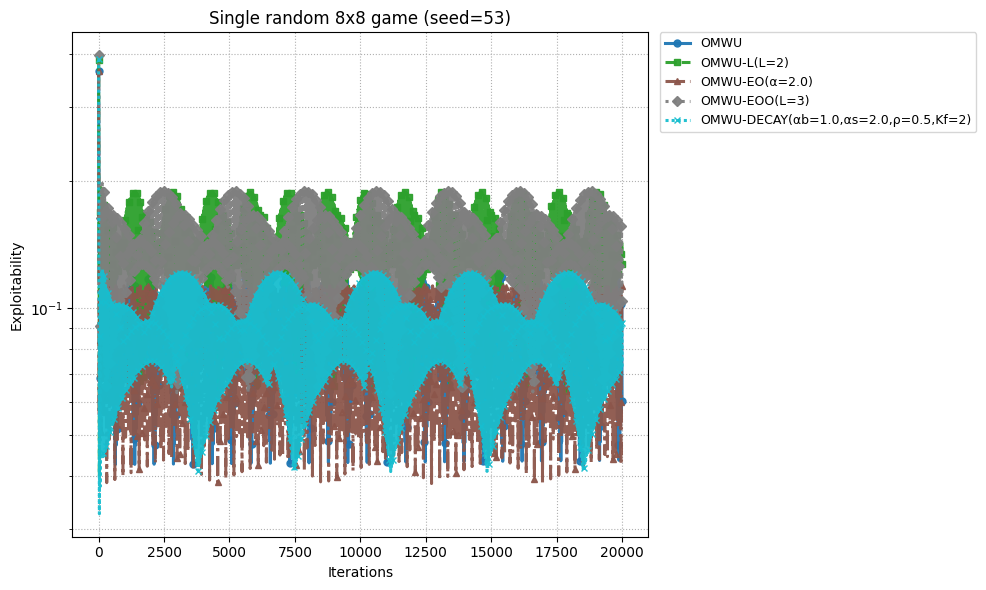

In [14]:
#!/usr/bin/env python3
"""
Single run on one random 5x5 zero-sum game:
  - Variants: OMWU, OMWU-L, OMWU-EO (now with fractional alpha), OMWU-EOO, OMWU-DECAY
  - Independent hyperparameters per variant (eta, L/alpha, alpha_b, alpha_s, rho, Kf)
  - Progress printing + one plot at the end
"""

from __future__ import annotations
import numpy as np
import matplotlib.pyplot as plt
from dataclasses import dataclass, asdict
from typing import Dict, List, Tuple

# ========================= USER CONFIG (edit me) =========================

# "OMWU-EO":     {"eta": 0.67, "L": 2}, # BEST 1.3333
    # "OMWU-EO":     {"eta": 0.50, "L": 3},   # BEST 1.5

@dataclass
class Config:
    T: int = 20000               # iterations
    print_every: int = 500       # console progress
    plot_every: int = 10        # sampling for curves
    seed: int = 53               # RNG seed for the single random game
    dtype: str = "float64"       # "float64" or "longdouble"
    n: int = 8                   # game size (n x n)
    random_scale: float = 1.0    # std-dev for random payoff entries

CFG = Config()

# Per-variant independent hyperparameters
# NOTE: OMWU-EO now supports fractional alpha via key "alpha".
#       If "alpha" is absent but "L" is present, we use alpha=float(L) for backward-compat.

# "OMWU-EO":     {"eta": 0.67, "L": 2}, # BEST 1.3333
# "OMWU-EO":     {"eta": 0.50, "L": 3},   # BEST 1.5
VARIANT_CFG = {
    "OMWU":        {"eta": 1.0},
    "OMWU-L":      {"eta": 0.51, "L": 2},
    # Examples for EO alpha:
    #   alpha=0.5 -> 1.5*g_t - 0.5*g_{t-1}
    #   alpha=1.2 -> 2.2*g_t - 1.2*g_{t-1}
    "OMWU-EO":     {"eta": 0.67, "alpha": 2.0}, # BEST
    # "OMWU-EOO":    {"eta": 0.51, "L": 2},
    "OMWU-EOO":    {"eta": 0.34, "L": 3},
    "OMWU-DECAY":  {"eta": 0.50, "alpha_b": 1.0, "alpha_s": 2.0, "rho": 0.5, "Kf": 2},
}

# ========================================================================

# ============================ numerics helpers ===========================

def get_dtype(name: str):
    if name == "float64":
        return np.float64
    elif name == "longdouble":
        return np.longdouble
    raise ValueError("dtype must be 'float64' or 'longdouble'")

def softmax(b: np.ndarray) -> np.ndarray:
    z = b - np.max(b)
    e = np.exp(z)
    return e / np.sum(e)

def row_grad(A: np.ndarray, y: np.ndarray) -> np.ndarray:
    return A @ y

def col_grad(A: np.ndarray, x: np.ndarray) -> np.ndarray:
    return -(A.T @ x)

def best_response_value_row(A: np.ndarray, y: np.ndarray) -> float:
    return float(np.max(A @ y))

def best_response_value_col(A: np.ndarray, x: np.ndarray) -> float:
    return float(np.max(-(A.T @ x)))

def nashconv_and_exploit(A: np.ndarray, x: np.ndarray, y: np.ndarray) -> Tuple[float, float]:
    ev_row = float(x @ (A @ y))
    br_row = best_response_value_row(A, y)
    br_col = best_response_value_col(A, x)
    nconv = (br_row - ev_row) + (br_col + ev_row)
    exploit = 0.5 * nconv
    return nconv, exploit

def sampling_times(T: int, plot_every: int) -> List[int]:
    return [1] + list(range(plot_every, T + 1, plot_every))

# ================================ agents =================================

class AgentBase:
    def __init__(self, n: int, eta: float, label: str, DTYPE):
        self.n = n
        self.eta = float(eta)
        self.label = label
        self.DTYPE = DTYPE
        self.b = np.zeros(n, dtype=DTYPE)
        self.x = softmax(self.b)
        self.g_prev = np.zeros(n, dtype=DTYPE)
        self.t = 0
        self._g_hist: List[np.ndarray] = []

    def next_strategy(self) -> np.ndarray:
        return self.x

    def _push_g(self, g: np.ndarray):
        self._g_hist.append(g.copy())

    def _get_g(self, idx_from_1: int) -> np.ndarray:
        if idx_from_1 <= 0 or idx_from_1 > len(self._g_hist):
            return np.zeros(self.n, dtype=self.DTYPE)
        return self._g_hist[idx_from_1 - 1]

    def observe_gradient(self, g_t: np.ndarray):
        raise NotImplementedError

# ------------------------------ OMWU --------------------------------------

class OMWU(AgentBase):
    def __init__(self, n: int, eta: float, DTYPE):
        super().__init__(n, eta, "OMWU", DTYPE)
    def observe_gradient(self, g_t: np.ndarray):
        self.t += 1
        d_t = 2.0 * g_t - self.g_prev
        self.b += self.DTYPE(self.eta) * d_t
        self.x = softmax(self.b)
        self.g_prev = g_t.copy()
        self._push_g(g_t)

# ------------------------------ OMWU-L ------------------------------------

class OMWU_L(AgentBase):
    def __init__(self, n: int, eta: float, L: int, DTYPE):
        super().__init__(n, eta, f"OMWU-L(L={L})", DTYPE)
        self.L = int(L)
        self._histL: List[np.ndarray] = []
        self._sumL = np.zeros(n, dtype=DTYPE)
    def observe_gradient(self, g_t: np.ndarray):
        self.t += 1
        base = (self.DTYPE(self.L) + 1.0) * g_t - self._sumL
        d_t = base
        # update window after using it
        self._histL.insert(0, g_t.copy()); self._sumL += g_t
        if len(self._histL) > self.L:
            old = self._histL.pop(); self._sumL -= old
        self.b += self.DTYPE(self.eta) * d_t
        self.x = softmax(self.b)
        self.g_prev = g_t.copy()
        self._push_g(g_t)

# ------------------------------ OMWU-EO (fractional alpha) ----------------

class OMWU_EO(AgentBase):
    """
    EO with fractional alpha:
      d_t = (1 + alpha) * g_t - alpha * g_{t-1}
           = 1 * g_t + alpha * (g_t - g_{t-1})
    If 'alpha' not provided, but 'L' is, uses alpha = float(L) (backward compatible).
    """
    def __init__(self, n: int, eta: float, alpha: float | None = None, L: int | None = None, DTYPE=None):
        # Resolve alpha (fractional allowed). If only L given, alpha = float(L).
        if alpha is None and L is None:
            raise ValueError("OMWU_EO requires 'alpha' (float) or 'L' (int/float).")
        if alpha is None:
            alpha = float(L)
        self.alpha = float(alpha)
        label = f"OMWU-EO(α={self.alpha})" if (alpha is not None) else f"OMWU-EO(L={L})"
        super().__init__(n, eta, label, DTYPE)

    def observe_gradient(self, g_t: np.ndarray):
        self.t += 1
        a = self.DTYPE(self.alpha)
        d_t = (a + 1.0) * g_t - a * self.g_prev
        self.b += self.DTYPE(self.eta) * d_t
        self.x = softmax(self.b)
        self.g_prev = g_t.copy()
        self._push_g(g_t)

# ------------------------------ OMWU-EOO ----------------------------------

class OMWU_EOO(AgentBase):
    def __init__(self, n: int, eta: float, L: int, DTYPE):
        super().__init__(n, eta, f"OMWU-EOO(L={L})", DTYPE)
        self.L = int(L)
        self.pending = np.zeros(n, dtype=DTYPE)
    def observe_gradient(self, g_t: np.ndarray):
        self.t += 1
        d_t = (self.DTYPE(self.L) + 1.0) * g_t - self.g_prev - self.pending
        self.b += self.DTYPE(self.eta) * d_t
        self.x = softmax(self.b)
        new_pending = max(self.L - 1, 0) * self.g_prev
        self.g_prev = g_t.copy()
        self.pending = new_pending
        self._push_g(g_t)

# ------------------------------ OMWU-DECAY --------------------------------

class OMWU_DECAY(AgentBase):
    """
    d_t = α_b g_t − (α_b−1) g_{t−1} + sum_{j=0}^{Kf−1} α_s ρ^j (g_{t−j} − g_{t−j−1})
    g_{t-k} := 0 if missing.
    """
    def __init__(self, n: int, eta: float, alpha_b: float, alpha_s: float, rho: float, Kf: int, DTYPE):
        label = f"OMWU-DECAY(αb={alpha_b},αs={alpha_s},ρ={rho},Kf={Kf})"
        super().__init__(n, eta, label, DTYPE)
        self.alpha_b = DTYPE(alpha_b)
        self.alpha_s = DTYPE(alpha_s)
        self.rho = DTYPE(rho)
        self.Kf = int(Kf)

    def _finite_diff_tail(self, g_t: np.ndarray) -> np.ndarray:
        if self.Kf <= 0:
            return np.zeros_like(g_t)
        tail = np.zeros_like(g_t)
        zeros = np.zeros_like(g_t)
        for j in range(self.Kf):
            g_tj  = g_t if j == 0 else (self._get_g(self.t - j) if (self.t - j) >= 1 else zeros)
            g_tjm1 = self._get_g(self.t - j - 1) if (self.t - j - 1) >= 1 else zeros
            tail += (self.alpha_s * (self.rho ** j)) * (g_tj - g_tjm1)
        return tail

    def observe_gradient(self, g_t: np.ndarray):
        self.t += 1
        base = self.alpha_b * g_t - (self.alpha_b - 1.0) * self.g_prev
        tail = self._finite_diff_tail(g_t)
        d_t = base + tail
        self.b += self.DTYPE(self.eta) * d_t
        self.x = softmax(self.b)
        self.g_prev = g_t.copy()
        self._push_g(g_t)

# ============================== game maker ================================

def make_random_zero_sum(n: int, scale: float, rng: np.random.Generator) -> np.ndarray:
    """
    Single random zero-sum game for the row player:
      Row payoff = A; Column payoff = -A.
    """
    # A = rng.random(size=(n, n)) * scale # Changed from rng.normal
    A = rng.normal(0.0, scale, size=(n, n))
    return A

# ============================ experiment core =============================

def run_one_game(A: np.ndarray, T: int, plot_every: int, print_every: int,
                 agents: Dict[str, Tuple[AgentBase, AgentBase]]):
    records = {lbl: {"times": [], "exploit": []} for lbl in agents}

    for t in range(1, T + 1):
        for lbl, (row, col) in agents.items():
            x = row.next_strategy()
            y = col.next_strategy()
            g_row = row_grad(A, y)
            g_col = col_grad(A, x)
            row.observe_gradient(g_row)
            col.observe_gradient(g_col)

        if t == 1 or (t % plot_every) == 0:
            for lbl, (row, col) in agents.items():
                x2 = row.next_strategy(); y2 = col.next_strategy()
                _, ex = nashconv_and_exploit(A, x2, y2)
                records[lbl]["times"].append(t)
                records[lbl]["exploit"].append(ex)

        if t == 1 or (t % print_every) == 0:
            msg = [f"t={t:6d}"]
            for lbl in agents:
                ex = records[lbl]["exploit"][-1] if records[lbl]["exploit"] else float('nan')
                msg.append(f"{lbl}: ex={ex:.3e}")
            print("[progress]", "  ".join(msg))

    # Length alignment (safety)
    t_ref = None
    for lbl in records:
        if t_ref is None:
            t_ref = len(records[lbl]["times"])
        else:
            m = min(t_ref, len(records[lbl]["times"]), len(records[lbl]["exploit"]))
            records[lbl]["times"] = records[lbl]["times"][:m]
            records[lbl]["exploit"] = records[lbl]["exploit"][:m]

    return records

# =============================== plotting =================================

def make_style_map(labels: List[str]):
    import matplotlib.cm as cm
    cmap = cm.get_cmap('tab10', len(labels))
    linestyles = ['-', '--', '-.', ':', (0, (1, 1))]
    markers = ['o', 's', '^', 'D', 'x']
    style_map = {}
    for i, lbl in enumerate(labels):
        style_map[lbl] = dict(color=cmap(i), linestyle=linestyles[i % len(linestyles)],
                              linewidth=2.2, alpha=0.95, marker=markers[i % len(markers)],
                              markevery=5, markersize=5)
    return style_map

def plot_single(records, title: str):
    labels = list(records.keys())
    style_map = make_style_map(labels)

    plt.figure(figsize=(10, 6))
    for lbl in labels:
        xs = np.array(records[lbl]["times"], dtype=float)
        ys = np.array(records[lbl]["exploit"], dtype=float)
        plt.plot(xs, ys, label=lbl, **style_map[lbl])
    plt.yscale("log")
    plt.xlabel("Iterations")
    plt.ylabel("Exploitability")
    plt.title(title)
    plt.grid(True, which="both", ls=":")
    plt.legend(fontsize=9, ncol=1, bbox_to_anchor=(1.02, 1), loc="upper left", borderaxespad=0.)
    plt.tight_layout()
    plt.show()

# ================================= main ===================================

def make_agents(n: int, DTYPE, cfg: Dict[str, Dict]) -> Dict[str, Tuple[AgentBase, AgentBase]]:
    agents: Dict[str, Tuple[AgentBase, AgentBase]] = {}

    # OMWU
    p = cfg["OMWU"]
    agents["OMWU"] = (OMWU(n, p["eta"], DTYPE), OMWU(n, p["eta"], DTYPE))

    # OMWU-L
    p = cfg["OMWU-L"]
    agents[f"OMWU-L(L={p['L']})"] = (OMWU_L(n, p["eta"], p["L"], DTYPE), OMWU_L(n, p["eta"], p["L"], DTYPE))

    # OMWU-EO (fractional alpha)
    p = cfg["OMWU-EO"]
    # Determine alpha (prefer p['alpha'] if present; else use float(L))
    alpha = float(p["alpha"]) if ("alpha" in p) else float(p["L"])
    eo_label = f"OMWU-EO(α={alpha})"
    agents[eo_label] = (OMWU_EO(n, p["eta"], alpha=alpha, DTYPE=DTYPE),
                        OMWU_EO(n, p["eta"], alpha=alpha, DTYPE=DTYPE))

    # OMWU-EOO
    p = cfg["OMWU-EOO"]
    agents[f"OMWU-EOO(L={p['L']})"] = (OMWU_EOO(n, p["eta"], p["L"], DTYPE), OMWU_EOO(n, p["eta"], p["L"], DTYPE))

    # OMWU-DECAY
    p = cfg["OMWU-DECAY"]
    lab = f"OMWU-DECAY(αb={p['alpha_b']},αs={p['alpha_s']},ρ={p['rho']},Kf={p['Kf']})"
    agents[lab] = (
        OMWU_DECAY(n, p["eta"], p["alpha_b"], p["alpha_s"], p["rho"], p["Kf"], DTYPE),
        OMWU_DECAY(n, p["eta"], p["alpha_b"], p["alpha_s"], p["rho"], p["Kf"], DTYPE),
    )
    return agents

def main():
    print("Config:", asdict(CFG))
    print("Variant hyperparameters:", VARIANT_CFG)
    DTYPE = get_dtype(CFG.dtype)
    rng = np.random.default_rng(CFG.seed)

    # Build one random game (row payoff A, col payoff -A)
    A = make_random_zero_sum(CFG.n, CFG.random_scale, rng)
    print(f"[info] Single random game generated  |  seed={CFG.seed}  |  shape={A.shape}")

    # Build agents (per-variant hyperparameters)
    agents = make_agents(CFG.n, DTYPE, VARIANT_CFG)

    # Run
    records = run_one_game(A, CFG.T, CFG.plot_every, CFG.print_every, agents)

    # Plot
    plot_single(records, title=f"Single random {CFG.n}x{CFG.n} game (seed={CFG.seed})")

if __name__ == "__main__":
    main()

In [15]:
#####################################
########################################

Config: {'T': 132500, 'print_every': 500, 'plot_every': 100, 'seed': 101313, 'dtype': 'float64', 'n': 25, 'random_scale': 1.0, 'game_type': 'random_skew'}
Variant hyperparameters: {'OMWU': {'eta': 1.0}, 'OMWU-L': {'eta': 0.5, 'L': 4}, 'OMWU-EO': {'eta': 0.65, 'L': 4}, 'OMWU-EOO': {'eta': 0.5, 'L': 4}, 'OMWU-DECAY': {'eta': 0.1, 'alpha_b': 1.0, 'alpha_s': 5.0, 'rho': 1.0, 'Kf': 5}}
[info] Single random_skew game  |  seed=101313  |  shape=(25, 25)
[progress] t=     1  OMWU: ex=8.235e-02  OMWU-L(L=4): ex=8.199e-02  OMWU-EO(L=4): ex=8.144e-02  OMWU-EOO(L=4): ex=8.199e-02  OMWU-DECAY(αb=1.0,αs=5.0,ρ=1.0,Kf=5): ex=8.335e-02
[progress] t=   500  OMWU: ex=2.453e-02  OMWU-L(L=4): ex=7.685e-03  OMWU-EO(L=4): ex=9.221e-03  OMWU-EOO(L=4): ex=8.397e-03  OMWU-DECAY(αb=1.0,αs=5.0,ρ=1.0,Kf=5): ex=4.174e-02
[progress] t=  1000  OMWU: ex=1.364e-02  OMWU-L(L=4): ex=4.567e-03  OMWU-EO(L=4): ex=1.190e-02  OMWU-EOO(L=4): ex=6.518e-03  OMWU-DECAY(αb=1.0,αs=5.0,ρ=1.0,Kf=5): ex=3.576e-02
[progress] t=  1500  O

/tmp/ipython-input-186742370.py:332: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('tab10', len(labels))


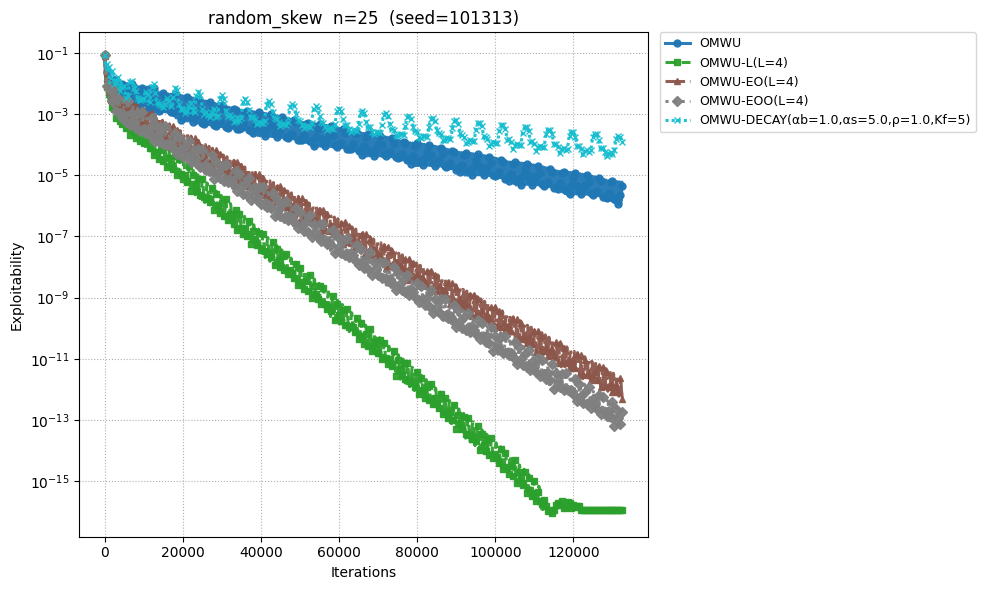

In [47]:
#!/usr/bin/env python3
"""
Single run on one random n×n zero-sum game:
  - Variants: OMWU, OMWU-L, OMWU-EO (integer L), OMWU-EOO, OMWU-DECAY
  - Independent hyperparameters per variant (eta, L, alpha_b, alpha_s, rho, Kf)
  - Progress printing + one plot at the end
  - Multiple random game generators selectable via CFG.game_type

Game types (medium→hard):
  - "random_skew"        : A = (M - M^T)/2 (purely antisymmetric)
  - "lowrank_skew"       : antisymmetric low-rank core + small noise
  - "cyclic_perturbed"   : cyclic band antisymmetric + noise
  - "block_antisym"      : 2-block directed structure, antisymmetrized
  - "illcond_skew"       : antisymmetric with ill-conditioned row/col scaling
"""

from __future__ import annotations
import numpy as np
import matplotlib.pyplot as plt
from dataclasses import dataclass, asdict
from typing import Dict, List, Tuple

# ========================= USER CONFIG (edit me) =========================

@dataclass
class Config:
    T: int = 132500               # iterations
    print_every: int = 500       # console progress
    plot_every: int = 100        # sampling for curves
    seed: int = 101313                # RNG seed for the single random game
    dtype: str = "float64"       # "float64" or "longdouble"
    n: int = 25                   # game size (n x n)
    random_scale: float = 1.0    # std-dev for random entries (base scale)
    game_type: str = "random_skew"  # choose from the list in the module docstring

CFG = Config()

# Per-variant independent hyperparameters
# NOTE: EO is back to integer L: d_t = (L+1)g_t - L g_{t-1}
VARIANT_CFG = {
    "OMWU":        {"eta": 1.0},
    "OMWU-L":      {"eta": 0.5, "L": 4},
    "OMWU-EO":     {"eta": 0.65, "L": 4},    # integer L optimism (round number)
    "OMWU-EOO":    {"eta": 0.5, "L": 4},
    "OMWU-DECAY":  {"eta": 0.10, "alpha_b": 1.0, "alpha_s": 5.0, "rho": 1.0, "Kf": 5},
}

# ========================================================================

# ============================ numerics helpers ===========================

def get_dtype(name: str):
    if name == "float64":
        return np.float64
    elif name == "longdouble":
        return np.longdouble
    raise ValueError("dtype must be 'float64' or 'longdouble'")

def softmax(b: np.ndarray) -> np.ndarray:
    z = b - np.max(b)
    e = np.exp(z)
    return e / np.sum(e)

def row_grad(A: np.ndarray, y: np.ndarray) -> np.ndarray:
    return A @ y

def col_grad(A: np.ndarray, x: np.ndarray) -> np.ndarray:
    return -(A.T @ x)

def best_response_value_row(A: np.ndarray, y: np.ndarray) -> float:
    return float(np.max(A @ y))

def best_response_value_col(A: np.ndarray, x: np.ndarray) -> float:
    return float(np.max(-(A.T @ x)))

def nashconv_and_exploit(A: np.ndarray, x: np.ndarray, y: np.ndarray) -> Tuple[float, float]:
    ev_row = float(x @ (A @ y))
    br_row = best_response_value_row(A, y)
    br_col = best_response_value_col(A, x)
    nconv = (br_row - ev_row) + (br_col + ev_row)
    exploit = 0.5 * nconv
    return nconv, exploit

def sampling_times(T: int, plot_every: int) -> List[int]:
    return [1] + list(range(plot_every, T + 1, plot_every))

# ================================ agents =================================

class AgentBase:
    def __init__(self, n: int, eta: float, label: str, DTYPE):
        self.n = n
        self.eta = float(eta)
        self.label = label
        self.DTYPE = DTYPE
        self.b = np.zeros(n, dtype=DTYPE)
        self.x = softmax(self.b)
        self.g_prev = np.zeros(n, dtype=DTYPE)
        self.t = 0
        self._g_hist: List[np.ndarray] = []

    def next_strategy(self) -> np.ndarray:
        return self.x

    def _push_g(self, g: np.ndarray):
        self._g_hist.append(g.copy())

    def _get_g(self, idx_from_1: int) -> np.ndarray:
        if idx_from_1 <= 0 or idx_from_1 > len(self._g_hist):
            return np.zeros(self.n, dtype=self.DTYPE)
        return self._g_hist[idx_from_1 - 1]

    def observe_gradient(self, g_t: np.ndarray):
        raise NotImplementedError

# ------------------------------ OMWU --------------------------------------

class OMWU(AgentBase):
    def __init__(self, n: int, eta: float, DTYPE):
        super().__init__(n, eta, "OMWU", DTYPE)
    def observe_gradient(self, g_t: np.ndarray):
        self.t += 1
        d_t = 2.0 * g_t - self.g_prev
        self.b += self.DTYPE(self.eta) * d_t
        self.x = softmax(self.b)
        self.g_prev = g_t.copy()
        self._push_g(g_t)

# ------------------------------ OMWU-L ------------------------------------

class OMWU_L(AgentBase):
    def __init__(self, n: int, eta: float, L: int, DTYPE):
        super().__init__(n, eta, f"OMWU-L(L={L})", DTYPE)
        self.L = int(L)
        self._histL: List[np.ndarray] = []
        self._sumL = np.zeros(n, dtype=DTYPE)
    def observe_gradient(self, g_t: np.ndarray):
        self.t += 1
        base = (self.DTYPE(self.L) + 1.0) * g_t - self._sumL
        d_t = base
        # update window after using it
        self._histL.insert(0, g_t.copy()); self._sumL += g_t
        if len(self._histL) > self.L:
            old = self._histL.pop(); self._sumL -= old
        self.b += self.DTYPE(self.eta) * d_t
        self.x = softmax(self.b)
        self.g_prev = g_t.copy()
        self._push_g(g_t)

# ------------------------------ OMWU-EO (integer L) -----------------------

class OMWU_EO(AgentBase):
    """
    EO with *integer* breadth L:
      d_t = (L + 1) * g_t - L * g_{t-1}
    """
    def __init__(self, n: int, eta: float, L: int, DTYPE=None):
        self.L = int(L)
        super().__init__(n, eta, f"OMWU-EO(L={self.L})", DTYPE)

    def observe_gradient(self, g_t: np.ndarray):
        self.t += 1
        L = self.DTYPE(self.L)
        d_t = (L + 1.0) * g_t - L * self.g_prev
        self.b += self.DTYPE(self.eta) * d_t
        self.x = softmax(self.b)
        self.g_prev = g_t.copy()
        self._push_g(g_t)

# ------------------------------ OMWU-EOO ----------------------------------

class OMWU_EOO(AgentBase):
    def __init__(self, n: int, eta: float, L: int, DTYPE):
        super().__init__(n, eta, f"OMWU-EOO(L={L})", DTYPE)
        self.L = int(L)
        self.pending = np.zeros(n, dtype=DTYPE)
    def observe_gradient(self, g_t: np.ndarray):
        self.t += 1
        d_t = (self.DTYPE(self.L) + 1.0) * g_t - self.g_prev - self.pending
        self.b += self.DTYPE(self.eta) * d_t
        self.x = softmax(self.b)
        new_pending = max(self.L - 1, 0) * self.g_prev
        self.g_prev = g_t.copy()
        self.pending = new_pending
        self._push_g(g_t)

# ------------------------------ OMWU-DECAY --------------------------------

class OMWU_DECAY(AgentBase):
    """
    d_t = α_b g_t − (α_b−1) g_{t−1} + sum_{j=0}^{Kf−1} α_s ρ^j (g_{t−j} − g_{t−j−1})
    g_{t-k} := 0 if missing.
    """
    def __init__(self, n: int, eta: float, alpha_b: float, alpha_s: float, rho: float, Kf: int, DTYPE):
        label = f"OMWU-DECAY(αb={alpha_b},αs={alpha_s},ρ={rho},Kf={Kf})"
        super().__init__(n, eta, label, DTYPE)
        self.alpha_b = DTYPE(alpha_b)
        self.alpha_s = DTYPE(alpha_s)
        self.rho = DTYPE(rho)
        self.Kf = int(Kf)

    def _finite_diff_tail(self, g_t: np.ndarray) -> np.ndarray:
        if self.Kf <= 0:
            return np.zeros_like(g_t)
        tail = np.zeros_like(g_t)
        zeros = np.zeros_like(g_t)
        for j in range(self.Kf):
            g_tj  = g_t if j == 0 else (self._get_g(self.t - j) if (self.t - j) >= 1 else zeros)
            g_tjm1 = self._get_g(self.t - j - 1) if (self.t - j - 1) >= 1 else zeros
            tail += (self.alpha_s * (self.rho ** j)) * (g_tj - g_tjm1)
        return tail

    def observe_gradient(self, g_t: np.ndarray):
        self.t += 1
        base = self.alpha_b * g_t - (self.alpha_b - 1.0) * self.g_prev
        tail = self._finite_diff_tail(g_t)
        d_t = base + tail
        self.b += self.DTYPE(self.eta) * d_t
        self.x = softmax(self.b)
        self.g_prev = g_t.copy()
        self._push_g(g_t)

# ============================== game makers ===============================

def make_random_skew(n: int, scale: float, rng: np.random.Generator) -> np.ndarray:
    """Pure antisymmetric: A = (M - M^T)/2."""
    M = rng.normal(0.0, scale, size=(n, n))
    return 2.2*(M - M.T) / 12.0

def make_lowrank_skew(n: int, rank: int, noise_scale: float, rng: np.random.Generator) -> np.ndarray:
    """Low-rank antisymmetric core + small noise."""
    U = rng.normal(0.0, 1.0, size=(n, rank))
    V = rng.normal(0.0, 1.0, size=(n, rank))
    core = U @ V.T
    A = (core - core.T) / 12.0
    A += rng.normal(0.0, noise_scale, size=(n, n)) * 0.212  # gentle noise
    A = (A - A.T) / 1.0
    return A

def make_cyclic_perturbed(n: int, base_strength: float, noise_scale: float, rng: np.random.Generator) -> np.ndarray:
    """Cyclic band antisymmetric with random perturbations."""
    A = np.zeros((n, n))
    for i in range(n):
        A[i, (i+1) % n] = base_strength
        A[(i+1) % n, i] = -base_strength
    A += rng.normal(0.0, noise_scale, size=(n, n))
    A = (A - A.T) / 2.0
    return A

def make_block_antisym(n: int, strength: float, noise_scale: float, rng: np.random.Generator) -> np.ndarray:
    """Two-block directed structure, then antisymmetrize."""
    if n < 4:
        raise ValueError("block_antisym requires n >= 4")
    A = rng.normal(0.0, noise_scale, size=(n, n))
    mid = n // 2
    # push block 0 -> block 1 positively, reverse negative
    A[:mid, mid:] += strength
    A[mid:, :mid] -= strength
    A = (A - A.T) / 2.0
    return A

def make_illcond_skew(n: int, scale: float, cond: float, rng: np.random.Generator) -> np.ndarray:
    """Antisymmetric with ill-conditioned scaling: A' = S A S, diag(S) logspaced."""
    M = rng.normal(0.0, scale, size=(n, n))
    A = (M - M.T) / 2.0
    svals = np.logspace(0.0, np.log10(cond), num=n)  # from 1 to cond
    S = np.diag(svals)
    A = S @ A @ S
    A = (A - A.T) / 2.0
    return A

def gen_game(game_type: str, n: int, rng: np.random.Generator, base_scale: float) -> np.ndarray:
    gt = game_type.lower()
    if gt == "random_skew":
        return make_random_skew(n, base_scale, rng)
    elif gt == "lowrank_skew":
        return make_lowrank_skew(n, rank=max(2, n//3), noise_scale=base_scale, rng=rng)
    elif gt == "cyclic_perturbed":
        return make_cyclic_perturbed(n, base_strength=1.0, noise_scale=0.5 * base_scale, rng=rng)
    elif gt == "block_antisym":
        return make_block_antisym(n, strength=1.0, noise_scale=0.25 * base_scale, rng=rng)
    elif gt == "illcond_skew":
        return make_illcond_skew(n, scale=base_scale, cond=20.0, rng=rng)
    else:
        raise ValueError(f"Unknown game_type '{game_type}'. "
                         f"Choose one of: random_skew, lowrank_skew, cyclic_perturbed, block_antisym, illcond_skew")

# ============================ experiment core =============================

def run_one_game(A: np.ndarray, T: int, plot_every: int, print_every: int,
                 agents: Dict[str, Tuple[AgentBase, AgentBase]]):
    records = {lbl: {"times": [], "exploit": []} for lbl in agents}

    for t in range(1, T + 1):
        for lbl, (row, col) in agents.items():
            x = row.next_strategy()
            y = col.next_strategy()
            g_row = row_grad(A, y)
            g_col = col_grad(A, x)
            row.observe_gradient(g_row)
            col.observe_gradient(g_col)

        if t == 1 or (t % plot_every) == 0:
            for lbl, (row, col) in agents.items():
                x2 = row.next_strategy(); y2 = col.next_strategy()
                _, ex = nashconv_and_exploit(A, x2, y2)
                records[lbl]["times"].append(t)
                records[lbl]["exploit"].append(ex)

        if t == 1 or (t % print_every) == 0:
            msg = [f"t={t:6d}"]
            for lbl in agents:
                ex = records[lbl]["exploit"][-1] if records[lbl]["exploit"] else float('nan')
                msg.append(f"{lbl}: ex={ex:.3e}")
            print("[progress]", "  ".join(msg))

    # Length alignment (safety)
    t_ref = None
    for lbl in records:
        if t_ref is None:
            t_ref = len(records[lbl]["times"])
        else:
            m = min(t_ref, len(records[lbl]["times"]), len(records[lbl]["exploit"]))
            records[lbl]["times"] = records[lbl]["times"][:m]
            records[lbl]["exploit"] = records[lbl]["exploit"][:m]

    return records

# =============================== plotting =================================

def make_style_map(labels: List[str]):
    import matplotlib.cm as cm
    cmap = cm.get_cmap('tab10', len(labels))
    linestyles = ['-', '--', '-.', ':', (0, (1, 1))]
    markers = ['o', 's', '^', 'D', 'x']
    style_map = {}
    for i, lbl in enumerate(labels):
        style_map[lbl] = dict(color=cmap(i), linestyle=linestyles[i % len(linestyles)],
                              linewidth=2.2, alpha=0.95, marker=markers[i % len(markers)],
                              markevery=5, markersize=5)
    return style_map

def plot_single(records, title: str):
    labels = list(records.keys())
    style_map = make_style_map(labels)

    plt.figure(figsize=(10, 6))
    for lbl in labels:
        xs = np.array(records[lbl]["times"], dtype=float)
        ys = np.array(records[lbl]["exploit"], dtype=float)
        plt.plot(xs, ys, label=lbl, **style_map[lbl])
    plt.yscale("log")
    plt.xlabel("Iterations")
    plt.ylabel("Exploitability")
    plt.title(title)
    plt.grid(True, which="both", ls=":")
    plt.legend(fontsize=9, ncol=1, bbox_to_anchor=(1.02, 1), loc="upper left", borderaxespad=0.)
    plt.tight_layout()
    plt.show()

# ================================= main ===================================

def make_agents(n: int, DTYPE, cfg: Dict[str, Dict]) -> Dict[str, Tuple[AgentBase, AgentBase]]:
    agents: Dict[str, Tuple[AgentBase, AgentBase]] = {}

    # OMWU
    p = cfg["OMWU"]
    agents["OMWU"] = (OMWU(n, p["eta"], DTYPE), OMWU(n, p["eta"], DTYPE))

    # OMWU-L
    p = cfg["OMWU-L"]
    agents[f"OMWU-L(L={p['L']})"] = (OMWU_L(n, p["eta"], p["L"], DTYPE), OMWU_L(n, p["eta"], p["L"], DTYPE))

    # OMWU-EO (integer L)
    p = cfg["OMWU-EO"]
    agents[f"OMWU-EO(L={p['L']})"] = (OMWU_EO(n, p["eta"], p["L"], DTYPE), OMWU_EO(n, p["eta"], p["L"], DTYPE))

    # OMWU-EOO
    p = cfg["OMWU-EOO"]
    agents[f"OMWU-EOO(L={p['L']})"] = (OMWU_EOO(n, p["eta"], p["L"], DTYPE), OMWU_EOO(n, p["eta"], p["L"], DTYPE))

    # OMWU-DECAY
    p = cfg["OMWU-DECAY"]
    lab = f"OMWU-DECAY(αb={p['alpha_b']},αs={p['alpha_s']},ρ={p['rho']},Kf={p['Kf']})"
    agents[lab] = (
        OMWU_DECAY(n, p["eta"], p["alpha_b"], p["alpha_s"], p["rho"], p["Kf"], DTYPE),
        OMWU_DECAY(n, p["eta"], p["alpha_b"], p["alpha_s"], p["rho"], p["Kf"], DTYPE),
    )
    return agents

def main():
    print("Config:", asdict(CFG))
    print("Variant hyperparameters:", VARIANT_CFG)
    DTYPE = get_dtype(CFG.dtype)
    rng = np.random.default_rng(CFG.seed)

    # Build one random game of the chosen type (row payoff A, col payoff -A)
    A = gen_game(CFG.game_type, CFG.n, rng, CFG.random_scale)
    print(f"[info] Single {CFG.game_type} game  |  seed={CFG.seed}  |  shape={A.shape}")

    # Build agents (per-variant hyperparameters)
    agents = make_agents(CFG.n, DTYPE, VARIANT_CFG)

    # Run
    records = run_one_game(A, CFG.T, CFG.plot_every, CFG.print_every, agents)

    # Plot
    plot_single(records, title=f"{CFG.game_type}  n={CFG.n}  (seed={CFG.seed})")

if __name__ == "__main__":
    main()


In [48]:
###############################################
###############################################

In [17]:
###############################


In [15]:
#!/usr/bin/env python3
"""
# komwu_random_efg.py
# ============================================================
# KOMWU (Treeplex / sequence-form) + Random EFG generator
# - Two-player zero-sum extensive-form games with chance.
# - Information sets, sequence-form constraints, treeplex recursion.
# - Adjustable hyperparameters (EFG shape & KOMWU).
# - Plot exploitability (≈ NashConv/2) over iterations.
#
# This file is self-contained (no capnp). The Game/Treeplex API
# matches your game.py/komwu.py so the KOMWU core is unchanged.
# ============================================================
from __future__ import annotations
import argparse
import math
import sys
from dataclasses import dataclass
from typing import List, Tuple, Dict, Optional
import numpy as np
import matplotlib.pyplot as plt

# =========================== numerics ===========================
EPS = 1e-18

def get_dtype(precision: str):
    if precision not in {"normal","precise"}:
        raise ValueError("precision must be 'normal' or 'precise'")
    return np.float64 if precision == "normal" else np.longdouble

def logsumexp_np(v: np.ndarray) -> np.floating:
    m = np.max(v)
    return m + np.log(np.sum(np.exp(v - m)))

# =========================== Treeplex ===========================
class Treeplex:
    class Infoset:
        __slots__ = ("start_sequence_id","end_sequence_id","parent_sequence_id","infoset_id")
        def __init__(self, start_seq: int, end_seq: int, parent_seq: int, infoset_id: int):
            self.start_sequence_id = int(start_seq)
            self.end_sequence_id   = int(end_seq)
            self.parent_sequence_id= int(parent_seq)
            self.infoset_id        = int(infoset_id)

    def __init__(self, infosets: List["Treeplex.Infoset"], children: List[List["Treeplex.Infoset"]], n_sequences_hint: Optional[int]=None):
        """
        infosets must already have parent_sequence_id pointing to their parent's *sequence*,
        where top-level infosets use the special parent = root_sequence_id.
        The root sequence is the largest parent_sequence_id among infosets.
        The children structure is pre-built and passed in.
        """
        self.infosets: List[Treeplex.Infoset] = infosets
        self.children: List[List[Treeplex.Infoset]] = children # Use the pre-built children list
        self.n_infosets = len(infosets)
        if self.n_infosets == 0:
            self.root_sequence_id = 0
            self.n_sequences = 1
            return

        self.root_sequence_id = max(ifs.parent_sequence_id for ifs in infosets)
        if n_sequences_hint is None:
            max_action_seq = max(ifs.end_sequence_id for ifs in infosets) if self.n_infosets else -1
            self.n_sequences = max(self.root_sequence_id, max_action_seq) + 1
        else:
            self.n_sequences = int(n_sequences_hint)


    # ---- helpers like your game.py ----
    def is_sf_strategy(self, x: np.ndarray) -> bool:
        if not (x >= 0.0).all():
            return False
        if abs(float(x[self.root_sequence_id]) - 1.0) > 1e-9:
            return False
        for infoset in self.infosets:
            s = -float(x[infoset.parent_sequence_id])
            for seq in range(infoset.start_sequence_id, infoset.end_sequence_id + 1):
                s += float(x[seq])
            if abs(s) > 1e-9:
                return False
        return True

    def best_response_value(self, gradient: np.ndarray) -> float:
        # Copy then dynamic program bottom-up like your game.py
        g = np.asarray(gradient, dtype=gradient.dtype).copy()
        # Process infosets in reverse topological order (deeper infosets first)
        for infoset in reversed(self.infosets):
            sl = g[infoset.start_sequence_id : infoset.end_sequence_id + 1]
            g[infoset.parent_sequence_id] += np.max(sl)
        return float(g[self.root_sequence_id])

# =============== KOMWU core (same mapping & update) ===============
class Komwu:
    """
    Base KOMWU on a Treeplex.
    Direction (OMWU): d_t = 2 g_t - g_{t-1}
    Strategy mapping: treeplex log-partition recursion (stable in log-space).
    """
    def __init__(self, tpx: Treeplex, eta: float = 0.3, dtype=None):
        self.tpx = tpx
        self.eta = float(eta)
        self.dtype = dtype if dtype is not None else np.float64

        self.last_gradient = np.zeros(self.tpx.n_sequences, dtype=self.dtype)
        self.b = np.zeros(self.tpx.n_sequences, dtype=self.dtype)     # logit-like
        # Rely on Treeplex to provide infosets in a usable order (e.g., topological)
        # Assuming tpx.infosets is already in reverse topological order (children before parents)
        self._post_infosets = self.tpx.infosets[::-1] # Use reverse of tpx.infosets for post-order
        self._compute_x()

        # regret diagnostics
        self.sum_gradients = np.zeros(self.tpx.n_sequences, dtype=self.dtype)
        self.sum_ev = self.dtype(0.0)

    def next_strategy(self) -> np.ndarray:
        return self.x

    def regret(self) -> float:
        return self.tpx.best_response_value(self.sum_gradients) - float(self.sum_ev)

    # ---------- main update ----------
    def observe_gradient(self, gradient: np.ndarray):
        g_t = np.asarray(gradient, dtype=self.dtype)
        self.sum_gradients += g_t
        self.sum_ev += g_t.dot(self.next_strategy())

        d_t = self.dtype(2.0) * g_t - self.last_gradient
        self.b += self.dtype(self.eta) * d_t
        self._compute_x()
        self.last_gradient = g_t

    # ---------- treeplex softmax ----------
    # Removed _prepare_topo_orders as it's redundant with Treeplex finalization

    def _compute_x(self):
        r"""Compute sequence‑form flow `x` from logits `b` via the treeplex recursion.
        Let `K_j = log(∑_{a∈A(j)} exp(b_{ja} + ∑_{child I'} K_{I'}))`.
        Then log‑flow `y_{ja} = y_parent + b_{ja} + ∑_{child I'} K_{I'} − K_j`, with `y_root=0`, `x=exp(y)`.
        """
        K_j: List[Optional[float]] = [None] * self.tpx.n_infosets
        # bottom‑up local log‑partitions (process deeper infosets first)
        for infoset in self._post_infosets:  # Use the pre-calculated post-order
            terms = []
            for seq in range(infoset.start_sequence_id, infoset.end_sequence_id + 1):
                child_sum = 0.0
                # Access children using list indexing based on sequence
                # Ensure seq is within bounds of self.tpx.children
                if seq < len(self.tpx.children):
                    for child_infoset in self.tpx.children[seq]:
                        child_sum += K_j[child_infoset.infoset_id]
                terms.append(self.b[seq] + child_sum)

            # Handle case with no terms (e.g., terminal infosets)
            if not terms:
                K_j[infoset.infoset_id] = 0.0 # Log-partition of an empty set is 0
            else:
                m = max(terms)
                # Check for potential overflow before exp
                if m > 700: # Arbitrary large number, adjust as needed
                    K_j[infoset.infoset_id] = m + math.log(sum(math.exp(min(t - m, 700)) for t in terms))
                else:
                     K_j[infoset.infoset_id] = m + math.log(sum(math.exp(t - m) for t in terms))


        # top‑down flows (parents before children)
        y = np.full(self.tpx.n_sequences, -1e9, dtype=self.dtype)
        y[self.tpx.root_sequence_id] = 0.0

        # Iterate through infosets in topological order (parents before children)
        for infoset in self.tpx.infosets:
            Kj = K_j[infoset.infoset_id]
            y_parent = y[infoset.parent_sequence_id]
            for seq in range(infoset.start_sequence_id, infoset.end_sequence_id + 1):
                child_sum = 0.0
                # Access children using list indexing based on sequence
                 # Ensure seq is within bounds of self.tpx.children
                if seq < len(self.tpx.children):
                    for child_infoset in self.tpx.children[seq]:
                        child_sum += K_j[child_infoset.infoset_id]
                y[seq] = y_parent + self.b[seq] + child_sum - Kj
                # Clamp the exponent result before exp
                y[seq] = np.clip(y[seq], -60.0, 60.0)

        self.x = np.exp(y)  # exp after clamping
        # Re-normalize x to ensure it sums to 1 for the root sequence
        self.x[self.tpx.root_sequence_id] = 1.0

        assert self.tpx.is_sf_strategy(self.x), "x is not a valid sequence‑form strategy"

# ------------------------------ Variants --------------------------------------
class KomwuL(Komwu):
    r"""OMWU‑L:  `d_t = (L+1) g_t − ∑_{i=1}^L g_{t−i}`. Efficient via a running sum."""
    def __init__(self, tpx, eta: float = 0.3, L: int = 5, dtype=None):
        super().__init__(tpx, eta, dtype=dtype)
        self.L = int(L)
        self._hist: List[np.ndarray] = []     # most recent first
        self._sum = np.zeros(tpx.n_sequences, dtype=self.dtype)
    def observe_gradient(self, gradient: np.ndarray):
        g = np.asarray(gradient, dtype=self.dtype)
        self.sum_gradients += g; self.sum_ev += g.dot(self.next_strategy())
        self._hist.insert(0, g)
        self._sum += g
        if len(self._hist) > self.L:
            self._sum -= self._hist.pop()
        d = (self.dtype(self.L) + 1.0) * g - self._sum
        self.b += self.dtype(self.eta) * d; self._compute_x(); self.last_gradient = g

class KomwuEO(Komwu):
    r"""OMWU‑EO (breadth L):  `d_t = (L+1) g_t − L g_{t−1}`."""
    def __init__(self, tpx, eta: float = 0.3, L: int = 5, dtype=None):
        super().__init__(tpx, eta, dtype=dtype); self.L = int(L)
    def observe_gradient(self, gradient: np.ndarray):
        g = np.asarray(gradient, dtype=self.dtype)
        self.sum_gradients += g; self.sum_ev += g.dot(self.next_strategy())
        d = (self.dtype(self.L) + 1.0) * g - (self.dtype(self.L) * self.last_gradient)
        self.b += self.dtype(self.eta) * d; self._compute_x(); self.last_gradient = g

class KomwuEOO(Komwu):
    r"""OMWU‑EOO: `d_t = (L+1) g_t − g_{t−1} − pending_t`;  `pending_{t+1} = max(L−1,0) g_{t−1}`."""
    def __init__(self, tpx, eta: float = 0.3, L: int = 5, dtype=None):
        super().__init__(tpx, eta, dtype=dtype); self.L = int(L)
        self.pending = np.zeros(tpx.n_sequences, dtype=self.dtype)
    def observe_gradient(self, gradient: np.ndarray):
        g = np.asarray(gradient, dtype=self.dtype)
        self.sum_gradients += g; self.sum_ev += g.dot(self.next_strategy())
        d = (self.dtype(self.L) + 1.0) * g - self.last_gradient - self.pending
        self.pending = self.dtype(max(self.L - 1, 0)) * self.last_gradient
        self.b += self.dtype(self.eta) * d; self._compute_x(); self.last_gradient = g

class KomwuDecay(Komwu):
    r"""OMWU‑DECAY (split α_b, α_s, decay ρ, length K_f):
    General: `d_t = α_b g_t − (α_b − 1) g_{t−1} + ∑_{j=0}^{K_f−1} α_s ρ^j (g_{t−j} − g_{t−j−1})`.
    With ρ=1: `d_t = (α_b+α_s) g_t − (α_b − 1) g_{t−1} − α_s g_{t−K_f}`.
    """
    def __init__(self, tpx, eta: float = 0.3, alpha_b: float = 1.0, alpha_s: float = 1.0, Kf: int = 0, rho: float = 1.0, dtype=None):
        super().__init__(tpx, eta, dtype=dtype)
        self.alpha_b = float(alpha_b); self.alpha_s = float(alpha_s)
        self.Kf = int(Kf); self.rho = float(rho)
        self._hist: List[np.ndarray] = []  # g_t, g_{t-1}, ... (most recent first)
        self._w = np.array([self.alpha_s * (self.rho ** j) for j in range(self.Kf)], dtype=self.dtype)
    def _get_hist(self, k: int, zeros: np.ndarray) -> np.ndarray:
        return self._hist[k] if k < len(self._hist) else zeros
    def observe_gradient(self, gradient: np.ndarray):
        g = np.asarray(gradient, dtype=self.dtype)
        self.sum_gradients += g; self.sum_ev += g.dot(self.next_strategy())
        g_tm1 = self.last_gradient
        d = self.dtype(self.alpha_b) * g - (self.dtype(self.alpha_b) - 1.0) * g_tm1
        if self.Kf > 0:
            zeros = np.zeros_like(g)
            for j in range(self.Kf):
                g_tj = g if j == 0 else self._get_hist(j-1, zeros)
                g_tjm1 = self._get_hist(j, zeros)
                d += self._w[j] * (g_tj - g_tjm1)
        self._hist.insert(0, g.copy())
        if len(self._hist) > (self.Kf + 1):
            self._hist.pop()
        self.b += self.dtype(self.eta) * d; self._compute_x(); self.last_gradient = g

class KomwuCO(Komwu):
    r"""**Cautious Optimism**: scale extra‑optimism by cosine alignment between `g_t` and `g_{t−1}`.
    `d_t = (1+β) g_t − β g_{t−1}`, where `β = β_max · clamp(cos(g_t,g_{t−1}), 0, 1)`.
    When aligned → approach OMWU; when anti‑aligned → back off toward vanilla gradient.
    """
    def __init__(self, tpx, eta: float = 0.3, beta_max: float = 1.0, eps: float = 1e-12, dtype=None):
        super().__init__(tpx, eta, dtype=dtype)
        self.beta_max = float(beta_max); self.eps = float(eps)
    def observe_gradient(self, gradient: np.ndarray):
        g = np.asarray(gradient, dtype=self.dtype)
        self.sum_gradients += g; self.sum_ev += g.dot(self.next_strategy())
        dot = float(np.dot(g, self.last_gradient))
        nrm = float(np.linalg.norm(g) * np.linalg.norm(self.last_gradient) + self.eps)
        cos = 0.0 if nrm == 0.0 else dot / nrm
        lam = max(0.0, min(1.0, cos))
        beta = self.beta_max * lam
        d = (1.0 + beta) * g - beta * self.last_gradient
        self.b += self.dtype(self.eta) * d; self._compute_x(); self.last_gradient = g

# ========================== Eval & duality gap (EFG) ==========================

# Convert sequence‑form flow to *behavior at each infoset (normalize by parent flow)

def behavior_from_sequence(x: np.ndarray, tpx: Treeplex) -> Dict[int, np.ndarray]:
    beh: Dict[int, np.ndarray] = {}
    for J in tpx.infosets:
        parent = x[J.parent_sequence_id]
        block = x[J.start_sequence_id: J.end_sequence_id + 1]
        if parent <= 1e-16:
            a = len(block)
            beh[J.infoset_id] = np.full(a, 1.0 / a)
        else:
            probs = block / max(parent, 1e-16)
            s = probs.sum()
            if s <= 0:
                a = len(block)
                beh[J.infoset_id] = np.full(a, 1.0 / a)
            else:
                beh[J.infoset_id] = probs / s
    return beh

# Evaluate value to P1 when both players use fixed behaviors (no BR)

def value_fixed(root: EFGNode, beh1: Dict[int, np.ndarray], beh2: Dict[int, np.ndarray]) -> float:
    def ev(n: EFGNode) -> float:
        if n.kind == 'T':
            return n.payoff
        if n.kind == 'C':
            return sum(p * ev(c) for p, c in n.children)
        if n.kind == 'P1':
            # Check if node is a player node and has infoset_id
            if n.infoset_id is not None:
                probs = beh1[n.infoset_id]
                return sum(probs[i] * ev(n.children[i][1]) for i in range(len(n.children)))
            else:
                 # If infoset_id is None, this might be an unexpected case in the tree structure
                 # For now, return a default or raise an error depending on desired behavior
                 # Returning 0.0 might hide issues, raising might be better for debugging
                 raise ValueError("P1 node with None infoset_id encountered in value_fixed")

        if n.kind == 'P2':
            # Check if node is a player node and has infoset_id
            if n.infoset_id is not None:
                probs = beh2[n.infoset_id]
                return sum(probs[i] * ev(n.children[i][1]) for i in range(len(n.children)))
            else:
                 # Similar handling for P2 nodes
                 raise ValueError("P2 node with None infoset_id encountered in value_fixed")

        raise RuntimeError(f"Unexpected node kind: {n.kind}")
    return float(ev(root))

# Best response value for P1 against fixed beh2 (P2)

def br_value_p1(root: EFGNode, beh2: Dict[int, np.ndarray]) -> float:
    def ev(n: EFGNode) -> float:
        if n.kind == 'T':
            return n.payoff
        if n.kind == 'C':
            return sum(p * ev(c) for p, c in n.children)
        if n.kind == 'P1':
            # Only take max over children, not weighted by behavior
            return max(ev(n.children[i][1]) for i in range(len(n.children)))
        if n.kind == 'P2':
            # Check if node is a player node and has infoset_id
            if n.infoset_id is not None:
                probs = beh2[n.infoset_id]
                return sum(probs[i] * ev(n.children[i][1]) for i in range(len(n.children)))
            else:
                 raise ValueError("P2 node with None infoset_id encountered in br_value_p1")

        raise RuntimeError(f"Unexpected node kind: {n.kind}")
    return float(ev(root))

# Best response (minimizer) value min_y u(x,y) = value when P2 best responds

def br_value_p2(root: EFGNode, beh1: Dict[int, np.ndarray]) -> float:
    def ev(n: EFGNode) -> float:
        if n.kind == 'T':
            return n.payoff
        if n.kind == 'C':
            return sum(p * ev(c) for p, c in n.children)
        if n.kind == 'P1':
            # Check if node is a player node and has infoset_id
            if n.infoset_id is not None:
                probs = beh1[n.infoset_id]
                return sum(probs[i] * ev(n.children[i][1]) for i in range(len(n.children)))
            else:
                 # THIS IS WHERE THE ERROR LIKELY OCCURS
                 raise ValueError("P1 node with None infoset_id encountered in br_value_p2")

        if n.kind == 'P2':
             # Only take min over children, not weighted by behavior
            return min(ev(n.children[i][1]) for i in range(len(n.children)))
        raise RuntimeError(f"Unexpected node kind: {n.kind}")

    return float(ev(root))

# Duality gap: max_x' u(x', y) − min_y' u(x, y')

def duality_gap(root: EFGNode, x1: np.ndarray, x2: np.ndarray, tpx1: Treeplex, tpx2: Treeplex) -> float:
    b1 = behavior_from_sequence(x1, tpx1)
    b2 = behavior_from_sequence(x2, tpx2)
    v_max = br_value_p1(root, b2)
    v_min = br_value_p2(root, b1)
    return float(v_max - v_min)

# ============================== Training harness ==============================

@dataclass
class AlgoSpec:
    name: str
    variant: str
    params: VariantParams

@dataclass
class ExperimentConfig:
    # Game
    seed: int = 7
    rounds: int = 2           # number of decision rounds *per player*
    branching: int = 2        # number of actions per infoset
    chance_prob: float = 0.0  # optional chance between rounds (kept simple)
    chance_outcomes: int = 2
    payoff_scale: float = 1.0
    # Training
    iterations: int = 5000
    eta: float = 0.3
    precision: str = "normal"   # "normal" | "precise" (float64 vs longdouble)
    print_every: int = 250
    # Variants to run (None → all)
    algos: Optional[List[AlgoSpec]] = None
    # Global variant params (easy tweak)
    L: int = 5
    alpha_b: float = 1.0
    alpha_s: float = 1.0
    Kf: int = 0
    rho: float = 1.0
    co_beta_max: float = 1.0


def build_default_algos(cfg: ExperimentConfig) -> List[AlgoSpec]:
    P = VariantParams(L=cfg.L, alpha_b=cfg.alpha_b, alpha_s=cfg.alpha_s, Kf=cfg.Kf, rho=cfg.rho, co_beta_max=cfg.co_beta_max)
    return [
        AlgoSpec("KOMWU",        KomwuVariant.OMWU,  P),
        AlgoSpec("KOMWU-L",      KomwuVariant.LWIN,  P),
        AlgoSpec("KOMWU-EO",     KomwuVariant.EO,    P),
        AlgoSpec("KOMWU-EOO",    KomwuVariant.EOO,   P),
        AlgoSpec("KOMWU-DECAY",  KomwuVariant.DECAY, P),
        AlgoSpec("KOMWU-CO",     KomwuVariant.CO,    P),
    ]

@dataclass
class RunResult:
    name: str
    gaps: np.ndarray


def _make_player(variant: str, tpx: Treeplex, cfg: ExperimentConfig, params: VariantParams, DT) -> Komwu:
    if variant == KomwuVariant.OMWU:
        return Komwu(tpx, eta=cfg.eta, dtype=DT)
    if variant == KomwuVariant.LWIN:
        return KomwuL(tpx, eta=cfg.eta, L=params.L, dtype=DT)
    if variant == KomwuVariant.EO:
        return KomwuEO(tpx, eta=cfg.eta, L=params.L, dtype=DT)
    if variant == KomwuVariant.EOO:
        return KomwuEOO(tpx, eta=cfg.eta, L=params.L, dtype=DT)
    if variant == KomwuVariant.DECAY:
        return KomwuDecay(tpx, eta=cfg.eta, alpha_b=params.alpha_b, alpha_s=params.alpha_s, Kf=params.Kf, rho=params.rho, dtype=DT)
    if variant == KomwuVariant.CO:
        return KomwuCO(tpx, eta=cfg.eta, beta_max=params.co_beta_max, dtype=DT)
    raise ValueError(variant)


def run_experiment(cfg: ExperimentConfig) -> List[RunResult]:

    print("=== Building random EFG (no NFG reduction) ===")
    game = build_random_layered_efg(seed=cfg.seed, rounds=cfg.rounds, branching=cfg.branching,
                                    chance_prob=cfg.chance_prob, chance_outcomes=cfg.chance_outcomes,
                                    payoff_scale=cfg.payoff_scale)
    print(f"Treeplex sizes: P1 n_seq={game.tpxs[0].n_sequences}  P2 n_seq={game.tpxs[1].n_sequences}  infosets P1={game.tpxs[0].n_infosets} P2={game.tpxs[1].n_infosets}")

    algos = cfg.algos if cfg.algos is not None else build_default_algos(cfg)


    print("=== Training ===")
    results: List[RunResult] = []
    for spec in algos:
        res = run_on_efg(game, spec, cfg)
        results.append(res)

    plt.figure(figsize=(7,4.5))
    for res in results:
        plt.plot(res.gaps, label=res.name)
    plt.yscale('log')
    plt.xlabel('Iteration')
    plt.ylabel('Duality gap (log scale)')
    plt.title('KOMWU + variants on random 2p0s EFG (sequence‑form)')
    plt.legend()
    plt.tight_layout()
    plt.show()

    return results

# --------------------------------- presets ------------------------------------

def quickstart() -> List[RunResult]:
    cfg = ExperimentConfig(
        seed=7,
        rounds=2,
        branching=3,
        chance_prob=0.0,
        payoff_scale=1.0,
        iterations=3000,
        eta=0.3,
        print_every=300,
        precision="normal",
        L=5,
        alpha_b=1.0,
        alpha_s=5.0,
        Kf=5,
        rho=1.0,
        co_beta_max=0.3,
    )
    return run_experiment(cfg)

def run_on_efg(game: Game, spec: AlgoSpec, cfg: ExperimentConfig) -> RunResult:
    """Runs a single algorithm on the given EFG game."""
    print(f"--- Running {spec.name} ---")
    DT = get_dtype(cfg.precision)
    row = _make_player(spec.variant, game.tpxs[0], cfg, spec.params, DT)
    col = _make_player(spec.variant, game.tpxs[1], cfg, spec.params, DT)

    gaps = []
    # Sample points for the plot
    sample_times = set(range(1, cfg.iterations + 1, 10)) # Sample every 10 iterations

    for t in range(1, cfg.iterations + 1):
        strategies = {0: row.next_strategy(), 1: col.next_strategy()}
        g0 = game.utility_gradient(0, strategies)
        g1 = game.utility_gradient(1, strategies)

        row.observe_gradient(g0)
        col.observe_gradient(g1)

        if t in sample_times or t == cfg.iterations:
             # Recalculate strategies after observe_gradient calls
            strategies_after_update = {0: row.next_strategy(), 1: col.next_strategy()}
            gap = duality_gap(game.root, strategies_after_update[0], strategies_after_update[1], game.tpxs[0], game.tpxs[1])
            gaps.append(gap)


        if (t % cfg.print_every) == 0 or t == 1:
            # Use the last calculated gap for printing
            current_gap = gaps[-1] if gaps else float('nan')
            print(f"[{spec.name}] t={t:6d}  duality_gap={current_gap:.6e}")


    return RunResult(spec.name, np.array(gaps))



if __name__ == "__main__":
    # If no CLI args -> show defaults summary then run with defaults
    if len(sys.argv) == 1:
        print("[komwu_random_efg.py] No CLI args detected → using defaults.\n"
              "  Try: python komwu_random_efg.py --depth 5 --chance-every 2 --eta 0.5 --T 30000\n")
    quickstart()

=== Random EFG built ===
  players           : 2
  P0 infosets       : 7
  P1 infosets       : 3
  P0 sequences      : 19 (root=18)
  P1 sequences      : 8 (root=7)
  payoff nnz        : 54
  notes             : Random EFG (two-player zero-sum).

[KOMWU] t=     1  exploit=3.018273e-01  eta=4.00e-01
[KOMWU] t=   500  exploit=1.211383e-03  eta=4.00e-01
[KOMWU] t=  1000  exploit=1.200220e-04  eta=4.00e-01
[KOMWU] t=  1500  exploit=1.402650e-05  eta=4.00e-01
[KOMWU] t=  2000  exploit=1.679188e-06  eta=4.00e-01
[KOMWU] t=  2500  exploit=2.032425e-07  eta=4.00e-01
[KOMWU] t=  3000  exploit=2.473203e-08  eta=4.00e-01
[KOMWU] t=  3500  exploit=3.017034e-09  eta=4.00e-01
[KOMWU] t=  4000  exploit=3.684555e-10  eta=4.00e-01
[KOMWU] t=  4500  exploit=4.502007e-11  eta=4.00e-01
[KOMWU] t=  5000  exploit=5.502043e-12  eta=4.00e-01
[KOMWU] t=  5500  exploit=6.724898e-13  eta=4.00e-01
[KOMWU] t=  6000  exploit=8.221201e-14  eta=4.00e-01
[KOMWU] t=  6500  exploit=1.004752e-14  eta=4.00e-01
[KOMWU] t= 

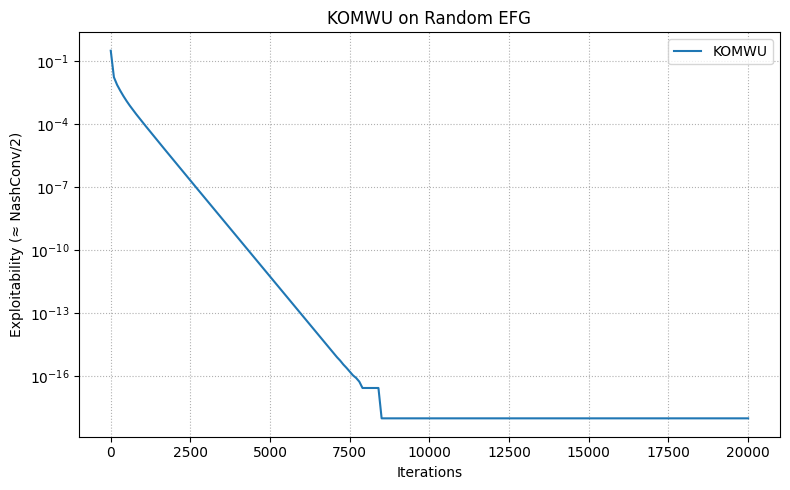

In [19]:
#@title KOMWU on Treeplex + Random EFG (library code)
# Colab-safe, single-file implementation.
from __future__ import annotations
import math, sys
from dataclasses import dataclass
from typing import List, Tuple, Dict, Optional
import numpy as np
import matplotlib.pyplot as plt

# =============== numerics helpers ===============
def get_dtype(precision: str):
    if precision not in {"normal","precise"}:
        raise ValueError("precision must be 'normal' or 'precise'")
    return np.float64 if precision == "normal" else np.longdouble

def logsumexp_np(v: np.ndarray) -> np.floating:
    # Stable log-sum-exp
    m = np.max(v)
    return m + np.log(np.sum(np.exp(v - m)))

# =============== Treeplex data structure ===============
class Treeplex:
    class Infoset:
        __slots__ = ("start_sequence_id","end_sequence_id","parent_sequence_id","infoset_id")
        def __init__(self, start_seq: int, end_seq: int, parent_seq: int, infoset_id: int):
            self.start_sequence_id  = int(start_seq)
            self.end_sequence_id    = int(end_seq)
            self.parent_sequence_id = int(parent_seq)
            self.infoset_id         = int(infoset_id)

    def __init__(self, infosets: List["Treeplex.Infoset"], n_sequences_hint: Optional[int]=None):
        self.infosets: List[Treeplex.Infoset] = infosets
        self.n_infosets = len(infosets)

        if self.n_infosets == 0:
            self.root_sequence_id = 0
            self.n_sequences = 1
            self.children = [[]]
            return

        self.root_sequence_id = max(ifs.parent_sequence_id for ifs in infosets)
        if n_sequences_hint is None:
            max_action_seq = max(ifs.end_sequence_id for ifs in infosets)
            self.n_sequences = max(self.root_sequence_id, max_action_seq) + 1
        else:
            self.n_sequences = int(n_sequences_hint)

        # For each parent sequence, which infosets sprout from it?
        self.children: List[List[Treeplex.Infoset]] = [[] for _ in range(self.n_sequences)]
        for ifs in infosets:
            self.children[ifs.parent_sequence_id].append(ifs)

    def is_sf_strategy(self, x: np.ndarray) -> bool:
        # Sequence-form feasibility: x >= 0; x[root]=1; flow conservation at each infoset
        if not np.all(x >= 0): return False
        if abs(float(x[self.root_sequence_id]) - 1.0) > 1e-9: return False
        for ifs in self.infosets:
            s = -float(x[ifs.parent_sequence_id])
            for seq in range(ifs.start_sequence_id, ifs.end_sequence_id + 1):
                s += float(x[seq])
            if abs(s) > 1e-9:
                return False
        return True

    def best_response_value(self, gradient: np.ndarray) -> float:
        # DP: add max child value to the parent sequence's gradient
        g = np.asarray(gradient, dtype=gradient.dtype).copy()
        for ifs in self.infosets:  # infosets must be in bottom-up order
            sl = g[ifs.start_sequence_id:ifs.end_sequence_id+1]
            g[ifs.parent_sequence_id] += np.max(sl)
        return float(g[self.root_sequence_id])

# =============== KOMWU core (OMWU direction on treeplex) ===============
class Komwu:
    """
    KOMWU on a Treeplex (sequence-form) with the entropic treeplex map.
    Update direction (OMWU): d_t = 2 g_t - g_{t-1}
    Strategy map: treeplex log-partition recursion in log-space.
    """
    def __init__(self, tpx: Treeplex, eta: float = 0.3, dtype=None):
        self.tpx  = tpx
        self.eta  = float(eta)
        self.dtype = np.float64 if dtype is None else dtype

        self.last_gradient = np.zeros(self.tpx.n_sequences, dtype=self.dtype)
        self.b             = np.zeros(self.tpx.n_sequences, dtype=self.dtype)  # "logits" on sequences

        self._prepare_topo_orders()
        self._compute_x()

        # regret diagnostics (optional)
        self.sum_gradients = np.zeros(self.tpx.n_sequences, dtype=self.dtype)
        self.sum_ev        = self.dtype(0.0)

    def next_strategy(self) -> np.ndarray:
        return self.x

    def regret(self) -> float:
        return self.tpx.best_response_value(self.sum_gradients) - float(self.sum_ev)

    def observe_gradient(self, gradient: np.ndarray):
        g_t = np.asarray(gradient, dtype=self.dtype)
        self.sum_gradients += g_t
        self.sum_ev += float(np.dot(g_t, self.next_strategy()))

        d_t = self.dtype(2.0) * g_t - self.last_gradient
        self.b += self.dtype(self.eta) * d_t
        self._compute_x()
        self.last_gradient = g_t

    # ----- topology for bottom-up (K) and top-down (y) passes -----
    def _prepare_topo_orders(self):
        # Map each sequence to its owning infoset (if any)
        seq_owner = {}
        for ifs in self.tpx.infosets:
            for s in range(ifs.start_sequence_id, ifs.end_sequence_id + 1):
                seq_owner[s] = ifs.infoset_id

        # Build adjacency between infosets via parent sequence ownership
        adj = [[] for _ in range(self.tpx.n_infosets)]
        roots = []
        for ifs in self.tpx.infosets:
            ps = ifs.parent_sequence_id
            if ps in seq_owner:
                adj[seq_owner[ps]].append(ifs.infoset_id)
            else:
                roots.append(ifs.infoset_id)

        # post-order DFS (children -> parent)
        seen = [False]*self.tpx.n_infosets
        post = []
        sys.setrecursionlimit(10000)
        def dfs(u: int):
            if seen[u]: return
            seen[u] = True
            for v in adj[u]:
                dfs(v)
            post.append(u)
        for r in roots: dfs(r)
        for i in range(self.tpx.n_infosets):
            if not seen[i]: dfs(i)

        id2if = {ifs.infoset_id: ifs for ifs in self.tpx.infosets}
        self._post_infosets = [id2if[i] for i in post]   # bottom-up order

    def _compute_x(self):
        # Bottom-up: compute K_j(b) = log sum_a exp( b_{ja} + sum_child K )
        K_j = [None] * self.tpx.n_infosets
        for ifs in self._post_infosets:  # children -> parent
            terms = []
            for s in range(ifs.start_sequence_id, ifs.end_sequence_id + 1):
                child_sum = self.dtype(0.0)
                for child in self.tpx.children[s]:
                    child_sum += K_j[child.infoset_id]
                terms.append(self.b[s] + child_sum)
            K_j[ifs.infoset_id] = logsumexp_np(np.asarray(terms, dtype=self.dtype))

        # Top-down: y propagation; y_root = 0; x = exp(y)
        y = np.zeros(self.tpx.n_sequences, dtype=self.dtype)
        for ifs in reversed(self._post_infosets):  # parent -> children
            Kj = K_j[ifs.infoset_id]
            y_parent = y[ifs.parent_sequence_id]
            for s in range(ifs.start_sequence_id, ifs.end_sequence_id + 1):
                child_sum = self.dtype(0.0)
                for child in self.tpx.children[s]:
                    child_sum += K_j[child.infoset_id]
                y[s] = y_parent + self.b[s] + child_sum - Kj

        self.x = np.exp(y)
        # Safety: exact feasibility should hold; tolerate tiny drift
        if not self.tpx.is_sf_strategy(self.x):
            # Normalize locally per infoset to project tiny drift
            for ifs in self.tpx.infosets:
                parent = ifs.parent_sequence_id
                sl = slice(ifs.start_sequence_id, ifs.end_sequence_id + 1)
                ssum = float(np.sum(self.x[sl]))
                if ssum > 0:
                    self.x[sl] *= float(self.x[parent]) / ssum
            self.x[self.tpx.root_sequence_id] = 1.0

# =============== EFG primitives ===============
@dataclass
class PayoffEntry:
    payoffs: List[float]     # [u0, u1]
    chanceFactor: float      # product of chance probabilities on path
    sequences: List[int]     # [seq0, seq1] (last sequence indices; root allowed)

class Game:
    def __init__(self, tpxs: List[Treeplex], entries: List[PayoffEntry]):
        self.tpxs = tpxs
        self.payoff_matrix_entries = entries
        self.n_players = len(tpxs)
        self.payoff_matrix_nnz = len(entries)
        self.notes = "Random EFG (two-player zero-sum)."

    def utility_gradient(self, player: int, strategies: Dict[int, np.ndarray]) -> np.ndarray:
        grad = np.zeros(self.tpxs[player].n_sequences, dtype=strategies[player].dtype)
        # Underflow on off-reach products is fine; do not abort
        with np.errstate(under='ignore'):
            for e in self.payoff_matrix_entries:
                reach = e.chanceFactor
                for p in range(self.n_players):
                    if p != player:
                        reach *= strategies[p][e.sequences[p]]
                grad[e.sequences[player]] += e.payoffs[player] * reach
        return grad

# =============== Random EFG Builder (chance + infosets) ===============
class RandomEFGBuilder:
    """
    Two-player zero-sum random EFG with chance nodes and information sets.
    We assign one infoset per decision node (perfect information by default).
    """
    def __init__(self,
                 depth: int = 4,
                 branch_min: int = 2,
                 branch_max: int = 3,
                 chance_every: int = 2,
                 chance_branches: int = 2,
                 stop_prob: float = 0.0,
                 seed: int = 0,
                 dtype=np.float64):
        self.depth = int(depth)
        self.branch_min = int(branch_min)
        self.branch_max = int(branch_max)
        self.chance_every = int(chance_every)
        self.chance_branches = int(chance_branches)
        self.stop_prob = float(stop_prob)
        self.rng = np.random.default_rng(seed)
        self.dtype = dtype

        self.next_seq = [0, 0]
        self.infosets: List[List[Tuple[int,int,int]]] = [[], []]  # per player: (start,end,parent)
        self.entries: List[PayoffEntry] = []

    def _rand_actions(self) -> int:
        return int(self.rng.integers(self.branch_min, self.branch_max + 1))

    def _rand_payoff(self) -> float:
        return float(self.rng.uniform(-1.0, 1.0))  # zero-sum in [-1,1]

    def _should_stop(self, depth: int) -> bool:
        if depth >= self.depth: return True
        if self.stop_prob > 0.0 and self.rng.random() < self.stop_prob: return True
        return False

    def _node_type(self, depth: int) -> str:
        # Insert chance layers regularly; otherwise alternate players
        if self.chance_every > 0 and (depth % (self.chance_every + 1) == 0):
            return "chance"
        return "p0" if (depth % 2 == 0) else "p1"

    def _chance_outcomes(self) -> Tuple[np.ndarray, int]:
        k = max(2, self.chance_branches)
        probs = self.rng.random(k)
        probs /= probs.sum()
        return probs.astype(self.dtype), k

    def _new_infoset(self, p: int, parent_seq: int, n_actions: int) -> Tuple[int,int,int]:
        start = self.next_seq[p]
        end   = start + n_actions - 1
        self.next_seq[p] += n_actions
        self.infosets[p].append((start, end, parent_seq))
        return (start, end, parent_seq)

    def _build(self, depth: int, last_seq0: int, last_seq1: int, chance_weight: float):
        if self._should_stop(depth):
            u = self._rand_payoff()
            self.entries.append(PayoffEntry(
                payoffs=[u, -u],
                chanceFactor=chance_weight,
                sequences=[last_seq0, last_seq1]
            ))
            return

        kind = self._node_type(depth)
        if kind == "chance":
            probs, k = self._chance_outcomes()
            for j in range(k):
                self._build(depth+1, last_seq0, last_seq1, chance_weight * float(probs[j]))
            return

        p = 0 if kind == "p0" else 1
        nA = self._rand_actions()
        start, end, _ = self._new_infoset(p, parent_seq=(last_seq0 if p==0 else last_seq1), n_actions=nA)
        for s in range(start, end+1):
            if p == 0:
                self._build(depth+1, s, last_seq1, chance_weight)
            else:
                self._build(depth+1, last_seq0, s, chance_weight)

    def _finalize_treeplex(self, p: int) -> Treeplex:
        max_seq = max([end for (start,end,parent) in self.infosets[p]], default=-1)
        root_seq_id = max_seq + 1

        fixed = []
        for (start,end,parent) in self.infosets[p]:
            parent_fixed = root_seq_id if (parent == -1) else parent
            fixed.append((start,end,parent_fixed))

        provisionals = [Treeplex.Infoset(s,e,parent,idx) for idx,(s,e,parent) in enumerate(fixed)]

        # Build seq_owner to detect parent infosets
        seq_owner: Dict[int,int] = {}
        for ifs in provisionals:
            for s in range(ifs.start_sequence_id, ifs.end_sequence_id + 1):
                seq_owner[s] = ifs.infoset_id

        # adjacency over infosets
        adj: Dict[int,List[int]] = {ifs.infoset_id: [] for ifs in provisionals}
        roots: List[int] = []
        for ifs in provisionals:
            ps = ifs.parent_sequence_id
            if ps in seq_owner:
                adj[seq_owner[ps]].append(ifs.infoset_id)
            else:
                roots.append(ifs.infoset_id)

        # post-order
        seen = {i: False for i in adj.keys()}
        post: List[int] = []
        sys.setrecursionlimit(10000)
        def dfs(u: int):
            if seen[u]: return
            seen[u] = True
            for v in adj[u]:
                dfs(v)
            post.append(u)
        for r in roots: dfs(r)
        for i in list(adj.keys()):
            if not seen[i]: dfs(i)

        id_map = {old_id: new_id for new_id, old_id in enumerate(post)}
        infosets_sorted = []
        for old_id in post:
            ifs = provisionals[old_id]
            infosets_sorted.append(
                Treeplex.Infoset(ifs.start_sequence_id, ifs.end_sequence_id, ifs.parent_sequence_id, id_map[old_id])
            )
        # Build final treeplex
        return Treeplex(infosets_sorted, n_sequences_hint=root_seq_id+1)

    def build(self) -> Game:
        # Start recursion at depth 0 with "no last action" → parent placeholder -1
        self._build(depth=0, last_seq0=-1, last_seq1=-1, chance_weight=1.0)

        tpx0 = self._finalize_treeplex(0)
        tpx1 = self._finalize_treeplex(1)

        # Fix any -1 terminal references to actual root ids
        r0, r1 = tpx0.root_sequence_id, tpx1.root_sequence_id
        for e in self.entries:
            if e.sequences[0] == -1: e.sequences[0] = r0
            if e.sequences[1] == -1: e.sequences[1] = r1

        return Game([tpx0, tpx1], self.entries)

# =============== metrics & runner helpers ===============
def nash_conv_and_ev(game: Game, x: Dict[int,np.ndarray]) -> Tuple[float,float,float]:
    g0 = game.utility_gradient(0, x)
    g1 = game.utility_gradient(1, x)
    ev0 = float(np.dot(g0, x[0]))
    ev1 = float(np.dot(g1, x[1]))
    br0 = float(game.tpxs[0].best_response_value(g0))
    br1 = float(game.tpxs[1].best_response_value(g1))
    nconv = (br0 - ev0) + (br1 - ev1)
    return nconv, 0.5 * max(nconv, 0.0), ev0  # exploitability = NashConv/2, clamp at 0

def run_komwu_random_efg(
    depth=5, branch_min=2, branch_max=3,
    chance_every=2, chance_branches=3, stop_prob=0.0,
    eta=0.4, T=20000, precision="precise",
    seed=0, print_every=500, plot_every=100
):
    DTYPE = get_dtype(precision)
    # Strict on overflow / invalid; ignore harmless underflow (off-reach paths)
    np.seterr(over='raise', divide='raise', invalid='raise', under='ignore')

    builder = RandomEFGBuilder(
        depth=depth, branch_min=branch_min, branch_max=branch_max,
        chance_every=chance_every, chance_branches=chance_branches,
        stop_prob=stop_prob, seed=seed, dtype=DTYPE
    )
    game = builder.build()

    print(f"=== Random EFG built ===")
    print(f"  players           : {game.n_players}")
    print(f"  P0 infosets       : {game.tpxs[0].n_infosets}")
    print(f"  P1 infosets       : {game.tpxs[1].n_infosets}")
    print(f"  P0 sequences      : {game.tpxs[0].n_sequences} (root={game.tpxs[0].root_sequence_id})")
    print(f"  P1 sequences      : {game.tpxs[1].n_sequences} (root={game.tpxs[1].root_sequence_id})")
    print(f"  payoff nnz        : {game.payoff_matrix_nnz}")
    print(f"  notes             : {game.notes}")
    print(f"========================\n")

    row = Komwu(game.tpxs[0], eta=float(eta), dtype=DTYPE)
    col = Komwu(game.tpxs[1], eta=float(eta), dtype=DTYPE)

    times, exploits = [], []
    for t in range(1, T + 1):
        strategies = {0: row.next_strategy(), 1: col.next_strategy()}
        g0 = game.utility_gradient(0, strategies)
        g1 = game.utility_gradient(1, strategies)

        row.observe_gradient(g0)
        col.observe_gradient(g1)

        if (t % plot_every) == 0 or t == 1:
            strategies = {0: row.next_strategy(), 1: col.next_strategy()}
            nc, ex, _ = nash_conv_and_ev(game, strategies)
            times.append(t); exploits.append(ex)

        if (t % print_every) == 0 or t == 1:
            ex = exploits[-1] if exploits else float('nan')
            print(f"[KOMWU] t={t:6d}  exploit={ex:.6e}  eta={eta:.2e}")

    # Plot
    if times:
        y = np.maximum(np.asarray(exploits, dtype=float), 1e-18)
        plt.figure(figsize=(8,5))
        plt.plot(np.asarray(times, dtype=float), y, label="KOMWU")
        plt.yscale("log")
        plt.xlabel("Iterations"); plt.ylabel("Exploitability (≈ NashConv/2)")
        plt.title("KOMWU on Random EFG")
        plt.grid(True, which="both", ls=":")
        plt.legend()
        plt.tight_layout()
        plt.show()

    return {"times": np.asarray(times), "exploit": np.asarray(exploits)}


#@title Run KOMWU on a random EFG (tweak params)
depth = 4             #@param {type:"integer"}
branch_min = 2        #@param {type:"integer"}
branch_max = 3        #@param {type:"integer"}
chance_every = 2      #@param {type:"integer"}
chance_branches = 3   #@param {type:"integer"}
stop_prob = 0.0       #@param {type:"number"}

eta = 0.4             #@param {type:"number"}
T = 20000             #@param {type:"integer"}
precision = "precise" #@param ["normal","precise"]
seed = 0              #@param {type:"integer"}
print_every = 500     #@param {type:"integer"}
plot_every = 100      #@param {type:"integer"}

out = run_komwu_random_efg(
    depth=depth, branch_min=branch_min, branch_max=branch_max,
    chance_every=chance_every, chance_branches=chance_branches, stop_prob=stop_prob,
    eta=eta, T=T, precision=precision, seed=seed,
    print_every=print_every, plot_every=plot_every
)


=== Random EFG built ===
  players           : 2
  P0 infosets       : 4
  P1 infosets       : 4
  P0 sequences      : 15 (root=14)
  P1 sequences      : 14 (root=13)
  payoff nnz        : 990
  notes             : Random EFG (two-player zero-sum).

[OMWU|OMWU] t=     1  exploit=9.536633e-02  nashconv=1.907327e-01
[OMWU|OMWU] t=   500  exploit=2.035693e-02  nashconv=4.071387e-02
[OMWU|OMWU] t=  1000  exploit=1.528121e-02  nashconv=3.056241e-02
[OMWU|OMWU] t=  1500  exploit=3.426224e-02  nashconv=6.852447e-02
[OMWU|OMWU] t=  2000  exploit=1.700199e-02  nashconv=3.400397e-02
[OMWU|OMWU] t=  2500  exploit=1.137468e-02  nashconv=2.274936e-02
[OMWU|OMWU] t=  3000  exploit=2.645882e-02  nashconv=5.291764e-02
[OMWU|OMWU] t=  3500  exploit=2.297992e-02  nashconv=4.595984e-02
[OMWU|OMWU] t=  4000  exploit=3.629554e-03  nashconv=7.259108e-03
[OMWU|OMWU] t=  4500  exploit=2.674581e-02  nashconv=5.349162e-02
[OMWU|OMWU] t=  5000  exploit=2.060734e-02  nashconv=4.121468e-02
[OMWU|OMWU] t=  5500  ex

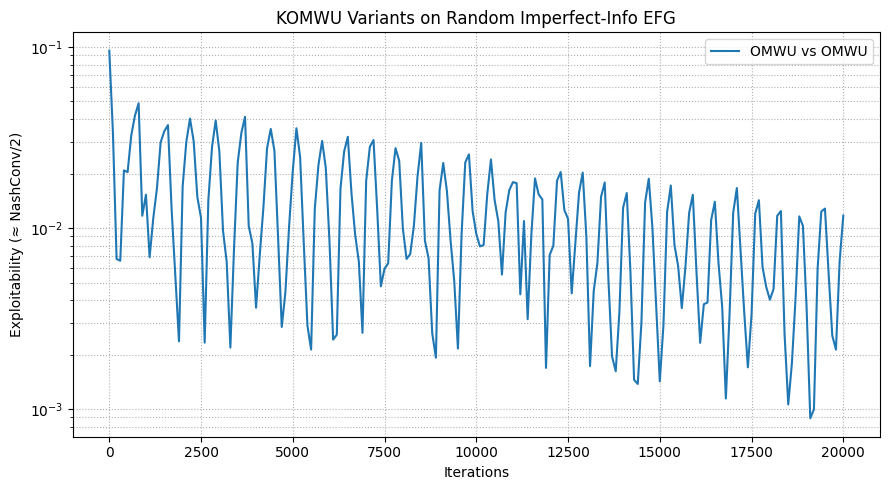

In [24]:
#@title KOMWU (Treeplex) + Variants on Random Imperfect-Info EFGs — Single-File Colab
#@markdown - Generates random EFGs with **chance** and **imperfect information** (nodes merged into infosets).
#@markdown - Implements **KOMWU** + **EO / EOO / L / DECAY** variants.
#@markdown - Tweak **ALL** hyperparameters below (infoset mode, variant, η, L, α, α_b/α_s, ρ, Kf, etc.).
from __future__ import annotations

import sys, math
from dataclasses import dataclass
from typing import List, Tuple, Dict, Optional
import numpy as np
import matplotlib.pyplot as plt

# =============== numerics ===============
def get_dtype(precision: str):
    if precision not in {"normal","precise"}:
        raise ValueError("precision must be 'normal' or 'precise'")
    return np.float64 if precision == "normal" else np.longdouble

def logsumexp_np(v: np.ndarray) -> np.floating:
    m = np.max(v)
    return m + np.log(np.sum(np.exp(v - m)))

# =============== Treeplex structure ===============
class Treeplex:
    class Infoset:
        __slots__ = ("start_sequence_id","end_sequence_id","parent_sequence_id","infoset_id")
        def __init__(self, start_seq: int, end_seq: int, parent_seq: int, infoset_id: int):
            self.start_sequence_id  = int(start_seq)
            self.end_sequence_id    = int(end_seq)
            self.parent_sequence_id = int(parent_seq)
            self.infoset_id         = int(infoset_id)

    def __init__(self, infosets: List["Treeplex.Infoset"], n_sequences_hint: Optional[int]=None):
        self.infosets: List[Treeplex.Infoset] = infosets
        self.n_infosets = len(infosets)
        if self.n_infosets == 0:
            self.root_sequence_id = 0
            self.n_sequences = 1
            self.children = [[]]
            return

        self.root_sequence_id = max(ifs.parent_sequence_id for ifs in infosets)
        if n_sequences_hint is None:
            max_action_seq = max(ifs.end_sequence_id for ifs in infosets)
            self.n_sequences = max(self.root_sequence_id, max_action_seq) + 1
        else:
            self.n_sequences = int(n_sequences_hint)

        # For each parent sequence, which infosets sprout from it?
        self.children: List[List[Treeplex.Infoset]] = [[] for _ in range(self.n_sequences)]
        for ifs in infosets:
            self.children[ifs.parent_sequence_id].append(ifs)

    def is_sf_strategy(self, x: np.ndarray) -> bool:
        if not np.all(x >= 0): return False
        if abs(float(x[self.root_sequence_id]) - 1.0) > 1e-9: return False
        for ifs in self.infosets:
            s = -float(x[ifs.parent_sequence_id])
            for seq in range(ifs.start_sequence_id, ifs.end_sequence_id + 1):
                s += float(x[seq])
            if abs(s) > 1e-9:
                return False
        return True

    def best_response_value(self, gradient: np.ndarray) -> float:
        g = np.asarray(gradient, dtype=gradient.dtype).copy()
        # infosets are bottom-up (children -> parent)
        for ifs in self.infosets:
            sl = g[ifs.start_sequence_id:ifs.end_sequence_id+1]
            g[ifs.parent_sequence_id] += np.max(sl)
        return float(g[self.root_sequence_id])

# =============== KOMWU base + variants ===============
class KomwuBase:
    """
    Base class for treeplex KOMWU-like solvers.
    Subclasses implement _direction(g_t) → d_t.
    """
    def __init__(self, tpx: Treeplex, eta: float = 0.3, dtype=None):
        self.tpx = tpx
        self.eta = float(eta)
        self.dtype = np.float64 if dtype is None else dtype
        self.b = np.zeros(self.tpx.n_sequences, dtype=self.dtype)
        self.last_gradient = np.zeros(self.tpx.n_sequences, dtype=self.dtype)
        self._hist: List[np.ndarray] = []  # g_{t-1}, g_{t-2}, ... (most recent first)
        self._prepare_topo_order()
        self._compute_x()
        self.sum_gradients = np.zeros(self.tpx.n_sequences, dtype=self.dtype)
        self.sum_ev = self.dtype(0.0)

    def next_strategy(self) -> np.ndarray:
        return self.x

    def regret(self) -> float:
        return self.tpx.best_response_value(self.sum_gradients) - float(self.sum_ev)

    def _direction(self, g_t: np.ndarray) -> np.ndarray:
        raise NotImplementedError

    def observe_gradient(self, gradient: np.ndarray):
        g_t = np.asarray(gradient, dtype=self.dtype)
        self.sum_gradients += g_t
        self.sum_ev += float(np.dot(g_t, self.next_strategy()))

        d_t = self._direction(g_t)
        self.b += self.dtype(self.eta) * d_t
        self._compute_x()

        self._hist.insert(0, g_t.copy())
        if len(self._hist) > 128:  # cap history
            self._hist.pop()
        self.last_gradient = g_t

    def _get_hist(self, k: int, default: Optional[np.ndarray]=None) -> np.ndarray:
        if k < len(self._hist): return self._hist[k]
        if default is None:
            return np.zeros(self.tpx.n_sequences, dtype=self.dtype)
        return default

    def _prepare_topo_order(self):
        # Build bottom-up order over infosets for treeplex softmax
        seq_owner = {}
        for ifs in self.tpx.infosets:
            for s in range(ifs.start_sequence_id, ifs.end_sequence_id + 1):
                seq_owner[s] = ifs.infoset_id

        adj = [[] for _ in range(self.tpx.n_infosets)]
        roots = []
        for ifs in self.tpx.infosets:
            ps = ifs.parent_sequence_id
            if ps in seq_owner:
                adj[seq_owner[ps]].append(ifs.infoset_id)
            else:
                roots.append(ifs.infoset_id)

        seen = [False]*self.tpx.n_infosets
        post = []
        sys.setrecursionlimit(10000)
        def dfs(u: int):
            if seen[u]: return
            seen[u] = True
            for v in adj[u]:
                dfs(v)
            post.append(u)
        for r in roots: dfs(r)
        for i in range(self.tpx.n_infosets):
            if not seen[i]: dfs(i)

        id2if = {ifs.infoset_id: ifs for ifs in self.tpx.infosets}
        self._post_infosets = [id2if[i] for i in post]

    def _compute_x(self):
        # Bottom-up: K_j(b)
        K_j = [None] * self.tpx.n_infosets
        for ifs in self._post_infosets:
            terms = []
            for s in range(ifs.start_sequence_id, ifs.end_sequence_id + 1):
                child_sum = self.dtype(0.0)
                for child in self.tpx.children[s]:
                    child_sum += K_j[child.infoset_id]
                terms.append(self.b[s] + child_sum)
            K_j[ifs.infoset_id] = logsumexp_np(np.asarray(terms, dtype=self.dtype))
        # Top-down: y, then x = exp(y)
        y = np.zeros(self.tpx.n_sequences, dtype=self.dtype)
        for ifs in reversed(self._post_infosets):
            Kj = K_j[ifs.infoset_id]
            y_parent = y[ifs.parent_sequence_id]
            for s in range(ifs.start_sequence_id, ifs.end_sequence_id + 1):
                child_sum = self.dtype(0.0)
                for child in self.tpx.children[s]:
                    child_sum += K_j[child.infoset_id]
                y[s] = y_parent + self.b[s] + child_sum - Kj
        self.x = np.exp(y)

        # safety projection if tiny drift shows up
        if not self.tpx.is_sf_strategy(self.x):
            for ifs in self.tpx.infosets:
                parent = ifs.parent_sequence_id
                sl = slice(ifs.start_sequence_id, ifs.end_sequence_id + 1)
                ssum = float(np.sum(self.x[sl]))
                if ssum > 0:
                    self.x[sl] *= float(self.x[parent]) / ssum
            self.x[self.tpx.root_sequence_id] = 1.0

# ---- Variants ----
class KomwuOMWU(KomwuBase):
    # d_t = 2 g_t - g_{t-1}
    def _direction(self, g_t: np.ndarray) -> np.ndarray:
        g_tm1 = self._get_hist(0)
        return self.dtype(2.0) * g_t - g_tm1

class KomwuEO(KomwuBase):
    """
    Extra Optimism.
    Two equivalent parameterizations:
      - alpha (float ≥ 1): d_t = alpha * g_t - (alpha-1) * g_{t-1}
      - L (int ≥ 1):       d_t = (L+1) * g_t - L * g_{t-1}
    """
    def __init__(self, tpx: Treeplex, eta: float=0.3, alpha: Optional[float]=None, L: Optional[int]=None, dtype=None):
        super().__init__(tpx, eta, dtype=dtype)
        self.alpha = alpha
        self.L = L
        if self.alpha is None and self.L is None:
            self.alpha = 2.0
    def _direction(self, g_t: np.ndarray) -> np.ndarray:
        g_tm1 = self._get_hist(0)
        if self.L is not None:
            return self.dtype(self.L+1) * g_t - self.dtype(self.L) * g_tm1
        alpha = self.dtype(self.alpha if self.alpha is not None else 2.0)
        return alpha * g_t - (alpha - self.dtype(1.0)) * g_tm1

class KomwuEOO(KomwuBase):
    """
    Staggered extra optimism:
      d_t = (L+1) g_t − g_{t−1} − pending_t
      pending_{t+1} = max(L−1, 0) * g_{t−1}
    """
    def __init__(self, tpx: Treeplex, eta: float=0.3, L: int=2, dtype=None):
        super().__init__(tpx, eta, dtype=dtype)
        self.L = int(max(1, L))
        self._pending = np.zeros(self.tpx.n_sequences, dtype=self.dtype)
    def _direction(self, g_t: np.ndarray) -> np.ndarray:
        g_tm1 = self._get_hist(0)
        d = self.dtype(self.L+1) * g_t - g_tm1 - self._pending
        self._pending = self.dtype(max(self.L-1, 0)) * g_tm1
        return d

class KomwuL(KomwuBase):
    """
    Windowed form:
      d_t = (L+1) g_t − ∑_{i=1}^L g_{t−i}
    """
    def __init__(self, tpx: Treeplex, eta: float=0.3, L: int=2, dtype=None):
        super().__init__(tpx, eta, dtype=dtype)
        self.L = int(max(1, L))
    def _direction(self, g_t: np.ndarray) -> np.ndarray:
        acc = np.zeros_like(g_t)
        for i in range(1, self.L+1):
            acc += self._get_hist(i-1)  # g_{t-i}
        return self.dtype(self.L+1) * g_t - acc

class KomwuDECAY(KomwuBase):
    """
    DECAY (finite-tap increments):
      d_t = alpha_b * g_t + alpha_s * sum_{j=0..Kf-1} w_j * (g_{t-j} - g_{t-j-1})
    where weights w_j are either:
      - 'geom' with rho in [0,1):   w_j ∝ (1-rho) rho^j  (normalized if normalize=True)
      - 'uniform':                  w_j = 1/Kf
    """
    def __init__(self, tpx: Treeplex, eta: float=0.3,
                 alpha_b: float=1.0, alpha_s: float=2.0, rho: float=1.0, Kf: int=2,
                 scheme: str="uniform", normalize: bool=True, dtype=None):
        super().__init__(tpx, eta, dtype=dtype)
        self.alpha_b = self.dtype(alpha_b)
        self.alpha_s = self.dtype(alpha_s)
        self.rho = float(rho)
        self.Kf = int(max(0, Kf))
        self.scheme = scheme
        self.normalize = normalize
        self._build_weights()

    def _build_weights(self):
        if self.Kf <= 0:
            self._w = np.zeros(0, dtype=self.dtype); return
        if self.scheme == "geom" and 0.0 <= self.rho < 1.0:
            w = np.array([(1.0 - self.rho) * (self.rho ** j) for j in range(self.Kf)], dtype=float)
            if self.normalize:
                s = w.sum()
                if s > 0: w = w / s
        else:
            w = np.ones(self.Kf, dtype=float) / float(self.Kf)
        self._w = np.asarray(w, dtype=self.dtype)

    def _direction(self, g_t: np.ndarray) -> np.ndarray:
        d = self.alpha_b * g_t
        if self.Kf > 0 and len(self._w) == self.Kf:
            zeros = np.zeros_like(g_t)
            inc = np.zeros_like(g_t)
            for j in range(self.Kf):
                g_t_minus_j   = g_t if j == 0 else self._get_hist(j-1, zeros)
                g_t_minus_jm1 = self._get_hist(j, zeros)
                inc += self._w[j] * (g_t_minus_j - g_t_minus_jm1)
            d = d + self.alpha_s * inc
        return d

# =============== EFG primitives ===============
@dataclass
class PayoffEntry:
    payoffs: List[float]     # [u0, u1]
    chanceFactor: float
    sequences: List[int]     # [seq0, seq1]

class Game:
    def __init__(self, tpxs: List[Treeplex], entries: List[PayoffEntry]):
        self.tpxs = tpxs
        self.payoff_matrix_entries = entries
        self.n_players = len(tpxs)
        self.payoff_matrix_nnz = len(entries)
        self.notes = "Random EFG (two-player zero-sum)."

    def utility_gradient(self, player: int, strategies: Dict[int, np.ndarray]) -> np.ndarray:
        grad = np.zeros(self.tpxs[player].n_sequences, dtype=strategies[player].dtype)
        with np.errstate(under='ignore'):  # harmless off-reach underflow
            for e in self.payoff_matrix_entries:
                reach = e.chanceFactor
                for p in range(self.n_players):
                    if p != player:
                        reach *= strategies[p][e.sequences[p]]
                grad[e.sequences[player]] += e.payoffs[player] * reach
        return grad

# =============== Random EFG builder with imperfect info ===============
class RandomEFGBuilder:
    """
    Two-player zero-sum random EFG with chance + information sets.
    Imperfect information is introduced by *sharing* an infoset across
    multiple decision nodes that have the same player's *parent sequence*.

    infosets_mode:
      - "perfect"   → new infoset at every node (no sharing).
      - "imperfect" → always share by (player, parent_seq).
      - "mixed"     → share with probability merge_prob (per visit).
    """
    def __init__(self,
                 depth: int = 4,
                 branch_min: int = 2,
                 branch_max: int = 3,
                 chance_every: int = 2,
                 chance_branches: int = 2,
                 stop_prob: float = 0.0,
                 infosets_mode: str = "imperfect",
                 merge_prob: float = 0.5,
                 seed: int = 0,
                 dtype=np.float64):
        self.depth = int(depth)
        self.branch_min = int(branch_min)
        self.branch_max = int(branch_max)
        self.chance_every = int(chance_every)
        self.chance_branches = int(chance_branches)
        self.stop_prob = float(stop_prob)
        self.infosets_mode = infosets_mode
        self.merge_prob = float(merge_prob)
        self.rng = np.random.default_rng(seed)
        self.dtype = dtype

        self.next_seq = [0, 0]
        self.infosets: List[List[Tuple[int,int,int]]] = [[], []]  # (start,end,parent)
        self.registry: List[Dict[int, Tuple[int,int,int]]] = [dict(), dict()]
        self.entries: List[PayoffEntry] = []

    def _rand_actions(self) -> int:
        return int(self.rng.integers(self.branch_min, self.branch_max + 1))

    def _rand_payoff(self) -> float:
        return float(self.rng.uniform(-1.0, 1.0))

    def _should_stop(self, depth: int) -> bool:
        if depth >= self.depth: return True
        if self.stop_prob > 0.0 and self.rng.random() < self.stop_prob: return True
        return False

    def _node_type(self, depth: int) -> str:
        if self.chance_every > 0 and (depth % (self.chance_every + 1) == 0):
            return "chance"
        return "p0" if (depth % 2 == 0) else "p1"

    def _chance_outcomes(self) -> Tuple[np.ndarray, int]:
        k = max(2, self.chance_branches)
        probs = self.rng.random(k)
        probs /= probs.sum()
        return probs.astype(self.dtype), k

    def _should_share(self) -> bool:
        if self.infosets_mode == "imperfect": return True
        if self.infosets_mode == "perfect":   return False
        return bool(self.rng.random() < self.merge_prob)

    def _get_or_create_infoset(self, p: int, parent_seq: int) -> Tuple[int,int,int]:
        # Reuse existing infoset if sharing is chosen and present
        if self._should_share() and (parent_seq in self.registry[p]):
            start, end, nA = self.registry[p][parent_seq]
            return start, end, parent_seq
        # Create a new infoset with fresh action block
        nA = self._rand_actions()
        start = self.next_seq[p]
        end   = start + nA - 1
        self.next_seq[p] += nA
        self.infosets[p].append((start, end, parent_seq))
        if self.infosets_mode in {"imperfect","mixed"}:
            self.registry[p][parent_seq] = (start, end, nA)
        return start, end, parent_seq

    def _build(self, depth: int, last_seq0: int, last_seq1: int, chance_weight: float):
        if self._should_stop(depth):
            u = self._rand_payoff()
            self.entries.append(PayoffEntry(
                payoffs=[u, -u],
                chanceFactor=chance_weight,
                sequences=[last_seq0, last_seq1]
            ))
            return

        kind = self._node_type(depth)
        if kind == "chance":
            probs, k = self._chance_outcomes()
            for j in range(k):
                self._build(depth+1, last_seq0, last_seq1, chance_weight * float(probs[j]))
            return

        p = 0 if kind == "p0" else 1
        parent_seq = last_seq0 if p == 0 else last_seq1
        start, end, _ = self._get_or_create_infoset(p, parent_seq=parent_seq)
        for s in range(start, end+1):
            if p == 0:
                self._build(depth+1, s, last_seq1, chance_weight)
            else:
                self._build(depth+1, last_seq0, s, chance_weight)

    def _finalize_treeplex(self, p: int) -> Treeplex:
        max_seq = max([end for (start,end,parent) in self.infosets[p]], default=-1)
        root_seq_id = max_seq + 1

        fixed = []
        for (start,end,parent) in self.infosets[p]:
            parent_fixed = root_seq_id if (parent == -1) else parent
            fixed.append((start,end,parent_fixed))

        # Provisional infosets with ids
        provisionals = [Treeplex.Infoset(s,e,parent,idx) for idx,(s,e,parent) in enumerate(fixed)]

        # Build adjacency: parent-infoset (via parent sequence) → child-infoset
        seq_owner: Dict[int,int] = {}
        for ifs in provisionals:
            for s in range(ifs.start_sequence_id, ifs.end_sequence_id + 1):
                seq_owner[s] = ifs.infoset_id
        adj: Dict[int,List[int]] = {ifs.infoset_id: [] for ifs in provisionals}
        roots: List[int] = []
        for ifs in provisionals:
            ps = ifs.parent_sequence_id
            if ps in seq_owner:
                adj[seq_owner[ps]].append(ifs.infoset_id)
            else:
                roots.append(ifs.infoset_id)

        # Post-order DFS (children -> parent)
        seen = {i: False for i in adj.keys()}
        post: List[int] = []
        sys.setrecursionlimit(10000)
        def dfs(u: int):
            if seen[u]: return
            seen[u] = True
            for v in adj[u]:
                dfs(v)
            post.append(u)
        for r in roots: dfs(r)
        for i in list(adj.keys()):
            if not seen[i]: dfs(i)

        # Reindex infosets in bottom-up order
        id_map = {old: new for new, old in enumerate(post)}
        infosets_sorted: List[Treeplex.Infoset] = []
        for old_id in post:
            ifs = provisionals[old_id]
            infosets_sorted.append(
                Treeplex.Infoset(ifs.start_sequence_id, ifs.end_sequence_id, ifs.parent_sequence_id, id_map[old_id])
            )
        return Treeplex(infosets_sorted, n_sequences_hint=root_seq_id+1)

    def build(self) -> Game:
        self._build(depth=0, last_seq0=-1, last_seq1=-1, chance_weight=1.0)

        tpx0 = self._finalize_treeplex(0)
        tpx1 = self._finalize_treeplex(1)

        # Replace terminal -1 with actual root sequence ids
        r0, r1 = tpx0.root_sequence_id, tpx1.root_sequence_id
        for e in self.entries:
            if e.sequences[0] == -1: e.sequences[0] = r0
            if e.sequences[1] == -1: e.sequences[1] = r1

        return Game([tpx0, tpx1], self.entries)

# =============== metrics, solver factory, runner ===============
def nash_conv_and_ev(game: Game, x: Dict[int,np.ndarray]) -> Tuple[float,float,float]:
    g0 = game.utility_gradient(0, x)
    g1 = game.utility_gradient(1, x)
    ev0 = float(np.dot(g0, x[0]))
    ev1 = float(np.dot(g1, x[1]))
    br0 = float(game.tpxs[0].best_response_value(g0))
    br1 = float(game.tpxs[1].best_response_value(g1))
    nc = (br0 - ev0) + (br1 - ev1)
    return nc, 0.5 * max(nc, 0.0), ev0  # exploitability = NashConv/2

def make_solver(variant: str, tpx: Treeplex, eta: float, DTYPE,
                L: Optional[int]=None, alpha: Optional[float]=None,
                alpha_b: Optional[float]=None, alpha_s: Optional[float]=None,
                rho: Optional[float]=None, Kf: Optional[int]=None,
                scheme: str="uniform", normalize: bool=True):
    v = (variant or "OMWU").upper()
    if v == "OMWU":
        return KomwuOMWU(tpx, eta=eta, dtype=DTYPE)
    elif v in {"EO","OMWU-EO"}:
        return KomwuEO(tpx, eta=eta, alpha=alpha, L=L, dtype=DTYPE)
    elif v in {"EOO","OMWU-EOO"}:
        return KomwuEOO(tpx, eta=eta, L=L if L is not None else 2, dtype=DTYPE)
    elif v in {"L","OMWU-L"}:
        return KomwuL(tpx, eta=eta, L=L if L is not None else 2, dtype=DTYPE)
    elif v in {"DECAY","OMWU-DECAY"}:
        return KomwuDECAY(tpx, eta=eta,
                          alpha_b=(alpha_b if alpha_b is not None else 1.0),
                          alpha_s=(alpha_s if alpha_s is not None else 2.0),
                          rho=(rho if rho is not None else 1.0),
                          Kf=(Kf if Kf is not None else 2),
                          scheme=scheme, normalize=normalize, dtype=DTYPE)
    else:
        raise ValueError(f"Unknown variant '{variant}'")

def run_experiment(
    # --- EFG shape ---
    depth=5, branch_min=2, branch_max=3,
    chance_every=2, chance_branches=3, stop_prob=0.0,
    infosets_mode="imperfect", merge_prob=0.5,
    # --- Solver / Variants (per-player override optional) ---
    row_variant="OMWU", col_variant=None,
    eta=0.4, row_eta=None, col_eta=None,
    L=None, row_L=None, col_L=None,
    alpha=None, row_alpha=None, col_alpha=None,
    alpha_b=1.0, alpha_s=2.0, rho=1.0, Kf=2, scheme="uniform", normalize=True,
    row_alpha_b=None, row_alpha_s=None, row_rho=None, row_Kf=None,
    col_alpha_b=None, col_alpha_s=None, col_rho=None, col_Kf=None, col_scheme=None, col_normalize=None,
    # --- Train / Numerics ---
    T=20000, precision="precise", seed=0, print_every=500, plot_every=100
):
    DTYPE = get_dtype(precision)
    # Strict except for harmless underflow
    np.seterr(over='raise', divide='raise', invalid='raise', under='ignore')

    builder = RandomEFGBuilder(
        depth=depth, branch_min=branch_min, branch_max=branch_max,
        chance_every=chance_every, chance_branches=chance_branches,
        stop_prob=stop_prob, infosets_mode=infosets_mode, merge_prob=merge_prob,
        seed=seed, dtype=DTYPE
    )
    game = builder.build()

    print(f"=== Random EFG built ===")
    print(f"  players           : {game.n_players}")
    print(f"  P0 infosets       : {game.tpxs[0].n_infosets}")
    print(f"  P1 infosets       : {game.tpxs[1].n_infosets}")
    print(f"  P0 sequences      : {game.tpxs[0].n_sequences} (root={game.tpxs[0].root_sequence_id})")
    print(f"  P1 sequences      : {game.tpxs[1].n_sequences} (root={game.tpxs[1].root_sequence_id})")
    print(f"  payoff nnz        : {game.payoff_matrix_nnz}")
    print(f"  notes             : {game.notes}")
    print(f"========================\n")

    if col_variant is None: col_variant = row_variant

    # resolve per-player params
    r_eta = float(row_eta if row_eta is not None else eta)
    c_eta = float(col_eta if col_eta is not None else eta)

    r_L = int(row_L if row_L is not None else (L if L is not None else 2))
    c_L = int(col_L if col_L is not None else (L if L is not None else 2))

    r_alpha = float(row_alpha if row_alpha is not None else (alpha if alpha is not None else 2.0))
    c_alpha = float(col_alpha if col_alpha is not None else (alpha if alpha is not None else 2.0))

    r_alpha_b = float(row_alpha_b if row_alpha_b is not None else alpha_b)
    r_alpha_s = float(row_alpha_s if row_alpha_s is not None else alpha_s)
    r_rho     = float(row_rho     if row_rho     is not None else rho)
    r_Kf      = int(row_Kf        if row_Kf      is not None else Kf)

    c_alpha_b = float(col_alpha_b if col_alpha_b is not None else alpha_b)
    c_alpha_s = float(col_alpha_s if col_alpha_s is not None else alpha_s)
    c_rho     = float(col_rho     if col_rho     is not None else rho)
    c_Kf      = int(col_Kf        if col_Kf      is not None else Kf)
    c_scheme  = col_scheme if col_scheme is not None else scheme
    c_normalize = bool(col_normalize if col_normalize is not None else normalize)

    # Create solvers
    row = make_solver(row_variant, game.tpxs[0], r_eta, DTYPE,
                      L=r_L, alpha=r_alpha, alpha_b=r_alpha_b, alpha_s=r_alpha_s, rho=r_rho, Kf=r_Kf,
                      scheme=scheme, normalize=normalize)
    col = make_solver(col_variant, game.tpxs[1], c_eta, DTYPE,
                      L=c_L, alpha=c_alpha, alpha_b=c_alpha_b, alpha_s=c_alpha_s, rho=c_rho, Kf=c_Kf,
                      scheme=c_scheme, normalize=c_normalize)

    times, exploits, nconvs = [], [], []
    for t in range(1, T + 1):
        strategies = {0: row.next_strategy(), 1: col.next_strategy()}
        g0 = game.utility_gradient(0, strategies)
        g1 = game.utility_gradient(1, strategies)

        row.observe_gradient(g0)
        col.observe_gradient(g1)

        if (t % plot_every) == 0 or t == 1:
            strategies = {0: row.next_strategy(), 1: col.next_strategy()}
            nc, ex, _ = nash_conv_and_ev(game, strategies)
            times.append(t); exploits.append(ex); nconvs.append(nc)

        if (t % print_every) == 0 or t == 1:
            ex = exploits[-1] if exploits else float('nan')
            nc = nconvs[-1]  if nconvs  else float('nan')
            print(f"[{row_variant}|{col_variant}] t={t:6d}  exploit={ex:.6e}  nashconv={nc:.6e}")

    if times:
        plt.figure(figsize=(9,5))
        y = np.maximum(np.asarray(exploits, dtype=float), 1e-18)
        plt.plot(np.asarray(times, dtype=float), y, label=f"{row_variant} vs {col_variant}")
        plt.yscale("log")
        plt.xlabel("Iterations"); plt.ylabel("Exploitability (≈ NashConv/2)")
        plt.title("KOMWU Variants on Random Imperfect-Info EFG")
        plt.grid(True, which="both", ls=":")
        plt.legend()
        plt.tight_layout()
        plt.show()

    return {"times": np.asarray(times), "exploit": np.asarray(exploits), "nashconv": np.asarray(nconvs)}

# ====================== Colab Runner (edit here) ======================
#@title Runner parameters
# --- EFG shape ---
depth = 6               #@param {type:"integer"}
branch_min = 3          #@param {type:"integer"}
branch_max = 4          #@param {type:"integer"}
chance_every = 2        #@param {type:"integer"}
chance_branches = 3     #@param {type:"integer"}
stop_prob = 0.0         #@param {type:"number"}

# Infoset grouping (imperfect information)
infosets_mode = "imperfect"  #@param ["perfect","imperfect","mixed"]
merge_prob = 0.7             #@param {type:"number"}

# --- Solver / variants ---
row_variant = "OMWU"         #@param ["OMWU","OMWU-EO","OMWU-EOO","OMWU-L","OMWU-DECAY"]
col_variant = "OMWU"         #@param ["OMWU","OMWU-EO","OMWU-EOO","OMWU-L","OMWU-DECAY"]

eta = 0.4                    #@param {type:"number"}
row_eta = None               #@param {type:"raw"}
col_eta = None               #@param {type:"raw"}

# EO/EOO/L parameters
L = 3                        #@param {type:"integer"}
row_L = None                 #@param {type:"raw"}
col_L = None                 #@param {type:"raw"}
alpha = 2.0                  #@param {type:"number"}  # for EO only
row_alpha = None             #@param {type:"raw"}
col_alpha = None             #@param {type:"raw"}

# DECAY parameters
alpha_b = 1.0                #@param {type:"number"}
alpha_s = 2.0                #@param {type:"number"}
rho = 1.0                    #@param {type:"number"}  # use 1.0 with scheme="uniform" to match common settings
Kf = 2                       #@param {type:"integer"}
scheme = "uniform"           #@param ["uniform","geom"]
normalize = True             #@param {type:"boolean"}

# Per-player overrides (optional; set to None to inherit)
row_alpha_b = None           #@param {type:"raw"}
row_alpha_s = None           #@param {type:"raw"}
row_rho     = None           #@param {type:"raw"}
row_Kf      = None           #@param {type:"raw"}

col_alpha_b = None           #@param {type:"raw"}
col_alpha_s = None           #@param {type:"raw"}
col_rho     = None           #@param {type:"raw"}
col_Kf      = None           #@param {type:"raw"}
col_scheme  = None           #@param {type:"raw"}
col_normalize = None         #@param {type:"raw"}

# --- Training / numerics ---
T = 20000                    #@param {type:"integer"}
precision = "precise"        #@param ["normal","precise"]
seed = 0                     #@param {type:"integer"}
print_every = 500            #@param {type:"integer"}
plot_every = 100             #@param {type:"integer"}

# Run
out = run_experiment(
    depth=depth, branch_min=branch_min, branch_max=branch_max,
    chance_every=chance_every, chance_branches=chance_branches, stop_prob=stop_prob,
    infosets_mode=infosets_mode, merge_prob=merge_prob,
    row_variant=row_variant, col_variant=col_variant,
    eta=eta, row_eta=row_eta, col_eta=col_eta,
    L=L, row_L=row_L, col_L=col_L,
    alpha=alpha, row_alpha=row_alpha, col_alpha=col_alpha,
    alpha_b=alpha_b, alpha_s=alpha_s, rho=rho, Kf=Kf, scheme=scheme, normalize=normalize,
    row_alpha_b=row_alpha_b, row_alpha_s=row_alpha_s, row_rho=row_rho, row_Kf=row_Kf,
    col_alpha_b=col_alpha_b, col_alpha_s=col_alpha_s, col_rho=col_rho, col_Kf=col_Kf,
    col_scheme=col_scheme, col_normalize=col_normalize,
    T=T, precision=precision, seed=seed, print_every=print_every, plot_every=plot_every
)


In [25]:
#########################################

In [26]:
###########################################

=== Random EFG built ===
  players           : 2
  P0 infosets       : 4
  P1 infosets       : 5
  P0 sequences      : 14 (root=13)
  P1 sequences      : 21 (root=20)
  payoff nnz        : 4320
  notes             : Random EFG (two-player zero-sum).

[OMWU                        ] t=     1  exploit=8.817448e-02  nashconv=1.763490e-01  η=4.00e-01
[OMWU-EO(α=2.0)              ] t=     1  exploit=8.817448e-02  nashconv=1.763490e-01  η=4.00e-01
[OMWU-EOO(L=3)               ] t=     1  exploit=8.622029e-02  nashconv=1.724406e-01  η=4.00e-01
[OMWU-L(L=3)                 ] t=     1  exploit=8.622029e-02  nashconv=1.724406e-01  η=4.00e-01
[OMWU-DECAY(αb=1.0,αs=2.0,Kf=3,ρ=1.0,uniform)] t=     1  exploit=8.850022e-02  nashconv=1.770004e-01  η=4.00e-01
[OMWU                        ] t=   500  exploit=2.623195e-02  nashconv=5.246389e-02  η=4.00e-01
[OMWU-EO(α=2.0)              ] t=   500  exploit=2.623195e-02  nashconv=5.246389e-02  η=4.00e-01
[OMWU-EOO(L=3)               ] t=   500  exploit=5.650

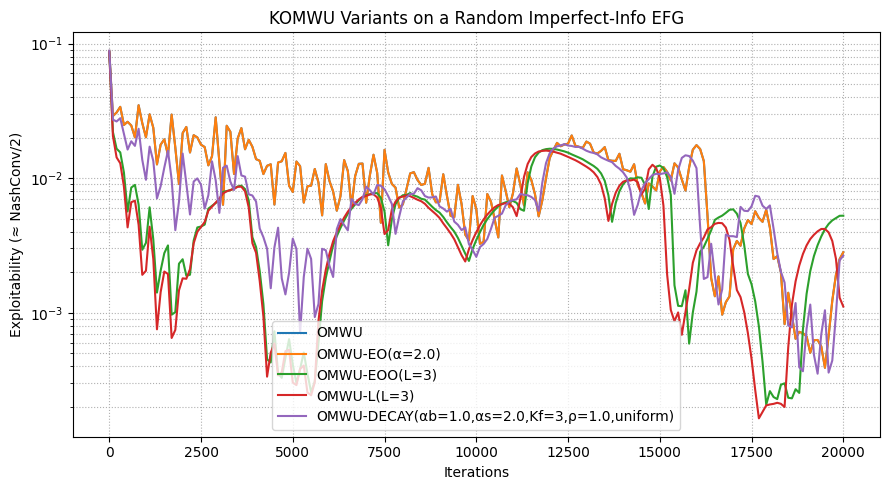

In [1]:
#@title KOMWU Treeplex — Run Multiple Variants Together (clean config style)
#@markdown - **ALGOS** holds only variant names.
#@markdown - **VARIANT_CFG** holds per-variant hyperparameters.
#@markdown - Random imperfect-information EFG with chance; entropic Treeplex map; stable numerics.

from __future__ import annotations
import sys, math
from dataclasses import dataclass
from typing import List, Tuple, Dict, Optional
import numpy as np
import matplotlib.pyplot as plt

# ============================ VARIANTS & CONFIG ============================
# Put only names in ALGOS. Configure each under VARIANT_CFG.
ALGOS = ["OMWU", "OMWU-EO", "OMWU-EOO", "OMWU-L", "OMWU-DECAY"]  # edit this list

VARIANT_CFG: Dict[str, Dict] = {
    "OMWU":       {"eta": 0.40},
    "OMWU-EO":    {"eta": 0.40, "alpha": 2.0},     # or use "L": 3 (if you prefer breadth form)
    "OMWU-EOO":   {"eta": 0.40, "L": 3},
    "OMWU-L":     {"eta": 0.40, "L": 3},
    "OMWU-DECAY": {"eta": 0.40, "alpha_b": 1.0, "alpha_s": 2.0, "rho": 1.0, "Kf": 3,
                   "scheme": "uniform", "normalize": True},
}

# ============================ numerics ============================
def get_dtype(precision: str):
    if precision not in {"normal","precise"}:
        raise ValueError("precision must be 'normal' or 'precise'")
    return np.float64 if precision == "normal" else np.longdouble

def logsumexp_np(v: np.ndarray) -> np.floating:
    m = np.max(v)
    return m + np.log(np.sum(np.exp(v - m)))

# ============================ Treeplex ============================
class Treeplex:
    class Infoset:
        __slots__ = ("start_sequence_id","end_sequence_id","parent_sequence_id","infoset_id")
        def __init__(self, start_seq: int, end_seq: int, parent_seq: int, infoset_id: int):
            self.start_sequence_id  = int(start_seq)
            self.end_sequence_id    = int(end_seq)
            self.parent_sequence_id = int(parent_seq)
            self.infoset_id         = int(infoset_id)

    def __init__(self, infosets: List["Treeplex.Infoset"], n_sequences_hint: Optional[int]=None):
        self.infosets: List[Treeplex.Infoset] = infosets
        self.n_infosets = len(infosets)
        if self.n_infosets == 0:
            self.root_sequence_id = 0
            self.n_sequences = 1
            self.children = [[]]
            return

        self.root_sequence_id = max(ifs.parent_sequence_id for ifs in infosets)
        if n_sequences_hint is None:
            max_action_seq = max(ifs.end_sequence_id for ifs in infosets)
            self.n_sequences = max(self.root_sequence_id, max_action_seq) + 1
        else:
            self.n_sequences = int(n_sequences_hint)

        self.children: List[List[Treeplex.Infoset]] = [[] for _ in range(self.n_sequences)]
        for ifs in infosets:
            self.children[ifs.parent_sequence_id].append(ifs)

    def is_sf_strategy(self, x: np.ndarray) -> bool:
        if not np.all(x >= 0): return False
        if abs(float(x[self.root_sequence_id]) - 1.0) > 1e-9: return False
        for ifs in self.infosets:
            s = -float(x[ifs.parent_sequence_id])
            for seq in range(ifs.start_sequence_id, ifs.end_sequence_id + 1):
                s += float(x[seq])
            if abs(s) > 1e-9:
                return False
        return True

    def best_response_value(self, gradient: np.ndarray) -> float:
        g = np.asarray(gradient, dtype=gradient.dtype).copy()
        for ifs in self.infosets:  # bottom-up order (children → parent)
            sl = g[ifs.start_sequence_id:ifs.end_sequence_id+1]
            g[ifs.parent_sequence_id] += np.max(sl)
        return float(g[self.root_sequence_id])

# ============================ KOMWU base + variants ============================
class KomwuBase:
    """Base class; subclasses override _direction(g_t)."""
    def __init__(self, tpx: Treeplex, eta: float = 0.3, dtype=None):
        self.tpx = tpx
        self.eta = float(eta)
        self.dtype = np.float64 if dtype is None else dtype
        self.b = np.zeros(self.tpx.n_sequences, dtype=self.dtype)
        self.last_gradient = np.zeros(self.tpx.n_sequences, dtype=self.dtype)
        self._hist: List[np.ndarray] = []  # most-recent first
        self._prepare_topo()
        self._compute_x()
        # regret diagnostics (optional)
        self.sum_gradients = np.zeros(self.tpx.n_sequences, dtype=self.dtype)
        self.sum_ev = self.dtype(0.0)

    def next_strategy(self) -> np.ndarray:
        return self.x

    def regret(self) -> float:
        return self.tpx.best_response_value(self.sum_gradients) - float(self.sum_ev)

    def observe_gradient(self, gradient: np.ndarray):
        g_t = np.asarray(gradient, dtype=self.dtype)
        self.sum_gradients += g_t
        self.sum_ev += float(np.dot(g_t, self.next_strategy()))
        d_t = self._direction(g_t)
        self.b += self.dtype(self.eta) * d_t
        self._compute_x()
        self._hist.insert(0, g_t.copy())
        if len(self._hist) > 256: self._hist.pop()
        self.last_gradient = g_t

    # override in subclasses
    def _direction(self, g_t: np.ndarray) -> np.ndarray:
        raise NotImplementedError

    def _get_hist(self, k: int, default_zero: Optional[np.ndarray]=None) -> np.ndarray:
        if k < len(self._hist): return self._hist[k]
        if default_zero is None:
            return np.zeros(self.tpx.n_sequences, dtype=self.dtype)
        return default_zero

    # treeplex mapping
    def _prepare_topo(self):
        seq_owner = {}
        for ifs in self.tpx.infosets:
            for s in range(ifs.start_sequence_id, ifs.end_sequence_id + 1):
                seq_owner[s] = ifs.infoset_id
        adj = [[] for _ in range(self.tpx.n_infosets)]
        roots = []
        for ifs in self.tpx.infosets:
            ps = ifs.parent_sequence_id
            if ps in seq_owner:
                adj[seq_owner[ps]].append(ifs.infoset_id)
            else:
                roots.append(ifs.infoset_id)
        seen = [False]*self.tpx.n_infosets
        post = []
        sys.setrecursionlimit(10000)
        def dfs(u: int):
            if seen[u]: return
            seen[u] = True
            for v in adj[u]:
                dfs(v)
            post.append(u)
        for r in roots: dfs(r)
        for i in range(self.tpx.n_infosets):
            if not seen[i]: dfs(i)
        id2if = {ifs.infoset_id: ifs for ifs in self.tpx.infosets}
        self._post_infosets = [id2if[i] for i in post]  # children→parent order

    def _compute_x(self):
        # bottom-up K_j
        K_j = [None] * self.tpx.n_infosets
        for ifs in self._post_infosets:
            terms = []
            for s in range(ifs.start_sequence_id, ifs.end_sequence_id + 1):
                child_sum = self.dtype(0.0)
                for child in self.tpx.children[s]:
                    child_sum += K_j[child.infoset_id]
                terms.append(self.b[s] + child_sum)
            K_j[ifs.infoset_id] = logsumexp_np(np.asarray(terms, dtype=self.dtype))
        # top-down y
        y = np.zeros(self.tpx.n_sequences, dtype=self.dtype)
        for ifs in reversed(self._post_infosets):
            Kj = K_j[ifs.infoset_id]
            y_parent = y[ifs.parent_sequence_id]
            for s in range(ifs.start_sequence_id, ifs.end_sequence_id + 1):
                child_sum = self.dtype(0.0)
                for child in self.tpx.children[s]:
                    child_sum += K_j[child.infoset_id]
                y[s] = y_parent + self.b[s] + child_sum - Kj
        self.x = np.exp(y)

        # tiny safety projection if drift
        if not self.tpx.is_sf_strategy(self.x):
            for ifs in self.tpx.infosets:
                p = ifs.parent_sequence_id
                sl = slice(ifs.start_sequence_id, ifs.end_sequence_id+1)
                ssum = float(np.sum(self.x[sl]))
                if ssum > 0:
                    self.x[sl] *= float(self.x[p]) / ssum
            self.x[self.tpx.root_sequence_id] = 1.0

# ---- concrete variants ----
class KomwuOMWU(KomwuBase):
    # d_t = 2 g_t - g_{t-1}
    def _direction(self, g_t: np.ndarray) -> np.ndarray:
        return self.dtype(2.0) * g_t - self.last_gradient

class KomwuEO(KomwuBase):
    """
    Extra optimism:
      α-form: d_t = α g_t - (α-1) g_{t-1}
      L-form: d_t = (L+1) g_t - L g_{t-1}
    """
    def __init__(self, tpx: Treeplex, eta: float=0.3, L: Optional[int]=None, alpha: Optional[float]=None, dtype=None):
        super().__init__(tpx, eta, dtype=dtype)
        self.L = None if L is None else int(L)
        self.alpha = None if alpha is None else float(alpha)
        if self.L is None and self.alpha is None:
            self.alpha = 2.0
    def _direction(self, g_t: np.ndarray) -> np.ndarray:
        g_tm1 = self.last_gradient
        if self.L is not None:
            return self.dtype(self.L+1) * g_t - self.dtype(self.L) * g_tm1
        a = self.dtype(self.alpha)
        return a * g_t - (a - self.dtype(1.0)) * g_tm1

class KomwuEOO(KomwuBase):
    """
    Staggered extra optimism:
      d_t = (L+1) g_t - g_{t-1} - pending_t
      pending_{t+1} = max(L-1,0) * g_{t-1}
    """
    def __init__(self, tpx: Treeplex, eta: float=0.3, L: int=2, dtype=None):
        super().__init__(tpx, eta, dtype=dtype)
        self.L = int(max(1, L))
        self._pending = np.zeros(self.tpx.n_sequences, dtype=self.dtype)
    def _direction(self, g_t: np.ndarray) -> np.ndarray:
        g_tm1 = self.last_gradient
        d = self.dtype(self.L+1) * g_t - g_tm1 - self._pending
        self._pending = self.dtype(max(self.L-1,0)) * g_tm1
        return d

class KomwuL(KomwuBase):
    """
    Windowed:
      d_t = (L+1) g_t - sum_{i=1}^L g_{t-i}
    """
    def __init__(self, tpx: Treeplex, eta: float=0.3, L: int=2, dtype=None):
        super().__init__(tpx, eta, dtype=dtype)
        self.L = int(max(1, L))
        self._sum_hist = np.zeros(self.tpx.n_sequences, dtype=self.dtype)
    def _direction(self, g_t: np.ndarray) -> np.ndarray:
        d = self.dtype(self.L+1) * g_t - self._sum_hist
        self._sum_hist += g_t
        if len(self._hist) >= self.L:
            self._sum_hist -= self._hist[self.L-1]
        return d

class KomwuDECAY(KomwuBase):
    """
    DECAY (finite-tap increments):
      d_t = α_b g_t + α_s ∑_{j=0}^{Kf-1} w_j (g_{t-j} - g_{t-j-1})
    with weights uniform (default) or geometric (rho ∈ [0,1)).
    """
    def __init__(self, tpx: Treeplex, eta: float=0.3,
                 alpha_b: float=1.0, alpha_s: float=2.0, Kf: int=2, rho: float=1.0,
                 scheme: str="uniform", normalize: bool=True, dtype=None):
        super().__init__(tpx, eta, dtype=dtype)
        self.alpha_b = self.dtype(alpha_b)
        self.alpha_s = self.dtype(alpha_s)
        self.Kf = int(max(0, Kf))
        self.rho = float(rho)
        self.scheme = scheme
        self.normalize = normalize
        self._build_weights()
    def _build_weights(self):
        if self.Kf <= 0:
            self._w = np.zeros(0, dtype=self.dtype); return
        if self.scheme == "geom" and 0.0 <= self.rho < 1.0:
            w = np.array([(1.0 - self.rho) * (self.rho ** j) for j in range(self.Kf)], dtype=float)
            if self.normalize:
                s = w.sum()
                if s > 0: w = w / s
        else:
            w = np.ones(self.Kf, dtype=float) / float(self.Kf)
        self._w = np.asarray(w, dtype=self.dtype)
    def _direction(self, g_t: np.ndarray) -> np.ndarray:
        d = self.alpha_b * g_t
        if self.Kf > 0:
            zeros = np.zeros_like(g_t)
            inc = np.zeros_like(g_t)
            for j in range(self.Kf):
                g_t_j   = g_t if j == 0 else self._get_hist(j-1, zeros)
                g_t_jm1 = self._get_hist(j, zeros)
                inc += self._w[j] * (g_t_j - g_t_jm1)
            d = d + self.alpha_s * inc
        return d

# ============================ EFG primitives ============================
@dataclass
class PayoffEntry:
    payoffs: List[float]
    chanceFactor: float
    sequences: List[int]

class Game:
    def __init__(self, tpxs: List[Treeplex], entries: List[PayoffEntry]):
        self.tpxs = tpxs
        self.payoff_matrix_entries = entries
        self.n_players = len(tpxs)
        self.payoff_matrix_nnz = len(entries)
        self.notes = "Random EFG (two-player zero-sum)."
    def utility_gradient(self, player: int, strategies: Dict[int,np.ndarray]) -> np.ndarray:
        grad = np.zeros(self.tpxs[player].n_sequences, dtype=strategies[player].dtype)
        # Underflow on off-reach products is harmless; keep other errors strict
        with np.errstate(under='ignore'):
            for e in self.payoff_matrix_entries:
                reach = e.chanceFactor
                for p in range(self.n_players):
                    if p != player:
                        reach *= strategies[p][e.sequences[p]]
                grad[e.sequences[player]] += e.payoffs[player] * reach
        return grad

# ========== Random EFG builder (chance + imperfect-information infosets) ==========
class RandomEFGBuilder:
    """
    Two-player zero-sum EFG with chance and imperfect information.
    Infosets can share multiple nodes by (player, parent_sequence).
    modes: "perfect" | "imperfect" | "mixed" (probabilistic sharing).
    """
    def __init__(self,
                 depth: int = 5,
                 branch_min: int = 2,
                 branch_max: int = 3,
                 chance_every: int = 2,
                 chance_branches: int = 3,
                 stop_prob: float = 0.0,
                 infosets_mode: str = "imperfect",
                 merge_prob: float = 0.6,
                 seed: int = 0,
                 dtype=np.float64):
        self.depth = int(depth)
        self.branch_min = int(branch_min)
        self.branch_max = int(branch_max)
        self.chance_every = int(chance_every)
        self.chance_branches = int(chance_branches)
        self.stop_prob = float(stop_prob)
        self.infosets_mode = infosets_mode
        self.merge_prob = float(merge_prob)
        self.rng = np.random.default_rng(seed)
        self.dtype = dtype

        self.next_seq = [0, 0]
        self.infosets: List[List[Tuple[int,int,int]]] = [[], []]  # (start,end,parent)
        self.registry: List[Dict[int, Tuple[int,int,int]]] = [dict(), dict()]
        self.entries: List[PayoffEntry] = []

    def _rand_actions(self) -> int:
        return int(self.rng.integers(self.branch_min, self.branch_max + 1))
    def _rand_payoff(self) -> float:
        return float(self.rng.uniform(-1.0, 1.0))
    def _should_stop(self, depth: int) -> bool:
        if depth >= self.depth: return True
        if self.stop_prob > 0 and self.rng.random() < self.stop_prob: return True
        return False
    def _node_type(self, depth: int) -> str:
        if self.chance_every > 0 and (depth % (self.chance_every + 1) == 0):
            return "chance"
        return "p0" if (depth % 2 == 0) else "p1"
    def _chance_outcomes(self) -> Tuple[np.ndarray, int]:
        k = max(2, self.chance_branches)
        probs = self.rng.random(k); probs /= probs.sum()
        return probs.astype(self.dtype), k
    def _should_share(self) -> bool:
        if self.infosets_mode == "imperfect": return True
        if self.infosets_mode == "perfect":   return False
        return bool(self.rng.random() < self.merge_prob)

    def _get_or_create_infoset(self, p: int, parent_seq: int) -> Tuple[int,int,int]:
        # Reuse infoset by (player, parent_seq) if sharing is selected
        if self._should_share() and (parent_seq in self.registry[p]):
            start, end, _ = self.registry[p][parent_seq]
            return start, end, parent_seq
        nA = self._rand_actions()
        start = self.next_seq[p]; end = start + nA - 1
        self.next_seq[p] += nA
        self.infosets[p].append((start, end, parent_seq))
        if self.infosets_mode in {"imperfect","mixed"}:
            self.registry[p][parent_seq] = (start, end, nA)
        return start, end, parent_seq

    def _build(self, depth: int, last_seq0: int, last_seq1: int, chance_weight: float):
        if self._should_stop(depth):
            u = self._rand_payoff()
            self.entries.append(PayoffEntry([u, -u], chance_weight, [last_seq0, last_seq1]))
            return
        kind = self._node_type(depth)
        if kind == "chance":
            probs, k = self._chance_outcomes()
            for j in range(k):
                self._build(depth+1, last_seq0, last_seq1, chance_weight * float(probs[j]))
            return
        p = 0 if kind == "p0" else 1
        parent_seq = last_seq0 if p == 0 else last_seq1
        start, end, _ = self._get_or_create_infoset(p, parent_seq)
        for s in range(start, end+1):
            if p == 0: self._build(depth+1, s, last_seq1, chance_weight)
            else:      self._build(depth+1, last_seq0, s, chance_weight)

    def _finalize_treeplex(self, p: int) -> Treeplex:
        max_seq = max([end for (start,end,parent) in self.infosets[p]], default=-1)
        root_seq_id = max_seq + 1
        fixed = []
        for (start,end,parent) in self.infosets[p]:
            fixed.append((start, end, (root_seq_id if parent == -1 else parent)))
        prov = [Treeplex.Infoset(s,e,parent,idx) for idx,(s,e,parent) in enumerate(fixed)]

        seq_owner: Dict[int,int] = {}
        for ifs in prov:
            for s in range(ifs.start_sequence_id, ifs.end_sequence_id+1):
                seq_owner[s] = ifs.infoset_id
        adj: Dict[int,List[int]] = {ifs.infoset_id: [] for ifs in prov}
        roots: List[int] = []
        for ifs in prov:
            ps = ifs.parent_sequence_id
            if ps in seq_owner: adj[seq_owner[ps]].append(ifs.infoset_id)
            else: roots.append(ifs.infoset_id)

        seen = {i: False for i in adj}
        post: List[int] = []
        sys.setrecursionlimit(10000)
        def dfs(u: int):
            if seen[u]: return
            seen[u] = True
            for v in adj[u]: dfs(v)
            post.append(u)
        for r in roots: dfs(r)
        for i in list(adj.keys()):
            if not seen[i]: dfs(i)

        id_map = {old:new for new,old in enumerate(post)}
        infosets_sorted = []
        for old in post:
            ifs = prov[old]
            infosets_sorted.append(
                Treeplex.Infoset(ifs.start_sequence_id, ifs.end_sequence_id, ifs.parent_sequence_id, id_map[old])
            )
        return Treeplex(infosets_sorted, n_sequences_hint=root_seq_id+1)

    def build(self) -> Game:
        self._build(0, -1, -1, 1.0)
        tpx0 = self._finalize_treeplex(0)
        tpx1 = self._finalize_treeplex(1)
        r0, r1 = tpx0.root_sequence_id, tpx1.root_sequence_id
        for e in self.entries:
            if e.sequences[0] == -1: e.sequences[0] = r0
            if e.sequences[1] == -1: e.sequences[1] = r1
        return Game([tpx0, tpx1], self.entries)

# ============================ metrics & factory ============================
def nash_conv_and_ev(game: Game, x: Dict[int,np.ndarray]) -> Tuple[float,float,float]:
    g0 = game.utility_gradient(0, x)
    g1 = game.utility_gradient(1, x)
    ev0 = float(np.dot(g0, x[0]))
    ev1 = float(np.dot(g1, x[1]))
    br0 = float(game.tpxs[0].best_response_value(g0))
    br1 = float(game.tpxs[1].best_response_value(g1))
    nconv = (br0 - ev0) + (br1 - ev1)
    return nconv, 0.5 * max(nconv, 0.0), ev0  # exploitability = NashConv/2

def make_solver(name: str, cfg: Dict, tpx: Treeplex, DTYPE):
    v = name.strip().upper().replace("KOMWU","OMWU")
    eta = float(cfg.get("eta", 0.4))
    if v == "OMWU":
        return f"OMWU", KomwuOMWU(tpx, eta=eta, dtype=DTYPE)

    if v in {"OMWU-EO","EO"}:
        # Prefer alpha if provided; else L
        alpha = cfg.get("alpha", None)
        L = cfg.get("L", None)
        if alpha is not None:
            return f"OMWU-EO(α={alpha})", KomwuEO(tpx, eta=eta, alpha=float(alpha), L=None, dtype=DTYPE)
        L = int(L if L is not None else 2)
        return f"OMWU-EO(L={L})", KomwuEO(tpx, eta=eta, L=L, alpha=None, dtype=DTYPE)

    if v in {"OMWU-EOO","EOO"}:
        L = int(cfg.get("L", 2))
        return f"OMWU-EOO(L={L})", KomwuEOO(tpx, eta=eta, L=L, dtype=DTYPE)

    if v in {"OMWU-L","L"}:
        L = int(cfg.get("L", 2))
        return f"OMWU-L(L={L})", KomwuL(tpx, eta=eta, L=L, dtype=DTYPE)

    if v in {"OMWU-DECAY","DECAY"}:
        ab  = float(cfg.get("alpha_b", 1.0))
        aS  = float(cfg.get("alpha_s", 2.0))
        Kf  = int(cfg.get("Kf", 2))
        rho = float(cfg.get("rho", 1.0))
        scheme = str(cfg.get("scheme", "uniform")).lower()
        normalize = bool(cfg.get("normalize", True))
        label = f"OMWU-DECAY(αb={ab},αs={aS},Kf={Kf},ρ={rho},{scheme})"
        return label, KomwuDECAY(tpx, eta=eta, alpha_b=ab, alpha_s=aS, Kf=Kf, rho=rho,
                                 scheme=scheme, normalize=normalize, dtype=DTYPE)

    raise ValueError(f"Unknown variant '{name}'")

# ============================ multi-variant runner ============================
def run_all_variants(
    # ---- EFG shape ----
    depth=5, branch_min=2, branch_max=3,
    chance_every=2, chance_branches=3, stop_prob=0.0,
    infosets_mode="imperfect", merge_prob=0.7,
    # ---- Numerics / train ----
    T=20000, eta_global=None, precision="precise", seed=0, print_every=500, plot_every=100
):
    DTYPE = get_dtype(precision)
    np.seterr(over='raise', divide='raise', invalid='raise', under='ignore')
    rng = np.random.default_rng(seed)

    # Build one shared game
    builder = RandomEFGBuilder(
        depth=depth, branch_min=branch_min, branch_max=branch_max,
        chance_every=chance_every, chance_branches=chance_branches,
        stop_prob=stop_prob, infosets_mode=infosets_mode, merge_prob=merge_prob,
        seed=seed, dtype=DTYPE
    )
    game = builder.build()
    print(f"=== Random EFG built ===")
    print(f"  players           : {game.n_players}")
    print(f"  P0 infosets       : {game.tpxs[0].n_infosets}")
    print(f"  P1 infosets       : {game.tpxs[1].n_infosets}")
    print(f"  P0 sequences      : {game.tpxs[0].n_sequences} (root={game.tpxs[0].root_sequence_id})")
    print(f"  P1 sequences      : {game.tpxs[1].n_sequences} (root={game.tpxs[1].root_sequence_id})")
    print(f"  payoff nnz        : {game.payoff_matrix_nnz}")
    print(f"  notes             : {game.notes}")
    print(f"========================\n")

    # Instantiate solvers per variant (self-play for each)
    bundles = []  # (label, row_solver, col_solver)
    for name in ALGOS:
        if name not in VARIANT_CFG:
            raise ValueError(f"Variant '{name}' missing in VARIANT_CFG.")
        cfg = dict(VARIANT_CFG[name])
        if eta_global is not None:
            cfg["eta"] = float(eta_global)
        label_row, row = make_solver(name, cfg, game.tpxs[0], DTYPE)
        label_col, col = make_solver(name, cfg, game.tpxs[1], DTYPE)
        assert label_row == label_col
        label = label_row
        # tiny jitter to break perfect symmetry
        row.b += np.asarray(rng.normal(0, 1e-12, size=row.b.shape), dtype=DTYPE)
        col.b += np.asarray(rng.normal(0, 1e-12, size=col.b.shape), dtype=DTYPE)
        row._compute_x(); col._compute_x()
        bundles.append((label, row, col))

    curves = {label: {"times": [], "exploit": [], "nashconv": []} for (label,_,_) in bundles}

    # Train all bundles on the same game
    for t in range(1, T+1):
        for (label, row, col) in bundles:
            strategies = {0: row.next_strategy(), 1: col.next_strategy()}
            g0 = game.utility_gradient(0, strategies)
            g1 = game.utility_gradient(1, strategies)
            row.observe_gradient(g0)
            col.observe_gradient(g1)

            if (t % plot_every) == 0 or t == 1:
                strategies = {0: row.next_strategy(), 1: col.next_strategy()}
                nc, ex, _ = nash_conv_and_ev(game, strategies)
                curves[label]["times"].append(t)
                curves[label]["exploit"].append(ex)
                curves[label]["nashconv"].append(nc)

            if (t % print_every) == 0 or t == 1:
                ex = curves[label]["exploit"][-1] if curves[label]["exploit"] else float('nan')
                nc = curves[label]["nashconv"][-1] if curves[label]["nashconv"] else float('nan')
                print(f"[{label:28s}] t={t:6d}  exploit={ex:.6e}  nashconv={nc:.6e}  η={VARIANT_CFG[name]['eta'] if eta_global is None else eta_global:.2e}")

    # Plot
    if curves:
        plt.figure(figsize=(9,5))
        for label, data in curves.items():
            if not data["times"]: continue
            xs = np.asarray(data["times"], dtype=float)
            ys = np.maximum(np.asarray(data["exploit"], dtype=float), 1e-18)
            plt.plot(xs, ys, label=label)
        plt.yscale("log")
        plt.xlabel("Iterations"); plt.ylabel("Exploitability (≈ NashConv/2)")
        plt.title("KOMWU Variants on a Random Imperfect-Info EFG")
        plt.grid(True, which="both", ls=":")
        plt.legend()
        plt.tight_layout()
        plt.show()

    return curves

# ============================ Runner (edit here) ============================
#@title Run all variants (edit lists/dicts above as needed)
# ---- Game shape ----
depth = 7               #@param {type:"integer"}
branch_min = 3          #@param {type:"integer"}
branch_max = 4          #@param {type:"integer"}
chance_every = 2        #@param {type:"integer"}
chance_branches = 3     #@param {type:"integer"}
stop_prob = 0.0         #@param {type:"number"}
infosets_mode = "imperfect"  #@param ["perfect","imperfect","mixed"]
merge_prob = 0.7             #@param {type:"number"}

# ---- Training / numerics ----
T = 20000                    #@param {type:"integer"}
precision = "precise"        #@param ["normal","precise"]
seed = 10                     #@param {type:"integer"}
print_every = 500            #@param {type:"integer"}
plot_every = 100             #@param {type:"integer"}
eta_global = None            #@param {type:"raw"}  # set a float to override all per-variant etas

curves = run_all_variants(
    depth=depth, branch_min=branch_min, branch_max=branch_max,
    chance_every=chance_every, chance_branches=chance_branches, stop_prob=stop_prob,
    infosets_mode=infosets_mode, merge_prob=merge_prob,
    T=T, eta_global=eta_global, precision=precision, seed=seed,
    print_every=print_every, plot_every=plot_every
)


In [31]:
###############################

In [1]:
#@title KOMWU Treeplex — Run Multiple Variants Together (now prints tree info first)
#@markdown - **ALGOS** holds only variant names.
#@markdown - **VARIANT_CFG** holds per-variant hyperparameters.
#@markdown - Random imperfect-information EFG with chance; entropic Treeplex map; stable numerics.
#@markdown - Calls `describe_game(game)` **before** training to show the treeplex structure.

from __future__ import annotations
import sys, math
from dataclasses import dataclass
from typing import List, Tuple, Dict, Optional
import numpy as np
import matplotlib.pyplot as plt

# ============================ VARIANTS & CONFIG ============================
# Put only names in ALGOS. Configure each under VARIANT_CFG.
ALGOS = ["OMWU", "OMWU-EO", "OMWU-EOO", "OMWU-L", "OMWU-DECAY"]  # edit this list

VARIANT_CFG: Dict[str, Dict] = {
    "OMWU":       {"eta": 0.40},
    "OMWU-EO":    {"eta": 0.40, "L": 4.0},     # or use "L": 3 instead of "alpha"
    "OMWU-EOO":   {"eta": 0.40, "L": 4},
    "OMWU-L":     {"eta": 0.40, "L": 4},
    "OMWU-DECAY": {"eta": 0.40, "alpha_b": 1.0, "alpha_s": 2.0, "rho": 1.0, "Kf": 3,
                   "scheme": "uniform", "normalize": True},
}

# ============================ numerics ============================
def get_dtype(precision: str):
    if precision not in {"normal","precise"}:
        raise ValueError("precision must be 'normal' or 'precise'")
    return np.float64 if precision == "normal" else np.longdouble

def logsumexp_np(v: np.ndarray) -> np.floating:
    m = np.max(v)
    return m + np.log(np.sum(np.exp(v - m)))

# ============================ Treeplex ============================
class Treeplex:
    class Infoset:
        __slots__ = ("start_sequence_id","end_sequence_id","parent_sequence_id","infoset_id")
        def __init__(self, start_seq: int, end_seq: int, parent_seq: int, infoset_id: int):
            self.start_sequence_id  = int(start_seq)
            self.end_sequence_id    = int(end_seq)
            self.parent_sequence_id = int(parent_seq)
            self.infoset_id         = int(infoset_id)

    def __init__(self, infosets: List["Treeplex.Infoset"], n_sequences_hint: Optional[int]=None):
        self.infosets: List[Treeplex.Infoset] = infosets
        self.n_infosets = len(infosets)
        if self.n_infosets == 0:
            self.root_sequence_id = 0
            self.n_sequences = 1
            self.children = [[]]
            return

        self.root_sequence_id = max(ifs.parent_sequence_id for ifs in infosets)
        if n_sequences_hint is None:
            max_action_seq = max(ifs.end_sequence_id for ifs in infosets)
            self.n_sequences = max(self.root_sequence_id, max_action_seq) + 1
        else:
            self.n_sequences = int(n_sequences_hint)

        self.children: List[List[Treeplex.Infoset]] = [[] for _ in range(self.n_sequences)]
        for ifs in infosets:
            self.children[ifs.parent_sequence_id].append(ifs)

    def is_sf_strategy(self, x: np.ndarray) -> bool:
        if not np.all(x >= 0): return False
        if abs(float(x[self.root_sequence_id]) - 1.0) > 1e-9: return False
        for ifs in self.infosets:
            s = -float(x[ifs.parent_sequence_id])
            for seq in range(ifs.start_sequence_id, ifs.end_sequence_id + 1):
                s += float(x[seq])
            if abs(s) > 1e-9:
                return False
        return True

    def best_response_value(self, gradient: np.ndarray) -> float:
        g = np.asarray(gradient, dtype=gradient.dtype).copy()
        for ifs in self.infosets:  # bottom-up order (children → parent)
            sl = g[ifs.start_sequence_id:ifs.end_sequence_id+1]
            g[ifs.parent_sequence_id] += np.max(sl)
        return float(g[self.root_sequence_id])

# ============================ KOMWU base + variants ============================
class KomwuBase:
    """Base class; subclasses override _direction(g_t)."""
    def __init__(self, tpx: Treeplex, eta: float = 0.3, dtype=None):
        self.tpx = tpx
        self.eta = float(eta)
        self.dtype = np.float64 if dtype is None else dtype
        self.b = np.zeros(self.tpx.n_sequences, dtype=self.dtype)
        self.last_gradient = np.zeros(self.tpx.n_sequences, dtype=self.dtype)
        self._hist: List[np.ndarray] = []  # most-recent first
        self._prepare_topo()
        self._compute_x()
        # regret diagnostics (optional)
        self.sum_gradients = np.zeros(self.tpx.n_sequences, dtype=self.dtype)
        self.sum_ev = self.dtype(0.0)

    def next_strategy(self) -> np.ndarray:
        return self.x

    def regret(self) -> float:
        return self.tpx.best_response_value(self.sum_gradients) - float(self.sum_ev)

    def observe_gradient(self, gradient: np.ndarray):
        g_t = np.asarray(gradient, dtype=self.dtype)
        self.sum_gradients += g_t
        self.sum_ev += float(np.dot(g_t, self.next_strategy()))
        d_t = self._direction(g_t)
        self.b += self.dtype(self.eta) * d_t
        self._compute_x()
        self._hist.insert(0, g_t.copy())
        if len(self._hist) > 256: self._hist.pop()
        self.last_gradient = g_t

    # override in subclasses
    def _direction(self, g_t: np.ndarray) -> np.ndarray:
        raise NotImplementedError

    def _get_hist(self, k: int, default_zero: Optional[np.ndarray]=None) -> np.ndarray:
        if k < len(self._hist): return self._hist[k]
        if default_zero is None:
            return np.zeros(self.tpx.n_sequences, dtype=self.dtype)
        return default_zero

    # treeplex mapping
    def _prepare_topo(self):
        seq_owner = {}
        for ifs in self.tpx.infosets:
            for s in range(ifs.start_sequence_id, ifs.end_sequence_id + 1):
                seq_owner[s] = ifs.infoset_id
        adj = [[] for _ in range(self.tpx.n_infosets)]
        roots = []
        for ifs in self.tpx.infosets:
            ps = ifs.parent_sequence_id
            if ps in seq_owner:
                adj[seq_owner[ps]].append(ifs.infoset_id)
            else:
                roots.append(ifs.infoset_id)
        seen = [False]*self.tpx.n_infosets
        post = []
        sys.setrecursionlimit(10000)
        def dfs(u: int):
            if seen[u]: return
            seen[u] = True
            for v in adj[u]:
                dfs(v)
            post.append(u)
        for r in roots: dfs(r)
        for i in range(self.tpx.n_infosets):
            if not seen[i]: dfs(i)
        id2if = {ifs.infoset_id: ifs for ifs in self.tpx.infosets}
        self._post_infosets = [id2if[i] for i in post]  # children→parent order

    def _compute_x(self):
        # bottom-up K_j
        K_j = [None] * self.tpx.n_infosets
        for ifs in self._post_infosets:
            terms = []
            for s in range(ifs.start_sequence_id, ifs.end_sequence_id + 1):
                child_sum = self.dtype(0.0)
                for child in self.tpx.children[s]:
                    child_sum += K_j[child.infoset_id]
                terms.append(self.b[s] + child_sum)
            K_j[ifs.infoset_id] = logsumexp_np(np.asarray(terms, dtype=self.dtype))
        # top-down y
        y = np.zeros(self.tpx.n_sequences, dtype=self.dtype)
        for ifs in reversed(self._post_infosets):
            Kj = K_j[ifs.infoset_id]
            y_parent = y[ifs.parent_sequence_id]
            for s in range(ifs.start_sequence_id, ifs.end_sequence_id + 1):
                child_sum = self.dtype(0.0)
                for child in self.tpx.children[s]:
                    child_sum += K_j[child.infoset_id]
                y[s] = y_parent + self.b[s] + child_sum - Kj
        self.x = np.exp(y)

        # tiny safety projection if drift
        if not self.tpx.is_sf_strategy(self.x):
            for ifs in self.tpx.infosets:
                p = ifs.parent_sequence_id
                sl = slice(ifs.start_sequence_id, ifs.end_sequence_id+1)
                ssum = float(np.sum(self.x[sl]))
                if ssum > 0:
                    self.x[sl] *= float(self.x[p]) / ssum
            self.x[self.tpx.root_sequence_id] = 1.0

# ---- concrete variants ----
class KomwuOMWU(KomwuBase):
    # d_t = 2 g_t - g_{t-1}
    def _direction(self, g_t: np.ndarray) -> np.ndarray:
        return self.dtype(2.0) * g_t - self.last_gradient

class KomwuEO(KomwuBase):
    """
    Extra optimism:
      α-form: d_t = α g_t - (α-1) g_{t-1}
      L-form: d_t = (L+1) g_t - L g_{t-1}
    """
    def __init__(self, tpx: Treeplex, eta: float=0.3, L: Optional[int]=None, alpha: Optional[float]=None, dtype=None):
        super().__init__(tpx, eta, dtype=dtype)
        self.L = None if L is None else int(L)
        self.alpha = None if alpha is None else float(alpha)
        if self.L is None and self.alpha is None:
            self.alpha = 2.0
    def _direction(self, g_t: np.ndarray) -> np.ndarray:
        g_tm1 = self.last_gradient
        if self.L is not None:
            return self.dtype(self.L+1) * g_t - self.dtype(self.L) * g_tm1
        a = self.dtype(self.alpha)
        return a * g_t - (a - self.dtype(1.0)) * g_tm1

class KomwuEOO(KomwuBase):
    """
    Staggered extra optimism:
      d_t = (L+1) g_t - g_{t-1} - pending_t
      pending_{t+1} = max(L-1,0) * g_{t-1}
    """
    def __init__(self, tpx: Treeplex, eta: float=0.3, L: int=2, dtype=None):
        super().__init__(tpx, eta, dtype=dtype)
        self.L = int(max(1, L))
        self._pending = np.zeros(self.tpx.n_sequences, dtype=self.dtype)
    def _direction(self, g_t: np.ndarray) -> np.ndarray:
        g_tm1 = self.last_gradient
        d = self.dtype(self.L+1) * g_t - g_tm1 - self._pending
        self._pending = self.dtype(max(self.L-1,0)) * g_tm1
        return d

class KomwuL(KomwuBase):
    """
    Windowed:
      d_t = (L+1) g_t - sum_{i=1}^L g_{t-i}
    """
    def __init__(self, tpx: Treeplex, eta: float=0.3, L: int=2, dtype=None):
        super().__init__(tpx, eta, dtype=dtype)
        self.L = int(max(1, L))
        self._sum_hist = np.zeros(self.tpx.n_sequences, dtype=self.dtype)
    def _direction(self, g_t: np.ndarray) -> np.ndarray:
        d = self.dtype(self.L+1) * g_t - self._sum_hist
        self._sum_hist += g_t
        if len(self._hist) >= self.L:
            self._sum_hist -= self._hist[self.L-1]
        return d

class KomwuDECAY(KomwuBase):
    """
    DECAY (finite-tap increments):
      d_t = α_b g_t + α_s ∑_{j=0}^{Kf-1} w_j (g_{t-j} - g_{t-j-1})
    with weights uniform (default) or geometric (rho ∈ [0,1)).
    """
    def __init__(self, tpx: Treeplex, eta: float=0.3,
                 alpha_b: float=1.0, alpha_s: float=2.0, Kf: int=2, rho: float=1.0,
                 scheme: str="uniform", normalize: bool=True, dtype=None):
        super().__init__(tpx, eta, dtype=dtype)
        self.alpha_b = self.dtype(alpha_b)
        self.alpha_s = self.dtype(alpha_s)
        self.Kf = int(max(0, Kf))
        self.rho = float(rho)
        self.scheme = scheme
        self.normalize = normalize
        self._build_weights()
    def _build_weights(self):
        if self.Kf <= 0:
            self._w = np.zeros(0, dtype=self.dtype); return
        if self.scheme == "geom" and 0.0 <= self.rho < 1.0:
            w = np.array([(1.0 - self.rho) * (self.rho ** j) for j in range(self.Kf)], dtype=float)
            if self.normalize:
                s = w.sum()
                if s > 0: w = w / s
        else:
            w = np.ones(self.Kf, dtype=float) / float(self.Kf)
        self._w = np.asarray(w, dtype=self.dtype)
    def _direction(self, g_t: np.ndarray) -> np.ndarray:
        d = self.alpha_b * g_t
        if self.Kf > 0:
            zeros = np.zeros_like(g_t)
            inc = np.zeros_like(g_t)
            for j in range(self.Kf):
                g_t_j   = g_t if j == 0 else self._get_hist(j-1, zeros)
                g_t_jm1 = self._get_hist(j, zeros)
                inc += self._w[j] * (g_t_j - g_t_jm1)
            d = d + self.alpha_s * inc
        return d

# ============================ EFG primitives ============================
@dataclass
class PayoffEntry:
    payoffs: List[float]
    chanceFactor: float
    sequences: List[int]

class Game:
    def __init__(self, tpxs: List[Treeplex], entries: List[PayoffEntry]):
        self.tpxs = tpxs
        self.payoff_matrix_entries = entries
        self.n_players = len(tpxs)
        self.payoff_matrix_nnz = len(entries)
        self.notes = "Random EFG (two-player zero-sum)."
    def utility_gradient(self, player: int, strategies: Dict[int,np.ndarray]) -> np.ndarray:
        grad = np.zeros(self.tpxs[player].n_sequences, dtype=strategies[player].dtype)
        # Underflow on off-reach products is harmless; keep other errors strict
        with np.errstate(under='ignore'):
            for e in self.payoff_matrix_entries:
                reach = e.chanceFactor
                for p in range(self.n_players):
                    if p != player:
                        reach *= strategies[p][e.sequences[p]]
                grad[e.sequences[player]] += e.payoffs[player] * reach
        return grad

# ========== Random EFG builder (chance + imperfect-information infosets) ==========
class RandomEFGBuilder:
    """
    Two-player zero-sum EFG with chance and imperfect information.
    Infosets can share multiple nodes by (player, parent_sequence).
    modes: "perfect" | "imperfect" | "mixed" (probabilistic sharing).
    """
    def __init__(self,
                 depth: int = 5,
                 branch_min: int = 2,
                 branch_max: int = 3,
                 chance_every: int = 2,
                 chance_branches: int = 3,
                 stop_prob: float = 0.0,
                 infosets_mode: str = "imperfect",
                 merge_prob: float = 0.6,
                 seed: int = 0,
                 dtype=np.float64):
        self.depth = int(depth)
        self.branch_min = int(branch_min)
        self.branch_max = int(branch_max)
        self.chance_every = int(chance_every)
        self.chance_branches = int(chance_branches)
        self.stop_prob = float(stop_prob)
        self.infosets_mode = infosets_mode
        self.merge_prob = float(merge_prob)
        self.rng = np.random.default_rng(seed)
        self.dtype = dtype

        self.next_seq = [0, 0]
        self.infosets: List[List[Tuple[int,int,int]]] = [[], []]  # (start,end,parent)
        self.registry: List[Dict[int, Tuple[int,int,int]]] = [dict(), dict()]
        self.entries: List[PayoffEntry] = []

    def _rand_actions(self) -> int:
        return int(self.rng.integers(self.branch_min, self.branch_max + 1))
    def _rand_payoff(self) -> float:
        return float(self.rng.uniform(-1.0, 1.0))
    def _should_stop(self, depth: int) -> bool:
        if depth >= self.depth: return True
        if self.stop_prob > 0 and self.rng.random() < self.stop_prob: return True
        return False
    def _node_type(self, depth: int) -> str:
        if self.chance_every > 0 and (depth % (self.chance_every + 1) == 0):
            return "chance"
        return "p0" if (depth % 2 == 0) else "p1"
    def _chance_outcomes(self) -> Tuple[np.ndarray, int]:
        k = max(2, self.chance_branches)
        probs = self.rng.random(k); probs /= probs.sum()
        return probs.astype(self.dtype), k
    def _should_share(self) -> bool:
        if self.infosets_mode == "imperfect": return True
        if self.infosets_mode == "perfect":   return False
        return bool(self.rng.random() < self.merge_prob)

    def _get_or_create_infoset(self, p: int, parent_seq: int) -> Tuple[int,int,int]:
        # Reuse infoset by (player, parent_seq) if sharing is selected
        if self._should_share() and (parent_seq in self.registry[p]):
            start, end, _ = self.registry[p][parent_seq]
            return start, end, parent_seq
        nA = self._rand_actions()
        start = self.next_seq[p]; end = start + nA - 1
        self.next_seq[p] += nA
        self.infosets[p].append((start, end, parent_seq))
        if self.infosets_mode in {"imperfect","mixed"}:
            self.registry[p][parent_seq] = (start, end, nA)
        return start, end, parent_seq

    def _build(self, depth: int, last_seq0: int, last_seq1: int, chance_weight: float):
        if self._should_stop(depth):
            u = self._rand_payoff()
            self.entries.append(PayoffEntry([u, -u], chance_weight, [last_seq0, last_seq1]))
            return
        kind = self._node_type(depth)
        if kind == "chance":
            probs, k = self._chance_outcomes()
            for j in range(k):
                self._build(depth+1, last_seq0, last_seq1, chance_weight * float(probs[j]))
            return
        p = 0 if kind == "p0" else 1
        parent_seq = last_seq0 if p == 0 else last_seq1
        start, end, _ = self._get_or_create_infoset(p, parent_seq)
        for s in range(start, end+1):
            if p == 0: self._build(depth+1, s, last_seq1, chance_weight)
            else:      self._build(depth+1, last_seq0, s, chance_weight)

    def _finalize_treeplex(self, p: int) -> Treeplex:
        max_seq = max([end for (start,end,parent) in self.infosets[p]], default=-1)
        root_seq_id = max_seq + 1
        fixed = []
        for (start,end,parent) in self.infosets[p]:
            fixed.append((start, end, (root_seq_id if parent == -1 else parent)))
        prov = [Treeplex.Infoset(s,e,parent,idx) for idx,(s,e,parent) in enumerate(fixed)]

        seq_owner: Dict[int,int] = {}
        for ifs in prov:
            for s in range(ifs.start_sequence_id, ifs.end_sequence_id+1):
                seq_owner[s] = ifs.infoset_id
        adj: Dict[int,List[int]] = {ifs.infoset_id: [] for ifs in prov}
        roots: List[int] = []
        for ifs in prov:
            ps = ifs.parent_sequence_id
            if ps in seq_owner: adj[seq_owner[ps]].append(ifs.infoset_id)
            else: roots.append(ifs.infoset_id)

        seen = {i: False for i in adj}
        post: List[int] = []
        sys.setrecursionlimit(10000)
        def dfs(u: int):
            if seen[u]: return
            seen[u] = True
            for v in adj[u]: dfs(v)
            post.append(u)
        for r in roots: dfs(r)
        for i in list(adj.keys()):
            if not seen[i]: dfs(i)

        id_map = {old:new for new,old in enumerate(post)}
        infosets_sorted = []
        for old in post:
            ifs = prov[old]
            infosets_sorted.append(
                Treeplex.Infoset(ifs.start_sequence_id, ifs.end_sequence_id, ifs.parent_sequence_id, id_map[old])
            )
        return Treeplex(infosets_sorted, n_sequences_hint=root_seq_id+1)

    def build(self) -> Game:
        self._build(0, -1, -1, 1.0)
        tpx0 = self._finalize_treeplex(0)
        tpx1 = self._finalize_treeplex(1)
        r0, r1 = tpx0.root_sequence_id, tpx1.root_sequence_id
        for e in self.entries:
            if e.sequences[0] == -1: e.sequences[0] = r0
            if e.sequences[1] == -1: e.sequences[1] = r1
        return Game([tpx0, tpx1], self.entries)

# ============================ metrics & factory ============================
def nash_conv_and_ev(game: Game, x: Dict[int,np.ndarray]) -> Tuple[float,float,float]:
    g0 = game.utility_gradient(0, x)
    g1 = game.utility_gradient(1, x)
    ev0 = float(np.dot(g0, x[0]))
    ev1 = float(np.dot(g1, x[1]))
    br0 = float(game.tpxs[0].best_response_value(g0))
    br1 = float(game.tpxs[1].best_response_value(g1))
    nconv = (br0 - ev0) + (br1 - ev1)
    return nconv, 0.5 * max(nconv, 0.0), ev0  # exploitability = NashConv/2

def make_solver(name: str, cfg: Dict, tpx: Treeplex, DTYPE):
    v = name.strip().upper().replace("KOMWU","OMWU")
    eta = float(cfg.get("eta", 0.4))
    if v == "OMWU":
        return f"OMWU", KomwuOMWU(tpx, eta=eta, dtype=DTYPE)

    if v in {"OMWU-EO","EO"}:
        # Prefer alpha if provided; else L
        alpha = cfg.get("alpha", None)
        L = cfg.get("L", None)
        if alpha is not None:
            return f"OMWU-EO(α={alpha})", KomwuEO(tpx, eta=eta, alpha=float(alpha), L=None, dtype=DTYPE)
        L = int(L if L is not None else 2)
        return f"OMWU-EO(L={L})", KomwuEO(tpx, eta=eta, L=L, alpha=None, dtype=DTYPE)

    if v in {"OMWU-EOO","EOO"}:
        L = int(cfg.get("L", 2))
        return f"OMWU-EOO(L={L})", KomwuEOO(tpx, eta=eta, L=L, dtype=DTYPE)

    if v in {"OMWU-L","L"}:
        L = int(cfg.get("L", 2))
        return f"OMWU-L(L={L})", KomwuL(tpx, eta=eta, L=L, dtype=DTYPE)

    if v in {"OMWU-DECAY","DECAY"}:
        ab  = float(cfg.get("alpha_b", 1.0))
        aS  = float(cfg.get("alpha_s", 2.0))
        Kf  = int(cfg.get("Kf", 2))
        rho = float(cfg.get("rho", 1.0))
        scheme = str(cfg.get("scheme", "uniform")).lower()
        normalize = bool(cfg.get("normalize", True))
        label = f"OMWU-DECAY(αb={ab},αs={aS},Kf={Kf},ρ={rho},{scheme})"
        return label, KomwuDECAY(tpx, eta=eta, alpha_b=ab, alpha_s=aS, Kf=Kf, rho=rho,
                                 scheme=scheme, normalize=normalize, dtype=DTYPE)

    raise ValueError(f"Unknown variant '{name}'")

# ============================ describe helper ============================
def describe_game(game: Game):
    def describe_player(pname, tpx: Treeplex):
        print(f"\n== {pname} ==")
        print(f"root_sequence_id = {tpx.root_sequence_id}")
        print(f"n_sequences      = {tpx.n_sequences}  (action sequences = {tpx.n_sequences-1})")
        print(f"n_infosets       = {tpx.n_infosets}")
        total_actions = 0
        parent_to_children = {}
        for ifs in tpx.infosets:
            k = ifs.end_sequence_id - ifs.start_sequence_id + 1
            total_actions += k
            print(f"  Infoset {ifs.infoset_id:>3}: actions [{ifs.start_sequence_id}..{ifs.end_sequence_id}] "
                  f"(k={k}), parent_seq={ifs.parent_sequence_id}")
            parent_to_children.setdefault(ifs.parent_sequence_id, []).append(ifs.infoset_id)
        print(f"  sum of actions over infosets = {total_actions}")
        print("\n  Parent sequence → child infosets")
        for ps, kids in sorted(parent_to_children.items()):
            print(f"    {ps:>3} → {sorted(kids)}")

        print("\n  For each action sequence, child-infosets that sprout from it:")
        for s in range(tpx.n_sequences):
            kids = [I.infoset_id for I in tpx.children[s]]
            if kids:
                print(f"    seq {s:>3} → {sorted(kids)}")

    print("=== GAME SUMMARY ===")
    print(f"players        : {game.n_players}")
    print(f"payoff nnz     : {game.payoff_matrix_nnz}")
    print(f"notes          : {game.notes}")
    describe_player("P0", game.tpxs[0])
    describe_player("P1", game.tpxs[1])
    print()  # spacer

# ============================ multi-variant runner ============================
def run_all_variants(
    # ---- EFG shape ----
    depth=5, branch_min=2, branch_max=3,
    chance_every=2, chance_branches=3, stop_prob=0.0,
    infosets_mode="imperfect", merge_prob=0.7,
    # ---- Numerics / train ----
    T=20000, eta_global=None, precision="precise", seed=0, print_every=500, plot_every=100
):
    DTYPE = get_dtype(precision)
    np.seterr(over='raise', divide='raise', invalid='raise', under='ignore')
    rng = np.random.default_rng(seed)

    # Build one shared game
    builder = RandomEFGBuilder(
        depth=depth, branch_min=branch_min, branch_max=branch_max,
        chance_every=chance_every, chance_branches=chance_branches,
        stop_prob=stop_prob, infosets_mode=infosets_mode, merge_prob=merge_prob,
        seed=seed, dtype=DTYPE
    )
    game = builder.build()
    print(f"=== Random EFG built ===")
    print(f"  players           : {game.n_players}")
    print(f"  P0 infosets       : {game.tpxs[0].n_infosets}")
    print(f"  P1 infosets       : {game.tpxs[1].n_infosets}")
    print(f"  P0 sequences      : {game.tpxs[0].n_sequences} (root={game.tpxs[0].root_sequence_id})")
    print(f"  P1 sequences      : {game.tpxs[1].n_sequences} (root={game.tpxs[1].root_sequence_id})")
    print(f"  payoff nnz        : {game.payoff_matrix_nnz}")
    print(f"  notes             : {game.notes}")
    print(f"========================")

    # >>> NEW: dump full treeplex structure BEFORE training <<<
    describe_game(game)

    # Instantiate solvers per variant (self-play for each)
    bundles = []  # (label, row_solver, col_solver)
    for name in ALGOS:
        if name not in VARIANT_CFG:
            raise ValueError(f"Variant '{name}' missing in VARIANT_CFG.")
        cfg = dict(VARIANT_CFG[name])
        if eta_global is not None:
            cfg["eta"] = float(eta_global)
        label_row, row = make_solver(name, cfg, game.tpxs[0], DTYPE)
        label_col, col = make_solver(name, cfg, game.tpxs[1], DTYPE)
        assert label_row == label_col
        label = label_row
        # tiny jitter to break perfect symmetry
        row.b += np.asarray(rng.normal(0, 1e-12, size=row.b.shape), dtype=DTYPE)
        col.b += np.asarray(rng.normal(0, 1e-12, size=col.b.shape), dtype=DTYPE)
        row._compute_x(); col._compute_x()
        bundles.append((label, row, col))

    curves = {label: {"times": [], "exploit": [], "nashconv": []} for (label,_,_) in bundles}

    # Train all bundles on the same game
    for t in range(1, T+1):
        for (label, row, col) in bundles:
            strategies = {0: row.next_strategy(), 1: col.next_strategy()}
            g0 = game.utility_gradient(0, strategies)
            g1 = game.utility_gradient(1, strategies)
            row.observe_gradient(g0)
            col.observe_gradient(g1)

            if (t % plot_every) == 0 or t == 1:
                strategies = {0: row.next_strategy(), 1: col.next_strategy()}
                nc, ex, _ = nash_conv_and_ev(game, strategies)
                curves[label]["times"].append(t)
                curves[label]["exploit"].append(ex)
                curves[label]["nashconv"].append(nc)

            if (t % print_every) == 0 or t == 1:
                ex = curves[label]["exploit"][-1] if curves[label]["exploit"] else float('nan')
                nc = curves[label]["nashconv"][-1] if curves[label]["nashconv"] else float('nan')
                # Use each solver's own eta (avoids relying on outer config name)
                print(f"[{label:28s}] t={t:6d}  exploit={ex:.6e}  nashconv={nc:.6e}  ηrow={row.eta:.2e} ηcol={col.eta:.2e}")

    # Plot
    if curves:
        plt.figure(figsize=(9,5))
        for label, data in curves.items():
            if not data["times"]: continue
            xs = np.asarray(data["times"], dtype=float)
            ys = np.maximum(np.asarray(data["exploit"], dtype=float), 1e-18)
            plt.plot(xs, ys, label=label)
        plt.yscale("log")
        plt.xlabel("Iterations"); plt.ylabel("Exploitability (≈ NashConv/2)")
        plt.title("KOMWU Variants on a Random Imperfect-Info EFG")
        plt.grid(True, which="both", ls=":")
        plt.legend()
        plt.tight_layout()
        plt.show()

    return curves

# ============================ Runner (edit here) ============================
#@title Run all variants (edit lists/dicts above as needed)
# ---- Game shape ----
depth = 9               #@param {type:"integer"}
branch_min = 4          #@param {type:"integer"}
branch_max = 5          #@param {type:"integer"}
chance_every = 2        #@param {type:"integer"}
chance_branches = 3     #@param {type:"integer"}
stop_prob = 0.2         #@param {type:"number"}
infosets_mode = "imperfect"  #@param ["perfect","imperfect","mixed"]
merge_prob = 0.7             #@param {type:"number"}

# ---- Training / numerics ----
T = 50000                    #@param {type:"integer"}
precision = "precise"        #@param ["normal","precise"]
seed = 0                     #@param {type:"integer"}
print_every = 500            #@param {type:"integer"}
plot_every = 100             #@param {type:"integer"}
eta_global = None            #@param {type:"raw"}  # set a float to override all per-variant etas

curves = run_all_variants(
    depth=depth, branch_min=branch_min, branch_max=branch_max,
    chance_every=chance_every, chance_branches=chance_branches, stop_prob=stop_prob,
    infosets_mode=infosets_mode, merge_prob=merge_prob,
    T=T, eta_global=eta_global, precision=precision, seed=seed,
    print_every=print_every, plot_every=plot_every
)


=== Random EFG built ===
  players           : 2
  P0 infosets       : 27
  P1 infosets       : 27
  P0 sequences      : 118 (root=117)
  P1 sequences      : 120 (root=119)
  payoff nnz        : 40240
  notes             : Random EFG (two-player zero-sum).
=== GAME SUMMARY ===
players        : 2
payoff nnz     : 40240
notes          : Random EFG (two-player zero-sum).

== P0 ==
root_sequence_id = 117
n_sequences      = 118  (action sequences = 117)
n_infosets       = 27
  Infoset   0: actions [9..12] (k=4), parent_seq=5
  Infoset   1: actions [13..16] (k=4), parent_seq=6
  Infoset   2: actions [17..20] (k=4), parent_seq=7
  Infoset   3: actions [21..24] (k=4), parent_seq=8
  Infoset   4: actions [5..8] (k=4), parent_seq=1
  Infoset   5: actions [29..32] (k=4), parent_seq=25
  Infoset   6: actions [33..36] (k=4), parent_seq=26
  Infoset   7: actions [37..41] (k=5), parent_seq=27
  Infoset   8: actions [42..45] (k=4), parent_seq=28
  Infoset   9: actions [25..28] (k=4), parent_seq=2
  In

KeyboardInterrupt: 

In [2]:
###############################

/tmp/ipython-input-821702073.py:360: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


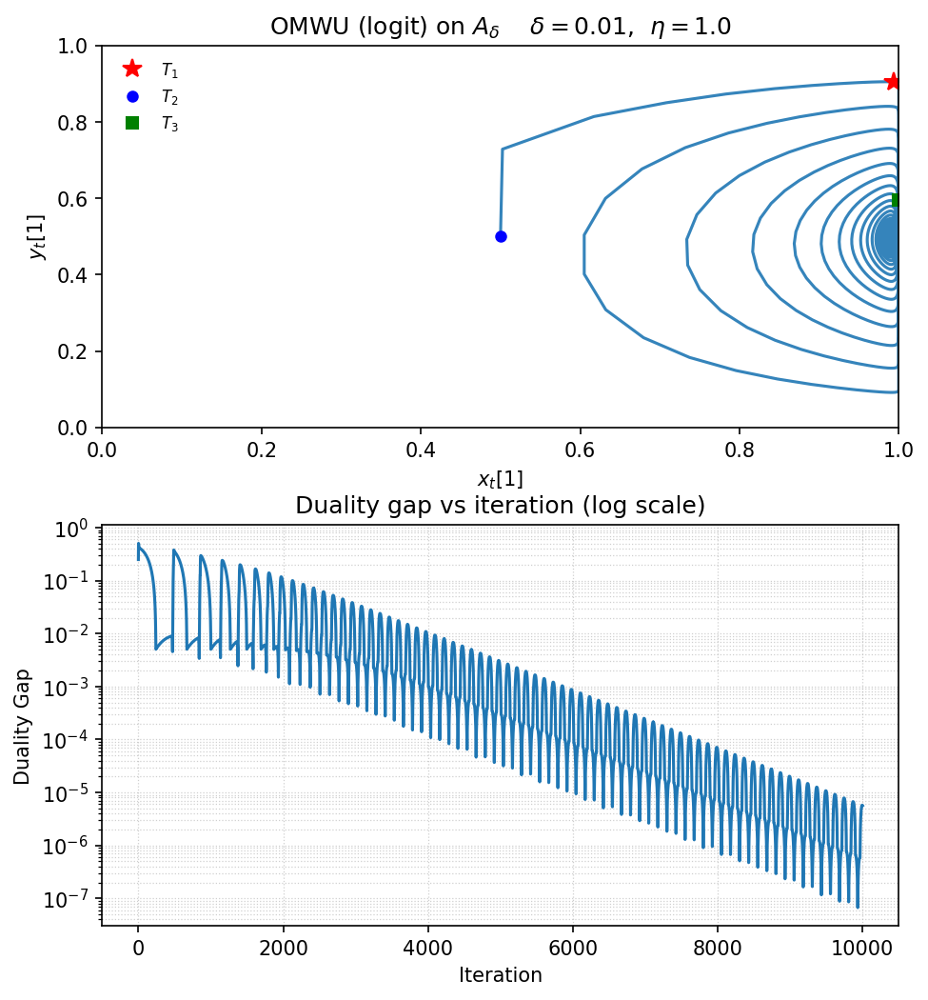

[OMWU] Saved: ./omwu_figs_logit/figure1_omwu_logit_eta1.0_delta0.01_T10000_pre.png
  Record mode: pre
  T1 (x>=1/(1+δ)) = 14  (thr 0.99009901)
  T2 (y>=1/(2(1+δ))) = 1  (thr 0.4950495)
  T3 (proof-based) = 202
  x range ≈ [0.5, 1.0]
  y range ≈ [0.091590305, 0.90581638]


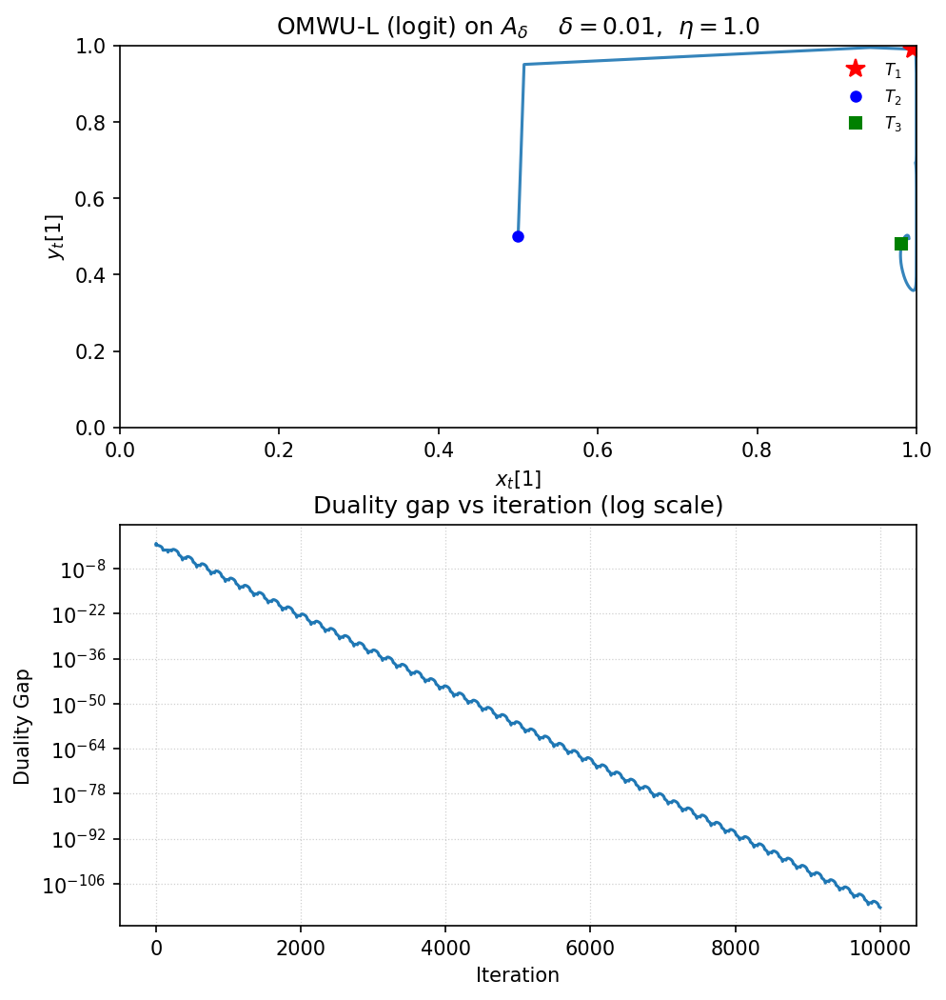

[OMWU-L] Saved: ./omwu_figs_logit/figure1_omwu_l_logit_eta1.0_delta0.01_T10000_pre.png
  Record mode: pre
  T1 (x>=1/(1+δ)) = 4  (thr 0.99009901)
  T2 (y>=1/(2(1+δ))) = 1  (thr 0.4950495)
  T3 (proof-based) = 202
  x range ≈ [0.5, 0.9999968]
  y range ≈ [0.35879266, 0.99550173]


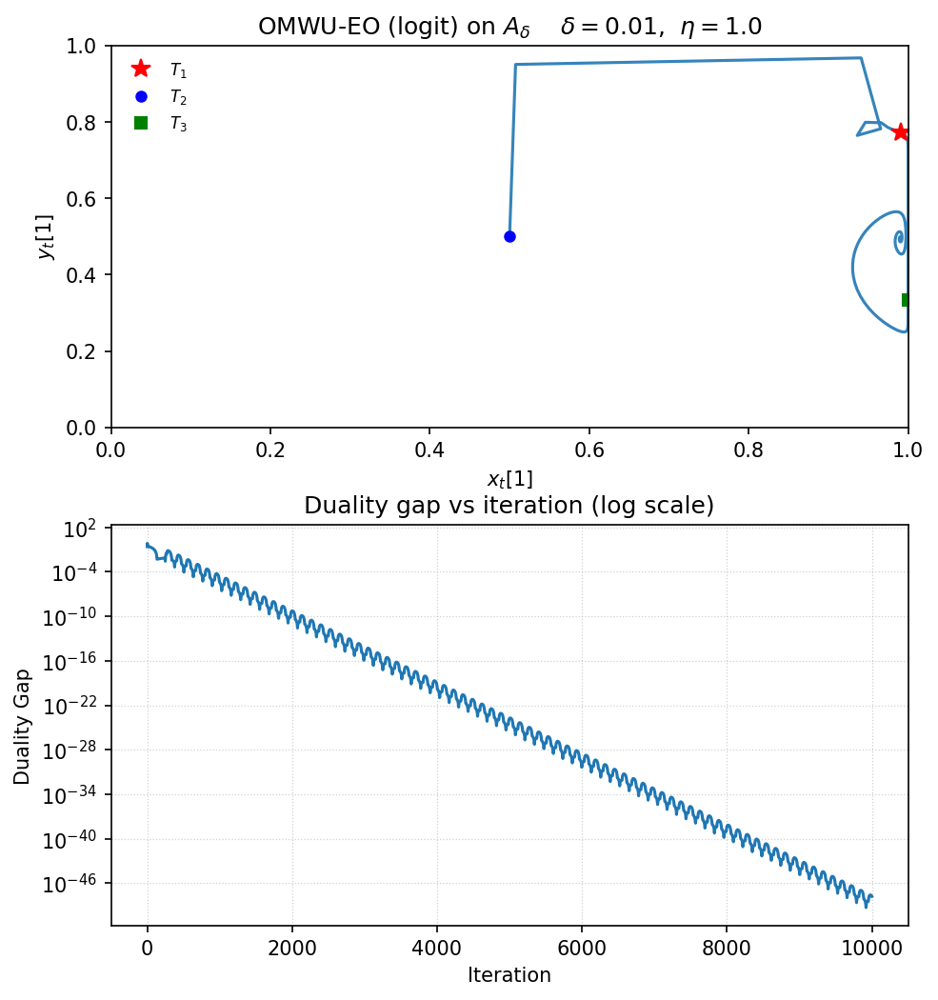

[OMWU-EO] Saved: ./omwu_figs_logit/figure1_omwu_eo_logit_eta1.0_delta0.01_T10000_pre.png
  Record mode: pre
  T1 (x>=1/(1+δ)) = 12  (thr 0.99009901)
  T2 (y>=1/(2(1+δ))) = 1  (thr 0.4950495)
  T3 (proof-based) = 202
  x range ≈ [0.5, 1.0]
  y range ≈ [0.24993973, 0.96831007]


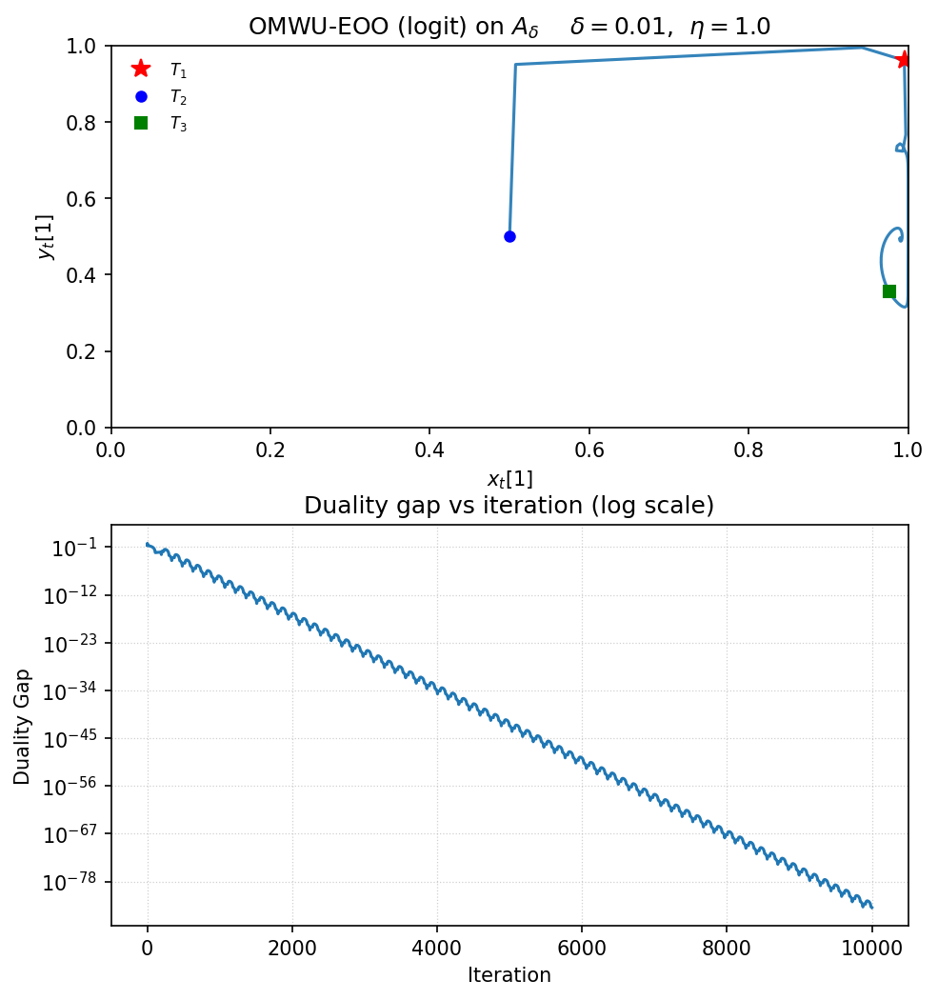

[OMWU-EOO] Saved: ./omwu_figs_logit/figure1_omwu_eoo_logit_eta1.0_delta0.01_T10000_pre.png
  Record mode: pre
  T1 (x>=1/(1+δ)) = 4  (thr 0.99009901)
  T2 (y>=1/(2(1+δ))) = 1  (thr 0.4950495)
  T3 (proof-based) = 202
  x range ≈ [0.5, 0.9999997]
  y range ≈ [0.31537737, 0.99550173]


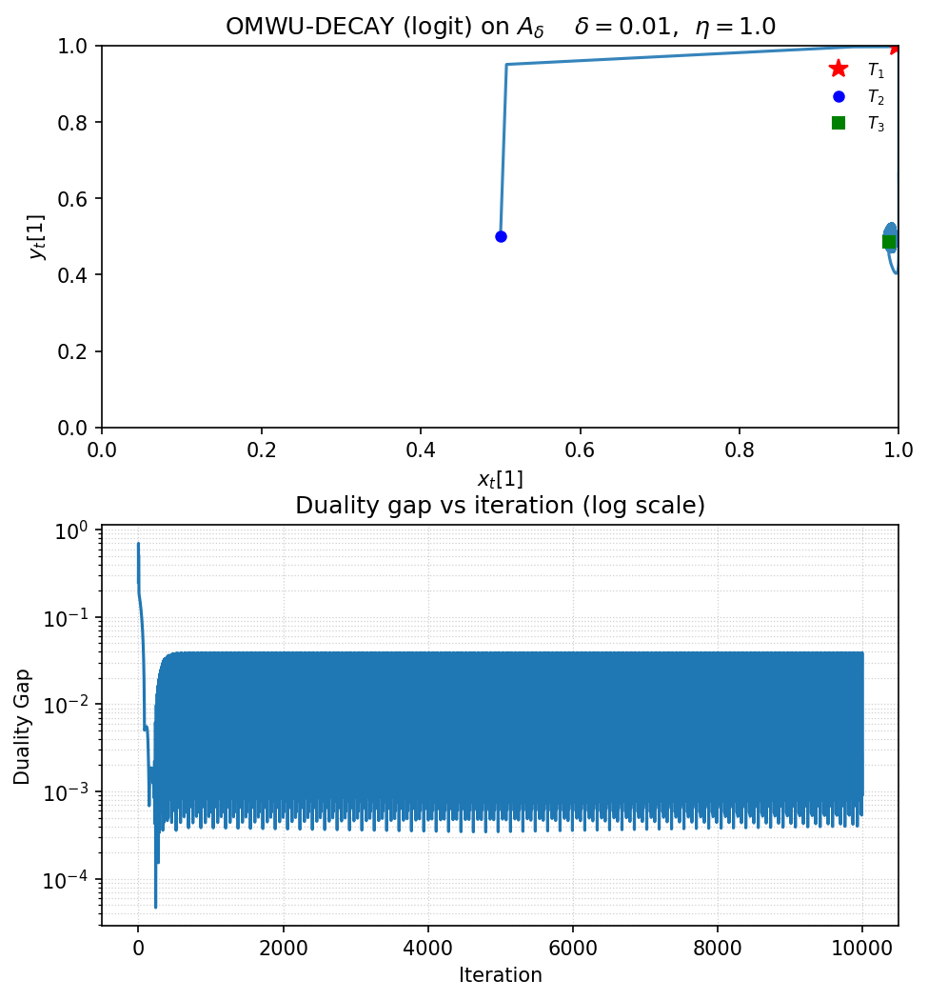

[OMWU-DECAY] Saved: ./omwu_figs_logit/figure1_omwu_decay_logit_eta1.0_delta0.01_T10000_pre.png
  Record mode: pre
  T1 (x>=1/(1+δ)) = 4  (thr 0.99009901)
  T2 (y>=1/(2(1+δ))) = 1  (thr 0.4950495)
  T3 (proof-based) = 202
  x range ≈ [0.5, 0.99999982]
  y range ≈ [0.4034147, 0.99794171]


In [6]:
# ============================================================
# Figure 1 replication (OMWU) + Variants using LOGIT UPDATES
# Colab-friendly single cell.
#
# Game: A_delta = [[1/2 + δ, 1/2],
#                  [0       , 1  ]]
# Precision: mpmath high-precision (default 1000 digits).
# Policies: x = softmax(b_row), y = softmax(b_col).
# Gradients: g_row = A @ y, g_col = -(A.T @ x).
# Update: b_{t+1} = b_t + eta * d_t  (per variant).
#
# Variants (per player):
#   OMWU:       d_t = 2 g_t - g_{t-1}
#   OMWU-L:     d_t = (L+1) g_t - sum_{i=1..L} g_{t-i}
#   OMWU-EO:    d_t = (L+1) g_t - L g_{t-1}
#   OMWU-EOO:   d_t = (L+1) g_t - g_{t-1} - pending_t
#               pending_{t+1} = (L-1) g_{t-1}
#   OMWU-DECAY: d_t = alpha_b g_t - (alpha_b-1) g_{t-1}
#                      + sum_{j=0..K_f-1} alpha_s * rho^j * (g_{t-j} - g_{t-j-1})
#               (rho default 1.0; if rho=1 -> (alpha_b+alpha_s)g_t - (alpha_b-1)g_{t-1} - alpha_s g_{t-K_f})
#
# Outputs per variant: two-panel figure
#   (top) trajectory (x[0] vs y[0]) with T1(red★), T2(blue●), T3(green■),
#   (bottom) duality gap vs iteration (log-y),
#   saved in CONFIG["save_dir"], and also displayed inline if show_figs=True.
# ============================================================

import os
from dataclasses import dataclass
from typing import List, Tuple, Dict, Optional

import matplotlib.pyplot as plt
from mpmath import mp

# ---------------------------
# CONFIG (edit here in Colab)
# ---------------------------
CONFIG: Dict = {
    # Which variants to run (choose any subset, order respected)
    # Choices: "omwu", "omwu_l", "omwu_eo", "omwu_eoo", "omwu_decay"
    "variants": ["omwu", "omwu_l", "omwu_eo", "omwu_eoo", "omwu_decay"],

    # Core experiment knobs
    "eta": 1.0,          # stepsize η
    "delta": 1e-2,       # game param δ
    "T": 10000,          # total updates
    "precision": 1000,   # decimal digits (mpmath)
    "rho": 1.0,          # DECAY base (ρ), default 1.0

    # Plot / output
    "save_dir": "./omwu_figs_logit",
    "show_figs": True,
    "add_markers": True,
    "dpi": 150,
    # Record mode: 'pre' logs (x_t,y_t) BEFORE applying the update at round t (starts at 0.5,0.5).
    #              'post' logs the policy AFTER the update at round t.
    "record_mode": "pre",

    # Variant-specific defaults
    "L": 5,                      # L for OMWU-L, EO, EOO
    # DECAY knobs
    "alpha_b": 1.0,
    "alpha_s": 5.0,
    "K_f": 5,
}

# =============== Numerics & helpers ===============
def setup_precision(dps: int):
    mp.dps = int(dps)

def softmax(v: List[mp.mpf]) -> List[mp.mpf]:
    # Stable softmax (mpmath): subtract max, exponentiate, normalize
    m = max(v)
    exps = [mp.e**(vi - m) for vi in v]
    Z = mp.fsum(exps)
    if Z == 0:
        # should not happen with mp, but guard anyway
        return [mp.mpf('1') / len(v) for _ in v]
    return [ei / Z for ei in exps]

def matvec(A: List[List[mp.mpf]], v: List[mp.mpf]) -> List[mp.mpf]:
    # 2x2 × 2 vector
    return [A[0][0]*v[0] + A[0][1]*v[1],
            A[1][0]*v[0] + A[1][1]*v[1]]

def duality_gap(A: List[List[mp.mpf]], x: List[mp.mpf], y: List[mp.mpf]) -> mp.mpf:
    # gap(x,y) = max_j (A^T x)_j - min_i (A y)_i
    # compute A^T x and A y explicitly (2x2)
    ATx = [A[0][0]*x[0] + A[1][0]*x[1],   # column 1 of A^T dot x
           A[0][1]*x[0] + A[1][1]*x[1]]  # column 2 of A^T dot x
    Ay  = matvec(A, y)
    return max(ATx[0], ATx[1]) - min(Ay[0], Ay[1])

def v_add(a: List[mp.mpf], b: List[mp.mpf]) -> List[mp.mpf]:
    return [ai + bi for ai, bi in zip(a, b)]

def v_sub(a: List[mp.mpf], b: List[mp.mpf]) -> List[mp.mpf]:
    return [ai - bi for ai, bi in zip(a, b)]

def v_scale(c: mp.mpf, a: List[mp.mpf]) -> List[mp.mpf]:
    return [c * ai for ai in a]

def v_zero(n: int) -> List[mp.mpf]:
    return [mp.mpf('0') for _ in range(n)]

# =============== Variant direction providers ===============
class DirProviderBase:
    """Base for per-player direction provider (uses grad history)."""
    def __init__(self, n_actions: int):
        self.n = n_actions
        self.t = 0
    def reset(self):
        self.t = 0
    def dir(self, g_t: List[mp.mpf], get_g):
        """Return d_t given current g_t and access to past grads via get_g(k)."""
        raise NotImplementedError

class DirOMWU(DirProviderBase):
    # d_t = 2 g_t - g_{t-1}
    def dir(self, g_t, get_g):
        g_tm1 = get_g(1)
        return v_sub(v_scale(mp.mpf('2'), g_t), g_tm1)

class DirOMWUL(DirProviderBase):
    # d_t = (L+1) g_t - sum_{i=1..L} g_{t-i}
    def __init__(self, n_actions, L: int):
        super().__init__(n_actions)
        self.L = int(L)
    def dir(self, g_t, get_g):
        s = v_zero(self.n)
        for i in range(1, self.L+1):
            gi = get_g(i)
            s = v_add(s, gi)
        return v_sub(v_scale(mp.mpf(str(self.L+1)), g_t), s)

class DirOMWUEO(DirProviderBase):
    # d_t = (L+1) g_t - L g_{t-1}
    def __init__(self, n_actions, L: int):
        super().__init__(n_actions)
        self.L = int(L)
    def dir(self, g_t, get_g):
        g_tm1 = get_g(1)
        return v_sub(v_scale(mp.mpf(str(self.L+1)), g_t), v_scale(mp.mpf(str(self.L)), g_tm1))

class DirOMWUEOO(DirProviderBase):
    # d_t = (L+1) g_t - g_{t-1} - pending_t
    # pending_{t+1} = (L-1) g_{t-1}
    def __init__(self, n_actions, L: int):
        super().__init__(n_actions)
        self.L = int(L)
        self.pending = v_zero(n_actions)
    def reset(self):
        super().reset()
        self.pending = v_zero(self.n)
    def dir(self, g_t, get_g):
        g_tm1 = get_g(1)
        d = v_sub(v_sub(v_scale(mp.mpf(str(self.L+1)), g_t), g_tm1), self.pending)
        # update pending_{t+1} for next call (uses g_{t-1})
        self.pending = v_scale(mp.mpf(str(max(self.L-1, 0))), g_tm1)
        return d

class DirDECAY(DirProviderBase):
    # d_t = alpha_b g_t - (alpha_b-1) g_{t-1} + sum_{j=0..K_f-1} alpha_s * rho^j * (g_{t-j} - g_{t-j-1})
    # If rho=1: d_t = (alpha_b+alpha_s) g_t - (alpha_b-1) g_{t-1} - alpha_s g_{t-K_f}
    def __init__(self, n_actions, alpha_b: float, alpha_s: float, K_f: int, rho: float = 1.0):
        super().__init__(n_actions)
        self.alpha_b = mp.mpf(str(alpha_b))
        self.alpha_s = mp.mpf(str(alpha_s))
        self.K_f = int(K_f)
        self.rho = mp.mpf(str(rho))
    def dir(self, g_t, get_g):
        # first two terms
        term = v_sub(v_scale(self.alpha_b, g_t), v_scale(self.alpha_b - mp.mpf('1'), get_g(1)))
        # sum over j
        if self.K_f > 0:
            for j in range(0, self.K_f):
                g_tj   = get_g(j)      # g_{t-j}
                g_tj1  = get_g(j+1)    # g_{t-j-1}
                inc = v_scale(self.alpha_s * (self.rho ** j), v_sub(g_tj, g_tj1))
                term = v_add(term, inc)
        return term

# =============== Variant wrapper (both players) ===============
@dataclass
class Variant:
    name: str
    row_dir: DirProviderBase
    col_dir: DirProviderBase

def make_variant(name: str, n_actions: int, cfg: Dict) -> Variant:
    L = int(cfg["L"])
    rho = mp.mpf(str(cfg["rho"]))
    if name.lower() == "omwu":
        return Variant("OMWU", DirOMWU(n_actions), DirOMWU(n_actions))
    elif name.lower() == "omwu_l":
        return Variant("OMWU-L", DirOMWUL(n_actions, L), DirOMWUL(n_actions, L))
    elif name.lower() == "omwu_eo":
        return Variant("OMWU-EO", DirOMWUEO(n_actions, L), DirOMWUEO(n_actions, L))
    elif name.lower() == "omwu_eoo":
        return Variant("OMWU-EOO", DirOMWUEOO(n_actions, L), DirOMWUEOO(n_actions, L))
    elif name.lower() == "omwu_decay":
        return Variant("OMWU-DECAY",
                       DirDECAY(n_actions, cfg["alpha_b"], cfg["alpha_s"], cfg["K_f"], cfg["rho"]),
                       DirDECAY(n_actions, cfg["alpha_b"], cfg["alpha_s"], cfg["K_f"], cfg["rho"]))
    else:
        raise ValueError(f"Unknown variant '{name}'")

# =============== Experiment core (logit dynamics) ===============
def run_variant_logit(cfg: Dict, variant: Variant):
    os.makedirs(cfg["save_dir"], exist_ok=True)
    setup_precision(cfg["precision"])

    # Game A_delta
    delta = mp.mpf(str(cfg["delta"]))
    half  = mp.mpf('0.5')
    A = [[half + delta, half],
         [mp.mpf('0'),  mp.mpf('1')]]

    # Settings
    eta = mp.mpf(str(cfg["eta"]))
    T   = int(cfg["T"])

    n_actions = 2
    # Initialize logits & policies (uniform)
    b_row = [mp.mpf('0')] * n_actions
    b_col = [mp.mpf('0')] * n_actions
    x = softmax(b_row)
    y = softmax(b_col)

    # Per-player gradient history (list of past g_t vectors).
    # We index so that history[0] is g_1, history[-1] is last g observed.
    g_hist_row: List[List[mp.mpf]] = []
    g_hist_col: List[List[mp.mpf]] = []

    # Helpers to fetch g_{t-k} with zero-fill if missing
    def make_get_g(hist: List[List[mp.mpf]]):
        def _get(k: int) -> List[mp.mpf]:
            # k>=0: return g_{t-k}; k=0 means current g_t.
            # At call time, we have *not* yet appended g_t to hist,
            # so current g_t is provided by argument, not from hist.
            if k <= 0:
                # We'll never call with k<=0 except k=0 handled separately in dir()
                return v_zero(n_actions)
            idx = len(hist) - k  # g_{t-k} lives here after we've appended g_t
            if idx < 0:
                return v_zero(n_actions)
            return hist[idx]
        return _get

    # Variant state reset
    variant.row_dir.reset()
    variant.col_dir.reset()

    # Storage for plotting (policies and gap)
    xs: List[float] = []
    ys: List[float] = []
    gaps_f: List[float] = []

    record_mode = cfg.get("record_mode", "pre")

    for t in range(1, T+1):
        # 1) (optional) record pre-update policy
        if record_mode == "pre":
            xs.append(float(x[0])); ys.append(float(y[0]))
            gap = duality_gap(A, x, y)
            gaps_f.append(float(gap) if gap > mp.mpf('1e-300') else 1e-300)

        # 2) compute gradients at current policy
        g_row = matvec(A, y)               # A y_t
        g_col = v_scale(mp.mpf('-1'),      # -A^T x_t
                        [A[0][0]*x[0] + A[1][0]*x[1],
                         A[0][1]*x[0] + A[1][1]*x[1]])

        # 3) directions using variant rules and history accessors
        get_g_row = make_get_g(g_hist_row)
        get_g_col = make_get_g(g_hist_col)

        # For formulas that need g_{t-j} inside the sum with j=0, we pass g_t directly.
        # Implement by temporarily appending g_t to a local view when building d_t.
        # (Cleaner: extend get_g to handle k=0 via captured g_t.)
        def dir_with_current(provider: DirProviderBase, g_t_vec, get_g_hist):
            # Wrap get_g so that k=0 returns g_t
            def _get(k: int):
                if k == 0:
                    return g_t_vec
                return get_g_hist(k)
            return provider.dir(g_t_vec, _get)

        d_row = dir_with_current(variant.row_dir, g_row, get_g_row)
        d_col = dir_with_current(variant.col_dir, g_col, get_g_col)

        # 4) logit updates
        b_row = v_add(b_row, v_scale(eta, d_row))
        b_col = v_add(b_col, v_scale(eta, d_col))
        x = softmax(b_row)
        y = softmax(b_col)

        # 5) push current gradients to history (now g_t becomes "past")
        g_hist_row.append(g_row)
        g_hist_col.append(g_col)

        # 6) (optional) record post-update policy
        if record_mode == "post":
            xs.append(float(x[0])); ys.append(float(y[0]))
            gap = duality_gap(A, x, y)
            gaps_f.append(float(gap) if gap > mp.mpf('1e-300') else 1e-300)

    # ----- markers (proof-based) -----
    T_series = len(xs)  # number of recorded points
    one = mp.mpf('1')
    thr_x = one / (one + delta)          # x[0] >= 1/(1+δ)
    thr_y = one / (2 * (one + delta))    # y[0] >= 1/(2(1+δ))

    # Recover mp policies for markers from floats (safe here)
    xs_mp = [mp.mpf(str(v)) for v in xs]
    ys_mp = [mp.mpf(str(v)) for v in ys]

    T1 = next((i+1 for i in range(T_series) if xs_mp[i] >= thr_x), None)
    T2 = next((i+1 for i in range(T_series) if ys_mp[i] >= thr_y), None)

    L_lip = mp.mpf('0.5')  # neg-entropy Lipschitz constant used in the proof
    T3 = None
    if T2 is not None:
        offset = int(mp.ceil(1 / (eta * L_lip * delta)))  # ceil(2/(eta*delta))
        cand = T2 + offset
        if cand <= T_series:
            T3 = cand

    # ----- plot -----
    fig = plt.figure(figsize=(7.2, 8.0), dpi=cfg["dpi"])
    gs = fig.add_gridspec(2, 1, height_ratios=[1, 1.05], hspace=0.25)

    # top: (x[0], y[0]) trajectory
    ax1 = fig.add_subplot(gs[0, 0])
    ax1.plot(xs, ys, lw=1.5, alpha=0.9)
    ax1.set_xlim(0.0, 1.0); ax1.set_ylim(0.0, 1.0)
    ax1.set_xlabel(r"$x_t[1]$")
    ax1.set_ylabel(r"$y_t[1]$")
    ax1.set_title(f"{variant.name} (logit) on $A_\\delta$    $\\delta={cfg['delta']}$,  $\\eta={cfg['eta']}$")

    if cfg["add_markers"]:
        if T1 is not None:
            ax1.plot(xs[T1-1], ys[T1-1], 'r*', markersize=10, label=r"$T_1$")
        if T2 is not None:
            ax1.plot(xs[T2-1], ys[T2-1], 'bo', markersize=5, label=r"$T_2$")
        if T3 is not None:
            ax1.plot(xs[T3-1], ys[T3-1], 'gs', markersize=6, label=r"$T_3$")
        if any(v is not None for v in (T1, T2, T3)):
            ax1.legend(loc="best", fontsize=8, frameon=False)

    # bottom: duality gap (semilogy)
    ax2 = fig.add_subplot(gs[1, 0])
    its = list(range(1, len(gaps_f)+1))
    ax2.semilogy(its, gaps_f, lw=1.5)
    ax2.set_xlabel("Iteration")
    ax2.set_ylabel("Duality Gap")
    ax2.set_title("Duality gap vs iteration (log scale)")
    ax2.grid(True, which="both", ls=":", lw=0.6, alpha=0.6)

    plt.tight_layout()

    # save + show
    os.makedirs(cfg["save_dir"], exist_ok=True)
    safe = variant.name.lower().replace('-', '_')
    out_path = os.path.join(cfg["save_dir"],
                            f"figure1_{safe}_logit_eta{cfg['eta']}_delta{cfg['delta']}_T{cfg['T']}_{cfg['record_mode']}.png")
    plt.savefig(out_path, bbox_inches="tight", dpi=cfg["dpi"])
    if cfg["show_figs"]:
        plt.show()
    plt.close(fig)

    # summary
    print(f"[{variant.name}] Saved: {out_path}")
    print(f"  Record mode: {cfg['record_mode']}")
    print(f"  T1 (x>=1/(1+δ)) = {T1}  (thr {mp.nstr(thr_x, 8)})")
    print(f"  T2 (y>=1/(2(1+δ))) = {T2}  (thr {mp.nstr(thr_y, 8)})")
    print(f"  T3 (proof-based) = {T3}")
    print(f"  x range ≈ [{mp.nstr(min(xs_mp), 8)}, {mp.nstr(max(xs_mp), 8)}]")
    print(f"  y range ≈ [{mp.nstr(min(ys_mp), 8)}, {mp.nstr(max(ys_mp), 8)}]")

# =============== Batch runner ===============
def run_all(cfg: Dict):
    n_actions = 2  # game is 2x2
    for vname in cfg["variants"]:
        variant = make_variant(vname, n_actions, cfg)
        run_variant_logit(cfg, variant)

# Kick off (works in Colab directly; no argparse needed)
run_all(CONFIG)


In [1]:
########################################

Streaming output truncated to the last 5000 lines.
[OMWU-DECAY(αb=1.0,αs=2.0,Kf=3,ρ=1.0,uniform)] t= 53500  exploit=2.883698e-05  nashconv=5.767396e-05  ηrow=4.00e-01 ηcol=4.00e-01
[OMWU-AVG(H=3)               ] t= 53500  exploit=2.956696e-05  nashconv=5.913391e-05  ηrow=4.00e-01 ηcol=4.00e-01
[OMWU                        ] t= 54000  exploit=3.196239e-04  nashconv=6.392479e-04  ηrow=4.00e-01 ηcol=4.00e-01
[OMWU-EO(α=4.0)              ] t= 54000  exploit=8.998422e-06  nashconv=1.799684e-05  ηrow=4.00e-01 ηcol=4.00e-01
[OMWU-EOO(L=4)               ] t= 54000  exploit=1.442219e-09  nashconv=2.884438e-09  ηrow=4.00e-01 ηcol=4.00e-01
[OMWU-L(L=4)                 ] t= 54000  exploit=2.177870e-08  nashconv=4.355740e-08  ηrow=3.00e-01 ηcol=3.00e-01
[OMWU-DECAY(αb=1.0,αs=2.0,Kf=3,ρ=1.0,uniform)] t= 54000  exploit=7.932981e-05  nashconv=1.586596e-04  ηrow=4.00e-01 ηcol=4.00e-01
[OMWU-AVG(H=3)               ] t= 54000  exploit=7.964637e-05  nashconv=1.592927e-04  ηrow=4.00e-01 ηcol=4.00e-01
[OMWU

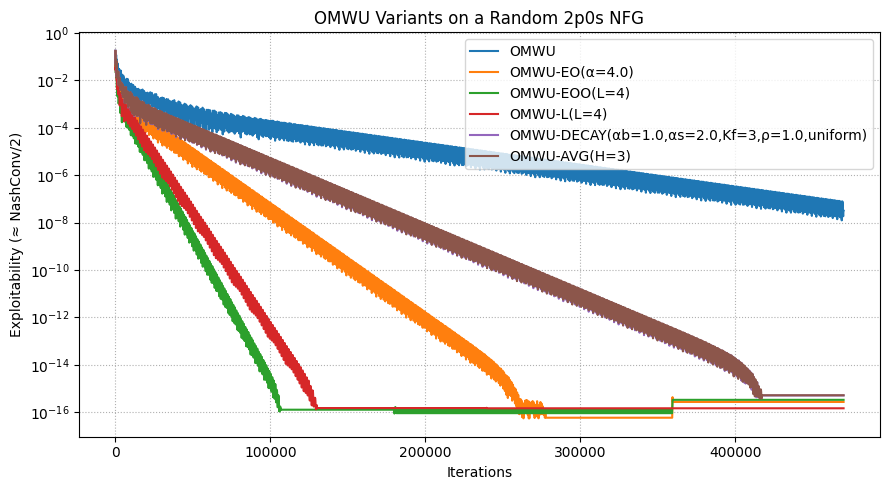

In [8]:
#@title OMWU Variants on Random 2p0s NFGs (normal-form games)
#@markdown - **ALGOS** lists only names; **VARIANT_CFG** holds hyperparameters.
#@markdown - Includes OMWU, OMWU-EO, OMWU-EOO, OMWU-L, OMWU-DECAY, and **OMWU-AVG(H)** (prediction = avg of last H gradients).
#@markdown - Runs all variants concurrently on the same random zero-sum NFG and plots exploitability (≈ NashConv/2).

from __future__ import annotations
import numpy as np
import matplotlib.pyplot as plt
from dataclasses import dataclass
from typing import Dict, List, Optional, Tuple

# ======================= VARIANTS & CONFIG (edit here) =======================
ALGOS = ["OMWU", "OMWU-EO", "OMWU-EOO", "OMWU-L", "OMWU-DECAY", "OMWU-AVG"]  # names only

VARIANT_CFG: Dict[str, Dict] = {
    "OMWU":       {"eta": 0.40},
    "OMWU-EO":    {"eta": 0.40, "alpha": 4.0},       # or use "L": 3 instead of "alpha"
    "OMWU-EOO":   {"eta": 0.40, "L": 4},
    "OMWU-L":     {"eta": 0.30, "L": 4},
    "OMWU-DECAY": {"eta": 0.40, "alpha_b": 1.0, "alpha_s": 2.0, "rho": 1.0, "Kf": 3,
                   "scheme": "uniform", "normalize": True},
    "OMWU-AVG":   {"eta": 0.40, "H": 3},             # NEW: average of last H gradients
}

# ============================= numerics helpers =============================
def get_dtype(precision: str):
    if precision not in {"normal","precise"}:
        raise ValueError("precision must be 'normal' or 'precise'")
    return np.float64 if precision == "normal" else np.longdouble

def softmax(v: np.ndarray) -> np.ndarray:
    z = v - np.max(v)
    e = np.exp(z)
    return e / np.sum(e)

# =============================== NFG definition ===============================
@dataclass
class NFG:
    A: np.ndarray  # row player's payoff matrix (m x n), col payoff is -A

def random_nfg(m: int, n: int, dist: str="uniform", scale: float=1.0, seed: int=0, dtype=np.float64) -> NFG:
    rng = np.random.default_rng(seed)
    if dist == "uniform":
        A = rng.uniform(-scale, scale, size=(m, n)).astype(dtype)
    elif dist == "normal":
        A = (rng.standard_normal(size=(m, n)) * (scale / np.sqrt(2))).astype(dtype)
    else:
        raise ValueError("dist must be 'uniform' or 'normal'")
    return NFG(A=A)

def gradients(nfg: NFG, x: np.ndarray, y: np.ndarray) -> Tuple[np.ndarray, np.ndarray]:
    """
    g_row = A @ y;  g_col = -A.T @ x
    """
    g0 = nfg.A @ y
    g1 = -(nfg.A.T @ x)
    return g0, g1

def nashconv_and_exploit(nfg: NFG, x: np.ndarray, y: np.ndarray) -> Tuple[float,float,float]:
    """
    NashConv = (max_i (A y)_i - x^T A y) + ((-min_j (x^T A)_j) - (-x^T A y))
             = max_i (A y)_i - min_j (x^T A)_j
    exploitability ≈ NashConv/2 in zero-sum.
    Returns (NashConv, Exploitability, EV_row).
    """
    Ay = nfg.A @ y
    xTA = (x @ nfg.A)
    v   = float(x @ Ay)                 # x^T A y
    best_row = float(np.max(Ay))
    best_col = float(np.min(xTA))
    nconv = best_row - best_col
    exploit = 0.5 * max(nconv, 0.0)
    return nconv, exploit, v

# =============================== Base solver ===============================
class MwuBase:
    """
    Entropic mirror map on the simplex with logit vector b; x = softmax(b).
    Subclasses implement _direction(g_t).
    """
    def __init__(self, n_actions: int, eta: float=0.4, dtype=np.float64):
        self.n = int(n_actions)
        self.eta = float(eta)
        self.dtype = dtype
        self.b = np.zeros(self.n, dtype=self.dtype)
        self.x = np.full(self.n, 1.0 / self.n, dtype=self.dtype)  # softmax(b) initially uniform
        self.last_gradient = np.zeros(self.n, dtype=self.dtype)
        self._hist: List[np.ndarray] = []  # most-recent first
        # diagnostics
        self.sum_gradients = np.zeros(self.n, dtype=self.dtype)
        self.sum_ev = self.dtype(0.0)

    def strategy(self) -> np.ndarray:
        return self.x

    def observe_gradient(self, g_t: np.ndarray):
        g_t = np.asarray(g_t, dtype=self.dtype)
        # regret diagnostics
        self.sum_gradients += g_t
        self.sum_ev += float(g_t @ self.x)
        # update logits
        d_t = self._direction(g_t)
        self.b += self.dtype(self.eta) * d_t
        self.x = softmax(self.b)
        # history
        self._hist.insert(0, g_t.copy())
        if len(self._hist) > 512: self._hist.pop()
        self.last_gradient = g_t

    def _get_hist(self, k: int, default_zero: Optional[np.ndarray]=None) -> np.ndarray:
        if k < len(self._hist): return self._hist[k]
        if default_zero is None:
            return np.zeros(self.n, dtype=self.dtype)
        return default_zero

    def _direction(self, g_t: np.ndarray) -> np.ndarray:
        raise NotImplementedError

# ============================= Concrete variants =============================
class OMWU(MwuBase):
    # d_t = 2 g_t - g_{t-1}
    def _direction(self, g_t: np.ndarray) -> np.ndarray:
        return self.dtype(2.0) * g_t - self.last_gradient

class OMWU_EO(MwuBase):
    """
    Extra optimism:
      α-form: d_t = α g_t - (α-1) g_{t-1}
      L-form: d_t = (L+1) g_t - L g_{t-1}
    """
    def __init__(self, n_actions, eta=0.4, L: Optional[int]=None, alpha: Optional[float]=None, dtype=np.float64):
        super().__init__(n_actions, eta, dtype)
        self.L = None if L is None else int(L)
        self.alpha = None if alpha is None else float(alpha)
        if self.L is None and self.alpha is None:
            self.alpha = 2.0
    def _direction(self, g_t: np.ndarray) -> np.ndarray:
        g_tm1 = self.last_gradient
        if self.L is not None:
            return self.dtype(self.L+1) * g_t - self.dtype(self.L) * g_tm1
        a = self.dtype(self.alpha)
        return a * g_t - (a - self.dtype(1.0)) * g_tm1

class OMWU_EOO(MwuBase):
    """
    Staggered EO:
      d_t = (L+1) g_t - g_{t-1} - pending_t
      pending_{t+1} = max(L-1,0) * g_{t-1}
    """
    def __init__(self, n_actions, eta=0.4, L: int=2, dtype=np.float64):
        super().__init__(n_actions, eta, dtype)
        self.L = int(max(1, L))
        self._pending = np.zeros(self.n, dtype=self.dtype)
    def _direction(self, g_t: np.ndarray) -> np.ndarray:
        g_tm1 = self.last_gradient
        d = self.dtype(self.L+1) * g_t - g_tm1 - self._pending
        self._pending = self.dtype(max(self.L-1,0)) * g_tm1
        return d

class OMWU_L(MwuBase):
    """
    Windowed:
      d_t = (L+1) g_t - sum_{i=1}^L g_{t-i}
    """
    def __init__(self, n_actions, eta=0.4, L: int=2, dtype=np.float64):
        super().__init__(n_actions, eta, dtype)
        self.L = int(max(1, L))
        self._sum_hist = np.zeros(self.n, dtype=self.dtype)
    def _direction(self, g_t: np.ndarray) -> np.ndarray:
        d = self.dtype(self.L+1) * g_t - self._sum_hist
        self._sum_hist += g_t
        if len(self._hist) >= self.L:
            self._sum_hist -= self._hist[self.L-1]
        return d

class OMWU_DECAY(MwuBase):
    """
    DECAY (finite-tap increments):
      d_t = α_b g_t + α_s ∑_{j=0}^{Kf-1} w_j (g_{t-j} - g_{t-j-1})
    weights: uniform (default) or geometric ("geom" with rho in [0,1)).
    """
    def __init__(self, n_actions, eta=0.4, alpha_b=1.0, alpha_s=2.0, Kf=2, rho=1.0,
                 scheme="uniform", normalize=True, dtype=np.float64):
        super().__init__(n_actions, eta, dtype)
        self.alpha_b = self.dtype(alpha_b)
        self.alpha_s = self.dtype(alpha_s)
        self.Kf = int(max(0, Kf))
        self.rho = float(rho)
        self.scheme = scheme
        self.normalize = bool(normalize)
        self._build_weights()
    def _build_weights(self):
        if self.Kf <= 0:
            self._w = np.zeros(0, dtype=self.dtype); return
        if self.scheme == "geom" and 0.0 <= self.rho < 1.0:
            w = np.array([(1.0 - self.rho) * (self.rho ** j) for j in range(self.Kf)], dtype=float)
            if self.normalize:
                s = w.sum()
                if s > 0: w = w / s
        else:
            w = np.ones(self.Kf, dtype=float) / float(self.Kf)
        self._w = np.asarray(w, dtype=self.dtype)
    def _direction(self, g_t: np.ndarray) -> np.ndarray:
        d = self.alpha_b * g_t
        if self.Kf > 0:
            zeros = np.zeros_like(g_t)
            inc = np.zeros_like(g_t)
            for j in range(self.Kf):
                g_t_j   = g_t if j == 0 else self._get_hist(j-1, zeros)
                g_t_jm1 = self._get_hist(j, zeros)
                inc += self._w[j] * (g_t_j - g_t_jm1)
            d = d + self.alpha_s * inc
        return d

class OMWU_AVG(MwuBase):
    """
    NEW: Average-prediction variant
      m_t = (1/H) * sum_{i=1..H} g_{t-i}  (use available history when t<=H)
      d_t = 2 g_t - m_t
    """
    def __init__(self, n_actions, eta=0.4, H: int=5, dtype=np.float64):
        super().__init__(n_actions, eta, dtype)
        self.H = int(max(1, H))
    def _direction(self, g_t: np.ndarray) -> np.ndarray:
        H = min(self.H, len(self._hist))
        if H == 0:
            m_t = np.zeros_like(g_t)
        else:
            # average last H gradients (self._hist[0] is g_{t-1})
            m_t = np.mean(np.stack(self._hist[:H], axis=0), axis=0)
        return self.dtype(2.0) * g_t - m_t

# =============================== Factory ===============================
def make_solver(variant_name: str, cfg: Dict, n_actions: int, dtype):
    v = variant_name.strip().upper()
    eta = float(cfg.get("eta", 0.4))
    if v == "OMWU":
        return f"OMWU", OMWU(n_actions, eta=eta, dtype=dtype)
    if v in {"OMWU-EO","EO"}:
        alpha = cfg.get("alpha", None)
        L = cfg.get("L", None)
        if alpha is not None:
            return f"OMWU-EO(α={alpha})", OMWU_EO(n_actions, eta=eta, alpha=float(alpha), L=None, dtype=dtype)
        L = int(L if L is not None else 2)
        return f"OMWU-EO(L={L})", OMWU_EO(n_actions, eta=eta, L=L, alpha=None, dtype=dtype)
    if v in {"OMWU-EOO","EOO"}:
        L = int(cfg.get("L", 2))
        return f"OMWU-EOO(L={L})", OMWU_EOO(n_actions, eta=eta, L=L, dtype=dtype)
    if v in {"OMWU-L","L"}:
        L = int(cfg.get("L", 2))
        return f"OMWU-L(L={L})", OMWU_L(n_actions, eta=eta, L=L, dtype=dtype)
    if v in {"OMWU-DECAY","DECAY"}:
        ab  = float(cfg.get("alpha_b", 1.0))
        aS  = float(cfg.get("alpha_s", 2.0))
        Kf  = int(cfg.get("Kf", 2))
        rho = float(cfg.get("rho", 1.0))
        scheme = str(cfg.get("scheme", "uniform")).lower()
        normalize = bool(cfg.get("normalize", True))
        label = f"OMWU-DECAY(αb={ab},αs={aS},Kf={Kf},ρ={rho},{scheme})"
        return label, OMWU_DECAY(n_actions, eta=eta, alpha_b=ab, alpha_s=aS, Kf=Kf, rho=rho,
                                 scheme=scheme, normalize=normalize, dtype=dtype)
    if v in {"OMWU-AVG","AVG"}:
        H = int(cfg.get("H", 5))
        return f"OMWU-AVG(H={H})", OMWU_AVG(n_actions, eta=eta, H=H, dtype=dtype)
    raise ValueError(f"Unknown variant '{variant_name}'")

# =============================== Runner ===============================
def run_nfg_all_variants(
    # Game params
    m=30, n=30, dist="uniform", scale=1.0, seed=0,
    # Train / numerics
    T=20000, precision="precise", eta_global=None, print_every=500, plot_every=100
):
    DTYPE = get_dtype(precision)
    np.seterr(over='raise', divide='raise', invalid='raise', under='ignore')
    # Build one shared random NFG for all variants
    nfg = random_nfg(m=m, n=n, dist=dist, scale=scale, seed=seed, dtype=DTYPE)
    print(f"=== Random 2p0s NFG ===")
    print(f"  shape A         : {nfg.A.shape}  (row×col actions)")
    print(f"  dist/scale      : {dist}/{scale}")
    print(f"=======================\n")

    # Instantiate one row and one column solver per variant
    rng = np.random.default_rng(seed)
    bundles = []  # (label, row_solver, col_solver)
    for name in ALGOS:
        if name not in VARIANT_CFG:
            raise ValueError(f"Variant '{name}' missing in VARIANT_CFG.")
        cfg = dict(VARIANT_CFG[name])
        if eta_global is not None:
            cfg["eta"] = float(eta_global)
        label_r, row = make_solver(name, cfg, nfg.A.shape[0], DTYPE)
        label_c, col = make_solver(name, cfg, nfg.A.shape[1], DTYPE)
        assert label_r == label_c
        label = label_r
        # tiny jitter to break perfect symmetry
        row.b += np.asarray(rng.normal(0, 1e-12, size=row.b.shape), dtype=DTYPE)
        col.b += np.asarray(rng.normal(0, 1e-12, size=col.b.shape), dtype=DTYPE)
        row.x = softmax(row.b)
        col.x = softmax(col.b)
        bundles.append((label, row, col))

    curves = {label: {"times": [], "exploit": [], "nashconv": []} for (label,_,_) in bundles}

    # Train
    for t in range(1, T+1):
        for (label, row, col) in bundles:
            x = row.strategy()
            y = col.strategy()
            g0, g1 = gradients(nfg, x, y)
            row.observe_gradient(g0)
            col.observe_gradient(g1)

            if (t % plot_every) == 0 or t == 1:
                x = row.strategy(); y = col.strategy()
                nc, ex, v = nashconv_and_exploit(nfg, x, y)
                curves[label]["times"].append(t)
                curves[label]["exploit"].append(ex)
                curves[label]["nashconv"].append(nc)

            if (t % print_every) == 0 or t == 1:
                ex = curves[label]["exploit"][-1] if curves[label]["exploit"] else float('nan')
                nc = curves[label]["nashconv"][-1] if curves[label]["nashconv"] else float('nan')
                print(f"[{label:28s}] t={t:6d}  exploit={ex:.6e}  nashconv={nc:.6e}  ηrow={row.eta:.2e} ηcol={col.eta:.2e}")

    # Plot
    if curves:
        plt.figure(figsize=(9,5))
        for label, data in curves.items():
            if not data["times"]: continue
            xs = np.asarray(data["times"], dtype=float)
            ys = np.maximum(np.asarray(data["exploit"], dtype=float), 1e-18)
            plt.plot(xs, ys, label=label)
        plt.yscale("log")
        plt.xlabel("Iterations"); plt.ylabel("Exploitability (≈ NashConv/2)")
        plt.title("OMWU Variants on a Random 2p0s NFG")
        plt.grid(True, which="both", ls=":")
        plt.legend()
        plt.tight_layout()
        plt.show()

    return curves

# ================================ Runner cell ================================
#@title Run (edit params then run)
m = 30                     #@param {type:"integer"}
n = 30                     #@param {type:"integer"}
dist = "uniform"           #@param ["uniform","normal"]
scale = 1.0                #@param {type:"number"}
seed = 10                   #@param {type:"integer"}

T = 470000                  #@param {type:"integer"}
precision = "precise"      #@param ["normal","precise"]
print_every = 500          #@param {type:"integer"}
plot_every = 100           #@param {type:"integer"}
eta_global = None          #@param {type:"raw"}  # set a float to override all variant etas at once

curves = run_nfg_all_variants(
    m=m, n=n, dist=dist, scale=scale, seed=seed,
    T=T, precision=precision, eta_global=eta_global,
    print_every=print_every, plot_every=plot_every
)


In [1]:
####################################


=== Biased RPS (ε=0.20) ===  shape=(3, 3)


/tmp/ipython-input-2351397631.py:348: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


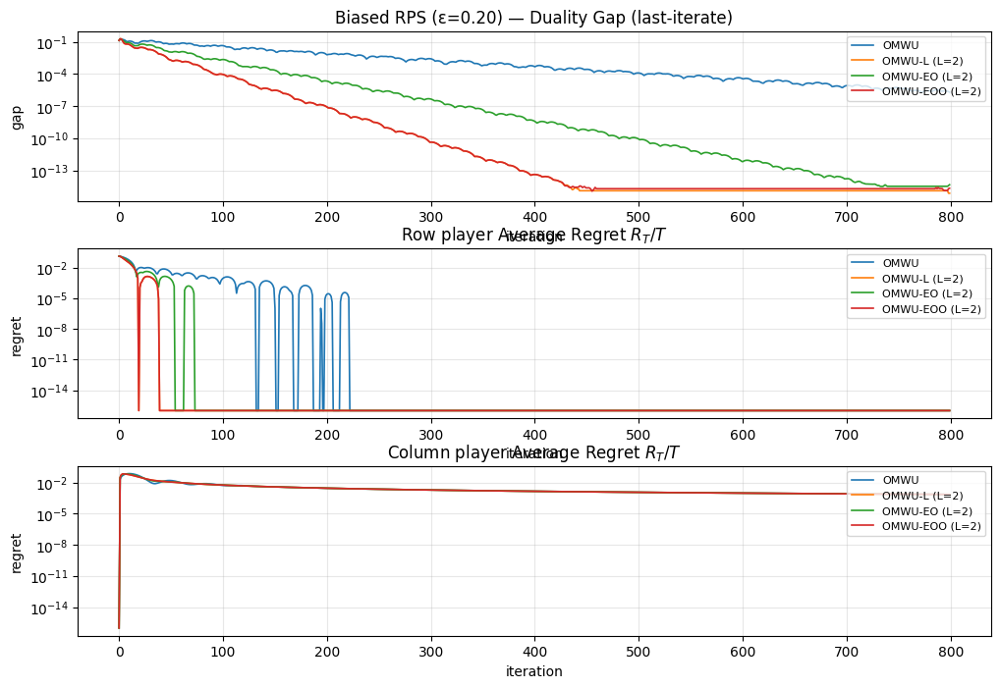

In [6]:
# omwu_variants_random_games.py
# ------------------------------------------------------------
# Two-player zero-sum normal-form games
# OMWU + variants on a battery of games, with duality gap and regret plots
# ------------------------------------------------------------
from __future__ import annotations
import numpy as np
import matplotlib.pyplot as plt
from dataclasses import dataclass, field
from typing import Callable, Dict, List, Tuple, Optional

# =========================
# Config (edit here)
# =========================
SEED = 0
T = 800                   # iterations
PRINT_EVERY = 1000         # progress printout
PLOT_TOTAL_REGRET = False  # if True: plot R_T; else plot average regret R_T/T
RUN_BATTERY = False         # if True: run all games in GAMES; else run just FIRST one

LOG_Y = True     # log scale on Y (gap + regrets)
LOG_X = False    # optional: log scale on X (iterations)

# Algorithms + hyperparameters
VARIANTS = {
    # name: dict with 'type' and parameters
    "OMWU":           {"type": "omwu",     "eta": 0.3},
    "OMWU-L (L=2)":   {"type": "omwu_l",   "eta": 0.3, "L": 2},
    "OMWU-EO (L=2)":  {"type": "omwu_eo",  "eta": 0.3, "L": 2},
    "OMWU-EOO (L=2)": {"type": "omwu_eoo", "eta": 0.3, "L": 2},
}

# Game battery (each item is (title, builder_fn))
def _G(title, fn): return (title, fn)
GAMES: List[Tuple[str, Callable[[], np.ndarray]]] = [
    # _G("RPS (3x3, standard)",                   lambda: make_rps()),
    _G("Biased RPS (ε=0.20)",                   lambda: make_biased_rps(eps=0.20)),
    _G("Matching Pennies (2x2)",                lambda: make_matching_pennies()),
    _G("Cyclic-5 (5x5, near-antisymmetric)",    lambda: make_cyclic(k=5)),
    _G("Random Gaussian 7x7 (N(0,1))",          lambda: make_random_gaussian(7,7, scale=1.0)),
    _G("Random Uniform 10x10 ([-1,1])",         lambda: make_random_uniform(10,10)),
    _G("Random Skew 8x8 (B - B^T)",             lambda: make_random_skew(8)),
    _G("Random Sparse 12x12 (p=0.15)",          lambda: make_random_sparse(12,12, density=0.15)),
]

# =========================
# Numerics helpers
# =========================
EPS = 1e-300

def softmax(logits: np.ndarray) -> np.ndarray:
    z = logits - np.max(logits)         # safe shift
    e = np.exp(z)
    s = e / np.sum(e)
    # guard against underflow to exact zeros
    return np.clip(s, EPS, 1.0)

# =========================
# Game builders (row gets A, col gets -A)
# =========================
def make_rps() -> np.ndarray:
    # Standard RPS (row payoff)
    #    R  P  S
    # R [0 -1  1]
    # P [1  0 -1]
    # S [-1 1  0]
    A = np.array([[0, -1,  1],
                  [1,  0, -1],
                  [-1, 1,  0]], dtype=float)
    return A

def make_biased_rps(eps: float=0.2) -> np.ndarray:
    A = make_rps().astype(float)
    # Add a small bias for row toward Rock: increase Rock payoff by eps uniformly
    A[0, :] += eps
    return A

def make_matching_pennies() -> np.ndarray:
    # Row wants to match, column wants to mismatch
    #      H   T
    # H [ 1, -1]
    # T [-1,  1]
    return np.array([[1, -1],
                     [-1, 1]], dtype=float)

def make_cyclic(k: int=5) -> np.ndarray:
    # k-action cyclic dominance: i beats (i-1 mod k), loses to (i+1 mod k)
    A = np.zeros((k, k), dtype=float)
    for i in range(k):
        A[i, (i-1) % k] = 1.0
        A[i, (i+1) % k] = -1.0
    return A

def make_random_gaussian(m: int, n: int, scale: float=1.0) -> np.ndarray:
    return np.random.normal(0.0, scale, size=(m, n))

def make_random_uniform(m: int, n: int) -> np.ndarray:
    return np.random.uniform(-1.0, 1.0, size=(m, n))

def make_random_skew(n: int) -> np.ndarray:
    B = np.random.normal(0.0, 1.0, size=(n, n))
    A = 0.5 * (B - B.T)  # strictly antisymmetric => zero-sum with value 0
    return A

def make_random_sparse(m: int, n: int, density: float=0.15) -> np.ndarray:
    A = np.zeros((m, n), dtype=float)
    mask = np.random.rand(m, n) < density
    A[mask] = np.random.uniform(-1.0, 1.0, size=np.count_nonzero(mask))
    return A

# =========================
# OMWU variants (logit form, reward-maximization)
# =========================
@dataclass
class OMWUAgent:
    n_actions: int
    eta: float
    variant: str                # 'omwu' | 'omwu_l' | 'omwu_eo' | 'omwu_eoo'
    L: int = 1                  # window/breadth
    # internal state
    z: np.ndarray = field(init=False)
    x: np.ndarray = field(init=False)
    g_prev: Optional[np.ndarray] = field(default=None, init=False)
    window: List[np.ndarray] = field(default_factory=list, init=False)
    pending: Optional[np.ndarray] = field(default=None, init=False)  # for EOO

    def __post_init__(self):
        self.z = np.zeros(self.n_actions, dtype=float)  # logits start uniform
        self.x = np.ones(self.n_actions, dtype=float) / self.n_actions
        self.g_prev = np.zeros(self.n_actions, dtype=float)
        if self.variant == "omwu_eoo":
            self.pending = np.zeros(self.n_actions, dtype=float)

    def _direction(self, g: np.ndarray) -> np.ndarray:
        # Build d_t based on variant and stored history; g is current gradient
        if self.variant == "omwu":
            # d_t = 2*g_t - g_{t-1}
            d = 2.0 * g - self.g_prev

        elif self.variant == "omwu_l":
            # d_t = (L+1) g_t − sum_{i=1..L} g_{t−i}
            # maintain window of last L grads in self.window
            d = (self.L + 1.0) * g
            s = np.zeros_like(g)
            for old in self.window:
                s += old
            d -= s

        elif self.variant == "omwu_eo":
            # d_t = (L+1) g_t − L * g_{t−1}
            d = (self.L + 1.0) * g - (self.L * self.g_prev)

        elif self.variant == "omwu_eoo":
            # d_t = (L+1) g_t − g_{t−1} − pending_t
            # pending_{t+1} = max(L−1,0) * g_{t−1}
            pend = self.pending if self.pending is not None else 0.0
            d = (self.L + 1.0) * g - self.g_prev - pend
        else:
            raise ValueError(f"Unknown variant: {self.variant}")
        return d

    def step(self, g: np.ndarray):
        # Compute direction and update logits -> strategy
        d = self._direction(g)
        self.z = self.z + self.eta * d
        self.x = softmax(self.z)

        # Update history (g_prev, window, pending)
        if self.variant == "omwu_l":
            # push current g; keep last L
            self.window.insert(0, g.copy())
            if len(self.window) > self.L:
                self.window.pop()
        elif self.variant == "omwu_eoo":
            # update pending for next round
            if self.pending is None:
                self.pending = np.zeros_like(g)
            self.pending = max(self.L - 1, 0) * self.g_prev

        # update g_prev last
        self.g_prev = g.copy()

# =========================
# Simulation core
# =========================
@dataclass
class Trajectory:
    x_hist: np.ndarray      # (T, m)
    y_hist: np.ndarray      # (T, n)
    payoff_hist: np.ndarray # (T,)
    gap_hist: np.ndarray    # (T,)
    avg_regret_row: np.ndarray  # (T,)
    avg_regret_col: np.ndarray  # (T,)
    total_regret_row: np.ndarray  # (T,)
    total_regret_col: np.ndarray  # (T,)

def duality_gap(A: np.ndarray, x: np.ndarray, y: np.ndarray) -> float:
    # gap(x,y) = max_i (A y)_i - min_j (x^T A)_j
    Ay = A @ y
    xA = x @ A
    return np.max(Ay) - np.min(xA)

def simulate(A: np.ndarray, variant_cfg: Dict[str, Dict], T: int, print_every: int=0, seed: int=0
            ) -> Dict[str, Trajectory]:
    rng = np.random.default_rng(seed)
    m, n = A.shape

    results: Dict[str, Trajectory] = {}
    for name, cfg in variant_cfg.items():
        # independent copy/agents per algorithm
        eta = float(cfg.get("eta", 0.5))
        L = int(cfg.get("L", 1))
        var_type = cfg["type"]

        row = OMWUAgent(n_actions=m, eta=eta, variant=var_type, L=L)
        col = OMWUAgent(n_actions=n, eta=eta, variant=var_type, L=L)

        x = row.x.copy()
        y = col.x.copy()

        x_hist = np.zeros((T, m), dtype=float)
        y_hist = np.zeros((T, n), dtype=float)
        payoff_hist = np.zeros(T, dtype=float)
        gap_hist = np.zeros(T, dtype=float)

        # running averages for regret
        x_cum = np.zeros(m, dtype=float)
        y_cum = np.zeros(n, dtype=float)
        u_cum = 0.0

        avg_regret_row = np.zeros(T, dtype=float)
        avg_regret_col = np.zeros(T, dtype=float)
        total_regret_row = np.zeros(T, dtype=float)
        total_regret_col = np.zeros(T, dtype=float)

        # regret accumulators (total external regret)
        total_row = 0.0
        total_col = 0.0

        for t in range(T):
            # 1) observe gradients from current play (play-then-learn)
            g_row = A @ y          # payoff gradient wrt row's mixed x
            g_col = -(A.T @ x)     # column maximizes its reward = -row's

            # 2) record current play stats
            x_hist[t] = x
            y_hist[t] = y
            u = float(x @ (A @ y))
            payoff_hist[t] = u
            gap_hist[t] = duality_gap(A, x, y)

            # 3) update running averages for average regret
            x_cum += x
            y_cum += y
            u_cum += u
            T_now = t + 1
            x_bar = x_cum / T_now
            y_bar = y_cum / T_now
            u_bar = u_cum / T_now

            # Best responses to opponent averages (linear => pure action is optimal)
            BR_row_val = np.max(A @ y_bar)            # max_i (A y_bar)_i
            BR_col_val = np.min(x_bar @ A)            # min_j (x_bar^T A)_j

            # Average regret (external)
            avg_regret_row[t] = BR_row_val - u_bar
            avg_regret_col[t] = u_bar - BR_col_val

            # Total regret via running sums of per-round instantaneous regrets
            # inst_row = max_i <e_i, g_row_t> - <x_t, g_row_t> = max_i (A y)_i - u_t
            # inst_col = <x_t, -A e_j*> - <x_t, -A y_t> = u_t - min_j (x^T A)_j
            inst_row = np.max(A @ y) - u
            inst_col = u - np.min(x @ A)
            total_row += inst_row
            total_col += inst_col
            total_regret_row[t] = total_row
            total_regret_col[t] = total_col

            # 4) learners update (use current gradients)
            row.step(g_row)
            col.step(g_col)
            x = row.x
            y = col.x

            if print_every and (t+1) % print_every == 0:
                print(f"[{name}] t={t+1:5d}  gap={gap_hist[t]:.4f}  "
                      f"avg_reg(row)={avg_regret_row[t]:.4f}  avg_reg(col)={avg_regret_col[t]:.4f}")

        results[name] = Trajectory(
            x_hist=x_hist, y_hist=y_hist, payoff_hist=payoff_hist, gap_hist=gap_hist,
            avg_regret_row=avg_regret_row, avg_regret_col=avg_regret_col,
            total_regret_row=total_regret_row, total_regret_col=total_regret_col,
        )
    return results

# =========================
# Plotting
# =========================
def plot_results(title: str, results: Dict[str, Trajectory], plot_total_regret: bool=False):
    def _safe_pos(a, eps=1e-16):
        # clip tiny/negative due to rounding so log-scale is valid
        return np.maximum(a, eps)

    plt.figure(figsize=(12, 8))
    gs = plt.GridSpec(3,1, height_ratios=[1,1,1], hspace=0.28)

    # (1) Duality gap (last-iterate)
    ax1 = plt.subplot(gs[0,0])
    for name, traj in results.items():
        y = _safe_pos(traj.gap_hist) if LOG_Y else traj.gap_hist
        ax1.plot(y, label=name, linewidth=1.2)
    ax1.set_title(f"{title} — Duality Gap (last-iterate)")
    ax1.set_xlabel("iteration")
    ax1.set_ylabel("gap")
    if LOG_Y: ax1.set_yscale('log')
    if LOG_X: ax1.set_xscale('log')
    ax1.legend(loc='upper right', fontsize=8)
    ax1.grid(True, which='both', alpha=0.3)

    # (2) Average/Total regret — Row
    ax2 = plt.subplot(gs[1,0])
    for name, traj in results.items():
        y = traj.total_regret_row if plot_total_regret else traj.avg_regret_row
        y = _safe_pos(y) if LOG_Y else y
        ax2.plot(y, label=name, linewidth=1.2)
    ax2.set_title("Row player " + ("Total Regret $R_T$" if plot_total_regret else "Average Regret $R_T/T$"))
    ax2.set_xlabel("iteration")
    ax2.set_ylabel("regret")
    if LOG_Y: ax2.set_yscale('log')
    if LOG_X: ax2.set_xscale('log')
    ax2.legend(loc='upper right', fontsize=8)
    ax2.grid(True, which='both', alpha=0.3)

    # (3) Average/Total regret — Column
    ax3 = plt.subplot(gs[2,0])
    for name, traj in results.items():
        y = traj.total_regret_col if plot_total_regret else traj.avg_regret_col
        y = _safe_pos(y) if LOG_Y else y
        ax3.plot(y, label=name, linewidth=1.2)
    ax3.set_title("Column player " + ("Total Regret $R_T$" if plot_total_regret else "Average Regret $R_T/T$"))
    ax3.set_xlabel("iteration")
    ax3.set_ylabel("regret")
    if LOG_Y: ax3.set_yscale('log')
    if LOG_X: ax3.set_xscale('log')
    ax3.legend(loc='upper right', fontsize=8)
    ax3.grid(True, which='both', alpha=0.3)

    plt.tight_layout()
    plt.show()
# =========================
# Main
# =========================
def main():
    np.random.seed(SEED)

    game_list = GAMES if RUN_BATTERY else GAMES[:1]
    for title, builder in game_list:
        A = builder().astype(float)
        print(f"\n=== {title} ===  shape={A.shape}")
        results = simulate(A, VARIANTS, T=T, print_every=PRINT_EVERY, seed=SEED)
        plot_results(title, results, plot_total_regret=PLOT_TOTAL_REGRET)

if __name__ == "__main__":
    main()


In [7]:
##################################
##################################

In [10]:
# omwu_variants_random_games_highprec.py
# ------------------------------------------------------------
# High-precision OMWU + variants on a battery of 2p zero-sum games
# - mpmath with mp.dps = 1000 (1000 decimal digits)
# - Duality gap and (average or total) external regret
# - Optional log scales; numerically safe clipping for plots
# ------------------------------------------------------------
from __future__ import annotations
import random
from dataclasses import dataclass, field
from typing import Callable, Dict, List, Tuple, Optional

import mpmath as mp
import numpy as np
import matplotlib.pyplot as plt

# =========================
# Config (edit here)
# =========================
SEED = 0
T = 23000                     # iterations (high precision can be slower; tune as needed)
PRINT_EVERY = 500            # print progress (0 = silent)
PLOT_TOTAL_REGRET = False    # False: plot average regret R_T/T; True: plot total regret R_T
RUN_BATTERY = False           # run every game in GAMES; else only the first

# Plotting scales
LOG_Y = True                 # log scale on Y for gap and regrets
LOG_X = False                # log scale on X (iterations)

# High precision
MP_DPS = 1000                # decimal digits; 1000 per your request
mp.mp.dps = MP_DPS
mp.mp.trap_complex = True

# Algorithms + hyperparameters
VARIANTS = {
    "OMWU":           {"type": "omwu",     "eta": mp.mpf("0.1")},
    "OMWU-L (L=2)":   {"type": "omwu_l",   "eta": mp.mpf("0.1"),  "L": 3},
    "OMWU-EO (L=2)":  {"type": "omwu_eo",  "eta": mp.mpf("0.1"),  "L": 3},
    "OMWU-EOO (L=3)": {"type": "omwu_eoo", "eta": mp.mpf("0.1"), "L": 3},
}

# =========================
# Utilities (mpmath-based vectors/matrices)
# =========================
def mp_zero(n: int) -> List[mp.mpf]:
    return [mp.mpf("0") for _ in range(n)]

def mp_ones(n: int) -> List[mp.mpf]:
    return [mp.mpf("1") for _ in range(n)]

def mp_scalar(x) -> mp.mpf:
    return x if isinstance(x, mp.mpf) else mp.mpf(x)

def vec_add(a: List[mp.mpf], b: List[mp.mpf]) -> List[mp.mpf]:
    return [ai + bi for ai, bi in zip(a, b)]

def vec_sub(a: List[mp.mpf], b: List[mp.mpf]) -> List[mp.mpf]:
    return [ai - bi for ai, bi in zip(a, b)]

def vec_scale(a: List[mp.mpf], c: mp.mpf) -> List[mp.mpf]:
    return [c * ai for ai in a]

def dot(a: List[mp.mpf], b: List[mp.mpf]) -> mp.mpf:
    s = mp.mpf("0")
    for ai, bi in zip(a, b):
        s += ai * bi
    return s

def matvec(A: List[List[mp.mpf]], v: List[mp.mpf]) -> List[mp.mpf]:
    m = len(A)
    n = len(A[0])
    out = [mp.mpf("0") for _ in range(m)]
    for i in range(m):
        s = mp.mpf("0")
        Ai = A[i]
        for j in range(n):
            s += Ai[j] * v[j]
        out[i] = s
    return out

def transpose(A: List[List[mp.mpf]]) -> List[List[mp.mpf]]:
    m = len(A); n = len(A[0])
    AT = [[mp.mpf("0") for _ in range(m)] for __ in range(n)]
    for i in range(m):
        for j in range(n):
            AT[j][i] = A[i][j]
    return AT

def softmax_logits(z: List[mp.mpf]) -> List[mp.mpf]:
    # Stable softmax: subtract max logit before exp
    zmax = max(z)
    exps = [mp.e**(zi - zmax) for zi in z]
    s = mp.fsum(exps)
    # clip and normalize (avoid exact zeros)
    x = [ei / s for ei in exps]
    # Guard tiny underflows (for plotting/log)
    eps = mp.mpf("1e-1000")  # extremely tiny; only used to avoid exact zeros
    x = [xi if xi > eps else eps for xi in x]
    # renormalize exactly
    s2 = mp.fsum(x)
    return [xi / s2 for xi in x]

# =========================
# Game builders (return mp matrices)
# =========================
def to_mp_matrix(Af: np.ndarray) -> List[List[mp.mpf]]:
    m, n = Af.shape
    out = [[mp.mpf(str(Af[i, j])) for j in range(n)] for i in range(m)]
    return out

def make_rps() -> List[List[mp.mpf]]:
    Af = np.array([[0, -1,  1],
                   [1,  0, -1],
                   [-1, 1,  0]], dtype=float)
    return to_mp_matrix(Af)

def make_biased_rps(eps=0.2) -> List[List[mp.mpf]]:
    Af = np.array([[0, -1,  1],
                   [1,  0, -1],
                   [-1, 1,  0]], dtype=float)
    Af[0, :] += float(eps)
    return to_mp_matrix(Af)

def make_matching_pennies() -> List[List[mp.mpf]]:
    Af = np.array([[ 1, -1],
                   [-1,  1]], dtype=float)
    return to_mp_matrix(Af)

def make_cyclic(k=5) -> List[List[mp.mpf]]:
    Af = np.zeros((k, k), dtype=float)
    for i in range(k):
        Af[i, (i-1) % k] =  1.0
        Af[i, (i+1) % k] = -1.0
    return to_mp_matrix(Af)

def make_random_gaussian(m=7, n=7, scale=1.0, rng: random.Random=None) -> List[List[mp.mpf]]:
    if rng is None: rng = random.Random()
    Af = np.zeros((m, n), dtype=float)
    for i in range(m):
        for j in range(n):
            Af[i, j] = rng.gauss(0.0, scale)
    return to_mp_matrix(Af)

def make_random_uniform(m=10, n=10, lo=-1.0, hi=1.0, rng: random.Random=None) -> List[List[mp.mpf]]:
    if rng is None: rng = random.Random()
    Af = np.zeros((m, n), dtype=float)
    for i in range(m):
        for j in range(n):
            Af[i, j] = lo + (hi - lo) * rng.random()
    return to_mp_matrix(Af)

def make_random_skew(n=8, rng: random.Random=None) -> List[List[mp.mpf]]:
    if rng is None: rng = random.Random()
    B = np.zeros((n, n), dtype=float)
    for i in range(n):
        for j in range(n):
            B[i, j] = rng.gauss(0.0, 1.0)
    Af = 0.5 * (B - B.T)  # antisymmetric
    return to_mp_matrix(Af)

def make_random_sparse(m=12, n=12, density=0.15, rng: random.Random=None) -> List[List[mp.mpf]]:
    if rng is None: rng = random.Random()
    Af = np.zeros((m, n), dtype=float)
    for i in range(m):
        for j in range(n):
            if rng.random() < density:
                Af[i, j] = -1.0 + 2.0 * rng.random()
            else:
                Af[i, j] = 0.0
    return to_mp_matrix(Af)

def _G(title, fn): return (title, fn)
GAMES: List[Tuple[str, Callable[[], List[List[mp.mpf]]]]] = [
    # _G("RPS (3x3, standard)",                   lambda: make_rps()),
    # _G("Biased RPS (ε=0.20)",                   lambda: make_biased_rps(eps=0.20)),
    # _G("Matching Pennies (2x2)",                lambda: make_matching_pennies()), QQQQQQQQQQQQQQQQQQ
    # _G("Cyclic-5 (5x5, near-antisymmetric)",    lambda: make_cyclic(k=5)),
    _G("Random Gaussian 7x7 (N(0,1))",          lambda: make_random_gaussian(7,7, scale=1.0, rng=random.Random(SEED))),
    _G("Random Uniform 10x10 ([-1,1])",         lambda: make_random_uniform(10,10, rng=random.Random(SEED+1))),
    _G("Random Skew 8x8 (B - B^T)",             lambda: make_random_skew(8, rng=random.Random(SEED+2))),
    _G("Random Sparse 12x12 (p=0.15)",          lambda: make_random_sparse(12,12, density=0.15, rng=random.Random(SEED+3))),
]

# =========================
# OMWU variants (logit form, reward-maximization)
# =========================
@dataclass
class OMWUAgent:
    n_actions: int
    eta: mp.mpf
    variant: str                # 'omwu' | 'omwu_l' | 'omwu_eo' | 'omwu_eoo'
    L: int = 1                  # window/breadth

    z: List[mp.mpf] = field(init=False)
    x: List[mp.mpf] = field(init=False)
    g_prev: List[mp.mpf] = field(init=False)
    window: List[List[mp.mpf]] = field(default_factory=list, init=False)
    pending: Optional[List[mp.mpf]] = field(default=None, init=False)  # for EOO

    def __post_init__(self):
        self.z = [mp.mpf("0")] * self.n_actions
        self.x = [mp.mpf("1") / mp.mpf(self.n_actions) for _ in range(self.n_actions)]
        self.g_prev = [mp.mpf("0")] * self.n_actions
        if self.variant == "omwu_eoo":
            self.pending = [mp.mpf("0")] * self.n_actions

    def _direction(self, g: List[mp.mpf]) -> List[mp.mpf]:
        if self.variant == "omwu":
            # d_t = 2*g_t - g_{t-1}
            return vec_sub(vec_scale(g, mp.mpf("2")), self.g_prev)

        elif self.variant == "omwu_l":
            # d_t = (L+1) g_t − sum_{i=1..L} g_{t−i}
            d = vec_scale(g, mp.mpf(self.L + 1))
            if self.window:
                s = mp_zero(len(g))
                for old in self.window:
                    s = vec_add(s, old)
                d = vec_sub(d, s)
            return d

        elif self.variant == "omwu_eo":
            # d_t = (L+1) g_t − L * g_{t−1}
            return vec_sub(vec_scale(g, mp.mpf(self.L + 1)),
                           vec_scale(self.g_prev, mp.mpf(self.L)))

        elif self.variant == "omwu_eoo":
            # d_t = (L+1) g_t − g_{t−1} − pending_t
            pend = self.pending if self.pending is not None else mp_zero(len(g))
            tmp = vec_sub(vec_scale(g, mp.mpf(self.L + 1)), self.g_prev)
            return vec_sub(tmp, pend)
        else:
            raise ValueError(f"Unknown variant: {self.variant}")

    def step(self, g: List[mp.mpf]):
        d = self._direction(g)
        # logits update
        self.z = vec_add(self.z, vec_scale(d, self.eta))
        # softmax to strategy
        self.x = softmax_logits(self.z)

        # history maintenance
        if self.variant == "omwu_l":
            self.window.insert(0, g.copy())
            if len(self.window) > self.L:
                self.window.pop()
        elif self.variant == "omwu_eoo":
            if self.pending is None:
                self.pending = [mp.mpf("0")] * len(g)
            # pending_{t+1} = max(L-1,0) * g_{t-1}
            c = mp.mpf(max(self.L - 1, 0))
            self.pending = vec_scale(self.g_prev, c)

        self.g_prev = g.copy()

# =========================
# Metrics
# =========================
def duality_gap(A: List[List[mp.mpf]], x: List[mp.mpf], y: List[mp.mpf]) -> mp.mpf:
    Ay = matvec(A, y)
    AT = transpose(A)
    xA = matvec(AT, x)  # (A^T @ x) is length-n; equals (x^T A)^T
    return max(Ay) - min(xA)

# =========================
# Simulation
# =========================
@dataclass
class Trajectory:
    gap_hist: List[float]
    avg_regret_row: List[float]
    avg_regret_col: List[float]
    total_regret_row: List[float]
    total_regret_col: List[float]

def simulate(A: List[List[mp.mpf]], variant_cfg: Dict[str, Dict], T: int, print_every: int=0
            ) -> Dict[str, Trajectory]:
    m = len(A); n = len(A[0])
    AT = transpose(A)

    results: Dict[str, Trajectory] = {}
    for name, cfg in variant_cfg.items():
        eta = mp_scalar(cfg.get("eta", mp.mpf("0.5")))
        L = int(cfg.get("L", 1))
        var_type = cfg["type"]

        row = OMWUAgent(n_actions=m, eta=eta, variant=var_type, L=L)
        col = OMWUAgent(n_actions=n, eta=eta, variant=var_type, L=L)
        x = row.x.copy()
        y = col.x.copy()

        # histories for plotting (as Python floats)
        gap_hist_f: List[float] = []
        avg_reg_row_f: List[float] = []
        avg_reg_col_f: List[float] = []
        tot_reg_row_f: List[float] = []
        tot_reg_col_f: List[float] = []

        # cumulative averages for avg regret
        x_cum = mp_zero(m)
        y_cum = mp_zero(n)
        u_cum = mp.mpf("0")

        # total regret accumulators
        total_row = mp.mpf("0")
        total_col = mp.mpf("0")

        for t in range(T):
            # gradients at current play
            g_row = matvec(A, y)       # A @ y
            g_col = vec_scale(matvec(AT, x), mp.mpf("-1"))  # -(A^T @ x)

            # values and gap
            u_t = dot(x, g_row)        # x^T A y
            gap_t = duality_gap(A, x, y)

            # update running averages
            x_cum = vec_add(x_cum, x)
            y_cum = vec_add(y_cum, y)
            u_cum += u_t
            T_now = mp.mpf(t + 1)
            x_bar = vec_scale(x_cum, mp.mpf("1") / T_now)
            y_bar = vec_scale(y_cum, mp.mpf("1") / T_now)
            u_bar = u_cum / T_now

            # Best responses to averages
            BR_row_val = max(matvec(A, y_bar))          # max_i (A y_bar)_i
            BR_col_val = min(matvec(AT, x_bar))         # min_j (x_bar^T A)_j

            # average regrets (external)
            avg_row = BR_row_val - u_bar
            avg_col = u_bar - BR_col_val

            # per-round inst regrets (total regret accumulation)
            inst_row = max(g_row) - u_t                 # max_i (A y)_i - u_t
            xA = matvec(AT, x)                          # (x^T A)^T
            inst_col = u_t - min(xA)

            total_row += inst_row
            total_col += inst_col

            # record (convert to float safely)
            gap_hist_f.append(_to_float_pos(gap_t))
            avg_reg_row_f.append(_to_float_pos(avg_row))
            avg_reg_col_f.append(_to_float_pos(avg_col))
            tot_reg_row_f.append(_to_float_pos(total_row))
            tot_reg_col_f.append(_to_float_pos(total_col))

            # updates
            row.step(g_row)
            col.step(g_col)
            x = row.x
            y = col.x

            if print_every and (t + 1) % print_every == 0:
                print("[{name}] t={t+1:5d}  gap={gap_hist_f[-1]:.6e}  "
                      "avg_reg(row)={avg_reg_row_f[-1]:.6e}  avg_reg(col)={avg_reg_col_f[-1]:.6e}")

        results[name] = Trajectory(
            gap_hist=gap_hist_f,
            avg_regret_row=avg_reg_row_f,
            avg_regret_col=avg_reg_col_f,
            total_regret_row=tot_reg_row_f,
            total_regret_col=tot_reg_col_f,
        )

    return results

# Safe float conversion for plotting on log axes
def _to_float_pos(v: mp.mpf, eps: float = 1e-300) -> float:
    try:
        f = float(v)
    except (OverflowError, ValueError):
        # if mpf is too big/small: cap
        f = np.inf if v > 0 else 0.0
    if not np.isfinite(f) or f <= 0.0:
        f = eps
    return f

# =========================
# Plotting
# =========================
def plot_results(title: str, results: Dict[str, Trajectory], plot_total_regret: bool=False):
    plt.figure(figsize=(12, 8))
    gs = plt.GridSpec(3,1, height_ratios=[1,1,1], hspace=0.28)

    # (1) Duality gap (last-iterate)
    ax1 = plt.subplot(gs[0,0])
    for name, traj in results.items():
        y = traj.gap_hist
        ax1.plot(y, label=name, linewidth=1.2)
    ax1.set_title(f"{title} — Duality Gap (last-iterate)")
    ax1.set_xlabel("iteration")
    ax1.set_ylabel("gap")
    if LOG_Y: ax1.set_yscale('log')
    if LOG_X: ax1.set_xscale('log')
    ax1.legend(loc='upper right', fontsize=8)
    ax1.grid(True, which='both', alpha=0.3)

    # (2) Regret — Row
    ax2 = plt.subplot(gs[1,0])
    for name, traj in results.items():
        y = traj.total_regret_row if plot_total_regret else traj.avg_regret_row
        ax2.plot(y, label=name, linewidth=1.2)
    ax2.set_title("Row player " + ("Total Regret $R_T$" if plot_total_regret else "Average Regret $R_T/T$"))
    ax2.set_xlabel("iteration")
    ax2.set_ylabel("regret")
    if LOG_Y: ax2.set_yscale('log')
    if LOG_X: ax2.set_xscale('log')
    ax2.legend(loc='upper right', fontsize=8)
    ax2.grid(True, which='both', alpha=0.3)

    # (3) Regret — Column
    ax3 = plt.subplot(gs[2,0])
    for name, traj in results.items():
        y = traj.total_regret_col if plot_total_regret else traj.avg_regret_col
        ax3.plot(y, label=name, linewidth=1.2)
    ax3.set_title("Column player " + ("Total Regret $R_T$" if plot_total_regret else "Average Regret $R_T/T$"))
    ax3.set_xlabel("iteration")
    ax3.set_ylabel("regret")
    if LOG_Y: ax3.set_yscale('log')
    if LOG_X: ax3.set_xscale('log')
    ax3.legend(loc='upper right', fontsize=8)
    ax3.grid(True, which='both', alpha=0.3)

    plt.tight_layout()
    plt.show()

# =========================
# Main
# =========================
def main():
    random.seed(SEED)
    game_list = GAMES if RUN_BATTERY else GAMES[:1]
    for title, builder in game_list:
        A = builder()
        m, n = len(A), len(A[0])
        print("\n=== {title} ===  shape=({m},{n})  mp.dps={mp.mp.dps}")
        results = simulate(A, VARIANTS, T=T, print_every=PRINT_EVERY)
        plot_results(title, results, plot_total_regret=PLOT_TOTAL_REGRET)

if __name__ == "__main__":
    main()



=== {title} ===  shape=({m},{n})  mp.dps={mp.mp.dps}
[OMWU] t=  500  gap=3.725915e-01  avg_reg(row)=1.795728e-02  avg_reg(col)=1.384244e-02


KeyboardInterrupt: 

In [1]:
############


=== Running OMWU ===


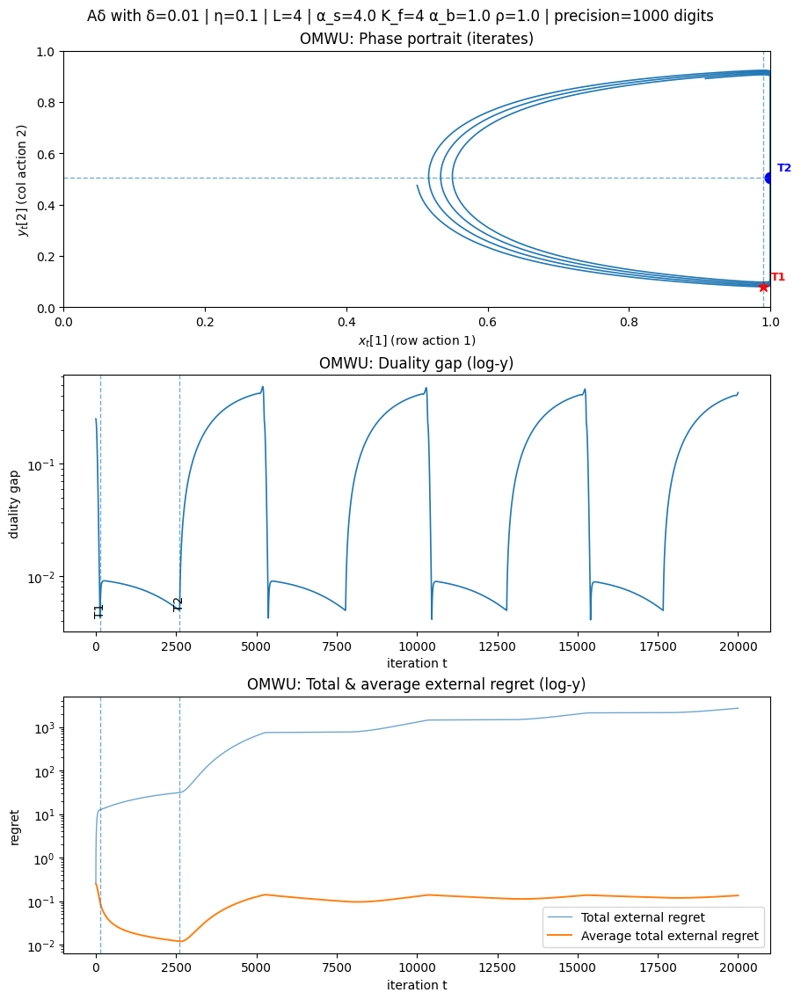


=== Running OMWU-L ===


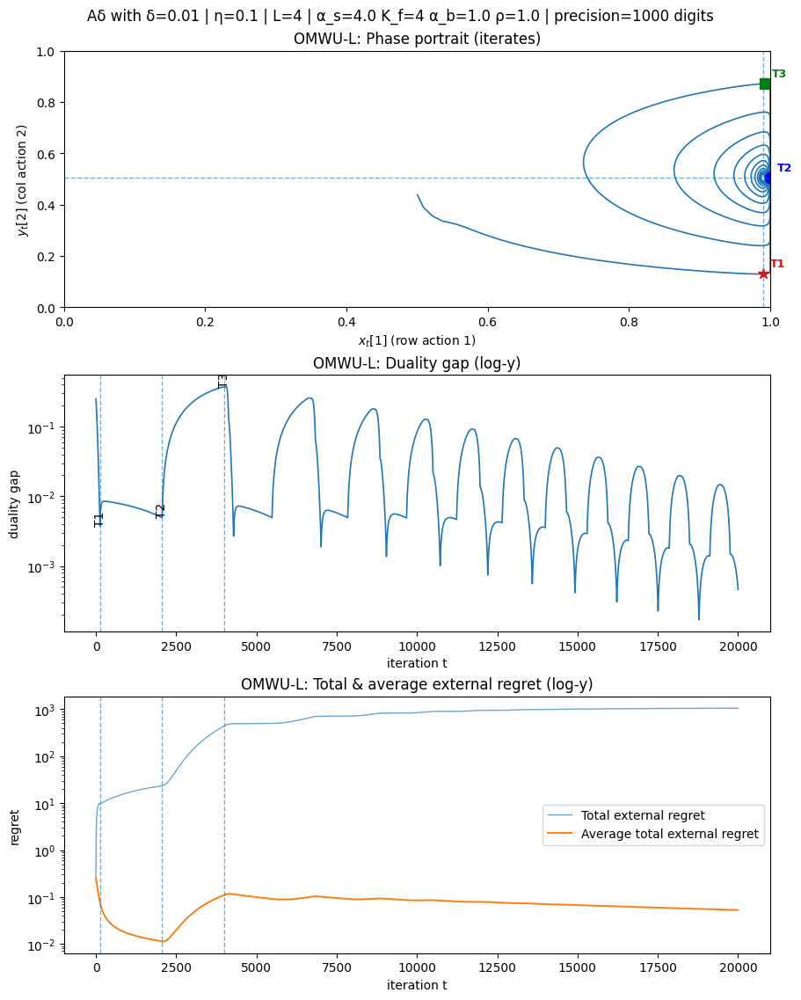


=== Running OMWU-EO ===


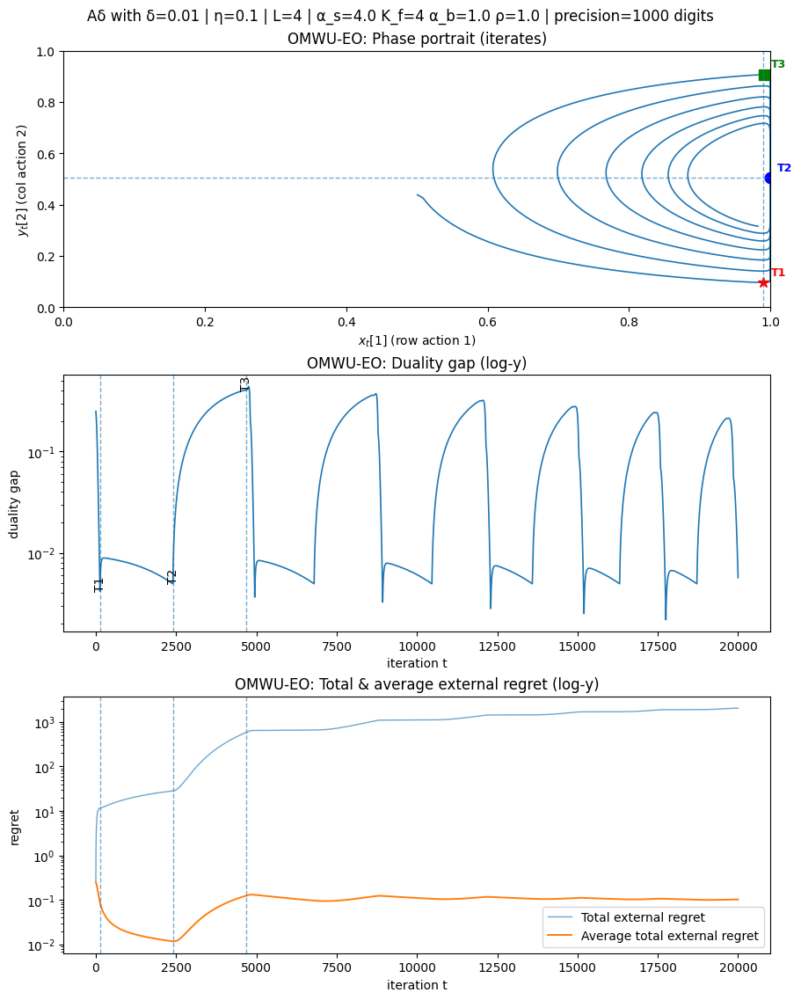


=== Running OMWU-EOO ===


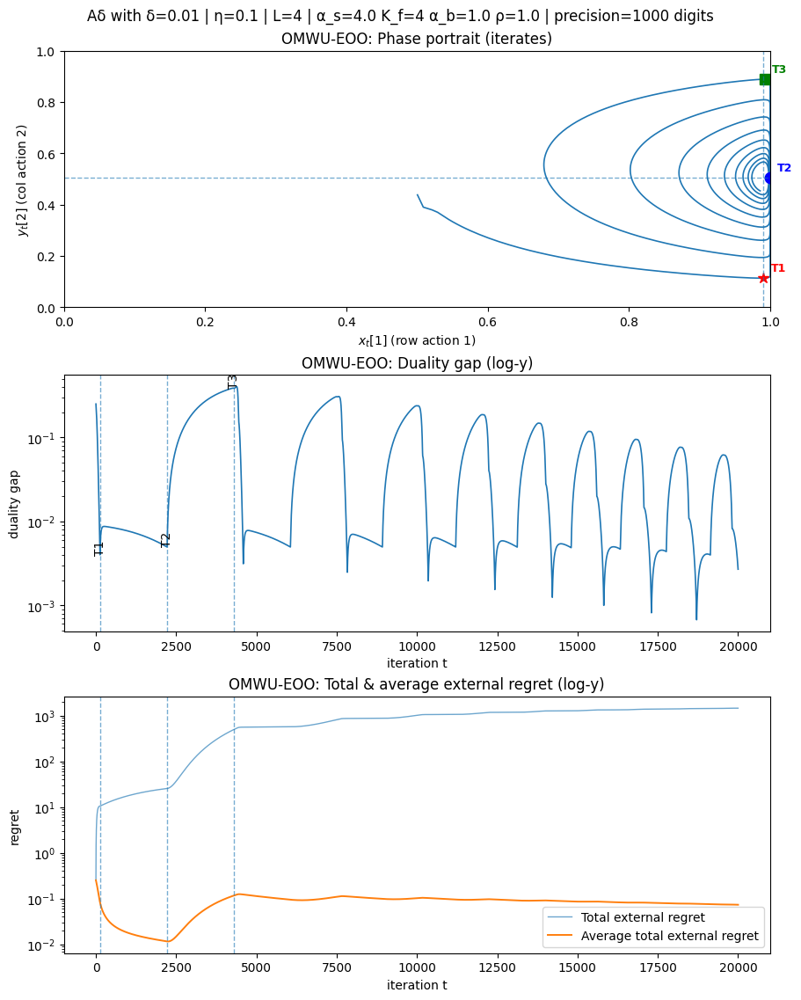


=== Running OMWU-DECAY ===


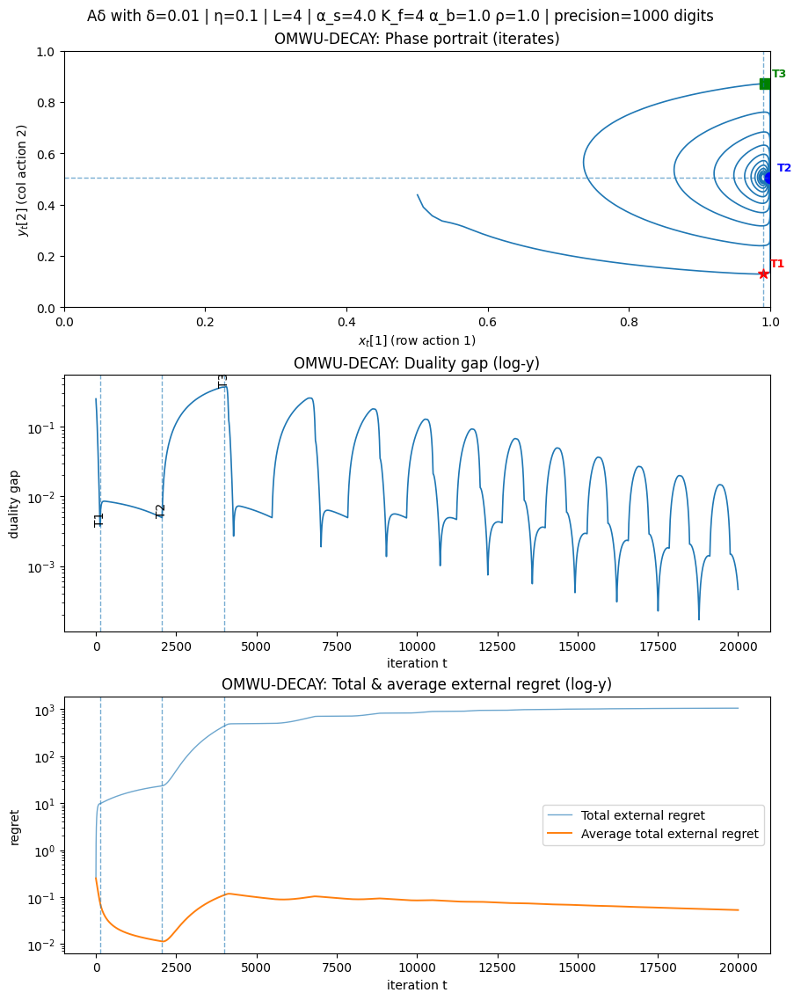

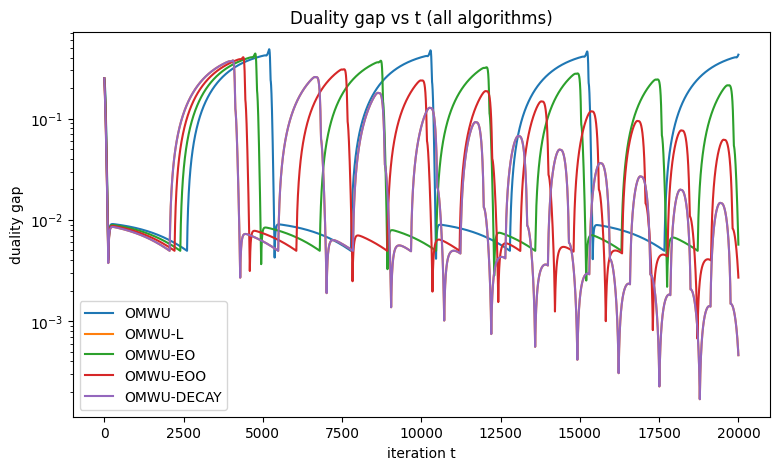

In [18]:
# Colab-ready: OMWU + variants on A_delta with paper-style plots.
# Key fixes vs prior cell:
#  - Phase portrait plots x = x[0] (row first action) vs y = y[1] (column second action) to match Fig.1 (top-left).
#  - Stage thresholds & markers use those coordinates.
#  - Defaults: delta=1e-2, eta=1.0 as in the paper figure.

from __future__ import annotations
import mpmath as mp
import matplotlib.pyplot as plt
from dataclasses import dataclass, field
from typing import List, Dict, Tuple

# =========================
# CONFIG (edit here)
# =========================
CONFIG = {
    "T": 20000,          # iterations (reduce if slow in Colab)
    "delta": "1e-2",      # paper figure uses 1e-2
    "eta": "0.1",         # paper figure uses 1.0
    "L": 4,
    "alpha_s": "4.0",
    "alpha_b": "1.0",
    "K_f": 4,
    "rho": "1.0",
    "precision_digits": 1000,
    "print_every": 0,     # set >0 to see progress
    "algos": ["OMWU","OMWU-L","OMWU-EO","OMWU-EOO","OMWU-DECAY"],

    # plotting choice to match the paper:
    # x-axis uses row action-1 (index 0), y-axis uses column action-2 (index 1)
    "PLOT_X_INDEX": 0,
    "PLOT_Y_INDEX": 1,
}

# =========================
# Utilities
# =========================
def mpf(x) -> mp.mpf:
    return x if isinstance(x, mp.mpf) else mp.mpf(x)

def mp_mat_2x2(a11, a12, a21, a22):
    return [[mpf(a11), mpf(a12)], [mpf(a21), mpf(a22)]]

def matvec_2x2(A, v):
    return [A[0][0]*v[0] + A[0][1]*v[1],
            A[1][0]*v[0] + A[1][1]*v[1]]

def vecdot(u, v):
    return u[0]*v[0] + u[1]*v[1]

def softmax_mp(z):
    m = z[0] if z[0] > z[1] else z[1]
    e0 = mp.e**(z[0]-m)
    e1 = mp.e**(z[1]-m)
    s = e0 + e1
    return [e0/s, e1/s]

def vec_add(u, v): return [u[0]+v[0], u[1]+v[1]]
def vec_sub(u, v): return [u[0]-v[0], u[1]-v[1]]
def vec_scale(a, v): return [a*v[0], a*v[1]]
def vec_zeros(): return [mp.mpf('0'), mp.mpf('0')]

def fmt_e(x, d=6):
    return f"{float(x):.{d}e}"

# =========================
# Game: A_delta
# =========================
@dataclass
class HardGame:
    delta: mp.mpf
    A: List[List[mp.mpf]] = field(init=False)
    def __post_init__(self):
        d = mpf(self.delta)
        self.A = mp_mat_2x2(mp.mpf('0.5') + d, mp.mpf('0.5'),
                            mp.mpf('0.0')     , mp.mpf('1.0'))
    def grad_row(self, y):
        return matvec_2x2(self.A, y)  # A y
    def grad_col(self, x):
        # Column maximizes its own payoff which is -x^T A y => gradient wrt y is -(A^T x)
        Atx = [self.A[0][0]*x[0] + self.A[1][0]*x[1],
               self.A[0][1]*x[0] + self.A[1][1]*x[1]]
        return [-Atx[0], -Atx[1]]
    def value(self, x, y):
        return vecdot(x, matvec_2x2(self.A, y))  # x^T A y
    def best_response_row_value(self, y):
        g = self.grad_row(y)  # A y
        return g[0] if g[0] > g[1] else g[1]
    def best_response_col_value(self, x):
        col0 = self.A[0][0]*x[0] + self.A[1][0]*x[1]
        col1 = self.A[0][1]*x[0] + self.A[1][1]*x[1]
        return col0 if col0 < col1 else col1
    def duality_gap(self, x, y):
        return self.best_response_row_value(y) - self.best_response_col_value(x)

# =========================
# Directions (d_t)
# =========================
class DirectionBase:
    def __init__(self, dim=2):
        self.dim = dim
        self.g_hist: List[List[mp.mpf]] = []
    def update_and_direction(self, g_t):
        raise NotImplementedError

class OMWU(DirectionBase):
    # d_t = 2 g_t - g_{t-1}
    def update_and_direction(self, g_t):
        g_prev = self.g_hist[-1] if self.g_hist else vec_zeros()
        d = vec_sub(vec_scale(mp.mpf('2'), g_t), g_prev)
        self.g_hist.append([mp.mpf(g_t[0]), mp.mpf(g_t[1])])
        return d

class OMWU_L(DirectionBase):
    # d_t = (L+1) g_t - sum_{i=1}^L g_{t-i}
    def __init__(self, L=4, dim=2):
        super().__init__(dim); self.L = L
    def update_and_direction(self, g_t):
        d = vec_scale(mp.mpf(self.L + 1), g_t)
        for i in range(1, self.L+1):
            if len(self.g_hist) - i >= 0:
                d = vec_sub(d, self.g_hist[-i])
        self.g_hist.append([mp.mpf(g_t[0]), mp.mpf(g_t[1])])
        return d

class OMWU_EO(DirectionBase):
    # d_t = (L+1) g_t - L g_{t-1}
    def __init__(self, L=4, dim=2):
        super().__init__(dim); self.L = L
    def update_and_direction(self, g_t):
        g_prev = self.g_hist[-1] if self.g_hist else vec_zeros()
        d = vec_sub(vec_scale(mp.mpf(self.L + 1), g_t),
                    vec_scale(mp.mpf(self.L), g_prev))
        self.g_hist.append([mp.mpf(g_t[0]), mp.mpf(g_t[1])])
        return d

class OMWU_EOO(DirectionBase):
    # d_t = (L+1) g_t - g_{t-1} - pending_t ; pending_{t+1} = max(L-1,0)*g_{t-1}
    def __init__(self, L=4, dim=2):
        super().__init__(dim); self.L = L; self.pending = vec_zeros()
    def update_and_direction(self, g_t):
        g_prev = self.g_hist[-1] if self.g_hist else vec_zeros()
        d = vec_sub(vec_scale(mp.mpf(self.L + 1), g_t),
                    vec_add(g_prev, self.pending))
        self.pending = vec_scale(mp.mpf(max(self.L-1, 0)), g_prev)
        self.g_hist.append([mp.mpf(g_t[0]), mp.mpf(g_t[1])])
        return d

class OMWU_DECAY(DirectionBase):
    # d_t = (alpha_b + alpha_s) g_t - alpha_s * avg_{k=1..K_f} rho^{k-1} g_{t-k} / Z
    def __init__(self, alpha_b=1.0, alpha_s=4.0, K_f=4, rho=1.0, dim=2):
        super().__init__(dim)
        self.alpha_b = mp.mpf(alpha_b); self.alpha_s = mp.mpf(alpha_s)
        self.K_f = int(K_f); self.rho = mp.mpf(rho)
        self.weights = [self.rho**k for k in range(self.K_f)]
        self.Z = mp.fsum(self.weights) if self.K_f > 0 else mp.mpf('1')
    def update_and_direction(self, g_t):
        acc = vec_zeros()
        for k in range(1, self.K_f+1):
            idx = len(self.g_hist) - k
            if idx >= 0:
                acc = vec_add(acc, vec_scale(self.weights[k-1], self.g_hist[idx]))
        avg_past = vec_scale(mp.mpf('1')/self.Z, acc) if self.K_f > 0 else vec_zeros()
        d = vec_sub(vec_scale(self.alpha_b + self.alpha_s, g_t),
                    vec_scale(self.alpha_s, avg_past))
        self.g_hist.append([mp.mpf(g_t[0]), mp.mpf(g_t[1])])
        return d

# =========================
# Learner
# =========================
@dataclass
class Learner:
    name: str
    eta: mp.mpf
    dir_row: DirectionBase
    dir_col: DirectionBase
    z_row: List[mp.mpf] = field(default_factory=lambda: [mp.mpf('0'), mp.mpf('0')])
    z_col: List[mp.mpf] = field(default_factory=lambda: [mp.mpf('0'), mp.mpf('0')])
    x: List[mp.mpf] = field(default_factory=lambda: [mp.mpf('0.5'), mp.mpf('0.5')])
    y: List[mp.mpf] = field(default_factory=lambda: [mp.mpf('0.5'), mp.mpf('0.5')])
    def step(self, game: HardGame):
        g_row = game.grad_row(self.y)  # A y
        g_col = game.grad_col(self.x)  # -(A^T x)
        d_row = self.dir_row.update_and_direction(g_row)
        d_col = self.dir_col.update_and_direction(g_col)
        self.z_row = vec_add(self.z_row, vec_scale(self.eta, d_row))
        self.z_col = vec_add(self.z_col, vec_scale(self.eta, d_col))
        self.x = softmax_mp(self.z_row)
        self.y = softmax_mp(self.z_col)

# =========================
# Runner + Plots
# =========================
@dataclass
class RunConfig:
    T: int
    delta: mp.mpf
    eta: mp.mpf
    L: int
    alpha_s: mp.mpf
    alpha_b: mp.mpf
    K_f: int
    rho: mp.mpf
    precision_digits: int
    print_every: int
    plot_x_idx: int
    plot_y_idx: int

def make_learners(cfg: RunConfig) -> Dict[str, Learner]:
    return {
        "OMWU": Learner("OMWU", cfg.eta, OMWU(), OMWU()),
        "OMWU-L": Learner("OMWU-L", cfg.eta, OMWU_L(L=cfg.L), OMWU_L(L=cfg.L)),
        "OMWU-EO": Learner("OMWU-EO", cfg.eta, OMWU_EO(L=cfg.L), OMWU_EO(L=cfg.L)),
        "OMWU-EOO": Learner("OMWU-EOO", cfg.eta, OMWU_EOO(L=cfg.L), OMWU_EOO(L=cfg.L)),
        "OMWU-DECAY": Learner("OMWU-DECAY", cfg.eta,
                              OMWU_DECAY(alpha_b=cfg.alpha_b, alpha_s=cfg.alpha_s, K_f=cfg.K_f, rho=cfg.rho),
                              OMWU_DECAY(alpha_b=cfg.alpha_b, alpha_s=cfg.alpha_s, K_f=cfg.K_f, rho=cfg.rho)),
    }

def run_one(learner: Learner, cfg: RunConfig, game: HardGame):
    xs, ys, gaps = [], [], []
    R_row = mp.mpf('0'); R_col = mp.mpf('0')
    R_tot, R_avg = [], []

    # Stage thresholds in *plotted* coordinates:
    # x uses index 0 (row first action): threshold_x = 1/(1+δ)
    thr_x = 1.0 / (1.0 + float(game.delta))
    # y uses index 1 (column second action): threshold_y = 1 - 1/(2(1+δ))
    thr_y = 1.0 - 1.0 / (2.0 * (1.0 + float(game.delta)))

    T1 = T2 = T3 = None
    was_increasing_after_T2 = False

    for t in range(1, int(cfg.T)+1):
        learner.step(game)
        x, y = learner.x, learner.y

        x_plot = float(x[cfg.plot_x_idx])
        y_plot = float(y[cfg.plot_y_idx])
        xs.append(x_plot); ys.append(y_plot)

        gap_t = float(game.duality_gap(x, y))
        gaps.append(max(gap_t, 1e-300))

        br_row_val = game.best_response_row_value(y)
        val_xy     = game.value(x, y)
        br_col_val = game.best_response_col_value(x)
        R_row += (br_row_val - val_xy); R_col += (val_xy - br_col_val)
        R = float(R_row + R_col)
        R_tot.append(R); R_avg.append(max(R / t, 1e-300))

        # Markers using plotted coordinates:
        if T1 is None and x_plot >= thr_x: T1 = t
        if T1 is not None and T2 is None and y_plot >= thr_y: T2 = t
        if T2 is not None and T3 is None and len(ys) >= 2:
            if not was_increasing_after_T2:
                if t > T2 and ys[-1] > ys[-2]:
                    was_increasing_after_T2 = True
            else:
                if ys[-1] < ys[-2] and x_plot >= thr_x:
                    T3 = t - 1

        if cfg.print_every and (t % cfg.print_every == 0):
            print(f"[{learner.name}] t={t:>7d}  gap={fmt_e(gaps[-1])}  x={fmt_e(x_plot)}  y={fmt_e(y_plot)}")

    series = {"x": xs, "y": ys, "gap": gaps, "R_total": R_tot, "R_total_avg": R_avg}
    markers = {"T1": T1, "T2": T2, "T3": T3}
    return series, markers

def plot_per_algo(name: str, series, markers, cfg: RunConfig):
    T = len(series["gap"]); ts = list(range(1, T+1))
    fig, axes = plt.subplots(3, 1, figsize=(9, 11), constrained_layout=True)

    # (A) Phase portrait (x[0] vs y[1])
    ax = axes[0]
    ax.plot(series["x"], series["y"], linewidth=1.2)
    ax.set_xlim(0.0, 1.0); ax.set_ylim(0.0, 1.0)
    ax.set_xlabel(r"$x_t[1]$ (row action 1)")
    ax.set_ylabel(r"$y_t[2]$ (col action 2)")
    ax.set_title(f"{name}: Phase portrait (iterates)")

    def mark_T(t_idx, color, marker, label):
        if t_idx is None: return
        i = t_idx - 1
        ax.plot(series["x"][i], series["y"][i], marker=marker, color=color, markersize=9, linewidth=0)
        ax.annotate(label, (series["x"][i], series["y"][i]),
                    textcoords="offset points", xytext=(6,6),
                    fontsize=9, color=color, weight="bold")

    mark_T(markers.get("T1"), "red",  "*", "T1")
    mark_T(markers.get("T2"), "blue", "o", "T2")
    mark_T(markers.get("T3"), "green","s", "T3")

    thr_x_line = 1.0 / (1.0 + float(cfg.delta))
    thr_y_line = 1.0 - 1.0 / (2.0 * (1.0 + float(cfg.delta)))
    ax.axvline(thr_x_line, linestyle="--", linewidth=1.0, alpha=0.6)
    ax.axhline(thr_y_line, linestyle="--", linewidth=1.0, alpha=0.6)

    # (B) Duality gap (log-y)
    ax = axes[1]
    ax.plot(ts, series["gap"], linewidth=1.2)
    ax.set_yscale("log")
    ax.set_xlabel("iteration t"); ax.set_ylabel("duality gap")
    ax.set_title(f"{name}: Duality gap (log-y)")
    for tag in ("T1","T2","T3"):
        tstar = markers.get(tag)
        if tstar is not None:
            ax.axvline(tstar, linestyle="--", linewidth=1.0, alpha=0.6)
            ax.text(tstar, series["gap"][min(tstar-1, T-1)], tag,
                    rotation=90, va="bottom", ha="center")

    # (C) Total & average external regret (log-y)
    ax = axes[2]
    ax.plot(ts, series["R_total"], label="Total external regret", linewidth=1.0, alpha=0.65)
    ax.plot(ts, series["R_total_avg"], label="Average total external regret", linewidth=1.4)
    ax.set_yscale("log")
    ax.set_xlabel("iteration t"); ax.set_ylabel("regret")
    ax.set_title(f"{name}: Total & average external regret (log-y)")
    for tag in ("T1","T2","T3"):
        tstar = markers.get(tag)
        if tstar is not None:
            ax.axvline(tstar, linestyle="--", linewidth=1.0, alpha=0.6)
    ax.legend(loc="best")

    fig.suptitle(
        f"Aδ with δ={cfg.delta} | η={cfg.eta} | L={cfg.L} | "
        f"α_s={cfg.alpha_s} K_f={cfg.K_f} α_b={cfg.alpha_b} ρ={cfg.rho} | "
        f"precision={cfg.precision_digits} digits",
        y=1.02
    )
    plt.show()

def plot_compare_gap(all_results: Dict[str, Tuple[dict, dict]]):
    plt.figure(figsize=(9,5))
    for name, (series, _) in all_results.items():
        ts = list(range(1, len(series["gap"])+1))
        plt.plot(ts, series["gap"], label=name)
    plt.yscale("log")
    plt.xlabel("iteration t"); plt.ylabel("duality gap")
    plt.title("Duality gap vs t (all algorithms)")
    plt.legend(loc="best")
    plt.show()

# =========================
# Main (Colab-friendly)
# =========================
def run_colab():
    mp.mp.dps = int(CONFIG["precision_digits"])
    cfg = RunConfig(
        T            = int(CONFIG["T"]),
        delta        = mpf(CONFIG["delta"]),
        eta          = mpf(CONFIG["eta"]),
        L            = int(CONFIG["L"]),
        alpha_s      = mpf(CONFIG["alpha_s"]),
        alpha_b      = mpf(CONFIG["alpha_b"]),
        K_f          = int(CONFIG["K_f"]),
        rho          = mpf(CONFIG["rho"]),
        precision_digits = int(CONFIG["precision_digits"]),
        print_every  = int(CONFIG["print_every"]),
        plot_x_idx   = int(CONFIG["PLOT_X_INDEX"]),
        plot_y_idx   = int(CONFIG["PLOT_Y_INDEX"]),
    )
    game = HardGame(delta=cfg.delta)
    learners = make_learners(cfg)
    if CONFIG["algos"] != "all":
        want = set(CONFIG["algos"])
        learners = {k:v for k,v in learners.items() if k in want}

    all_results = {}
    for name, learner in learners.items():
        print(f"\n=== Running {name} ===")
        series, markers = run_one(learner, cfg, game)
        all_results[name] = (series, markers)
        plot_per_algo(name, series, markers, cfg)

    plot_compare_gap(all_results)

run_colab()


In [19]:
########################

Running OMWU with δ = 0.01, η = 0.1
Using 1000 digits of precision

Nash equilibrium:
x* = [0.99009901 0.00990099]
y* = [0.4950495 0.5049505]

Running dynamics...
T1 = 133, x[1] = 0.990221, y[1] = 0.070831
T2 = 2711, x[1] = 1.000000, y[1] = 0.495077
T3 = 2912, x[1] = 1.000000, y[1] = 0.545203

Completed 10000 iterations
Final duality gap: 0.366094

Plot saved as 'omwu_experiment_figure1.png'


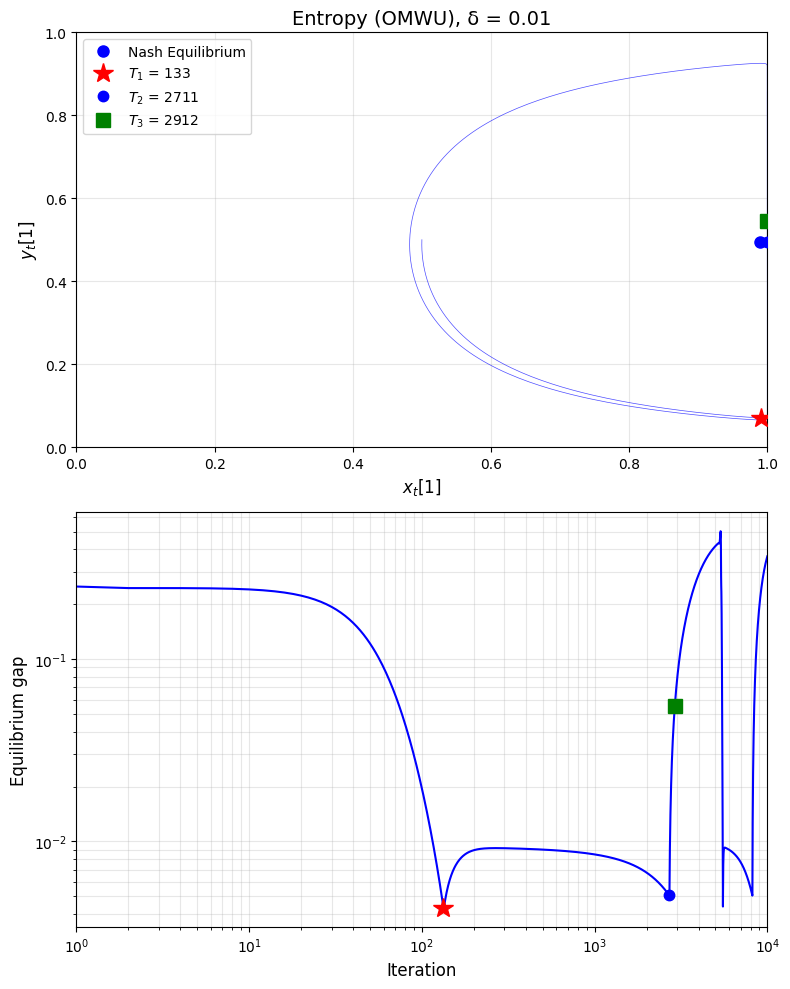

In [24]:
import numpy as np
import matplotlib.pyplot as plt
from mpmath import mp, exp, log
import warnings
warnings.filterwarnings('ignore')

# Set precision to 1000 digits as mentioned in the paper
mp.dps = 1000

class OMWUHighPrecision:
    """OMWU with high precision arithmetic using mpmath"""

    def __init__(self, delta, eta):
        self.delta = delta
        self.eta = eta

        # Game matrix A_delta
        self.A = np.array([
            [0.5 + delta, 0.5],
            [0, 1]
        ])

        # Nash equilibrium
        self.x_star = np.array([1/(1+delta), delta/(1+delta)])
        self.y_star = np.array([1/(2*(1+delta)), (1+2*delta)/(2*(1+delta))])

    def F_eta_R(self, E):
        """Function F_{eta,R} for entropy regularizer (OMWU)"""
        # F_{1,R}(E) = 1/(1 + exp(E))
        # F_{eta,R}(E/eta) = F_{1,R}(E)
        result = 1 / (1 + exp(E))
        return result

    def run(self, num_iterations):
        """Run OMWU dynamics"""
        # Initialize with high precision
        x = [mp.mpf('0.5'), mp.mpf('0.5')]
        y = [mp.mpf('0.5'), mp.mpf('0.5')]

        # Storage for trajectories
        x_traj = []
        y_traj = []
        gaps = []

        # Cumulative losses
        E_x = mp.mpf('0')
        E_y = mp.mpf('0')

        # Previous losses
        e_x_prev = mp.mpf('0')
        e_y_prev = mp.mpf('0')

        # Key iteration markers
        T1 = None
        T2 = None
        T3 = None

        for t in range(num_iterations):
            # Store current state
            x_traj.append([float(x[0]), float(x[1])])
            y_traj.append([float(y[0]), float(y[1])])

            # Compute duality gap
            gap = self.compute_duality_gap(
                np.array([float(x[0]), float(x[1])]),
                np.array([float(y[0]), float(y[1])])
            )
            gaps.append(gap)

            # Check for key iterations (Stage markers from paper)
            if T1 is None and float(x[0]) >= 1/(1+self.delta):
                T1 = t
                print(f"T1 = {T1}, x[1] = {float(x[0]):.6f}, y[1] = {float(y[0]):.6f}")

            if T1 is not None and T2 is None and float(y[0]) >= 1/(2*(1+self.delta)):
                T2 = t
                print(f"T2 = {T2}, x[1] = {float(x[0]):.6f}, y[1] = {float(y[0]):.6f}")

            # T3 is roughly when we see a large duality gap after T2
            if T2 is not None and T3 is None and t > T2 + 100:
                # Find local maximum in gap after T2
                if t > T2 + 200 and gaps[t] > 0.04 and gaps[t] > gaps[t-1]:
                    T3 = t
                    print(f"T3 = {T3}, x[1] = {float(x[0]):.6f}, y[1] = {float(y[0]):.6f}")

            # Compute loss differences
            e_x = -(mp.mpf('0.5')) + (1 + self.delta) * y[0]
            e_y = 1 - (1 + self.delta) * x[0]

            # Update cumulative losses
            if t > 0:
                E_x += e_x_prev
                E_y += e_y_prev

            # OMWU update using F_{eta,R}
            x_new_0 = self.F_eta_R(self.eta * (E_x + e_x))
            y_new_0 = self.F_eta_R(self.eta * (E_y + e_y))

            # Update strategies
            x = [x_new_0, 1 - x_new_0]
            y = [y_new_0, 1 - y_new_0]

            # Store previous losses
            e_x_prev = e_x
            e_y_prev = e_y

        return np.array(x_traj), np.array(y_traj), np.array(gaps), T1, T2, T3

    def compute_duality_gap(self, x, y):
        """Compute duality gap for strategy pair (x, y)"""
        # DualityGap(x,y) = max_y' x^T A y' - min_x' x'^T A y
        max_val = np.max(self.A.T @ x)
        min_val = np.min(self.A @ y)
        return max_val - min_val


def plot_results(x_traj, y_traj, gaps, T1, T2, T3, delta, x_star, y_star):
    """Create the plots matching Figure 1"""

    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(8, 10))

    # Plot 1: Trajectory in strategy space
    ax1.plot(x_traj[:, 0], y_traj[:, 0], 'b-', linewidth=0.5, alpha=0.7)
    ax1.plot(x_star[0], y_star[0], 'bo', markersize=8, label='Nash Equilibrium')

    # Mark key iterations
    if T1 is not None:
        ax1.plot(x_traj[T1, 0], y_traj[T1, 0], 'r*', markersize=15,
                label=f'$T_1$ = {T1}', zorder=5)
    if T2 is not None:
        ax1.plot(x_traj[T2, 0], y_traj[T2, 0], 'b.', markersize=15,
                label=f'$T_2$ = {T2}', zorder=5)
    if T3 is not None:
        ax1.plot(x_traj[T3, 0], y_traj[T3, 0], 'gs', markersize=10,
                label=f'$T_3$ = {T3}', zorder=5)

    ax1.set_xlabel('$x_t[1]$', fontsize=12)
    ax1.set_ylabel('$y_t[1]$', fontsize=12)
    ax1.set_title(f'Entropy (OMWU), δ = {delta}', fontsize=14)
    ax1.grid(True, alpha=0.3)
    ax1.legend(loc='best')
    ax1.set_xlim([0, 1.0])
    ax1.set_ylim([0, 1.0])

    # Plot 2: Equilibrium gap over iterations
    iterations = np.arange(1, len(gaps) + 1)
    ax2.loglog(iterations, gaps, 'b-', linewidth=1.5)

    # Mark key iterations on gap plot
    if T1 is not None and T1 < len(gaps):
        ax2.loglog(T1, gaps[T1], 'r*', markersize=15, zorder=5)
    if T2 is not None and T2 < len(gaps):
        ax2.loglog(T2, gaps[T2], 'b.', markersize=15, zorder=5)
    if T3 is not None and T3 < len(gaps):
        ax2.loglog(T3, gaps[T3], 'gs', markersize=10, zorder=5)

    ax2.set_xlabel('Iteration', fontsize=12)
    ax2.set_ylabel('Equilibrium gap', fontsize=12)
    ax2.grid(True, alpha=0.3, which='both')
    ax2.set_xlim([1, len(gaps)])

    plt.tight_layout()
    return fig


# Main execution
if __name__ == "__main__":
    # Parameters from the paper
    delta = 0.01  # As shown in Figure 1
    eta = 0.1     # Learning rate from the paper
    num_iterations = 10000  # Enough to see the full cycle

    print(f"Running OMWU with δ = {delta}, η = {eta}")
    print(f"Using {mp.dps} digits of precision\n")

    # Create OMWU instance
    omwu = OMWUHighPrecision(delta, eta)

    print("Nash equilibrium:")
    print(f"x* = {omwu.x_star}")
    print(f"y* = {omwu.y_star}\n")

    print("Running dynamics...")
    x_traj, y_traj, gaps, T1, T2, T3 = omwu.run(num_iterations)

    print(f"\nCompleted {num_iterations} iterations")
    print(f"Final duality gap: {gaps[-1]:.6f}")

    # Create plots
    fig = plot_results(x_traj, y_traj, gaps, T1, T2, T3, delta,
                      omwu.x_star, omwu.y_star)

    plt.savefig('omwu_experiment_figure1.png', dpi=300, bbox_inches='tight')
    print("\nPlot saved as 'omwu_experiment_figure1.png'")
    plt.show()

Running OMWU with δ = 0.01, η = 0.1
Using 1000 digits of precision

Nash equilibrium:
x* = [0.99009901 0.00990099]
y* = [0.4950495 0.5049505]

Running dynamics...
T1 = 133, x[1] = 0.990221, y[1] = 0.070831
T2 = 2711, x[1] = 1.000000, y[1] = 0.495077
T3 = 2912, x[1] = 1.000000, y[1] = 0.545203

Completed 120000 iterations
Final duality gap: 0.009876

Plot saved as 'omwu_experiment_figure1.png'


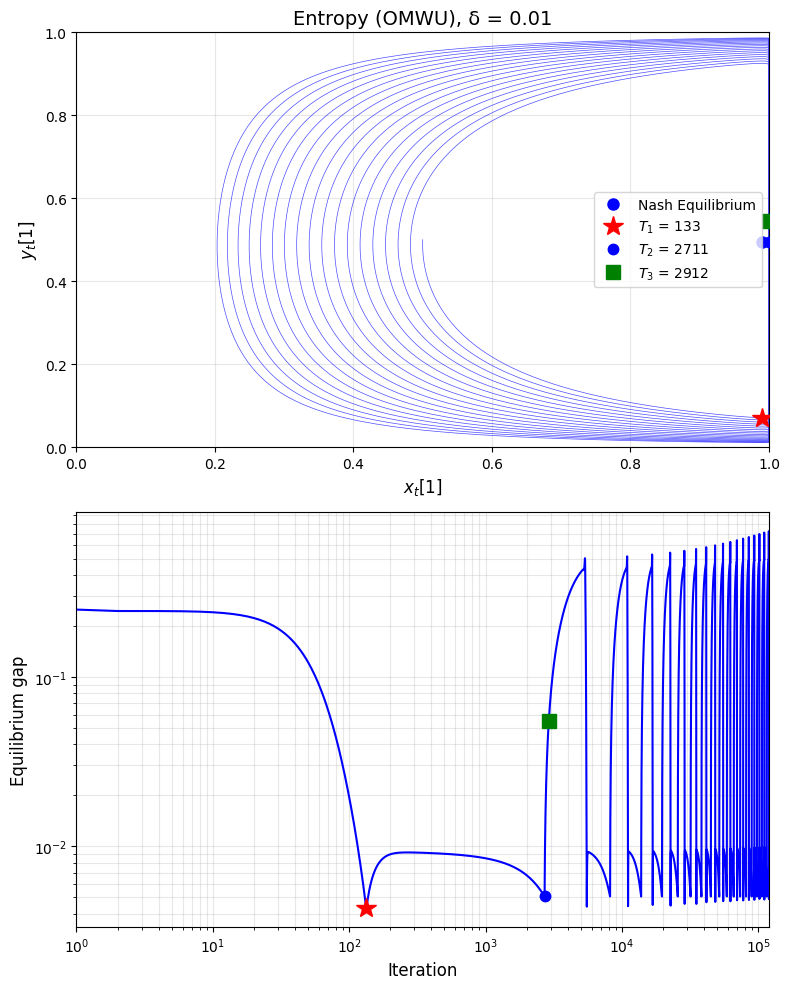

In [31]:
import numpy as np
import matplotlib.pyplot as plt
from mpmath import mp, exp, log
import warnings
warnings.filterwarnings('ignore')

# Set precision to 1000 digits as mentioned in the paper
mp.dps = 1000

class OMWUHighPrecision:
    """OMWU with high precision arithmetic using mpmath"""

    def __init__(self, delta, eta):
        self.delta = delta
        self.eta = eta

        # Game matrix A_delta
        self.A = np.array([
            [0.5 + delta, 0.5],
            [0, 1]
        ])

        # Nash equilibrium
        self.x_star = np.array([1/(1+delta), delta/(1+delta)])
        self.y_star = np.array([1/(2*(1+delta)), (1+2*delta)/(2*(1+delta))])

    def F_eta_R(self, E):
        """Function F_{eta,R} for entropy regularizer (OMWU)"""
        # F_{1,R}(E) = 1/(1 + exp(E))
        # F_{eta,R}(E/eta) = F_{1,R}(E)
        result = 1 / (1 + exp(E))
        return result

    def run(self, num_iterations):
        """Run OMWU dynamics"""
        # Initialize with high precision
        x = [mp.mpf('0.5'), mp.mpf('0.5')]
        y = [mp.mpf('0.5'), mp.mpf('0.5')]

        # Storage for trajectories
        x_traj = []
        y_traj = []
        gaps = []

        # Cumulative losses
        E_x = mp.mpf('0')
        E_y = mp.mpf('0')

        # Previous losses
        e_x_prev = mp.mpf('0')
        e_y_prev = mp.mpf('0')

        # Key iteration markers
        T1 = None
        T2 = None
        T3 = None

        for t in range(num_iterations):
            # Store current state
            x_traj.append([float(x[0]), float(x[1])])
            y_traj.append([float(y[0]), float(y[1])])

            # Compute duality gap
            gap = self.compute_duality_gap(
                np.array([float(x[0]), float(x[1])]),
                np.array([float(y[0]), float(y[1])])
            )
            gaps.append(gap)

            # Check for key iterations (Stage markers from paper)
            if T1 is None and float(x[0]) >= 1/(1+self.delta):
                T1 = t
                print(f"T1 = {T1}, x[1] = {float(x[0]):.6f}, y[1] = {float(y[0]):.6f}")

            if T1 is not None and T2 is None and float(y[0]) >= 1/(2*(1+self.delta)):
                T2 = t
                print(f"T2 = {T2}, x[1] = {float(x[0]):.6f}, y[1] = {float(y[0]):.6f}")

            # T3 is roughly when we see a large duality gap after T2
            if T2 is not None and T3 is None and t > T2 + 100:
                # Find local maximum in gap after T2
                if t > T2 + 200 and gaps[t] > 0.04 and gaps[t] > gaps[t-1]:
                    T3 = t
                    print(f"T3 = {T3}, x[1] = {float(x[0]):.6f}, y[1] = {float(y[0]):.6f}")

            # Compute loss differences
            e_x = -(mp.mpf('0.5')) + (1 + self.delta) * y[0]
            e_y = 1 - (1 + self.delta) * x[0]

            # Update cumulative losses
            if t > 0:
                E_x += e_x_prev
                E_y += e_y_prev

            # OMWU update using F_{eta,R}
            x_new_0 = self.F_eta_R(self.eta * (E_x + e_x))
            y_new_0 = self.F_eta_R(self.eta * (E_y + e_y))

            # Update strategies
            x = [x_new_0, 1 - x_new_0]
            y = [y_new_0, 1 - y_new_0]

            # Store previous losses
            e_x_prev = e_x
            e_y_prev = e_y

        return np.array(x_traj), np.array(y_traj), np.array(gaps), T1, T2, T3

    def compute_duality_gap(self, x, y):
        """Compute duality gap for strategy pair (x, y)"""
        # DualityGap(x,y) = max_y' x^T A y' - min_x' x'^T A y
        max_val = np.max(self.A.T @ x)
        min_val = np.min(self.A @ y)
        return max_val - min_val


def plot_results(x_traj, y_traj, gaps, T1, T2, T3, delta, x_star, y_star):
    """Create the plots matching Figure 1"""

    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(8, 10))

    # Plot 1: Trajectory in strategy space
    ax1.plot(x_traj[:, 0], y_traj[:, 0], 'b-', linewidth=0.5, alpha=0.7)
    ax1.plot(x_star[0], y_star[0], 'bo', markersize=8, label='Nash Equilibrium')

    # Mark key iterations
    if T1 is not None:
        ax1.plot(x_traj[T1, 0], y_traj[T1, 0], 'r*', markersize=15,
                label=f'$T_1$ = {T1}', zorder=5)
    if T2 is not None:
        ax1.plot(x_traj[T2, 0], y_traj[T2, 0], 'b.', markersize=15,
                label=f'$T_2$ = {T2}', zorder=5)
    if T3 is not None:
        ax1.plot(x_traj[T3, 0], y_traj[T3, 0], 'gs', markersize=10,
                label=f'$T_3$ = {T3}', zorder=5)

    ax1.set_xlabel('$x_t[1]$', fontsize=12)
    ax1.set_ylabel('$y_t[1]$', fontsize=12)
    ax1.set_title(f'Entropy (OMWU), δ = {delta}', fontsize=14)
    ax1.grid(True, alpha=0.3)
    ax1.legend(loc='best')
    ax1.set_xlim([0, 1.0])
    ax1.set_ylim([0, 1.0])

    # Plot 2: Equilibrium gap over iterations
    iterations = np.arange(1, len(gaps) + 1)
    ax2.loglog(iterations, gaps, 'b-', linewidth=1.5)

    # Mark key iterations on gap plot
    if T1 is not None and T1 < len(gaps):
        ax2.loglog(T1, gaps[T1], 'r*', markersize=15, zorder=5)
    if T2 is not None and T2 < len(gaps):
        ax2.loglog(T2, gaps[T2], 'b.', markersize=15, zorder=5)
    if T3 is not None and T3 < len(gaps):
        ax2.loglog(T3, gaps[T3], 'gs', markersize=10, zorder=5)

    ax2.set_xlabel('Iteration', fontsize=12)
    ax2.set_ylabel('Equilibrium gap', fontsize=12)
    ax2.grid(True, alpha=0.3, which='both')
    ax2.set_xlim([1, len(gaps)])

    plt.tight_layout()
    return fig


# Main execution
if __name__ == "__main__":
    # Parameters from the paper
    delta = 0.01  # As shown in Figure 1
    eta = 0.1     # Learning rate from the paper
    num_iterations = 120000  # Enough to see the full cycle

    print(f"Running OMWU with δ = {delta}, η = {eta}")
    print(f"Using {mp.dps} digits of precision\n")

    # Create OMWU instance
    omwu = OMWUHighPrecision(delta, eta)

    print("Nash equilibrium:")
    print(f"x* = {omwu.x_star}")
    print(f"y* = {omwu.y_star}\n")

    print("Running dynamics...")
    x_traj, y_traj, gaps, T1, T2, T3 = omwu.run(num_iterations)

    print(f"\nCompleted {num_iterations} iterations")
    print(f"Final duality gap: {gaps[-1]:.6f}")

    # Create plots
    fig = plot_results(x_traj, y_traj, gaps, T1, T2, T3, delta,
                      omwu.x_star, omwu.y_star)

    plt.savefig('omwu_experiment_figure1.png', dpi=300, bbox_inches='tight')
    print("\nPlot saved as 'omwu_experiment_figure1.png'")
    plt.show()

In [32]:
#################################

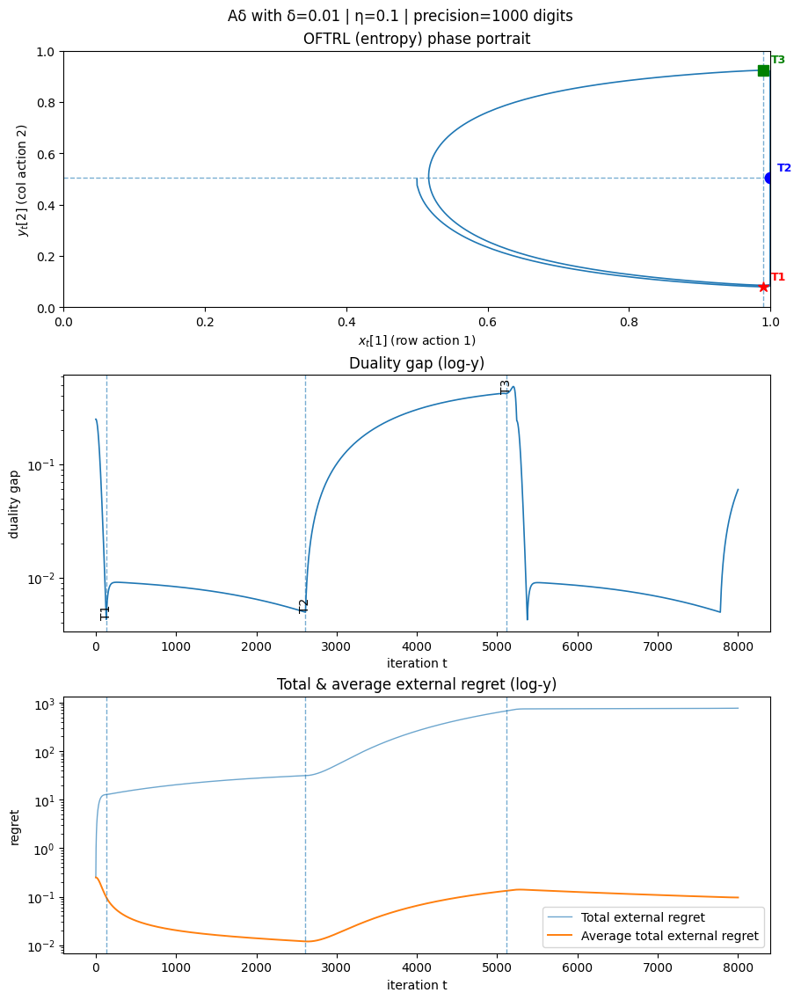

In [38]:
# Colab-ready: OFTRL (entropy) on A_delta with paper-style plots and robust T1/T2/T3.

from __future__ import annotations
import mpmath as mp
import matplotlib.pyplot as plt
from dataclasses import dataclass, field

# -----------------------
# CONFIG (edit here)
# -----------------------
CONFIG = {
    "T": 8000,             # iterations; use large enough to see T3 with eta=0.1
    "delta": "1e-2",         # Figure 1 uses 1e-2
    "eta": "0.1",            # paper states 0.1 explicitly near Figure 2
    "precision_digits": 1000,
    "print_every": 0,        # >0 to see progress
    # T3 detector (robust smoothing)
    "T3_window": 200,
    "T3_slope_eps": 1e-6,
}

# -----------------------
# helpers
# -----------------------
def mpf(x): return x if isinstance(x, mp.mpf) else mp.mpf(x)
def sigmoid(z): return 1 / (1 + mp.e**(-z))
def fmt_e(x, d=6): return f"{float(x):.{d}e}"

# -----------------------
# A_delta game (mpmath only)
# -----------------------
@dataclass
class HardGame:
    delta: mp.mpf
    a11: mp.mpf = field(init=False); a12: mp.mpf = field(init=False)
    a21: mp.mpf = field(init=False); a22: mp.mpf = field(init=False)
    def __post_init__(self):
        self.a11 = mp.mpf('0.5') + self.delta
        self.a12 = mp.mpf('0.5')
        self.a21 = mp.mpf('0.0')
        self.a22 = mp.mpf('1.0')
    # u = A y (row payoff vector)
    def Ay(self, y0, y1):
        u1 = self.a11*y0 + self.a12*y1
        u2 = self.a21*y0 + self.a22*y1  # = y1
        return u1, u2
    # c = A^T x
    def ATx(self, x0, x1):
        c1 = self.a11*x0 + self.a21*x1
        c2 = self.a12*x0 + self.a22*x1
        return c1, c2
    # value and best responses
    def value(self, x0, x1, y0, y1):
        u1, u2 = self.Ay(y0, y1)
        return x0*u1 + x1*u2
    def br_row_val(self, y0, y1):
        u1, u2 = self.Ay(y0, y1)
        return u1 if u1 > u2 else u2
    def br_col_val(self, x0, x1):
        c1, c2 = self.ATx(x0, x1)
        return c1 if c1 < c2 else c2
    def duality_gap(self, x0, x1, y0, y1):
        return self.br_row_val(y0, y1) - self.br_col_val(x0, x1)

# -----------------------
# OFTRL (entropy) in 2-action difference form
# play_t = sigma( eta * (E_{t-1} + e_{t-1}) )
# then observe e_t, set E_t=E_{t-1}+e_t and m_{t+1}=e_t,
# next play_{t+1} = sigma( eta * (E_t + m_{t+1}) ) = sigma( eta * (E_t + e_t) )
# -----------------------
@dataclass
class OFTRL2Action:
    eta: mp.mpf
    # current mixed strategies (at time t)
    x0: mp.mpf = mp.mpf('0.5'); x1: mp.mpf = mp.mpf('0.5')
    y0: mp.mpf = mp.mpf('0.5'); y1: mp.mpf = mp.mpf('0.5')
    # cumulative sums up to t-1
    Ex: mp.mpf = mp.mpf('0'); Ey: mp.mpf = mp.mpf('0')
    # previous differences e_{t-1} (for m_t = e_{t-1})
    ex_prev: mp.mpf = mp.mpf('0'); ey_prev: mp.mpf = mp.mpf('0')

    def play_from_state(self):
        # produce x_t,y_t from current (E_{t-1}, e_{t-1})
        zx = self.eta * (self.Ex + self.ex_prev)
        zy = self.eta * (self.Ey + self.ey_prev)
        self.x0 = sigmoid(zx); self.x1 = 1 - self.x0
        self.y0 = sigmoid(zy); self.y1 = 1 - self.y0

    def observe_and_advance(self, game: HardGame):
        # compute current round differences e_t at (x_t,y_t)
        u1, u2 = game.Ay(self.y0, self.y1)
        ex_cur = u1 - u2
        c1, c2 = game.ATx(self.x0, self.x1)
        ey_cur = c2 - c1
        # advance E_t and set m_{t+1} = e_t
        self.Ex += ex_cur
        self.Ey += ey_cur
        self.ex_prev = ex_cur
        self.ey_prev = ey_cur
        # now x_{t+1}, y_{t+1} will be produced by next play_from_state()

# -----------------------
# Run and plot
# -----------------------
def run_oftrl(cfg):
    game = HardGame(cfg["delta"])
    alg  = OFTRL2Action(cfg["eta"])

    # produce t=1 play (E_0=0, e_0=0)
    alg.play_from_state()

    xs, ys, gaps = [], [], []
    R_row = mp.mpf('0'); R_col = mp.mpf('0')
    R_tot, R_avg = [], []

    for t in range(1, int(CONFIG["T"])+1):
        # log current iterate (paper axes: x = x[0], y = y[1])
        xs.append(float(alg.x0))
        ys.append(float(alg.y1))

        # duality gap and regrets
        gap_t = game.duality_gap(alg.x0, alg.x1, alg.y0, alg.y1)
        gaps.append(max(float(gap_t), 1e-300))
        br_r = game.br_row_val(alg.y0, alg.y1)
        val  = game.value(alg.x0, alg.x1, alg.y0, alg.y1)
        br_c = game.br_col_val(alg.x0, alg.x1)
        R_row += (br_r - val); R_col += (val - br_c)
        Rt = R_row + R_col
        R_tot.append(float(Rt)); R_avg.append(max(float(Rt)/t, 1e-300))

        # advance to next iterate
        alg.observe_and_advance(game)
        alg.play_from_state()

    # ---------- Stage markers computed post-hoc (paper-consistent) ----------
    T = len(xs)
    thr_x = 1.0 / (1.0 + float(game.delta))                 # 1/(1+δ)
    thr_y = 1.0 - 1.0 / (2.0 * (1.0 + float(game.delta)))   # 1 - 1/(2(1+δ))
    eps   = 1e-12

    # T1: first time x >= 1/(1+δ)
    T1_idx = next((i for i in range(T) if xs[i] >= thr_x), None)

    # T2: first time >= T1 with y >= 1 - 1/(2(1+δ))  (remember: y-axis is y[1])
    T2_idx = None
    if T1_idx is not None:
        T2_idx = next((i for i in range(T1_idx, T) if ys[i] >= thr_y), None)

    # T3: first strict local max of y after a minimum wait, while x-band holds for *all* steps T2..t
    T3_idx = None
    if T2_idx is not None:
        # Minimum wait: ceil(C / (eta * delta))
        min_wait = int(mp.ceil(mpf(CONFIG.get("T3_min_c", 1.0)) /
                               (cfg["eta"] * cfg["delta"])))
        start = min(T-2, max(T2_idx + min_wait, T2_idx + 1))

        # helper: has x-band held on the entire interval [T2_idx, i]?
        def x_band_ok(i):
            # small tolerance eps for plotting roundoff
            for j in range(T2_idx, i+1):
                if xs[j] + eps < thr_x:
                    return False
            return True

        # First strict local maximum after 'start' with band satisfied
        for i in range(start, T-1):
            if xs[i] + eps >= thr_x and x_band_ok(i):
                inc_before = ys[i] >= ys[i-1] - eps
                dec_after  = ys[i+1] <= ys[i]   - eps
                if inc_before and dec_after:
                    T3_idx = i
                    break

        # Fallback: argmax y after 'start' subject to band
        if T3_idx is None:
            cand = [i for i in range(start, T) if x_band_ok(i)]
            if cand:
                T3_idx = max(cand, key=lambda k: ys[k])

    markers = {
        "T1": None if T1_idx is None else T1_idx + 1,
        "T2": None if T2_idx is None else T2_idx + 1,
        "T3": None if T3_idx is None else T3_idx + 1,
    }
    series = {
        "x": xs, "y": ys, "gap": gaps,
        "R_total": R_tot, "R_total_avg": R_avg
    }
    return series, markers, game

def plot_all(series, markers, game):
    T = len(series["gap"]); ts = list(range(1, T+1))
    fig, axes = plt.subplots(3, 1, figsize=(9, 11), constrained_layout=True)

    # (A) Phase portrait
    ax = axes[0]
    ax.plot(series["x"], series["y"], linewidth=1.2)
    ax.set_xlim(0.0, 1.0); ax.set_ylim(0.0, 1.0)
    ax.set_xlabel(r"$x_t[1]$ (row action 1)")
    ax.set_ylabel(r"$y_t[2]$ (col action 2)")
    ax.set_title("OFTRL (entropy) phase portrait")

    # threshold lines + markers
    thr_x = 1.0 / (1.0 + float(game.delta))
    thr_y = 1.0 - 1.0 / (2.0 * (1.0 + float(game.delta)))
    ax.axvline(thr_x, linestyle="--", linewidth=1.0, alpha=0.6)
    ax.axhline(thr_y, linestyle="--", linewidth=1.0, alpha=0.6)

    def mark_T(t_idx, color, marker, label):
        if t_idx is None: return
        i = t_idx - 1
        ax.plot(series["x"][i], series["y"][i], marker=marker, color=color, markersize=9, linewidth=0)
        ax.annotate(label, (series["x"][i], series["y"][i]),
                    textcoords="offset points", xytext=(6,6),
                    fontsize=9, color=color, weight="bold")
    mark_T(markers.get("T1"), "red",  "*", "T1")
    mark_T(markers.get("T2"), "blue", "o", "T2")
    mark_T(markers.get("T3"), "green","s", "T3")

    # (B) Duality gap (log-y)
    ax = axes[1]
    ax.plot(ts, series["gap"], linewidth=1.2)
    ax.set_yscale("log")
    ax.set_xlabel("iteration t"); ax.set_ylabel("duality gap")
    ax.set_title("Duality gap (log-y)")
    for tag in ("T1","T2","T3"):
        tstar = markers.get(tag)
        if tstar is not None:
            ax.axvline(tstar, linestyle="--", linewidth=1.0, alpha=0.6)
            ax.text(tstar, series["gap"][min(tstar-1, T-1)], tag,
                    rotation=90, va="bottom", ha="center")

    # (C) Total & average external regret (log-y)
    ax = axes[2]
    ax.plot(ts, series["R_total"], label="Total external regret", linewidth=1.0, alpha=0.65)
    ax.plot(ts, series["R_total_avg"], label="Average total external regret", linewidth=1.4)
    ax.set_yscale("log")
    ax.set_xlabel("iteration t"); ax.set_ylabel("regret")
    ax.set_title("Total & average external regret (log-y)")
    for tag in ("T1","T2","T3"):
        tstar = markers.get(tag)
        if tstar is not None:
            ax.axvline(tstar, linestyle="--", linewidth=1.0, alpha=0.6)
    ax.legend(loc="best")

    fig.suptitle(f"Aδ with δ={game.delta} | η={CONFIG['eta']} | precision={CONFIG['precision_digits']} digits", y=1.02)
    plt.show()

# run
mp.mp.dps = int(CONFIG["precision_digits"])
series, markers, game = run_oftrl({
    "T": int(CONFIG["T"]),
    "delta": mpf(CONFIG["delta"]),
    "eta": mpf(CONFIG["eta"]),
})
plot_all(series, markers, game)


In [39]:
##################################

Markers: {'T1': 3, 'T2': 104, 'T3': 104}
(For reference) Stage-III wait W=0  with T_block=24  and c1=0.024979, c2=0.000001


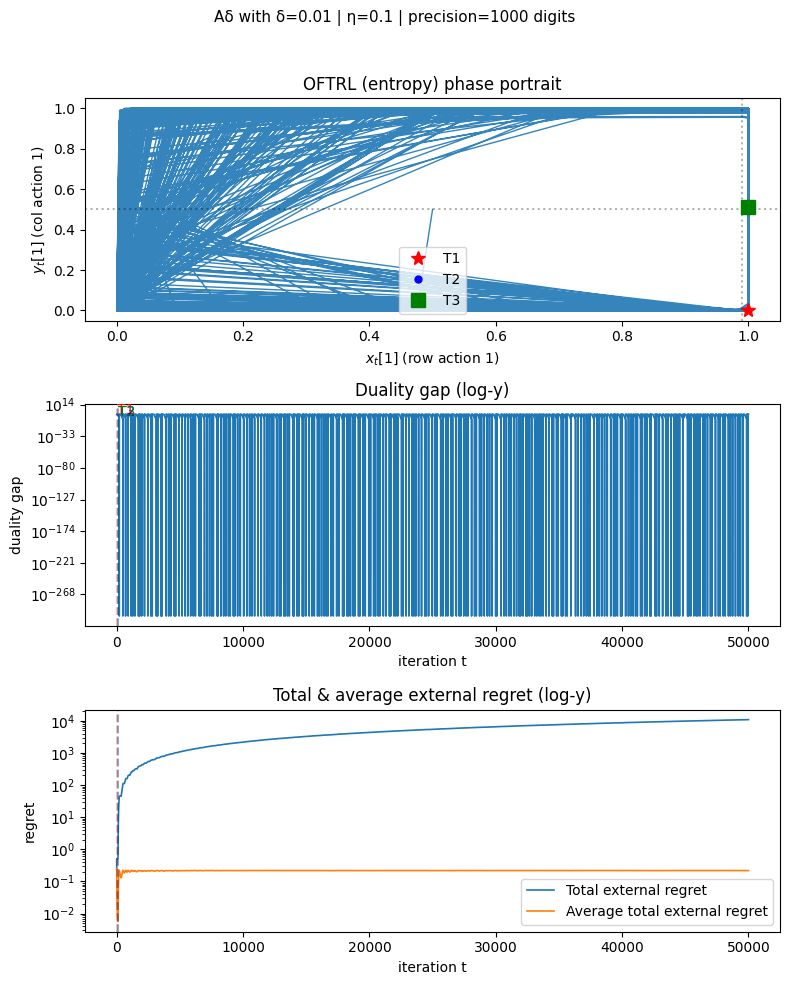

In [40]:
# Colab-ready OFTRL (entropy) on A_δ with exact T1/T2/T3 per the paper
# - High precision (mpmath, 1000 digits)
# - Phase portrait + duality gap + total & average external regret (log-y)
# - T3 uses the Stage-III lower-bound wait and the y-threshold 1/2 + c2 from Appendix C.1

import math
import warnings
warnings.filterwarnings("ignore")

import numpy as np
import matplotlib.pyplot as plt
from mpmath import mp

# ------------------ precision ------------------
mp.dps = 1000  # 1000 digits (paper used this to handle near-boundary iterates)

# ------------------ game ------------------
class HardGame:
    # A_δ = [[1/2 + δ, 1/2],[0,1]]
    def __init__(self, delta: float):
        self.delta = mp.mpf(delta)

    def e_x(self, y1):  # e_x^t = ℓ_x^t[1]-ℓ_x^t[2] = -1/2 + (1+δ)·y[1]
        return -mp.mpf('0.5') + (1 + self.delta) * y1

    def e_y(self, x1):  # e_y^t = 1 - (1+δ)·x[1]
        return mp.mpf('1.0') - (1 + self.delta) * x1

    # value v = x^T A y (row reward)
    def value(self, x0, x1, y0, y1):
        delta = self.delta
        # A y:
        Ay1 = (mp.mpf('0.5') + delta) * y1 + mp.mpf('0.5') * y0
        Ay2 = y1  # second row payoff vs y
        v = x1 * Ay1 + x0 * Ay2
        return v

    def br_row_val(self, y0, y1):
        delta = self.delta
        Ay1 = (mp.mpf('0.5') + delta) * y1 + mp.mpf('0.5') * y0  # payoff row action 1
        Ay2 = y1                                               # payoff row action 2
        return max(float(Ay1), float(Ay2))

    def br_col_val(self, x0, x1):
        # column chooses j to minimize x^T A e_j  (since column's reward is -v)
        # x^T A = [ (1/2+δ) x1         ,  (1/2) x1 + 1*x0 ]
        delta = self.delta
        c1 = (mp.mpf('0.5') + delta) * x1                       # value if column plays j=1
        c2 = mp.mpf('0.5') * x1 + x0                            # value if column plays j=2
        return min(float(c1), float(c2))

    def duality_gap(self, x0, x1, y0, y1):
        # gap = max_j (x^T A)_j - min_i (A y)_i
        delta = self.delta
        # x^T A
        c1 = (mp.mpf('0.5') + delta) * x1
        c2 = mp.mpf('0.5') * x1 + x0
        max_over_y = max(float(c1), float(c2))
        # A y
        Ay1 = (mp.mpf('0.5') + delta) * y1 + mp.mpf('0.5') * y0
        Ay2 = y1
        min_over_x = min(float(Ay1), float(Ay2))
        return max_over_y - min_over_x

# ------------------ OFTRL (entropy / OMWU) ------------------
def F_eta_entropy(E, eta):
    # F_{η,R}(E) = argmin_x { x·E + (1/η) [ x log x + (1-x) log(1-x) ] }
    # closed form: 1 / (1 + exp(E/η))
    return 1 / (1 + mp.e**(E / eta))

class OFTRL2Action:
    """
    State holds cumulative differences E_x, E_y and last differences e_x_prev, e_y_prev.
    At each 'play_from_state()' we produce current (x_t, y_t):
        x_t[1] = F_eta( E_x + e_x_prev ),  y_t[1] = F_eta( E_y + e_y_prev )
    After observing losses for this round, call 'observe_and_advance(game)' to update
    E_* and e_*_prev in-place for the next round.
    """
    def __init__(self, eta):
        self.eta = mp.mpf(eta)
        # cumulative differences and previous diffs
        self.Ex = mp.mpf('0.0'); self.ey_prev = mp.mpf('0.0')
        self.Ey = mp.mpf('0.0'); self.ex_prev = mp.mpf('0.0')
        # current probabilities (set by play_from_state)
        self.x1 = mp.mpf('0.5'); self.x0 = mp.mpf('0.5')
        self.y1 = mp.mpf('0.5'); self.y0 = mp.mpf('0.5')

    def play_from_state(self):
        x1 = F_eta_entropy(self.Ex + self.ex_prev, self.eta)
        y1 = F_eta_entropy(self.Ey + self.ey_prev, self.eta)
        self.x1 = x1; self.x0 = 1 - x1
        self.y1 = y1; self.y0 = 1 - y1

    def observe_and_advance(self, game: HardGame):
        # compute per-round differences from current play
        ex = game.e_x(self.y1)
        ey = game.e_y(self.x1)
        # update cumulative sums
        self.Ex += ex
        self.Ey += ey
        # store latest diffs (used in next round's F_eta)
        self.ex_prev = ex
        self.ey_prev = ey

# ------------------ T1/T2/T3 per the paper ------------------
def paper_constants_entropy():
    # L = 1/2; c1 = 1/2 - F_{1,R}(1/(20L)), c2 = F_{1,R}(-c1^2/(480L)) - 1/2
    L = mp.mpf('0.5')
    F1 = lambda E: 1 / (1 + mp.e**E)
    c1 = mp.mpf('0.5') - F1(1 / (20 * L))     # > 0
    c2 = F1(- (c1**2) / (480 * L)) - mp.mpf('0.5')
    return L, c1, c2

def find_markers_paper(xs, ys, delta, eta):
    """
    xs, ys are float arrays of x_t[1], y_t[1] over t=1..T.
    Implements Stage I/II/III definitions exactly:
      T1: first t with x>=1/(1+δ)
      T2: first t>=T1 with y>=1/(2(1+δ))
      T3: first t>=T2+W with x>=1/(1+δ) and y>=1/2+c2
          where W = floor( (c1/10) * T ) - 2 and T = floor( c1 / (2 L η δ) )
    """
    T = len(xs)
    thr_x = 1.0 / (1.0 + float(delta))
    thr_y = 1.0 / (2.0 * (1.0 + float(delta)))
    L, c1, c2 = paper_constants_entropy()
    c1f, c2f = float(c1), float(c2)
    # Stage-II helper values
    T_block = int(mp.floor(c1 / (2 * L * eta * delta)))
    W = max(0, int(mp.floor((c1 * T_block) / 10) - 2))

    # T1
    T1 = next((i+1 for i in range(T) if xs[i] >= thr_x), None)
    # T2
    T2 = None
    if T1 is not None:
        T2 = next((i+1 for i in range(T1-1, T) if ys[i] >= thr_y), None)
    # T3
    T3 = None
    if T2 is not None:
        start = min(T, T2 + W)
        for i in range(start-1, T):
            if xs[i] >= thr_x and ys[i] >= 0.5 + c2f:
                T3 = i + 1
                break
    return {"T1": T1, "T2": T2, "T3": T3}, {"thr_x": thr_x, "thr_y": thr_y, "c1": c1f, "c2": c2f, "W": W, "T_block": T_block}

# ------------------ driver ------------------
CONFIG = {
    "delta": 0.01,     # δ = 1e-2 (paper Fig. 1)
    "eta":   0.1,      # η = 0.1  (paper Fig. 1 and Fig. 2 captions)
    "T":     50000,    # make this large enough to pass the Stage-III wait
    "print_every": 0,  # 0 = silent
}

def run_oftrl_and_plot(cfg):
    game = HardGame(cfg["delta"])
    alg  = OFTRL2Action(cfg["eta"])

    xs, ys, gaps = [], [], []
    R_row = mp.mpf('0.0'); R_col = mp.mpf('0.0')
    R_tot, R_avg = [], []

    # t=1 play
    alg.play_from_state()

    for t in range(1, int(cfg["T"])+1):
        xs.append(float(alg.x1))
        ys.append(float(alg.y1))

        gap_t = game.duality_gap(alg.x0, alg.x1, alg.y0, alg.y1)
        gaps.append(max(float(gap_t), 1e-300))

        v = game.value(alg.x0, alg.x1, alg.y0, alg.y1)
        br_r = game.br_row_val(alg.y0, alg.y1)
        br_c = game.br_col_val(alg.x0, alg.x1)
        R_row += (br_r - v)
        R_col += (v - br_c)
        Rt = R_row + R_col
        R_tot.append(float(Rt))
        R_avg.append(max(float(Rt)/t, 1e-300))

        if cfg["print_every"] and (t % cfg["print_every"] == 0):
            print(f"t={t:>7d}  gap={float(gap_t):.3e}  x1={float(alg.x1):.6f}  y1={float(alg.y1):.6f}")

        # advance to next round
        alg.observe_and_advance(game)
        alg.play_from_state()

    markers, meta = find_markers_paper(xs, ys, cfg["delta"], cfg["eta"])

    # ------------------ plots ------------------
    fig = plt.figure(figsize=(8, 10))
    fig.suptitle(
        f"Aδ with δ={cfg['delta']} | η={cfg['eta']} | precision=1000 digits",
        fontsize=11
    )

    # Phase portrait
    ax1 = plt.subplot(3,1,1)
    ax1.plot(xs, ys, linewidth=1.0, alpha=0.9)
    ax1.set_title("OFTRL (entropy) phase portrait")
    ax1.set_xlabel(r"$x_t[1]$ (row action 1)")
    ax1.set_ylabel(r"$y_t[1]$ (col action 1)")
    # threshold lines
    ax1.axvline(meta["thr_x"], color='k', linestyle=':', alpha=0.3)
    ax1.axhline(0.5, color='k', linestyle=':', alpha=0.3)
    # markers
    for name, (mkr, color) in {"T1":("r*", "r"), "T2":("b.", "b"), "T3":("gs", "g")}.items():
        t = markers[name]
        if t is not None and 1 <= t <= len(xs):
            ax1.plot(xs[t-1], ys[t-1], mkr, markersize=10, label=name)
    ax1.legend(loc='best')

    # Duality gap (log-y)
    ax2 = plt.subplot(3,1,2)
    ax2.plot(range(1,len(gaps)+1), gaps, linewidth=1.2)
    ax2.set_yscale('log')
    ax2.set_title("Duality gap (log-y)")
    ax2.set_xlabel("iteration t")
    ax2.set_ylabel("duality gap")
    for name,color in {"T1":"r","T2":"b","T3":"g"}.items():
        t = markers[name]
        if t is not None:
            ax2.axvline(t, color=color, linestyle='--', alpha=0.25)
            ax2.text(t, gaps[max(0,min(t-1,len(gaps)-1))], name, color=color)

    # Total & average external regret (log-y)
    ax3 = plt.subplot(3,1,3)
    iters = range(1, len(R_tot)+1)
    ax3.plot(iters, R_tot, label="Total external regret", linewidth=1.2)
    ax3.plot(iters, R_avg, label="Average total external regret", linewidth=1.2)
    ax3.set_yscale('log')
    ax3.set_title("Total & average external regret (log-y)")
    ax3.set_xlabel("iteration t"); ax3.set_ylabel("regret")
    for name,color in {"T1":"r","T2":"b","T3":"g"}.items():
        t = markers[name]
        if t is not None:
            ax3.axvline(t, color=color, linestyle='--', alpha=0.25)
    ax3.legend(loc='best')

    plt.tight_layout(rect=[0,0,1,0.96])
    return fig, markers, meta

# ---------- run ----------
if __name__ == "__main__":
    fig, markers, meta = run_oftrl_and_plot(CONFIG)
    print("Markers:", markers)
    print(f"(For reference) Stage-III wait W={meta['W']}  with T_block={meta['T_block']}  and c1={meta['c1']:.6f}, c2={meta['c2']:.6f}")
    plt.show()


In [41]:
###################################

delta = 0.01, eta = 0.1, T = 5000
L (neg-entropy) = 1/2
c1 = 0.0249791874789399860991931826041421598213998968905092199835922930651221475440441597686913322387447966214678822525837863388382380982102121983571539499887656717214638634165526996371861180135080119147305898288387819634589858023234029562966245704452050493164185109170873418657704503952630451467350042886526063913977725855063291609271787207799694877117204532665737292728971675141468326754660075891085348981083770090133687321549676675066605488912476687809611470708450273431809939276946445823276390963452600542273339999082973764616928388168359276450362327524314501716678629286306902089543310074295834792711994614470014537018791687818984699182979476803054178982874265774385514682676227873555596896812578022423188091415225399453691886150836224022915796679276013244617720079100404561308500252852292747608231960143085018010860426380873014290953065584863620622608022606545511217067764946880655994121584751850090249086228968669077692901408109978101295

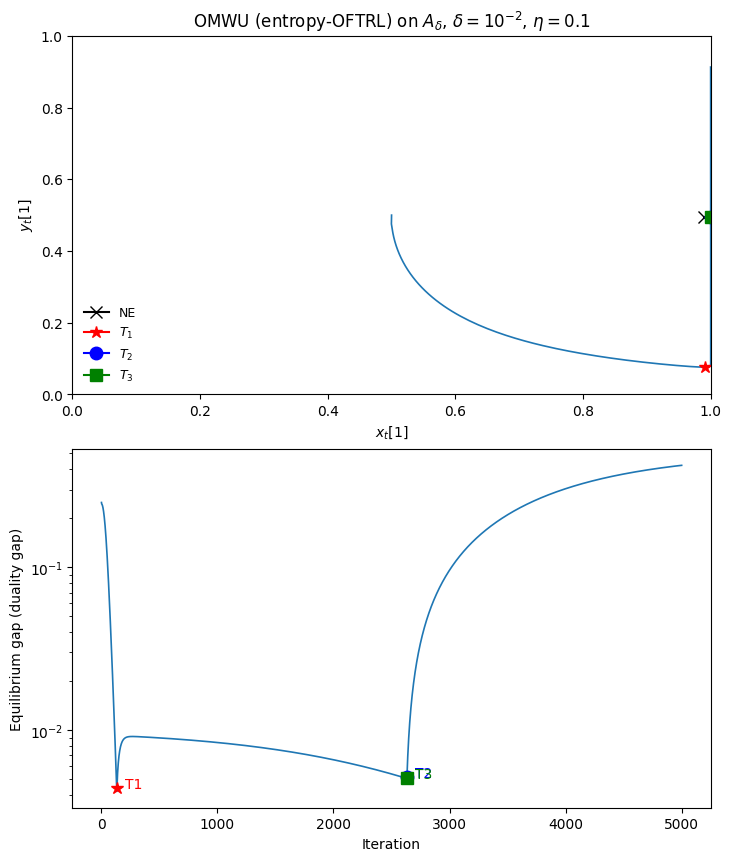

In [44]:
# omwu_oftrl_fig1.py
# Recreate OMWU (entropy-OFTRL) plots from Figure 1:
#  - Top: trajectory of (x_t[1], y_t[1]) in the 2×2 game A_δ
#  - Bottom: last-iterate duality gap vs iteration (log-scale)
#
# Exact choices per paper:
#   * Game A_δ = [[1/2 + δ, 1/2],
#                 [0,       1  ]]      # eq. (2)
#   * OFTRL update (negative entropy => OMWU):
#       x_t = softmax( -η (L_x^{t-1} + ℓ_x^{t-1}) )
#       y_t = softmax( -η (L_y^{t-1} + ℓ_y^{t-1}) )
#     where ℓ_x^t = A y_t,  ℓ_y^t = -A^T x_t,
#           L_x^t = Σ_{k≤t} ℓ_x^k,  L_y^t = Σ_{k≤t} ℓ_y^k.
#
#   * Precision: mp.dps = 1000 (as used for OMWU in the figure caption)
#   * Markers:
#       T1 = first t with x_t[1] ≥ 1/(1+δ)
#       T2 = first t > T1 with y_t[1] ≥ 1/(2(1+δ))
#       For negative entropy: L = 1/2,
#           c1 = 1/2 - F1(-  (−) no!  it's F1(+): c1 = 1/2 - F1( 1/(20L) )
#           c2 = F1( - c1^2/(480L) ) - 1/2
#           Th = floor( c1 / (2 L η δ) )
#           T3 = T2 + floor( c1*Th / 10 ) - 2
#
# Run:  python omwu_oftrl_fig1.py
# (Matplotlib window pops up with the two plots.)

from __future__ import annotations
import math
import matplotlib.pyplot as plt

from mpmath import mp

# ----------------------
# Config (match paper)
# ----------------------
mp.dps = 1000  # 1000-digit precision for OMWU

ETA_DEFAULT = mp.mpf('0.1')   # paper uses η = 0.1 in their OMWU plots
DELTA_DEFAULT = mp.mpf('1e-2')  # δ = 0.01 for Fig. 1
T_DEFAULT = 5000  # iterations; large enough to pass T3 for δ=1e-2, η=0.1

# ----------------------
# Helpers (mp math)
# ----------------------
def mpf(x) -> mp.mpf:
    return x if isinstance(x, mp.mpf) else mp.mpf(x)

def softmax_mp(v):
    """2D softmax with high precision and stability: returns list[mpf, mpf]."""
    v1, v2 = mpf(v[0]), mpf(v[1])
    m = v1 if v1 > v2 else v2
    e1 = mp.e**(v1 - m)
    e2 = mp.e**(v2 - m)
    s = e1 + e2
    return [e1/s, e2/s]

def duality_gap(A, x, y):
    """
    Gap(x,y) = max_y' x^T A y' - min_x' x'^T A y
             = max_j (A^T x)[j] - min_i (A y)[i]
    """
    # A y
    Ay0 = A[0][0]*y[0] + A[0][1]*y[1]
    Ay1 = A[1][0]*y[0] + A[1][1]*y[1]
    # A^T x
    ATx0 = A[0][0]*x[0] + A[1][0]*x[1]
    ATx1 = A[0][1]*x[0] + A[1][1]*x[1]
    max_term = ATx0 if ATx0 > ATx1 else ATx1
    min_term = Ay0 if Ay0 < Ay1 else Ay1
    return max_term - min_term

def logistic(E):
    """F_{1,R}(E) for neg-entropy (2-action): 1 / (1 + exp(E))."""
    return mp.mpf(1) / (mp.mpf(1) + mp.e**(E))

# ----------------------
# Build A_δ (eq. 2)
# ----------------------
def A_delta(delta: mp.mpf):
    return [
        [mp.mpf('0.5') + delta, mp.mpf('0.5')],
        [mp.mpf('0'),            mp.mpf('1')]
    ]

# ----------------------
# OFTRL (OMWU) simulation
# ----------------------
def simulate_omwu_oftrl(delta=DELTA_DEFAULT, eta=ETA_DEFAULT, T=T_DEFAULT):
    A = A_delta(delta)

    # initialize
    # L^0 = 0, ℓ^0 = 0 => x1 = y1 = uniform (by Fη,R(0) = 1/2)
    Lx = [mp.mpf('0'), mp.mpf('0')]
    Ly = [mp.mpf('0'), mp.mpf('0')]
    ellx_prev = [mp.mpf('0'), mp.mpf('0')]
    elly_prev = [mp.mpf('0'), mp.mpf('0')]

    xs = []       # list of (x1,x2), store x1 only for plotting
    ys = []       # same for y
    gaps = []     # duality gap per iteration

    # thresholds and constants for markers (from the paper)
    L_const = mp.mpf('0.5')  # for negative entropy (Appendix C)
    F1 = logistic
    c1 = mp.mpf('0.5') - F1( mp.mpf('1')/(mp.mpf('20')*L_const) )  # = 1/2 - F1(1/(20L))
    c2 = F1( - (c1*c1)/(mp.mpf('480')*L_const) ) - mp.mpf('0.5')  # = F1(-c1^2/(480L)) - 1/2

    # record thresholds
    x_boundary = mp.mpf('1')/(mp.mpf('1')+delta)              # 1/(1+δ)
    y_thresh   = mp.mpf('1')/(mp.mpf('2')*(mp.mpf('1')+delta))# 1/(2(1+δ))
    y_const    = mp.mpf('0.5') + c2

    T1 = None
    T2 = None
    T3 = None

    for t in range(1, int(T)+1):
        # OFTRL decision using L + previous instantaneous loss
        Ex = [Lx[0] + ellx_prev[0], Lx[1] + ellx_prev[1]]
        Ey = [Ly[0] + elly_prev[0], Ly[1] + elly_prev[1]]

        # x_t = softmax( -η Ex ), y_t = softmax( -η Ey )
        x = softmax_mp([-eta*Ex[0], -eta*Ex[1]])
        y = softmax_mp([-eta*Ey[0], -eta*Ey[1]])

        xs.append(x[0])  # store x[1]
        ys.append(y[0])  # store y[1]

        # losses at this t: ℓ_x^t = A y_t, ℓ_y^t = -A^T x_t
        ellx = [
            A[0][0]*y[0] + A[0][1]*y[1],
            A[1][0]*y[0] + A[1][1]*y[1]
        ]
        elly = [
            -(A[0][0]*x[0] + A[1][0]*x[1]),
            -(A[0][1]*x[0] + A[1][1]*x[1])
        ]

        # update cumulative sums
        Lx[0] += ellx[0]; Lx[1] += ellx[1]
        Ly[0] += elly[0]; Ly[1] += elly[1]

        # store for next step
        ellx_prev = ellx
        elly_prev = elly

        # duality gap for last iterates
        gaps.append(duality_gap(A, x, y))

        # Detect T1 and T2 by *definitions*
        if T1 is None and x[0] >= x_boundary:
            T1 = t
        if T1 is not None and T2 is None and y[0] >= y_thresh:
            T2 = t

        # Once we have T2, we can define Th and then T3 from the proof
        if T3 is None and T2 is not None:
            Th = mp.floor( c1 / ( mp.mpf('2')*L_const*eta*delta ) )
            # by the paper, Th ∈ [ c1/(3Lηδ), c1/(2Lηδ) ], we use the floor at 1/(2Lηδ)
            T3_candidate = T2 + int(mp.floor(c1*Th/10)) - 2
            if t >= T3_candidate:
                # The built-in definition makes T3 exist. We mark at that candidate time.
                T3 = T3_candidate

    # NE point (for reference)
    x_star = mp.mpf('1')/(mp.mpf('1')+delta)
    y_star = mp.mpf('1')/(mp.mpf('2')*(mp.mpf('1')+delta))

    # Convert to float for plotting
    x1 = [float(v) for v in xs]
    y1 = [float(v) for v in ys]
    gap = [max(float(g), 1e-300) for g in gaps]  # avoid log(0)

    # Print a small summary (useful sanity checks)
    print(f"delta = {delta}, eta = {eta}, T = {T}")
    print(f"L (neg-entropy) = 1/2")
    print(f"c1 = {c1}")
    print(f"c2 = {c2}  (so 1/2 + c2 ≈ {0.5 + float(c2):.6f})")
    print(f"x-boundary 1/(1+δ) = {x_boundary}")
    print(f"y-threshold 1/(2(1+δ)) = {y_thresh}")
    print(f"NE: x*={x_star}, y*={y_star}")
    print(f"T1={T1}, T2={T2}, T3={T3}")

    # ----------------------
    # Plotting
    # ----------------------
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(7.2, 8.5), constrained_layout=True)

    # Top: trajectory in [0,1]^2
    ax1.plot(x1, y1, lw=1.2)
    ax1.set_xlim(0.0, 1.0); ax1.set_ylim(0.0, 1.0)
    ax1.set_xlabel(r"$x_t[1]$")
    ax1.set_ylabel(r"$y_t[1]$")
    ax1.set_title(r"OMWU (entropy-OFTRL) on $A_\delta$, $\delta=10^{-2}$, $\eta=0.1$")

    # Mark NE
    ax1.plot([float(x_star)], [float(y_star)], marker='x', color='k', ms=8, label="NE")

    # Mark T1, T2, T3 (if found)
    def mark_t(ax, T, color, marker, label):
        if T is not None and 1 <= T <= len(x1):
            ax.plot([x1[T-1]], [y1[T-1]], marker=marker, color=color, ms=9, label=label)

    mark_t(ax1, T1, 'red',  '*', r"$T_1$")
    mark_t(ax1, T2, 'blue', 'o', r"$T_2$")
    mark_t(ax1, T3, 'green','s', r"$T_3$")

    # Bottom: equilibrium gap (semilogy)
    ax2.semilogy(range(1, len(gap)+1), gap, lw=1.2)
    ax2.set_xlabel("Iteration")
    ax2.set_ylabel("Equilibrium gap (duality gap)")

    # Markers on the gap curve
    def mark_gap(ax, T, color, marker, label):
        if T is not None and 1 <= T <= len(gap):
            ax.semilogy([T], [gap[T-1]], marker=marker, color=color, ms=9)
            ax.annotate(label, (T, gap[T-1]), textcoords="offset points", xytext=(6, 0), ha='left', color=color)

    mark_gap(ax2, T1, 'red',  '*',  "T1")
    mark_gap(ax2, T2, 'blue', 'o',  "T2")
    mark_gap(ax2, T3, 'green','s',  "T3")

    # Legend (top)
    ax1.legend(loc="lower left", fontsize=9, frameon=False)

    plt.show()

if __name__ == "__main__":
    simulate_omwu_oftrl()


In [45]:
##############################

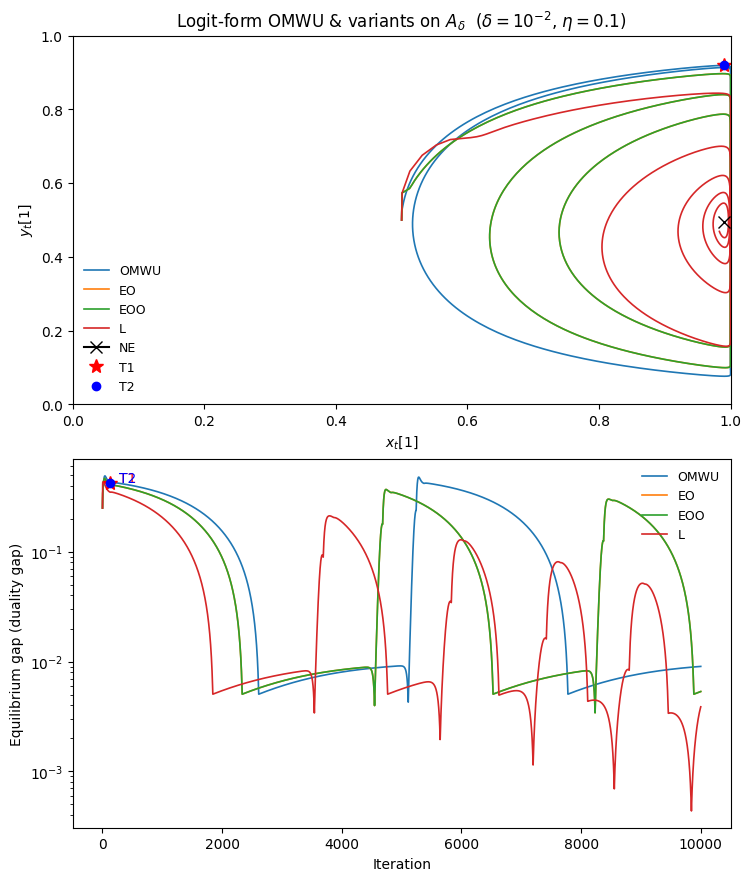

In [50]:
# omwu_logit_fig1_multi.py
# Figure-1 style plots with LOGIT-FORM OMWU + variants (EO, EOO, L=3)
#
# Top:  iterate trajectory (x_t[1], y_t[1]) in A_δ (eq. (2) in the paper)
# Bottom: last-iterate duality gap vs iteration (semilog-y)
#
# ---------- Logit form (all algorithms) ----------
# Keep logits z_x, z_y (2-d each). At each step:
#   x_t = softmax(z_x),  y_t = softmax(z_y)
#   g_x(t) = A @ y_t
#   g_y(t) = - A^T @ x_t         # (so both players "ascend" with +η d_t)
#   d_t depends on the variant (defined below)
#   z_x <- z_x + η d_x(t)
#   z_y <- z_y + η d_y(t)
#
# Variants' d_t (per player, using that player's gradient history):
#   • OMWU          : d_t = 2 g_t − g_{t−1}
#   • OMWU-EO (L)   : d_t = (L+1) g_t − L g_{t−1}       (here we use L = 3)
#   • OMWU-EOO (L)  : d_t = (L+1) g_t − g_{t−1} − pending_t
#                     pending_{t+1} = max(L−1,0) · g_{t−1}
#   • OMWU-L (L)    : d_t = (L+1) g_t − sum_{i=1}^L g_{t−i}
#
# Markers (for OMWU only):
#   T1 = min { t : x_t[1] ≥ 1/(1+δ) }
#   T2 = min { t > T1 : y_t[1] ≥ 1/(2(1+δ)) }
#
# Run:  python omwu_logit_fig1_multi.py

from __future__ import annotations
from collections import deque
import matplotlib.pyplot as plt
from mpmath import mp

# ----------------------
# Precision & defaults
# ----------------------
mp.dps = 1000          # same high precision level
ETA   = mp.mpf('0.1')  # step size
DELTA = mp.mpf('1e-2') # δ = 0.01
T     = 10000          # iterations
BREADTH_L = 5          # L used for EO/EOO and for OMWU-L

# ----------------------
# Helpers (mp math)
# ----------------------
def softmax_mp2(v0: mp.mpf, v1: mp.mpf):
    """Stable 2D softmax in high precision."""
    m = v0 if v0 > v1 else v1
    e0 = mp.e**(v0 - m)
    e1 = mp.e**(v1 - m)
    s = e0 + e1
    return (e0/s, e1/s)

def A_delta(delta: mp.mpf):
    """Game A_δ = [[1/2+δ, 1/2], [0, 1]]."""
    return [
        [mp.mpf('0.5') + delta, mp.mpf('0.5')],
        [mp.mpf('0'),           mp.mpf('1')]
    ]

def duality_gap(A, x, y):
    """
    Gap(x,y) = max_j (A^T x)[j] - min_i (A y)[i]
    """
    Ay0 = A[0][0]*y[0] + A[0][1]*y[1]
    Ay1 = A[1][0]*y[0] + A[1][1]*y[1]
    ATx0 = A[0][0]*x[0] + A[1][0]*x[1]
    ATx1 = A[0][1]*x[0] + A[1][1]*x[1]
    max_term = ATx0 if ATx0 > ATx1 else ATx1
    min_term = Ay0 if Ay0 < Ay1 else Ay1
    return max_term - min_term

# ----------------------
# Variant state for LOGIT updates
# ----------------------
class VariantState:
    def __init__(self, L: int):
        z = mp.mpf('0')
        self.L = L

        # logits (initialized to zero -> uniform)
        self.zx = [z, z]
        self.zy = [z, z]

        # gradient history
        self.gx_prev = [z, z]   # g_{t-1} for x
        self.gy_prev = [z, z]   # g_{t-1} for y

        # for OMWU-L (window-L) we store up to L past grads (most-recent first)
        self.hist_gx = deque([], maxlen=L)
        self.hist_gy = deque([], maxlen=L)

        # for EOO:
        self.pending_x = [z, z]
        self.pending_y = [z, z]

# ----------------------
# Core simulator (one variant, logit form)
# ----------------------
def simulate_variant_logit(name: str, delta=DELTA, eta=ETA, T=T, breadth_L=BREADTH_L):
    """
    Returns (xs, ys, gaps, T1, T2) for the given variant name in LOGIT form.
    xs[t-1] = x_t[1], ys[t-1] = y_t[1]. T1,T2 only tracked for OMWU.
    """
    if breadth_L < 1:
        raise ValueError("breadth_L must be ≥ 1")

    A = A_delta(delta)
    st = VariantState(breadth_L)

    xs, ys, gaps = [], [], []
    T1 = None
    T2 = None
    x_boundary = mp.mpf('1')/(mp.mpf('1') + delta)                 # 1/(1+δ)
    y_thresh   = mp.mpf('1')/(mp.mpf('2')*(mp.mpf('1') + delta))   # 1/(2(1+δ))

    for t in range(1, int(T)+1):
        # strategies from logits
        x0, x1 = softmax_mp2(st.zx[0], st.zx[1])
        y0, y1 = softmax_mp2(st.zy[0], st.zy[1])

        xs.append(x0); ys.append(y0)

        # current gradients
        gx0 = A[0][0]*y0 + A[0][1]*y1
        gx1 = A[1][0]*y0 + A[1][1]*y1
        gy0 = -(A[0][0]*x0 + A[1][0]*x1)
        gy1 = -(A[0][1]*x0 + A[1][1]*x1)

        # compute d_t per variant (x and y independently with their own histories)
        if name == "OMWU":
            # d = 2 g_t - g_{t-1}
            dx0 = (mp.mpf('2')*gx0) - st.gx_prev[0]
            dx1 = (mp.mpf('2')*gx1) - st.gx_prev[1]
            dy0 = (mp.mpf('2')*gy0) - st.gy_prev[0]
            dy1 = (mp.mpf('2')*gy1) - st.gy_prev[1]

        elif name == "EO":  # extra optimism with breadth L
            Lp = mp.mpf(str(breadth_L))
            dx0 = (Lp + 1)*gx0 - Lp*st.gx_prev[0]
            dx1 = (Lp + 1)*gx1 - Lp*st.gx_prev[1]
            dy0 = (Lp + 1)*gy0 - Lp*st.gy_prev[0]
            dy1 = (Lp + 1)*gy1 - Lp*st.gy_prev[1]

        elif name == "EOO":  # staggered extra optimism
            Lp = mp.mpf(str(breadth_L))
            dx0 = (Lp + 1)*gx0 - st.gx_prev[0] - st.pending_x[0]
            dx1 = (Lp + 1)*gx1 - st.gx_prev[1] - st.pending_x[1]
            dy0 = (Lp + 1)*gy0 - st.gy_prev[0] - st.pending_y[0]
            dy1 = (Lp + 1)*gy1 - st.gy_prev[1] - st.pending_y[1]

        elif name == "L":    # window-L
            # d = (L+1) g_t - sum_{i=1}^L g_{t-i}  (missing history treated as 0)
            Lp_i = breadth_L
            sumx0 = mp.mpf('0'); sumx1 = mp.mpf('0')
            sumy0 = mp.mpf('0'); sumy1 = mp.mpf('0')
            for i in range(min(Lp_i, len(st.hist_gx))):
                sumx0 += st.hist_gx[i][0]; sumx1 += st.hist_gx[i][1]
            for i in range(min(Lp_i, len(st.hist_gy))):
                sumy0 += st.hist_gy[i][0]; sumy1 += st.hist_gy[i][1]

            dx0 = (mp.mpf(Lp_i) + 1)*gx0 - sumx0
            dx1 = (mp.mpf(Lp_i) + 1)*gx1 - sumx1
            dy0 = (mp.mpf(Lp_i) + 1)*gy0 - sumy0
            dy1 = (mp.mpf(Lp_i) + 1)*gy1 - sumy1

        else:
            raise ValueError(f"Unknown variant: {name}")

        # logit update
        st.zx[0] += eta * dx0; st.zx[1] += eta * dx1
        st.zy[0] += eta * dy0; st.zy[1] += eta * dy1

        # duality gap (for plotting)
        gaps.append(duality_gap(A, (x0, x1), (y0, y1)))

        # T1/T2 detection for OMWU only
        if name == "OMWU":
            if T1 is None and x0 >= x_boundary:
                T1 = t
            if T1 is not None and T2 is None and y0 >= y_thresh:
                T2 = t

        # roll histories for next step
        st.gx_prev = [gx0, gx1]; st.gy_prev = [gy0, gy1]
        st.hist_gx.appendleft((gx0, gx1))
        st.hist_gy.appendleft((gy0, gy1))

        # EOO pending update (after using it this round)
        if name == "EOO":
            Lm1 = max(breadth_L - 1, 0)
            st.pending_x = [mp.mpf(Lm1)*st.gx_prev[0], mp.mpf(Lm1)*st.gx_prev[1]]
            st.pending_y = [mp.mpf(Lm1)*st.gy_prev[0], mp.mpf(Lm1)*st.gy_prev[1]]

    return xs, ys, gaps, T1, T2

# ----------------------
# Run all and plot
# ----------------------
def main():
    delta = DELTA
    eta   = ETA
    Ttot  = T
    Lpar  = BREADTH_L

    algs = [
        ("OMWU", "C0"),  # baseline
        ("EO",   "C1"),
        ("EOO",  "C2"),
        ("L",    "C3"),  # window-L with L=3
    ]

    results = {}
    for name, _ in algs:
        xs, ys, gaps, T1, T2 = simulate_variant_logit(name, delta, eta, Ttot, breadth_L=Lpar)
        results[name] = (xs, ys, gaps, T1, T2)

    # NE point for A_δ
    x_star = float(1.0 / (1.0 + float(delta)))
    y_star = float(1.0 / (2.0 * (1.0 + float(delta))))

    # ----------- plotting -----------
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(7.4, 8.7), constrained_layout=True)

    # Top: iterate trajectories
    for name, color in algs:
        xs, ys, _, T1, T2 = results[name]
        x1 = [float(v) for v in xs]
        y1 = [float(v) for v in ys]
        ax1.plot(x1, y1, lw=1.2, label=name, color=color)

    # NE
    ax1.plot([x_star], [y_star], marker='x', color='k', ms=8, label="NE")

    # T1/T2 (OMWU only)
    xs, ys, _, T1, T2 = results["OMWU"]
    if T1 is not None and 1 <= T1 <= len(xs):
        ax1.plot([float(xs[T1-1])], [float(ys[T1-1])], 'r*', ms=10, label="T1")
    if T2 is not None and 1 <= T2 <= len(xs):
        ax1.plot([float(xs[T2-1])], [float(ys[T2-1])], 'bo', ms=6, label="T2")

    ax1.set_xlim(0.0, 1.0); ax1.set_ylim(0.0, 1.0)
    ax1.set_xlabel(r"$x_t[1]$")
    ax1.set_ylabel(r"$y_t[1]$")
    ax1.set_title(r"Logit-form OMWU & variants on $A_\delta$  ($\delta=10^{-2}$, $\eta=0.1$)")
    ax1.legend(loc="lower left", fontsize=9, frameon=False)

    # Bottom: last-iterate duality gap (semilogy)
    for name, color in algs:
        _, _, gaps, _, _ = results[name]
        g = [max(float(v), 1e-300) for v in gaps]  # avoid log(0)
        ax2.semilogy(range(1, len(g)+1), g, lw=1.2, label=name, color=color)

    # T1/T2 markers on OMWU gap
    xs, ys, gaps, T1, T2 = results["OMWU"]
    if T1 is not None and 1 <= T1 <= len(gaps):
        ax2.semilogy([T1], [max(float(gaps[T1-1]), 1e-300)], 'r*', ms=10)
        ax2.annotate("T1", (T1, max(float(gaps[T1-1]), 1e-300)),
                     textcoords="offset points", xytext=(6, 0), ha='left', color='r')
    if T2 is not None and 1 <= T2 <= len(gaps):
        ax2.semilogy([T2], [max(float(gaps[T2-1]), 1e-300)], 'bo', ms=6)
        ax2.annotate("T2", (T2, max(float(gaps[T2-1]), 1e-300)),
                     textcoords="offset points", xytext=(6, 0), ha='left', color='b')

    ax2.set_xlabel("Iteration")
    ax2.set_ylabel("Equilibrium gap (duality gap)")
    ax2.legend(loc="upper right", fontsize=9, frameon=False)

    plt.show()

if __name__ == "__main__":
    main()


OMWU: T1=131, T2=131,  final gap=9.008194e-03


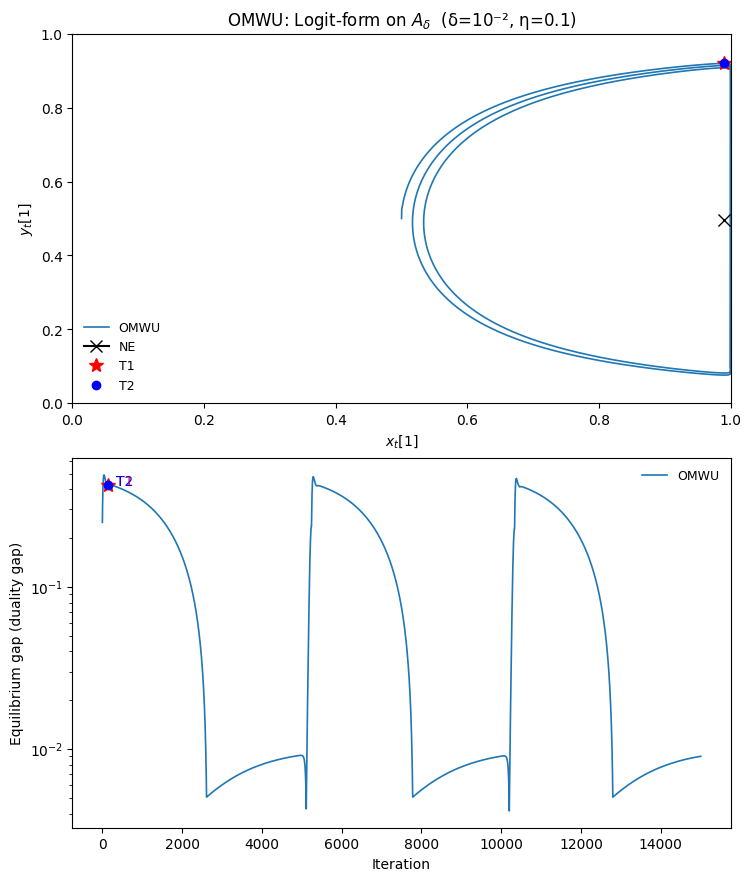

EO: T1=129, T2=129,  final gap=5.380778e-03


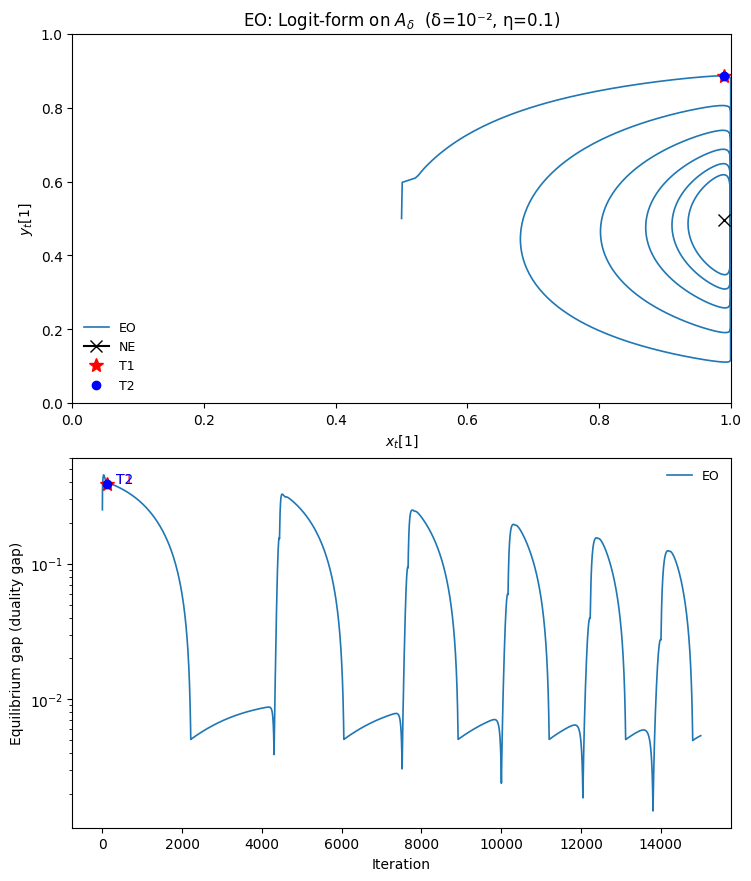

EOO: T1=129, T2=129,  final gap=1.047028e-02


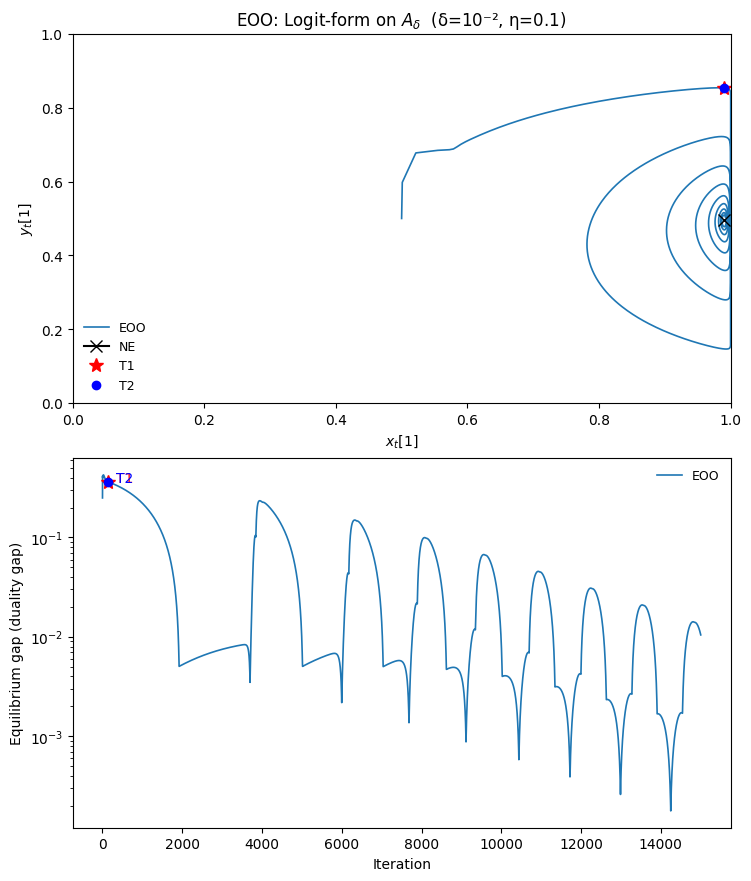

L: T1=133, T2=133,  final gap=5.201588e-05


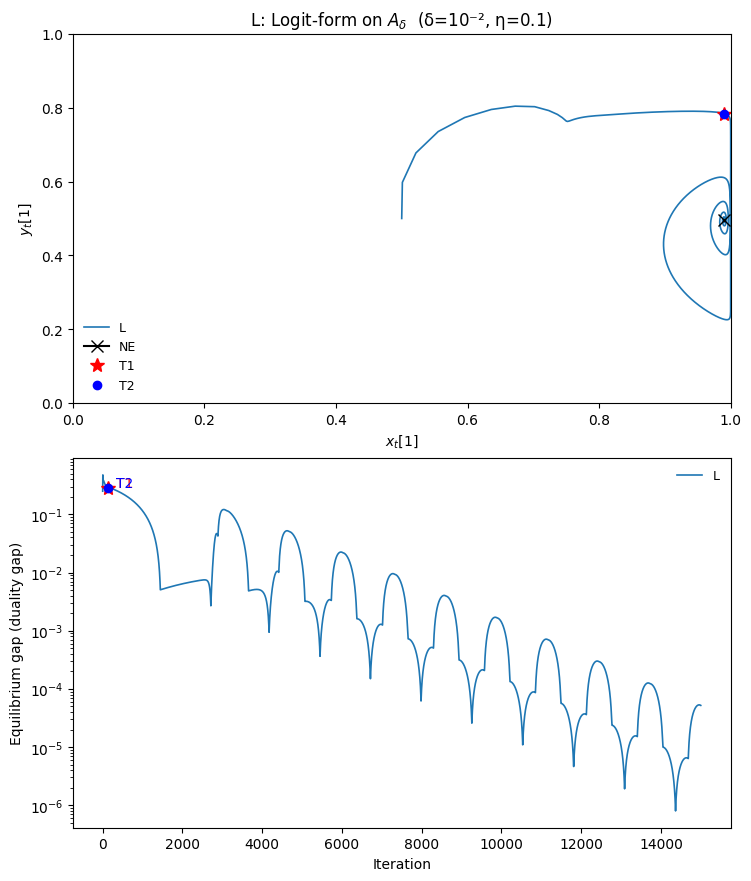

In [51]:
# omwu_logit_fig1_separate.py
# Figure-1 style plots with LOGIT-FORM OMWU + variants (EO, EOO, L=3),
# each variant plotted in its own figure (trajectory + gap).
#
# Top of each figure:  iterate trajectory (x_t[1], y_t[1]) in A_δ (eq. (2))
# Bottom of each figure: last-iterate duality gap vs iteration (semilog-y)
#
# ---------- Logit form (all algorithms) ----------
# Keep logits z_x, z_y (2-d each). At each step:
#   x_t = softmax(z_x),  y_t = softmax(z_y)
#   g_x(t) = A @ y_t
#   g_y(t) = - A^T @ x_t         # (so both players "ascend" with +η d_t)
#   d_t depends on the variant (defined below)
#   z_x <- z_x + η d_x(t)
#   z_y <- z_y + η d_y(t)
#
# Variants' d_t (per player, using that player's gradient history):
#   • OMWU          : d_t = 2 g_t − g_{t−1}
#   • OMWU-EO (L)   : d_t = (L+1) g_t − L g_{t−1}         (here we use L = 3)
#   • OMWU-EOO (L)  : d_t = (L+1) g_t − g_{t−1} − pending_t,
#                      with pending_{t+1} = max(L−1,0) · g_{t−1}
#                      (Careful: pending_{t+1} uses g_{t−1}, not g_t.)
#   • OMWU-L (L)    : d_t = (L+1) g_t − sum_{i=1}^L g_{t−i}
#
# Markers (for EVERY variant, per your request):
#   T1 = min { t : x_t[1] ≥ 1/(1+δ) }
#   T2 = min { t > T1 : y_t[1] ≥ 1/(2(1+δ)) }
#
# Run:  python omwu_logit_fig1_separate.py

from __future__ import annotations
from collections import deque
import matplotlib.pyplot as plt
from mpmath import mp

# ----------------------
# Precision & defaults
# ----------------------
mp.dps = 1000          # keep very high precision
ETA   = mp.mpf('0.1')  # step size
DELTA = mp.mpf('1e-2') # δ = 0.01
T     = 15000          # iterations
BREADTH_L = 7          # L used for EO/EOO and for OMWU-L

# ----------------------
# Helpers (mp math)
# ----------------------
def softmax_mp2(v0: mp.mpf, v1: mp.mpf):
    """Stable 2D softmax in high precision."""
    m = v0 if v0 > v1 else v1
    e0 = mp.e**(v0 - m)
    e1 = mp.e**(v1 - m)
    s = e0 + e1
    return (e0/s, e1/s)

def A_delta(delta: mp.mpf):
    """Game A_δ = [[1/2+δ, 1/2], [0, 1]]."""
    return [
        [mp.mpf('0.5') + delta, mp.mpf('0.5')],
        [mp.mpf('0'),           mp.mpf('1')]
    ]

def duality_gap(A, x, y):
    """
    Gap(x,y) = max_j (A^T x)[j] - min_i (A y)[i]
    """
    Ay0 = A[0][0]*y[0] + A[0][1]*y[1]
    Ay1 = A[1][0]*y[0] + A[1][1]*y[1]
    ATx0 = A[0][0]*x[0] + A[1][0]*x[1]
    ATx1 = A[0][1]*x[0] + A[1][1]*x[1]
    max_term = ATx0 if ATx0 > ATx1 else ATx1
    min_term = Ay0 if Ay0 < Ay1 else Ay1
    return max_term - min_term

# ----------------------
# Variant state for LOGIT updates
# ----------------------
class VariantState:
    def __init__(self, L: int):
        z = mp.mpf('0')
        self.L = L

        # logits (initialized to zero -> uniform)
        self.zx = [z, z]
        self.zy = [z, z]

        # gradient history: g_{t-1}
        self.gx_prev = [z, z]
        self.gy_prev = [z, z]

        # for OMWU-L (window-L) we store up to L past grads (most-recent first)
        self.hist_gx = deque([], maxlen=L)
        self.hist_gy = deque([], maxlen=L)

        # for EOO:
        self.pending_x = [z, z]
        self.pending_y = [z, z]

# ----------------------
# Core simulator (one variant, logit form)
# ----------------------
def simulate_variant_logit(name: str, delta=DELTA, eta=ETA, T=T, breadth_L=BREADTH_L):
    """
    Returns (xs, ys, gaps, T1, T2) for the given variant name in LOGIT form.
    xs[t-1] = x_t[1], ys[t-1] = y_t[1]. T1,T2 computed for each variant.
    """
    if breadth_L < 1:
        raise ValueError("breadth_L must be ≥ 1")

    A = A_delta(delta)
    st = VariantState(breadth_L)

    xs, ys, gaps = [], [], []
    T1 = None
    T2 = None
    x_boundary = mp.mpf('1')/(mp.mpf('1') + delta)                 # 1/(1+δ)
    y_thresh   = mp.mpf('1')/(mp.mpf('2')*(mp.mpf('1') + delta))   # 1/(2(1+δ))

    for t in range(1, int(T)+1):
        # strategies from logits
        x0, x1 = softmax_mp2(st.zx[0], st.zx[1])
        y0, y1 = softmax_mp2(st.zy[0], st.zy[1])

        xs.append(x0); ys.append(y0)

        # current gradients g_t
        gx0 = A[0][0]*y0 + A[0][1]*y1
        gx1 = A[1][0]*y0 + A[1][1]*y1
        gy0 = -(A[0][0]*x0 + A[1][0]*x1)
        gy1 = -(A[0][1]*x0 + A[1][1]*x1)

        # compute d_t per variant (x and y independently with their own histories)
        if name == "OMWU":
            # d = 2 g_t - g_{t-1}
            dx0 = (mp.mpf('2')*gx0) - st.gx_prev[0]
            dx1 = (mp.mpf('2')*gx1) - st.gx_prev[1]
            dy0 = (mp.mpf('2')*gy0) - st.gy_prev[0]
            dy1 = (mp.mpf('2')*gy1) - st.gy_prev[1]

        elif name == "EO":  # extra optimism with breadth L
            Lp = mp.mpf(str(breadth_L))
            dx0 = (Lp + 1)*gx0 - Lp*st.gx_prev[0]
            dx1 = (Lp + 1)*gx1 - Lp*st.gx_prev[1]
            dy0 = (Lp + 1)*gy0 - Lp*st.gy_prev[0]
            dy1 = (Lp + 1)*gy1 - Lp*st.gy_prev[1]

        elif name == "EOO":  # staggered extra optimism
            Lp = mp.mpf(str(breadth_L))
            dx0 = (Lp + 1)*gx0 - st.gx_prev[0] - st.pending_x[0]
            dx1 = (Lp + 1)*gx1 - st.gx_prev[1] - st.pending_x[1]
            dy0 = (Lp + 1)*gy0 - st.gy_prev[0] - st.pending_y[0]
            dy1 = (Lp + 1)*gy1 - st.gy_prev[1] - st.pending_y[1]

        elif name == "L":    # window-L
            # d = (L+1) g_t - sum_{i=1}^L g_{t-i}  (missing history treated as 0)
            Lp_i = breadth_L
            sumx0 = mp.mpf('0'); sumx1 = mp.mpf('0')
            sumy0 = mp.mpf('0'); sumy1 = mp.mpf('0')
            for i in range(min(Lp_i, len(st.hist_gx))):
                sumx0 += st.hist_gx[i][0]; sumx1 += st.hist_gx[i][1]
            for i in range(min(Lp_i, len(st.hist_gy))):
                sumy0 += st.hist_gy[i][0]; sumy1 += st.hist_gy[i][1]

            dx0 = (mp.mpf(Lp_i) + 1)*gx0 - sumx0
            dx1 = (mp.mpf(Lp_i) + 1)*gx1 - sumx1
            dy0 = (mp.mpf(Lp_i) + 1)*gy0 - sumy0
            dy1 = (mp.mpf(Lp_i) + 1)*gy1 - sumy1

        else:
            raise ValueError(f"Unknown variant: {name}")

        # logit update
        st.zx[0] += eta * dx0; st.zx[1] += eta * dx1
        st.zy[0] += eta * dy0; st.zy[1] += eta * dy1

        # duality gap (for plotting)
        gaps.append(duality_gap(A, (x0, x1), (y0, y1)))

        # T1/T2 detection (for this variant)
        if T1 is None and x0 >= x_boundary:
            T1 = t
        if T1 is not None and T2 is None and y0 >= y_thresh:
            T2 = t

        # roll histories for next step
        old_prev_x0, old_prev_x1 = st.gx_prev[0], st.gx_prev[1]
        old_prev_y0, old_prev_y1 = st.gy_prev[0], st.gy_prev[1]

        st.gx_prev = [gx0, gx1]
        st.gy_prev = [gy0, gy1]
        st.hist_gx.appendleft((gx0, gx1))
        st.hist_gy.appendleft((gy0, gy1))

        # EOO pending update: pending_{t+1} = (L-1) * g_{t-1}  (use *old* g_{t-1}!)
        if name == "EOO":
            Lm1 = max(breadth_L - 1, 0)
            st.pending_x = [mp.mpf(Lm1)*old_prev_x0, mp.mpf(Lm1)*old_prev_x1]
            st.pending_y = [mp.mpf(Lm1)*old_prev_y0, mp.mpf(Lm1)*old_prev_y1]

    return xs, ys, gaps, T1, T2

# ----------------------
# Plot one variant (its own figure)
# ----------------------
def plot_variant(name: str, xs, ys, gaps, T1, T2, delta=DELTA):
    # NE for reference
    x_star = float(1.0 / (1.0 + float(delta)))
    y_star = float(1.0 / (2.0 * (1.0 + float(delta))))

    x1 = [float(v) for v in xs]
    y1 = [float(v) for v in ys]
    g  = [max(float(v), 1e-300) for v in gaps]  # for safe log scale

    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(7.4, 8.7), constrained_layout=True)

    # Top: iterate trajectory
    ax1.plot(x1, y1, lw=1.2, label=name)
    ax1.plot([x_star], [y_star], marker='x', color='k', ms=8, label="NE")

    # T1/T2 on trajectory
    if T1 is not None and 1 <= T1 <= len(x1):
        ax1.plot([x1[T1-1]], [y1[T1-1]], 'r*', ms=10, label="T1")
    if T2 is not None and 1 <= T2 <= len(x1):
        ax1.plot([x1[T2-1]], [y1[T2-1]], 'bo', ms=6, label="T2")

    ax1.set_xlim(0.0, 1.0); ax1.set_ylim(0.0, 1.0)
    ax1.set_xlabel(r"$x_t[1]$")
    ax1.set_ylabel(r"$y_t[1]$")
    ax1.set_title(f"{name}: Logit-form on $A_\\delta$  (δ=10⁻², η=0.1)")
    ax1.legend(loc="lower left", fontsize=9, frameon=False)

    # Bottom: duality gap (semilogy)
    ax2.semilogy(range(1, len(g)+1), g, lw=1.2, label=name)
    # T1/T2 on gap
    if T1 is not None and 1 <= T1 <= len(g):
        ax2.semilogy([T1], [g[T1-1]], 'r*', ms=10)
        ax2.annotate("T1", (T1, g[T1-1]), textcoords="offset points", xytext=(6, 0), ha='left', color='r')
    if T2 is not None and 1 <= T2 <= len(g):
        ax2.semilogy([T2], [g[T2-1]], 'bo', ms=6)
        ax2.annotate("T2", (T2, g[T2-1]), textcoords="offset points", xytext=(6, 0), ha='left', color='b')

    ax2.set_xlabel("Iteration")
    ax2.set_ylabel("Equilibrium gap (duality gap)")
    ax2.legend(loc="upper right", fontsize=9, frameon=False)

    plt.show()

# ----------------------
# Run all and plot separately
# ----------------------
def main():
    delta = DELTA
    eta   = ETA
    Ttot  = T
    Lpar  = BREADTH_L

    algs = [
        "OMWU",  # baseline
        "EO",    # extra optimism (L=3)
        "EOO",   # staggered extra optimism (L=3)
        "L",     # window-L with L=3
    ]

    for name in algs:
        xs, ys, gaps, T1, T2 = simulate_variant_logit(name, delta, eta, Ttot, breadth_L=Lpar)
        print(f"{name}: T1={T1}, T2={T2},  final gap={float(gaps[-1]):.6e}")
        plot_variant(name, xs, ys, gaps, T1, T2, delta)

if __name__ == "__main__":
    main()


In [52]:
###################################

=== Running game 1/30: biased_rps (A shape=(3, 3)) ===

=== Summary (averaged across all runs) ===
Algorithm          Final Duality Gap      Total Avg Ext Regret
OMWU                       0.0867406                  0.447312
OMWU-AVG                   0.0867737                  0.447289
OMWU-EO                   0.00527049                   0.41091
OMWU-EOO                   0.0636424                  0.442841
OMWU-L                     0.0298875                  0.440516
OMWU-DECAY                 0.0867406                  0.447312
OMWU-KD                    0.0380824                  0.428727


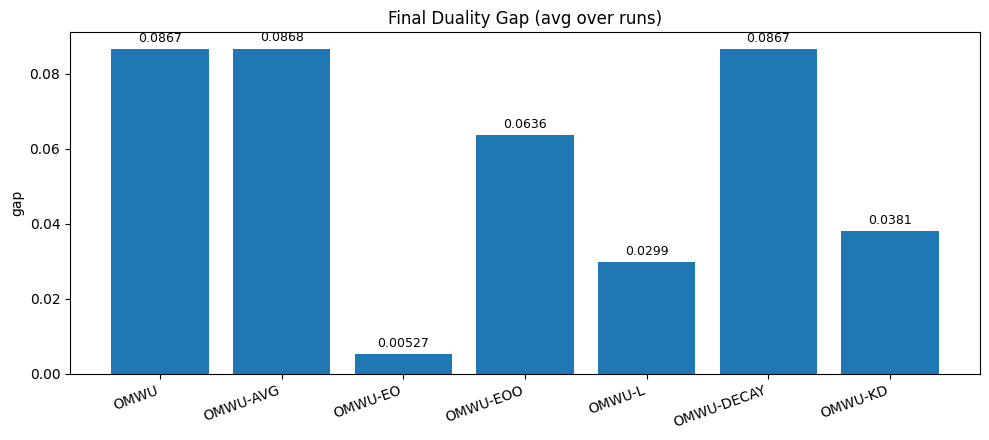

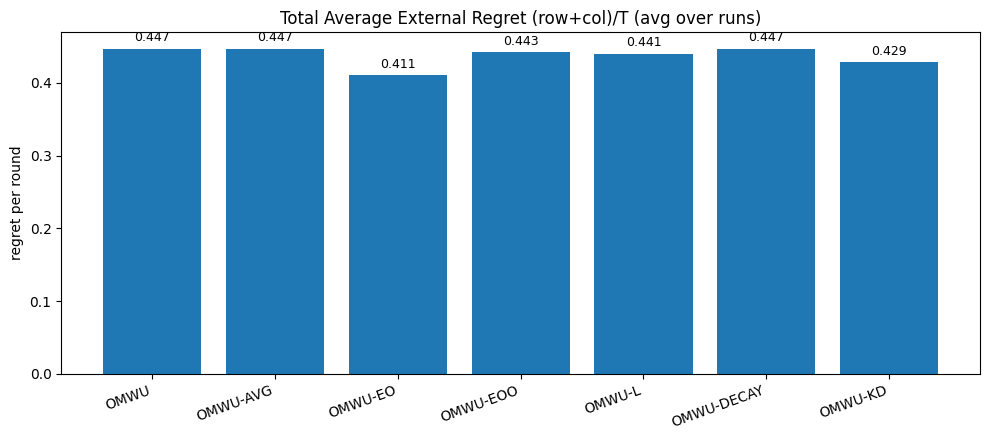

In [61]:
# ============================================================
# OMWU VARIANTS – GAME ZOO HARNESS
# Runs: OMWU (last-grad), OMWU-AVG(H), OMWU-EO, OMWU-EOO, OMWU-L,
#       OMWU-DECAY, OMWU-KD
# Games: Biased RPS, "forgetfulness" 2×2 from Cai–Farina (2024),
#        Gaussian / Uniform / Sparse / Cyclic / Skew-symmetric random
#
# Outputs:
#   • Bar plot: final duality gap (avg over all runs per algorithm)
#   • Bar plot: total average external regret (row+col)/T (avg over runs)
#
# Configure everything in CONFIG below or via CLI flags later if you wish.
# ============================================================

from __future__ import annotations
import numpy as np
import matplotlib.pyplot as plt
from dataclasses import dataclass, field
from typing import Dict, List, Tuple, Callable, Any, Optional
import math
import random

# ----------------------------
# numerics / utils
# ----------------------------
EPS = 1e-300

def softmax(v: np.ndarray) -> np.ndarray:
    z = v - np.max(v)
    e = np.exp(z)
    s = e / np.sum(e)
    return s

def duality_gap(A: np.ndarray, x: np.ndarray, y: np.ndarray) -> float:
    # row player's payoff matrix A; column payoff is -A (zero-sum)
    gy = A @ y               # payoffs for pure row strategies vs y
    xA = x @ A               # payoffs vs pure column strategies
    row_br = np.max(gy)      # best response payoff for row
    col_worst = np.min(xA)   # worst payoff row can be forced to, given x
    return row_br - col_worst

def step_regret_increments(A: np.ndarray, x: np.ndarray, y: np.ndarray) -> Tuple[float, float]:
    # Returns (row_increment, col_increment) for external regret at current t.
    # Row regret increment: max_i (e_i^T A y) - x^T A y
    # Col regret increment: max_j (x^T A e_j) - x^T A y  (since col's loss is -x^T A y)
    gy = A @ y
    xA = x @ A
    val = float(x @ (A @ y))
    row_inc = float(np.max(gy) - val)
    col_inc = float(np.max(xA) - val)
    return row_inc, col_inc

def clip_probs(p: np.ndarray) -> np.ndarray:
    # Keep away from exact zeros (numerical safety)
    p = np.clip(p, EPS, 1.0)
    return p / p.sum()

# ----------------------------
# Game zoo
# ----------------------------
def game_biased_rps(bias: float = 0.05) -> np.ndarray:
    # Base RPS (row payoff): skew-symmetric
    A = np.array([[ 0.0, -1.0,  1.0],
                  [ 1.0,  0.0, -1.0],
                  [-1.0,  1.0,  0.0]], dtype=np.float64)
    # Add bias to Rock (row action 0) to create a unique NE
    A = A.copy()
    A[0, 0] += bias
    return A

def game_forgetfulness(delta: float = 0.05) -> np.ndarray:
    # Cai–Farina et al. (NeurIPS'24): A_delta = [[1/2 + delta, 1/2],[0,1]]
    return np.array([[0.5 + float(delta), 0.5],
                     [0.0,                 1.0]], dtype=np.float64)

def game_random_gaussian(m: int = 5, n: int = 5, scale: float = 1.0) -> np.ndarray:
    A = np.random.normal(loc=0.0, scale=scale, size=(m, n))
    return A.astype(np.float64)

def game_random_uniform(m: int = 6, n: int = 6, low: float = -1.0, high: float = 1.0) -> np.ndarray:
    A = np.random.uniform(low=low, high=high, size=(m, n))
    return A.astype(np.float64)

def game_random_sparse(m: int = 8, n: int = 8, density: float = 0.2, scale: float = 1.0) -> np.ndarray:
    A = np.zeros((m, n), dtype=np.float64)
    nnz = int(density * m * n)
    rows = np.random.randint(0, m, size=nnz)
    cols = np.random.randint(0, n, size=nnz)
    vals = np.random.normal(loc=0.0, scale=scale, size=nnz)
    A[rows, cols] = vals
    return A

def game_cyclic(k: int = 5) -> np.ndarray:
    # k-action cyclic generalization (win next, lose previous)
    A = np.zeros((k, k), dtype=np.float64)
    for i in range(k):
        A[i, (i-1) % k] = 1.0   # i beats (i-1)
        A[i, (i+1) % k] = -1.0  # i loses to (i+1)
    return A

def game_skew_symmetric(m: int = 6) -> np.ndarray:
    M = np.random.normal(size=(m, m))
    A = M - M.T  # skew-symmetric zero-sum
    return A.astype(np.float64)

# ----------------------------
# Variant machinery
# ----------------------------
@dataclass
class VariantParams:
    name: str
    eta_row: float = 0.5
    eta_col: float = 0.5
    # OMWU-AVG
    H: int = 3
    # EO
    alpha: float = 2.0
    # L & EOO
    L: int = 3
    # DECAY
    alpha_b: float = 1.0
    alpha_s: float = 2.0
    rho: float = 0.5
    Kf: int = 4
    # KD
    alpha_kd: float = 1.0
    rho_kd: float = 0.9

@dataclass
class VariantState:
    g_hist_row: List[np.ndarray] = field(default_factory=list)
    g_hist_col: List[np.ndarray] = field(default_factory=list)
    # EOO pending buffers
    pending_row: Optional[np.ndarray] = None
    pending_col: Optional[np.ndarray] = None
    # DECAY short EMA
    s_row: Optional[np.ndarray] = None
    s_col: Optional[np.ndarray] = None
    # KD teacher EMA
    s_kd_row: Optional[np.ndarray] = None
    s_kd_col: Optional[np.ndarray] = None

def get_last(g_hist: List[np.ndarray], k: int) -> np.ndarray:
    if len(g_hist) >= k:
        return g_hist[-k]
    return np.zeros_like(g_hist[-1]) if g_hist else None  # caller must handle None

def window_sum(g_hist: List[np.ndarray], L: int) -> np.ndarray:
    if not g_hist or L <= 0:
        return None
    out = np.zeros_like(g_hist[-1])
    count = 0
    for i in range(1, L+1):
        if len(g_hist) >= i:
            out += g_hist[-i]
            count += 1
    return out if count > 0 else None

def avg_last_H(g_hist: List[np.ndarray], H: int) -> np.ndarray:
    ws = window_sum(g_hist, H)
    if ws is None:
        return None
    return ws / max(1, min(H, len(g_hist)))

def direction_omwu(g_hist: List[np.ndarray]) -> np.ndarray:
    g_t = g_hist[-1]
    g_prev = get_last(g_hist, 2)
    if g_prev is None:
        g_prev = np.zeros_like(g_t)
    return 2.0 * g_t - g_prev

def direction_avg(g_hist: List[np.ndarray], H: int) -> np.ndarray:
    g_t = g_hist[-1]
    m = avg_last_H(g_hist, H)
    if m is None:
        m = np.zeros_like(g_t)
    # Classic "prediction m_t" form: d = g_t + (g_t - m_t) = 2 g_t - m_t
    return 2.0 * g_t - m

def direction_eo(g_hist: List[np.ndarray], alpha: float) -> np.ndarray:
    g_t = g_hist[-1]
    g_prev = get_last(g_hist, 2)
    if g_prev is None:
        g_prev = np.zeros_like(g_t)
    return alpha * g_t - (alpha - 1.0) * g_prev

def direction_L(g_hist: List[np.ndarray], L: int) -> np.ndarray:
    g_t = g_hist[-1]
    s = window_sum(g_hist, L)
    if s is None:
        s = np.zeros_like(g_t)
    return (L + 1.0) * g_t - s

def direction_eoo(state: VariantState, side: str, g_hist: List[np.ndarray], L: int) -> np.ndarray:
    # Staggered extra optimism with "pending" bucket.
    g_t = g_hist[-1]
    g_prev = get_last(g_hist, 2)
    if g_prev is None:
        g_prev = np.zeros_like(g_t)
    if side == "row":
        pending = state.pending_row
    else:
        pending = state.pending_col
    if pending is None:
        pending = np.zeros_like(g_t)
    d = (L + 1.0) * g_t - g_prev - pending
    # Update pending for next step
    new_pending = (max(L - 1, 0)) * g_prev
    if side == "row":
        state.pending_row = new_pending
    else:
        state.pending_col = new_pending
    return d

def direction_decay(state: VariantState, g_hist: List[np.ndarray], alpha_b: float, alpha_s: float, rho: float) -> np.ndarray:
    g_t = g_hist[-1]
    g_prev = get_last(g_hist, 2)
    if g_prev is None:
        g_prev = np.zeros_like(g_t)
    # short EMA of past gradients (using last gradient as input)
    if state.s_row is g_t is None:  # dummy to quiet linters; we set per-call for row/col below
        pass
    return 2.0 * g_t  # placeholder; we set proper s in wrapper

def direction_decay_side(state: VariantState, side: str, g_hist: List[np.ndarray], alpha_b: float, alpha_s: float, rho: float) -> np.ndarray:
    g_t = g_hist[-1]
    g_prev = get_last(g_hist, 2)
    if g_prev is None:
        g_prev = np.zeros_like(g_t)
    if side == "row":
        s = state.s_row
        s = (rho * s + (1.0 - rho) * g_prev) if s is not None else (1.0 - rho) * g_prev
        state.s_row = s
    else:
        s = state.s_col
        s = (rho * s + (1.0 - rho) * g_prev) if s is not None else (1.0 - rho) * g_prev
        state.s_col = s
    m = alpha_b * g_prev + alpha_s * s
    return 2.0 * g_t - m

def direction_kd(state: VariantState, side: str, g_hist: List[np.ndarray], alpha_kd: float, rho_kd: float) -> np.ndarray:
    g_t = g_hist[-1]
    g_prev = get_last(g_hist, 2)
    if g_prev is None:
        g_prev = np.zeros_like(g_t)
    if side == "row":
        s = state.s_kd_row
        s = (rho_kd * s + (1.0 - rho_kd) * g_prev) if s is not None else (1.0 - rho_kd) * g_prev
        state.s_kd_row = s
    else:
        s = state.s_kd_col
        s = (rho_kd * s + (1.0 - rho_kd) * g_prev) if s is not None else (1.0 - rho_kd) * g_prev
        state.s_kd_col = s
    m = s
    return (2.0 + 1.0) * g_t - (alpha_kd+1.0) * m

# ----------------------------
# Runner for one algorithm on one game
# ----------------------------
def run_algorithm_on_game(
    A: np.ndarray,
    variant: str,
    params: VariantParams,
    T: int,
    seed: int = 0,
    x0: Optional[np.ndarray] = None,
    y0: Optional[np.ndarray] = None,
) -> Tuple[float, float]:
    """
    Returns: (final_duality_gap, total_avg_external_regret)
             where total_avg_external_regret = (row_reg + col_reg)/T
    """
    rng = np.random.default_rng(seed)

    m, n = A.shape
    # logits init (uniform)
    ux = np.zeros(m, dtype=np.float64) if x0 is None else np.log(clip_probs(x0))
    uy = np.zeros(n, dtype=np.float64) if y0 is None else np.log(clip_probs(y0))

    state = VariantState()
    row_reg_sum = 0.0
    col_reg_sum = 0.0

    eta_x = params.eta_row
    eta_y = params.eta_col

    # hist containers
    g_hist_row: List[np.ndarray] = []
    g_hist_col: List[np.ndarray] = []

    for t in range(1, T+1):
        x = softmax(ux)
        y = softmax(uy)

        # gradients
        g_row = A @ y          # row maximizes x^T A y
        g_col = -(A.T @ x)     # col maximizes (-x^T A y)
        g_hist_row.append(g_row)
        g_hist_col.append(g_col)

        # regret increments
        inc_r, inc_c = step_regret_increments(A, x, y)
        row_reg_sum += inc_r
        col_reg_sum += inc_c

        # directions by variant
        if variant == "OMWU":
            dx = direction_omwu(g_hist_row)
            dy = direction_omwu(g_hist_col)

        elif variant == "OMWU-AVG":
            dx = direction_avg(g_hist_row, params.H)
            dy = direction_avg(g_hist_col, params.H)

        elif variant == "OMWU-EO":
            dx = direction_eo(g_hist_row, params.alpha)
            dy = direction_eo(g_hist_col, params.alpha)

        elif variant == "OMWU-EOO":
            dx = direction_eoo(state, "row", g_hist_row, params.L)
            dy = direction_eoo(state, "col", g_hist_col, params.L)

        elif variant == "OMWU-L":
            dx = direction_L(g_hist_row, params.L)
            dy = direction_L(g_hist_col, params.L)

        elif variant == "OMWU-DECAY":
            dx = direction_decay_side(state, "row", g_hist_row, params.alpha_b, params.alpha_s, params.rho)
            dy = direction_decay_side(state, "col", g_hist_col, params.alpha_b, params.alpha_s, params.rho)

        elif variant == "OMWU-KD":
            dx = direction_kd(state, "row", g_hist_row, params.alpha_kd, params.rho_kd)
            dy = direction_kd(state, "col", g_hist_col, params.alpha_kd, params.rho_kd)

        else:
            raise ValueError(f"Unknown variant: {variant}")

        # logit updates (mirror map = entropy)
        ux = ux + eta_x * dx
        uy = uy + eta_y * dy

    # final metrics
    xT = softmax(ux)
    yT = softmax(uy)
    gap = duality_gap(A, xT, yT)
    total_avg_reg = (row_reg_sum + col_reg_sum) / float(T)
    return float(gap), float(total_avg_reg)

# ----------------------------
# Experiment harness
# ----------------------------
@dataclass
class Config:
    SEED: int = 1
    T: int = 5000
    PRINT_EVERY: int = 1000

    # Which algorithms to run
    RUN_ALGOS: List[str] = field(default_factory=lambda: [
        "OMWU",
        "OMWU-AVG",
        "OMWU-EO",
        "OMWU-EOO",
        "OMWU-L",
        "OMWU-DECAY",
        "OMWU-KD",
    ])

    # Algorithm hyperparameters
    VARIANT_CFG: Dict[str, VariantParams] = field(default_factory=lambda: {
        "OMWU":        VariantParams(name="OMWU",       eta_row=0.1, eta_col=0.1),
        "OMWU-AVG":    VariantParams(name="OMWU-AVG",   eta_row=0.1, eta_col=0.1, H=3),
        "OMWU-EO":     VariantParams(name="OMWU-EO",    eta_row=0.1, eta_col=0.1, alpha=7.0),
        "OMWU-EOO":    VariantParams(name="OMWU-EOO",   eta_row=0.1, eta_col=0.1, L=5),
        "OMWU-L":      VariantParams(name="OMWU-L",     eta_row=0.1, eta_col=0.1, L=5),
        "OMWU-DECAY":  VariantParams(name="OMWU-DECAY", eta_row=0.1, eta_col=0.1, alpha_b=1.0, alpha_s=3, rho=1.0, Kf=4),
        "OMWU-KD":     VariantParams(name="OMWU-KD",    eta_row=0.1, eta_col=0.1, alpha_kd=1.0, rho_kd=0.9),
    })

    # Which games to run (count per type and parameters)
    GAMES: Dict[str, Dict[str, Any]] = field(default_factory=lambda: {
        "biased_rps":        {"count": 4, "bias": 0.05},
        "forgetfulness":     {"count": 6, "delta": 0.05},  # A_delta from Cai–Farina (2024)
        "rand_gaussian":     {"count": 4, "m": 6, "n": 6, "scale": 1.0},
        "rand_uniform":      {"count": 4, "m": 6, "n": 6, "low": -1.0, "high": 1.0},
        "rand_sparse":       {"count": 4, "m": 8, "n": 8, "density": 0.2, "scale": 1.0},
        "cyclic":            {"count": 4, "k": 5},
        "skew_symmetric":    {"count": 4, "m": 6},
    })

    # Plot settings
    BAR_VALUE_LABELS: bool = True
    RANDOMIZE_SEEDS_PER_RUN: bool = True  # different seed per game instance

def build_games(cfg: Config) -> List[Tuple[str, np.ndarray]]:
    out: List[Tuple[str, np.ndarray]] = []
    for gname, meta in cfg.GAMES.items():
        cnt = int(meta.get("count", 1))
        for i in range(cnt):
            if gname == "biased_rps":
                A = game_biased_rps(bias=float(meta.get("bias", 0.05)))
            elif gname == "forgetfulness":
                A = game_forgetfulness(delta=float(meta.get("delta", 0.05)))
            elif gname == "rand_gaussian":
                A = game_random_gaussian(m=int(meta.get("m", 6)), n=int(meta.get("n", 6)), scale=float(meta.get("scale", 1.0)))
            elif gname == "rand_uniform":
                A = game_random_uniform(m=int(meta.get("m", 6)), n=int(meta.get("n", 6)), low=float(meta.get("low", -1.0)), high=float(meta.get("high", 1.0)))
            elif gname == "rand_sparse":
                A = game_random_sparse(m=int(meta.get("m", 8)), n=int(meta.get("n", 8)), density=float(meta.get("density", 0.2)), scale=float(meta.get("scale", 1.0)))
            elif gname == "cyclic":
                A = game_cyclic(k=int(meta.get("k", 5)))
            elif gname == "skew_symmetric":
                A = game_skew_symmetric(m=int(meta.get("m", 6)))
            else:
                raise ValueError(f"Unknown game type: {gname}")
            out.append((gname, A))
    return out

def run_suite(cfg: Config):
    np.random.seed(cfg.SEED)
    random.seed(cfg.SEED)

    games = build_games(cfg)
    algos = cfg.RUN_ALGOS

    # Results containers: per algo -> list of (gap, total_avg_reg)
    gaps: Dict[str, List[float]] = {a: [] for a in algos}
    tavg_regs: Dict[str, List[float]] = {a: [] for a in algos}

    base_seed = cfg.SEED

    for idx, (gname, A) in enumerate(games, start=1):
        if cfg.RANDOMIZE_SEEDS_PER_RUN:
            run_seed = base_seed + idx * 1337
        else:
            run_seed = base_seed

        if (idx % max(1, cfg.PRINT_EVERY)) == 1:
            print(f"=== Running game {idx}/{len(games)}: {gname} (A shape={A.shape}) ===")

        for algo in algos:
            params = cfg.VARIANT_CFG[algo]
            gap, tavg = run_algorithm_on_game(
                A=A, variant=algo, params=params, T=cfg.T, seed=run_seed
            )
            gaps[algo].append(gap)
            tavg_regs[algo].append(tavg)

    # Aggregate averages over all runs
    algo_names = list(algos)
    mean_gaps = [float(np.mean(gaps[a])) for a in algo_names]
    mean_tavg = [float(np.mean(tavg_regs[a])) for a in algo_names]

    # Print a small table
    print("\n=== Summary (averaged across all runs) ===")
    print(f"{'Algorithm':<16}  {'Final Duality Gap':>18}  {'Total Avg Ext Regret':>24}")
    for a, g, r in zip(algo_names, mean_gaps, mean_tavg):
        print(f"{a:<16}  {g:>18.6g}  {r:>24.6g}")

    # Plots: bars with all algorithms on the same plot
    def annotate_bars(ax):
        if not cfg.BAR_VALUE_LABELS:
            return
        for p in ax.patches:
            h = p.get_height()
            if np.isfinite(h):
                ax.annotate(f"{h:.3g}", (p.get_x() + p.get_width()/2.0, h),
                            ha='center', va='bottom', fontsize=9, rotation=0, xytext=(0, 3),
                            textcoords='offset points')

    # 1) Final duality gap
    plt.figure(figsize=(10, 4.5))
    ax1 = plt.gca()
    bars1 = ax1.bar(algo_names, mean_gaps)
    ax1.set_title("Final Duality Gap (avg over runs)")
    ax1.set_ylabel("gap")
    ax1.set_xticklabels(algo_names, rotation=20, ha='right')
    annotate_bars(ax1)
    plt.tight_layout()

    # 2) Total average external regret (row+col)/T
    plt.figure(figsize=(10, 4.5))
    ax2 = plt.gca()
    bars2 = ax2.bar(algo_names, mean_tavg)
    ax2.set_title("Total Average External Regret (row+col)/T (avg over runs)")
    ax2.set_ylabel("regret per round")
    ax2.set_xticklabels(algo_names, rotation=20, ha='right')
    annotate_bars(ax2)
    plt.tight_layout()

    plt.show()

# ----------------------------
# CONFIG & main
# ----------------------------
if __name__ == "__main__":
    cfg = Config()
    run_suite(cfg)


In [62]:
################################

=== Running game 1/15: biased_rps (A shape=(3, 3)) ===
  Final (t = T) metrics:
    OMWU         gap=5.78426e-14  avgReg=0.000747313
    OMWU-AVG     gap=0.000638596  avgReg=0.00518805
    OMWU-EO      gap=1.90847e-07  avgReg=0.00157504
    OMWU-EOO     gap=5.2347e-13  avgReg=0.000682811
    OMWU-L       gap=2.73115e-14  avgReg=0.000617561
    OMWU-DECAY   gap=0.0035973  avgReg=0.00861895
    OMWU-KD      gap=3.33067e-16  avgReg=0.000709564


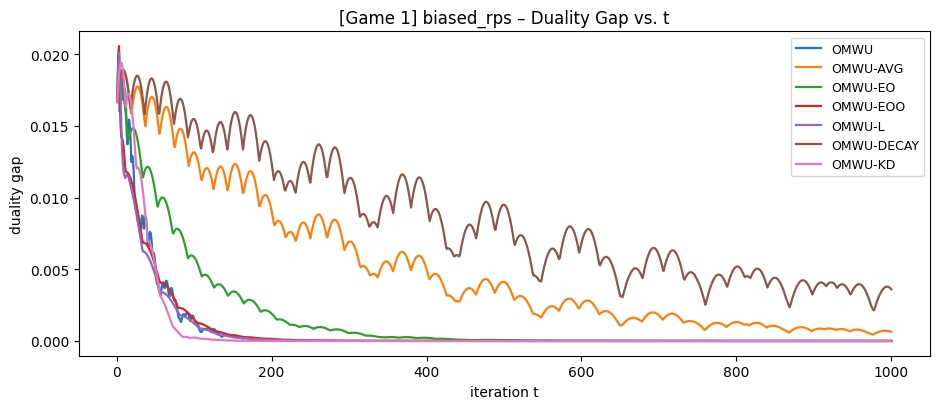

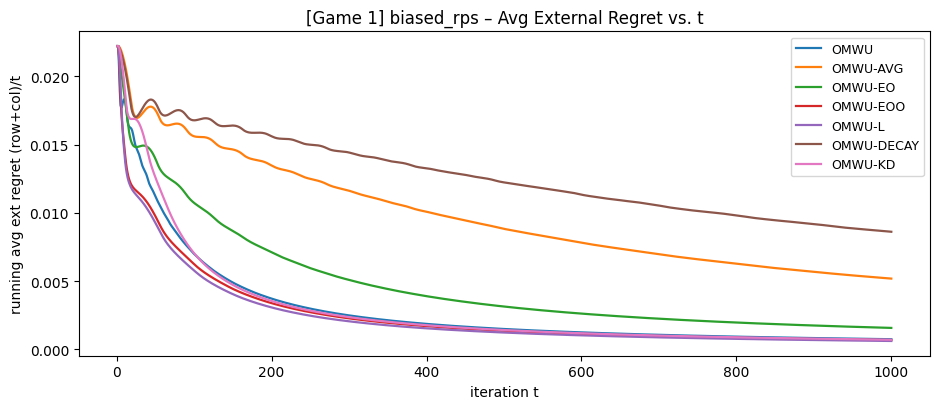

=== Running game 2/15: biased_rps (A shape=(3, 3)) ===
  Final (t = T) metrics:
    OMWU         gap=5.78426e-14  avgReg=0.000747313
    OMWU-AVG     gap=0.000638596  avgReg=0.00518805
    OMWU-EO      gap=1.90847e-07  avgReg=0.00157504
    OMWU-EOO     gap=5.2347e-13  avgReg=0.000682811
    OMWU-L       gap=2.73115e-14  avgReg=0.000617561
    OMWU-DECAY   gap=0.0035973  avgReg=0.00861895
    OMWU-KD      gap=3.33067e-16  avgReg=0.000709564


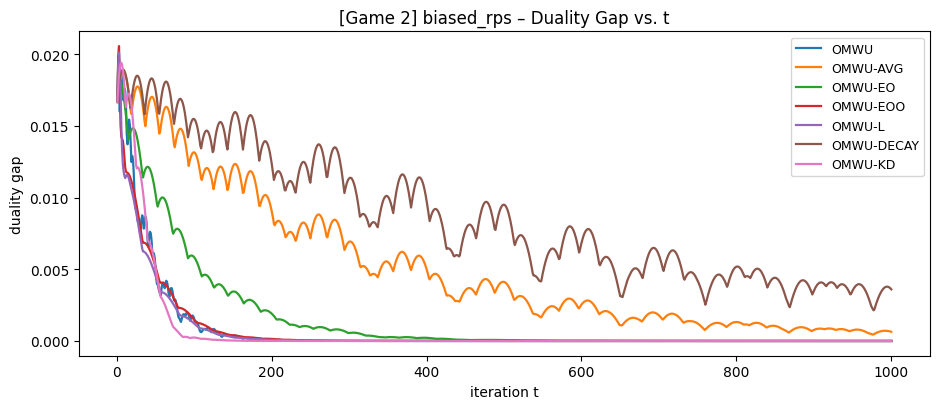

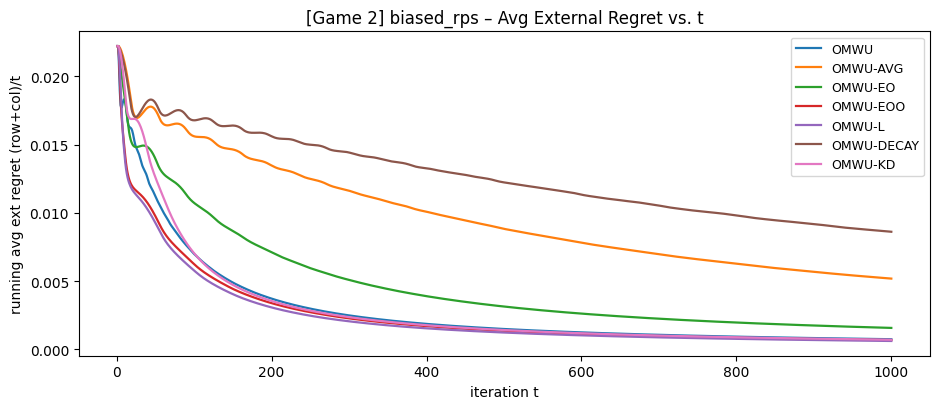

=== Running game 3/15: forgetfulness (A shape=(2, 2)) ===
  Final (t = T) metrics:
    OMWU         gap=0.131731  avgReg=0.17368
    OMWU-AVG     gap=0.399436  avgReg=0.158529
    OMWU-EO      gap=0.213685  avgReg=0.157952
    OMWU-EOO     gap=0.0156703  avgReg=0.133078
    OMWU-L       gap=0.0193973  avgReg=0.127037
    OMWU-DECAY   gap=0.385399  avgReg=0.156993
    OMWU-KD      gap=0.0150868  avgReg=0.13371


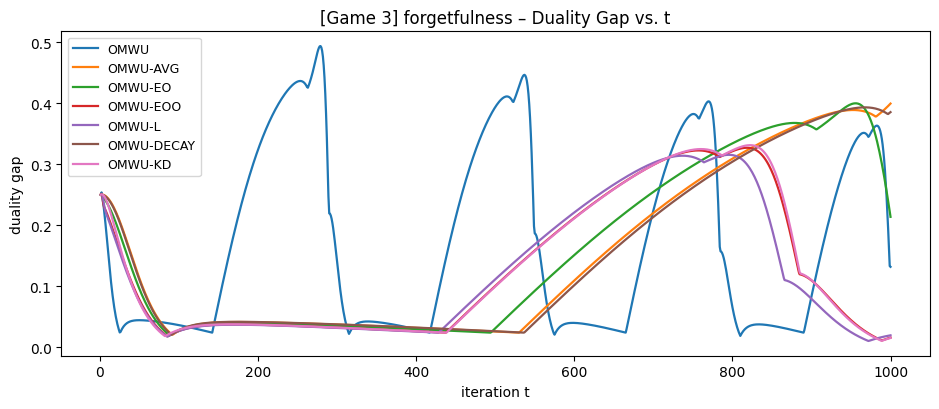

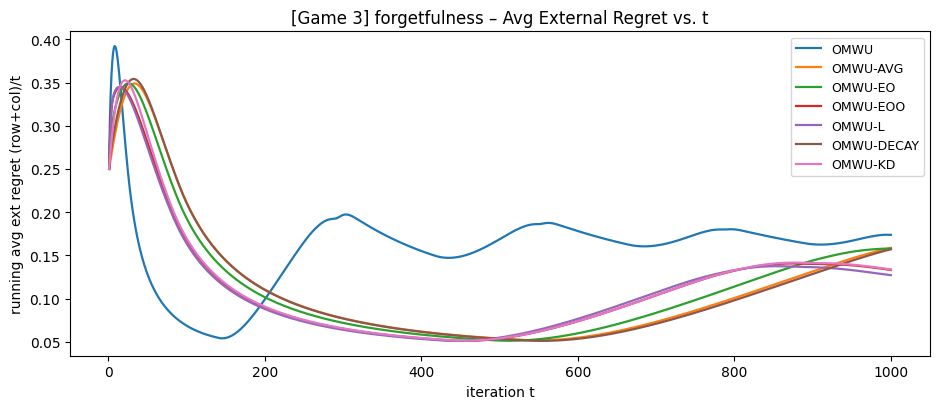

=== Running game 4/15: forgetfulness (A shape=(2, 2)) ===
  Final (t = T) metrics:
    OMWU         gap=0.131731  avgReg=0.17368
    OMWU-AVG     gap=0.399436  avgReg=0.158529
    OMWU-EO      gap=0.213685  avgReg=0.157952
    OMWU-EOO     gap=0.0156703  avgReg=0.133078
    OMWU-L       gap=0.0193973  avgReg=0.127037
    OMWU-DECAY   gap=0.385399  avgReg=0.156993
    OMWU-KD      gap=0.0150868  avgReg=0.13371


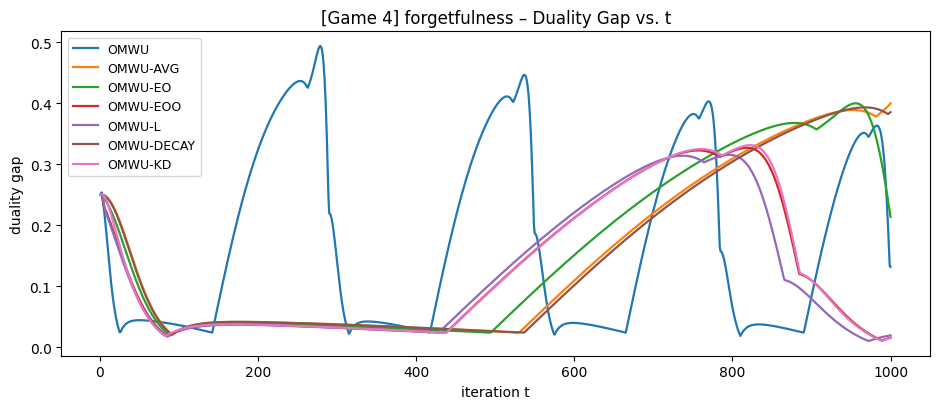

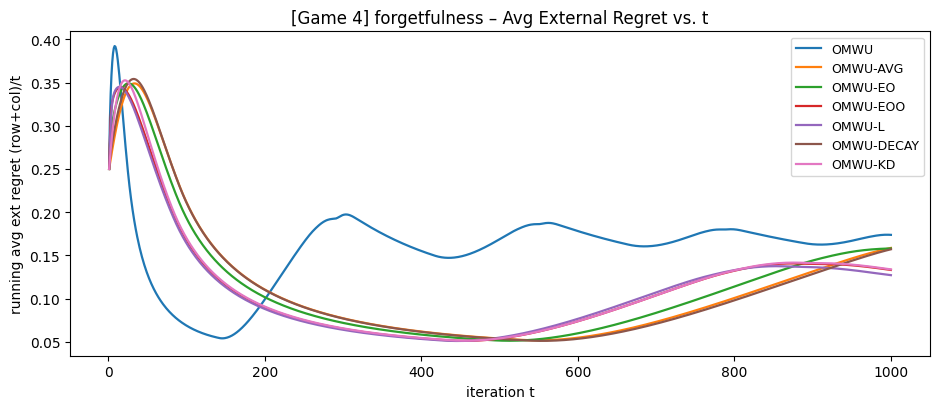

=== Running game 5/15: forgetfulness (A shape=(2, 2)) ===
  Final (t = T) metrics:
    OMWU         gap=0.131731  avgReg=0.17368
    OMWU-AVG     gap=0.399436  avgReg=0.158529
    OMWU-EO      gap=0.213685  avgReg=0.157952
    OMWU-EOO     gap=0.0156703  avgReg=0.133078
    OMWU-L       gap=0.0193973  avgReg=0.127037
    OMWU-DECAY   gap=0.385399  avgReg=0.156993
    OMWU-KD      gap=0.0150868  avgReg=0.13371


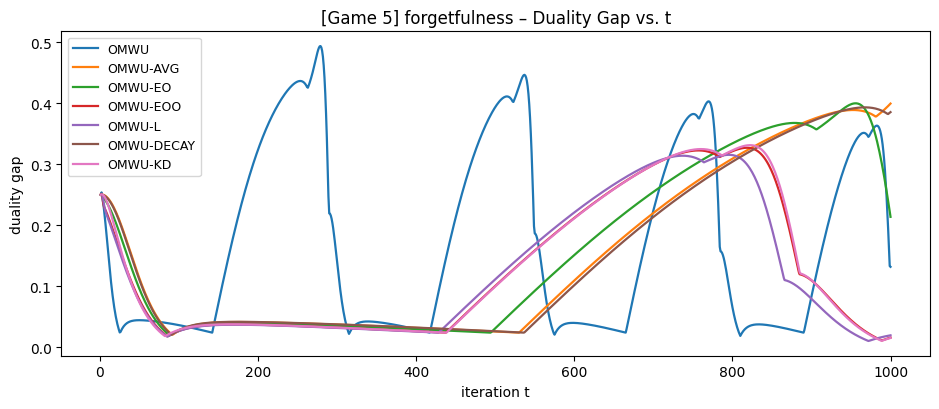

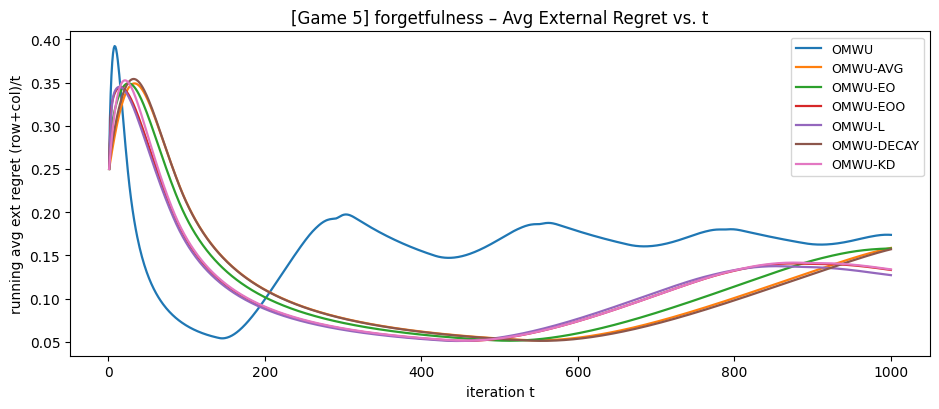

=== Running game 6/15: rand_gaussian (A shape=(6, 6)) ===
  Final (t = T) metrics:
    OMWU         gap=0.00178591  avgReg=0.384798
    OMWU-AVG     gap=0.0178839  avgReg=0.451762
    OMWU-EO      gap=0.00840918  avgReg=0.40717
    OMWU-EOO     gap=0.00106974  avgReg=0.389342
    OMWU-L       gap=0.000671052  avgReg=0.387521
    OMWU-DECAY   gap=0.0381822  avgReg=0.508823
    OMWU-KD      gap=0.000686217  avgReg=0.393167


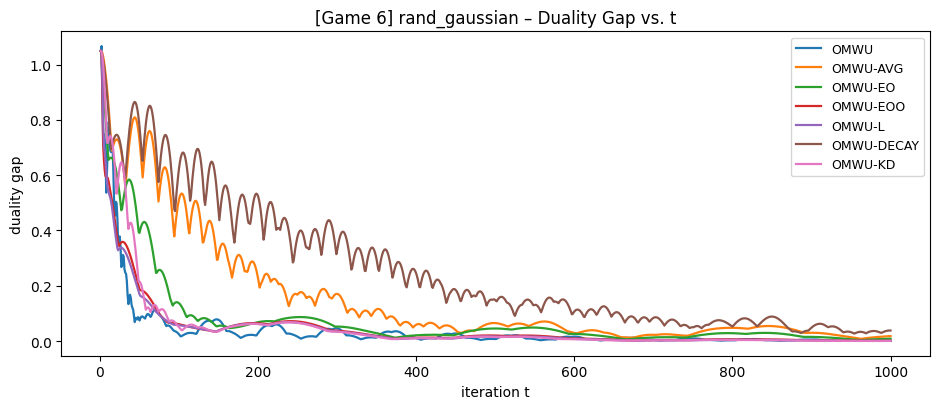

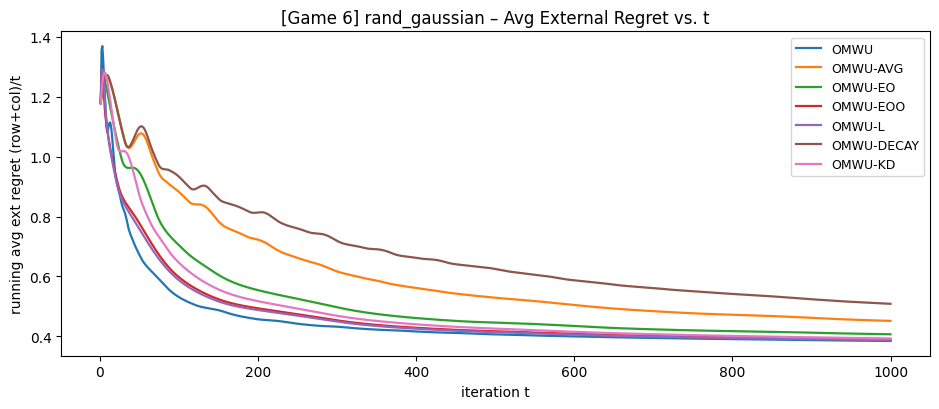

=== Running game 7/15: rand_gaussian (A shape=(6, 6)) ===
  Final (t = T) metrics:
    OMWU         gap=1.41216e-12  avgReg=1.05734
    OMWU-AVG     gap=0.0071684  avgReg=1.10007
    OMWU-EO      gap=5.18361e-06  avgReg=1.06678
    OMWU-EOO     gap=2.80946e-11  avgReg=1.05822
    OMWU-L       gap=2.94444e-11  avgReg=1.05778
    OMWU-DECAY   gap=0.0445067  avgReg=1.13145
    OMWU-KD      gap=2.77314e-11  avgReg=1.05913


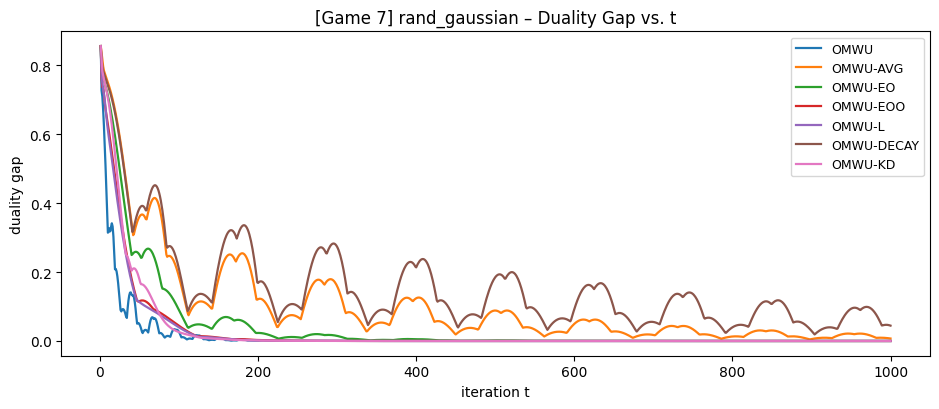

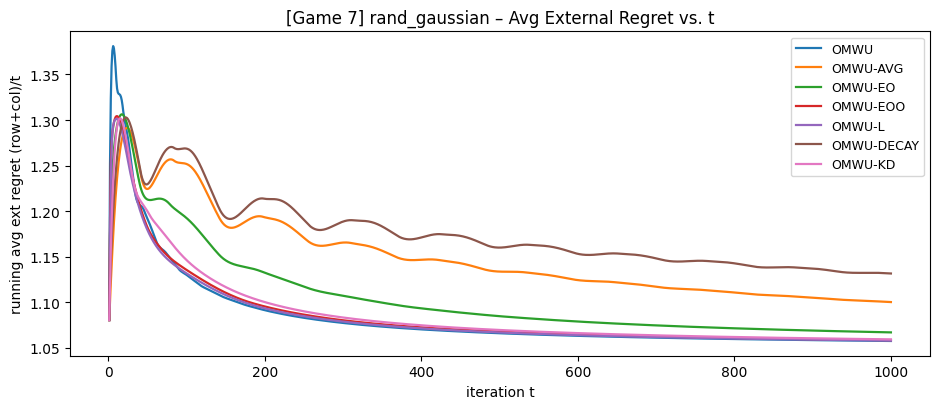

=== Running game 8/15: rand_uniform (A shape=(6, 6)) ===
  Final (t = T) metrics:
    OMWU         gap=0.101184  avgReg=0.372251
    OMWU-AVG     gap=0.0691502  avgReg=0.407907
    OMWU-EO      gap=0.0431786  avgReg=0.372567
    OMWU-EOO     gap=0.0465584  avgReg=0.352806
    OMWU-L       gap=0.0498683  avgReg=0.350671
    OMWU-DECAY   gap=0.132181  avgReg=0.437867
    OMWU-KD      gap=0.0517176  avgReg=0.3524


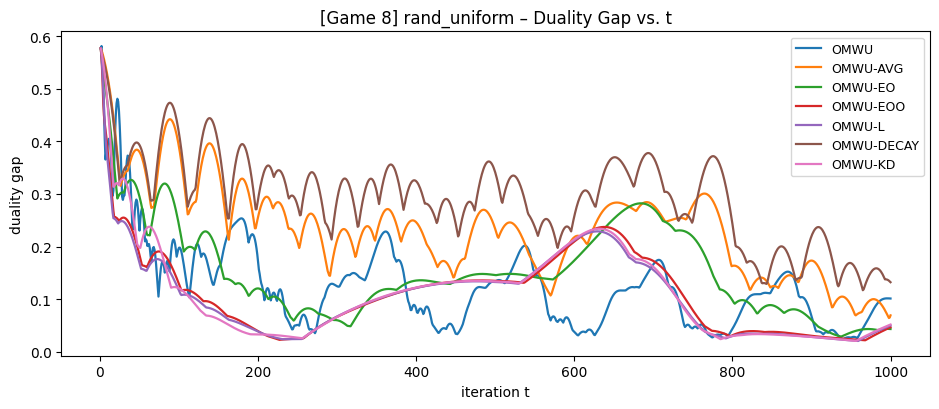

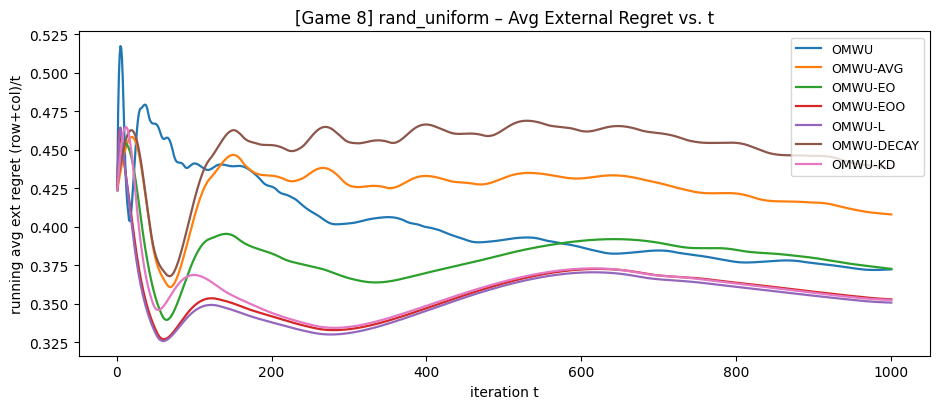

=== Running game 9/15: rand_uniform (A shape=(6, 6)) ===
  Final (t = T) metrics:
    OMWU         gap=0.0172238  avgReg=0.724554
    OMWU-AVG     gap=0.146976  avgReg=0.7504
    OMWU-EO      gap=0.0385493  avgReg=0.714646
    OMWU-EOO     gap=0.0168706  avgReg=0.697813
    OMWU-L       gap=0.0152022  avgReg=0.69627
    OMWU-DECAY   gap=0.22948  avgReg=0.770529
    OMWU-KD      gap=0.014571  avgReg=0.696363


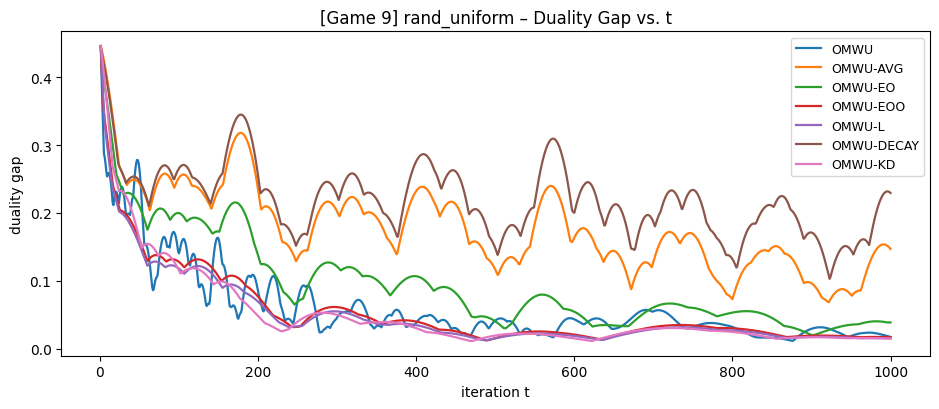

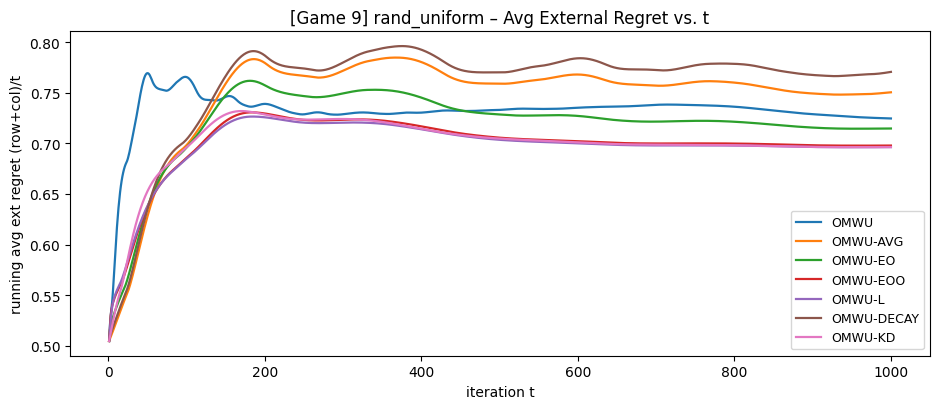

=== Running game 10/15: rand_sparse (A shape=(8, 8)) ===
  Final (t = T) metrics:
    OMWU         gap=6.36614e-16  avgReg=0.3769
    OMWU-AVG     gap=3.17529e-05  avgReg=0.418926
    OMWU-EO      gap=2.98272e-05  avgReg=0.412466
    OMWU-EOO     gap=2.88855e-05  avgReg=0.401055
    OMWU-L       gap=2.88901e-05  avgReg=0.399126
    OMWU-DECAY   gap=3.17608e-05  avgReg=0.420382
    OMWU-KD      gap=2.80898e-05  avgReg=0.4011


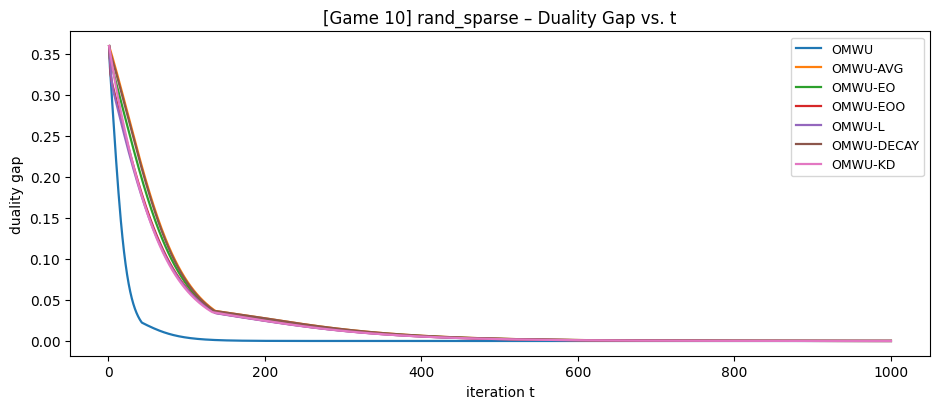

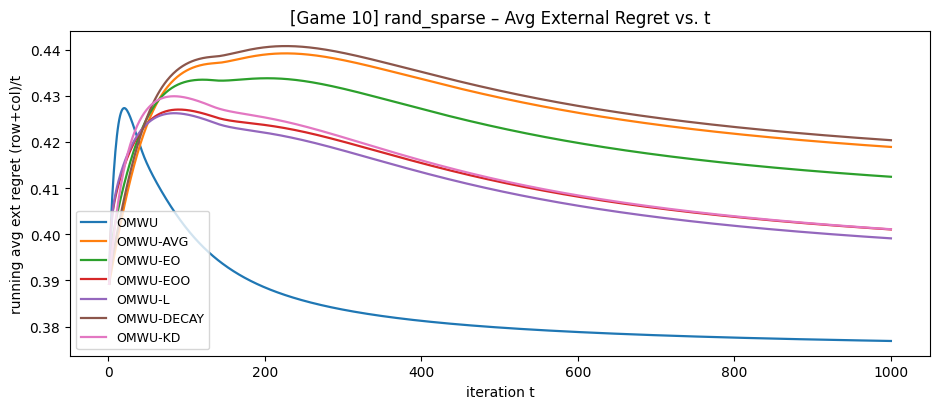

=== Running game 11/15: rand_sparse (A shape=(8, 8)) ===
  Final (t = T) metrics:
    OMWU         gap=7.39901e-06  avgReg=0.494471
    OMWU-AVG     gap=0.00209806  avgReg=0.484908
    OMWU-EO      gap=0.00206955  avgReg=0.469363
    OMWU-EOO     gap=0.00202133  avgReg=0.445173
    OMWU-L       gap=0.00201179  avgReg=0.441925
    OMWU-DECAY   gap=0.00209539  avgReg=0.488745
    OMWU-KD      gap=0.00201851  avgReg=0.452856


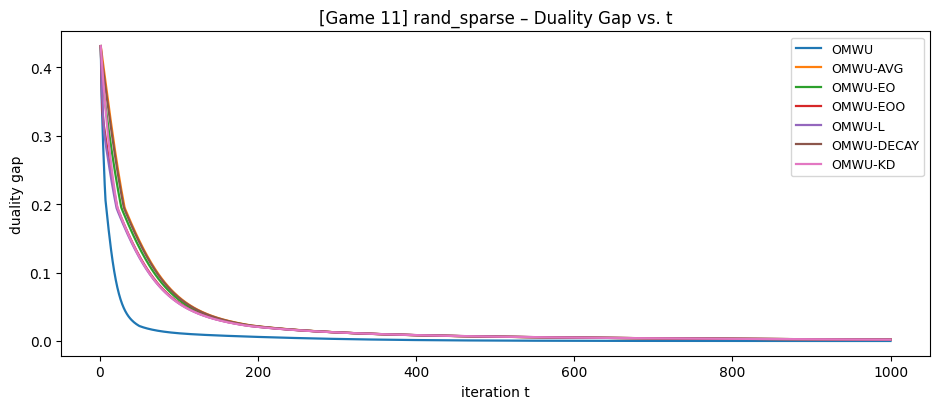

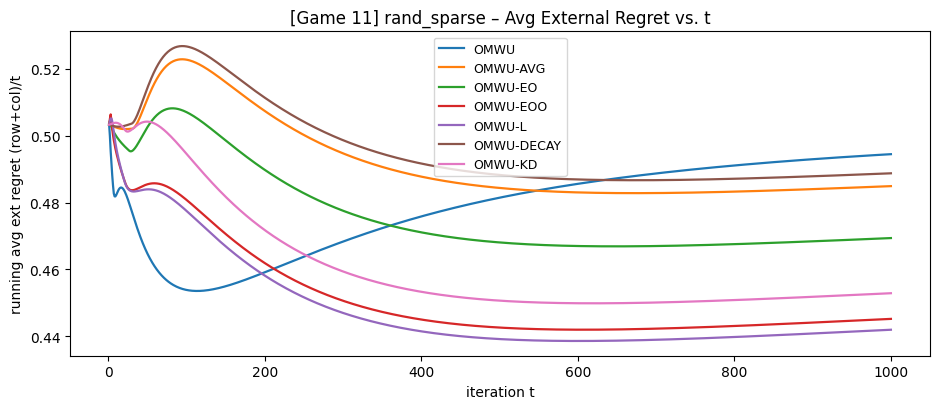

=== Running game 12/15: cyclic (A shape=(5, 5)) ===
  Final (t = T) metrics:
    OMWU         gap=0  avgReg=0
    OMWU-AVG     gap=0  avgReg=0
    OMWU-EO      gap=0  avgReg=0
    OMWU-EOO     gap=0  avgReg=0
    OMWU-L       gap=0  avgReg=0
    OMWU-DECAY   gap=0  avgReg=0
    OMWU-KD      gap=0  avgReg=0


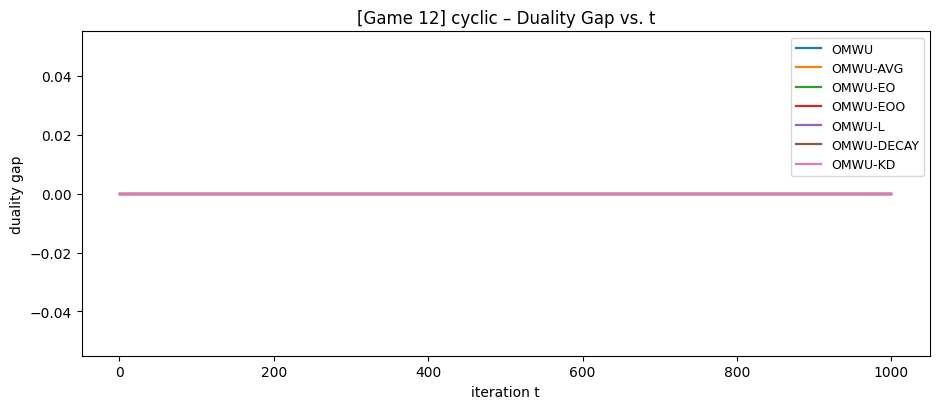

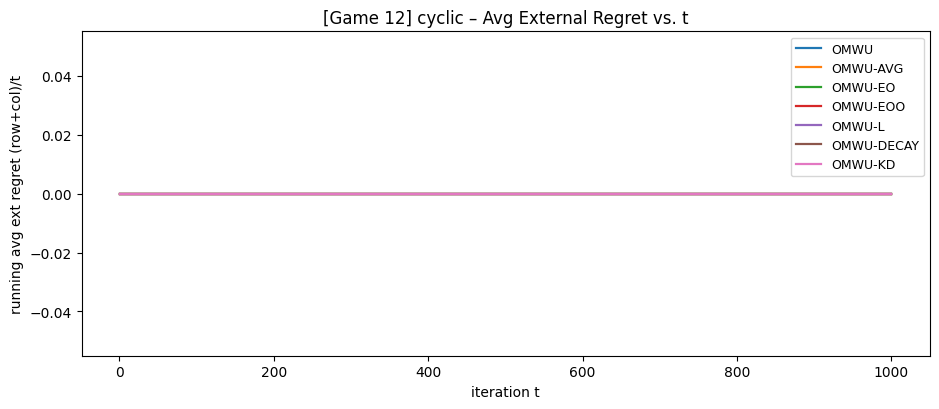

=== Running game 13/15: cyclic (A shape=(5, 5)) ===
  Final (t = T) metrics:
    OMWU         gap=0  avgReg=0
    OMWU-AVG     gap=0  avgReg=0
    OMWU-EO      gap=0  avgReg=0
    OMWU-EOO     gap=0  avgReg=0
    OMWU-L       gap=0  avgReg=0
    OMWU-DECAY   gap=0  avgReg=0
    OMWU-KD      gap=0  avgReg=0


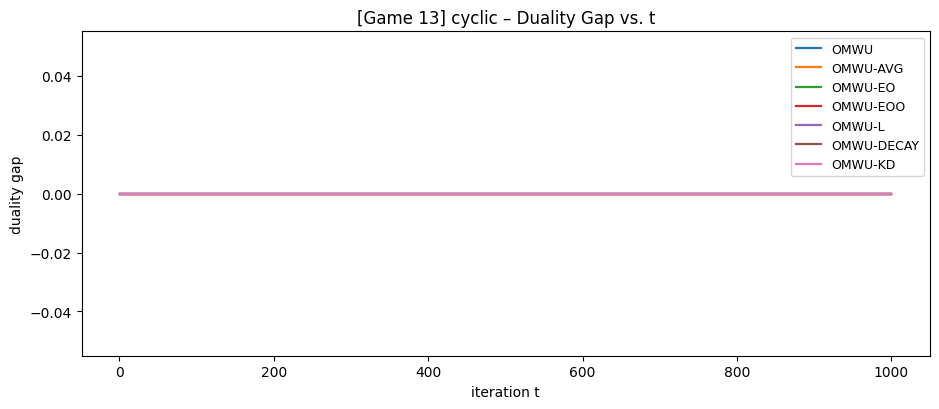

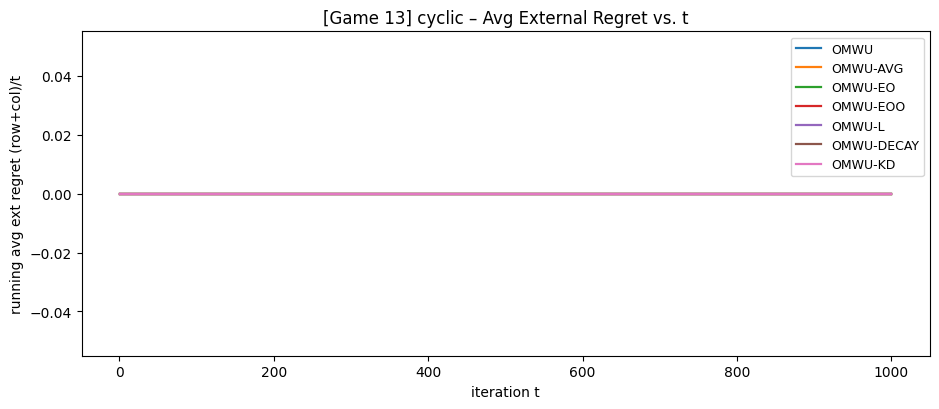

=== Running game 14/15: skew_symmetric (A shape=(6, 6)) ===
  Final (t = T) metrics:
    OMWU         gap=0.0108019  avgReg=0.861974
    OMWU-AVG     gap=0.0475203  avgReg=0.930141
    OMWU-EO      gap=0.0320028  avgReg=0.907752
    OMWU-EOO     gap=0.0121822  avgReg=0.872785
    OMWU-L       gap=0.00976485  avgReg=0.866567
    OMWU-DECAY   gap=0.0525995  avgReg=0.935743
    OMWU-KD      gap=0.00969824  avgReg=0.869908


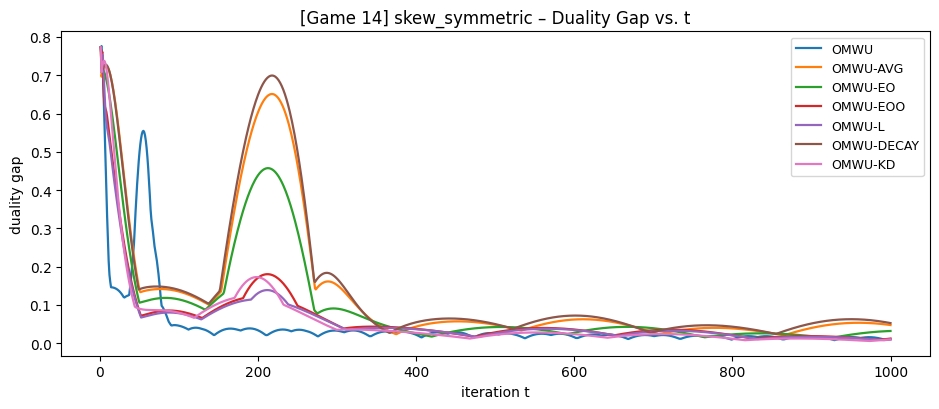

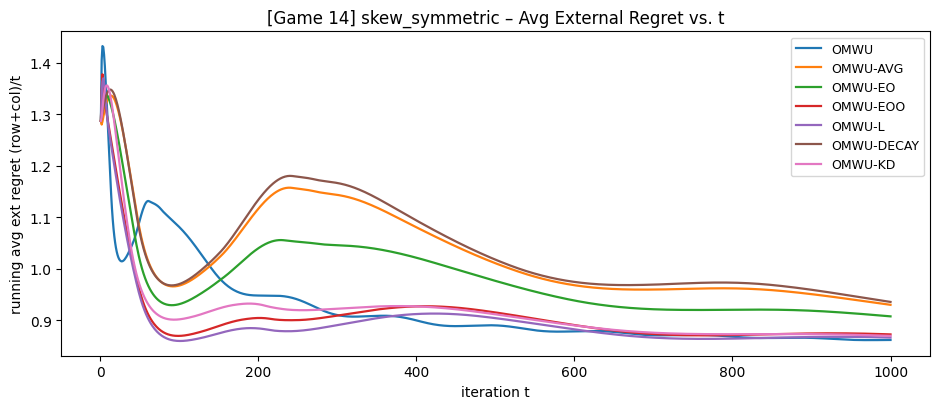

=== Running game 15/15: skew_symmetric (A shape=(6, 6)) ===
  Final (t = T) metrics:
    OMWU         gap=3.58386e-13  avgReg=1.99009
    OMWU-AVG     gap=5.11283e-06  avgReg=1.97868
    OMWU-EO      gap=6.34488e-06  avgReg=1.97308
    OMWU-EOO     gap=9.17873e-06  avgReg=1.96182
    OMWU-L       gap=9.69615e-06  avgReg=1.96004
    OMWU-DECAY   gap=4.81708e-06  avgReg=1.9798
    OMWU-KD      gap=8.15573e-06  avgReg=1.96785


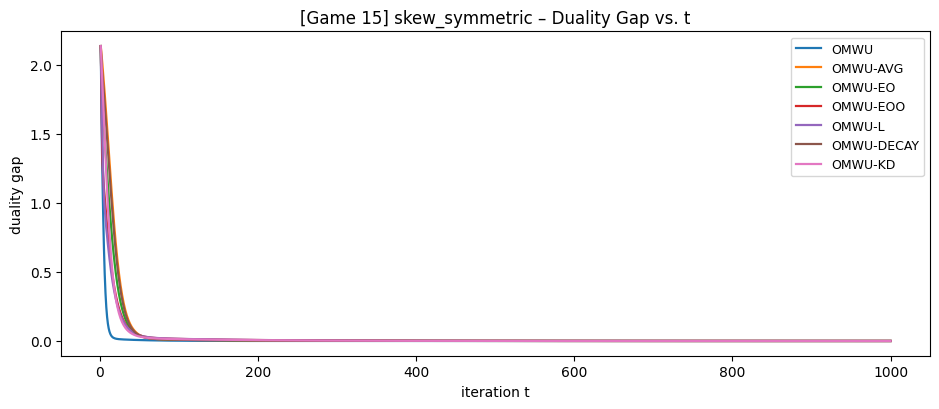

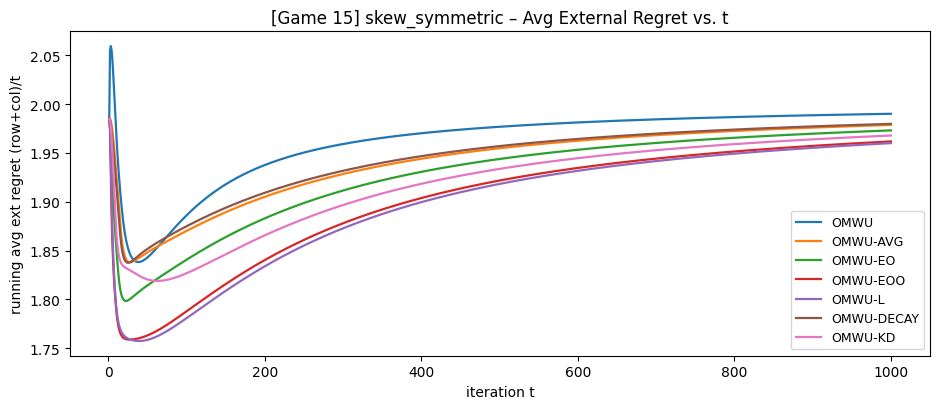

In [68]:
# ============================================================
# OMWU VARIANTS – Per-Game Trajectory Plots (Duality Gap & Avg External Regret)
# Variants: OMWU, OMWU-AVG(H), OMWU-EO(α), OMWU-EOO(L), OMWU-L(L),
#           OMWU-DECAY(α_b, α_s, ρ), OMWU-KD(α_kd, ρ_kd)  <-- KD = EMA teacher (your snippet)
# Games: Biased RPS, "forgetfulness" 2×2, Gaussian/Uniform/Sparse, Cyclic-k, Skew-symmetric
# ============================================================

from __future__ import annotations
import numpy as np
import matplotlib.pyplot as plt
from dataclasses import dataclass, field
from typing import Dict, List, Tuple, Any, Optional
import random
import os

# ----------------------------
# numerics / utils
# ----------------------------
EPS = 1e-300

def softmax(v: np.ndarray) -> np.ndarray:
    z = v - np.max(v)
    e = np.exp(z)
    s = e / np.sum(e)
    return s

def clip_probs(p: np.ndarray) -> np.ndarray:
    p = np.clip(p, EPS, 1.0)
    return p / p.sum()

def duality_gap(A: np.ndarray, x: np.ndarray, y: np.ndarray) -> float:
    """
    gap_t = max_i (e_i^T A y_t) - min_j (x_t^T A e_j)
    """
    gy = A @ y
    xA = x @ A
    row_br = float(np.max(gy))
    col_worst = float(np.min(xA))
    return row_br - col_worst

def regret_increments(A: np.ndarray, x: np.ndarray, y: np.ndarray) -> Tuple[float, float]:
    """
    External regret increments at current t.
      Row: max_i e_i^T A y - x^T A y
      Col: max_j x^T A e_j - x^T A y
    """
    gy = A @ y
    xA = x @ A
    val = float(x @ (A @ y))
    row_inc = float(np.max(gy) - val)
    col_inc = float(np.max(xA) - val)
    return row_inc, col_inc

# ----------------------------
# Game zoo
# ----------------------------
def game_biased_rps(bias: float = 0.05) -> np.ndarray:
    A = np.array([[ 0.0, -1.0,  1.0],
                  [ 1.0,  0.0, -1.0],
                  [-1.0,  1.0,  0.0]], dtype=np.float64)
    A[0, 0] += float(bias)  # bias Rock
    return A

def game_forgetfulness(delta: float = 0.05) -> np.ndarray:
    # A_delta = [[1/2 + delta, 1/2],
    #            [0,           1  ]]
    return np.array([[0.5 + float(delta), 0.5],
                     [0.0,                 1.0]], dtype=np.float64)

def game_random_gaussian(m: int = 5, n: int = 5, scale: float = 1.0) -> np.ndarray:
    A = np.random.normal(loc=0.0, scale=float(scale), size=(int(m), int(n)))
    return A.astype(np.float64)

def game_random_uniform(m: int = 6, n: int = 6, low: float = -1.0, high: float = 1.0) -> np.ndarray:
    A = np.random.uniform(low=float(low), high=float(high), size=(int(m), int(n)))
    return A.astype(np.float64)

def game_random_sparse(m: int = 8, n: int = 8, density: float = 0.2, scale: float = 1.0) -> np.ndarray:
    m, n = int(m), int(n)
    A = np.zeros((m, n), dtype=np.float64)
    nnz = int(float(density) * m * n)
    rows = np.random.randint(0, m, size=nnz)
    cols = np.random.randint(0, n, size=nnz)
    vals = np.random.normal(loc=0.0, scale=float(scale), size=nnz)
    A[rows, cols] = vals
    return A

def game_cyclic(k: int = 5) -> np.ndarray:
    k = int(k)
    A = np.zeros((k, k), dtype=np.float64)
    for i in range(k):
        A[i, (i-1) % k] = 1.0   # i beats (i-1)
        A[i, (i+1) % k] = -1.0  # i loses to (i+1)
    return A

def game_skew_symmetric(m: int = 6) -> np.ndarray:
    m = int(m)
    M = np.random.normal(size=(m, m))
    A = M - M.T
    return A.astype(np.float64)

# ----------------------------
# Variant machinery
# ----------------------------
@dataclass
class VariantParams:
    name: str
    eta_row: float = 0.5
    eta_col: float = 0.5
    # OMWU-AVG
    H: int = 3
    # EO
    alpha: float = 2.0
    # L & EOO
    L: int = 3
    # DECAY
    alpha_b: float = 1.0
    alpha_s: float = 1.5
    rho: float = 0.3
    # KD (EMA teacher)
    alpha_kd: float = 1.0
    rho_kd: float = 0.9

@dataclass
class VariantState:
    # EOO pending buffers (per-side)
    pending_row: Optional[np.ndarray] = None
    pending_col: Optional[np.ndarray] = None
    # DECAY short EMA (per-side)
    s_row: Optional[np.ndarray] = None
    s_col: Optional[np.ndarray] = None
    # KD EMA (per-side)  <-- used by your KD snippet
    s_kd_row: Optional[np.ndarray] = None
    s_kd_col: Optional[np.ndarray] = None

def get_last(g_hist: List[np.ndarray], k: int) -> Optional[np.ndarray]:
    return g_hist[-k] if len(g_hist) >= k else None

def _window_sum(g_hist: List[np.ndarray], L: int) -> Optional[np.ndarray]:
    if not g_hist or L <= 0:
        return None
    out = np.zeros_like(g_hist[-1])
    c = 0
    for i in range(1, L+1):
        if len(g_hist) >= i:
            out += g_hist[-i]
            c += 1
    return out if c > 0 else None

def _avg_last_H(g_hist: List[np.ndarray], H: int) -> Optional[np.ndarray]:
    ws = _window_sum(g_hist, H)
    if ws is None:
        return None
    denom = max(1, min(H, len(g_hist)))
    return ws / denom

def dir_omwu(g_hist: List[np.ndarray]) -> np.ndarray:
    g_t = g_hist[-1]
    g_prev = get_last(g_hist, 2)
    if g_prev is None:
        g_prev = np.zeros_like(g_t)
    return 2.0 * g_t - g_prev

def dir_avg(g_hist: List[np.ndarray], H: int) -> np.ndarray:
    g_t = g_hist[-1]
    m = _avg_last_H(g_hist, H)
    if m is None:
        m = np.zeros_like(g_t)
    return 2.0 * g_t - m

def dir_eo(g_hist: List[np.ndarray], alpha: float) -> np.ndarray:
    g_t = g_hist[-1]
    g_prev = get_last(g_hist, 2)
    if g_prev is None:
        g_prev = np.zeros_like(g_t)
    return float(alpha) * g_t - (float(alpha) - 1.0) * g_prev

def dir_L(g_hist: List[np.ndarray], L: int) -> np.ndarray:
    g_t = g_hist[-1]
    s = _window_sum(g_hist, int(L))
    if s is None:
        s = np.zeros_like(g_t)
    return (int(L) + 1.0) * g_t - s

def dir_eoo(state: VariantState, side: str, g_hist: List[np.ndarray], L: int) -> np.ndarray:
    g_t = g_hist[-1]
    g_prev = get_last(g_hist, 2)
    if g_prev is None:
        g_prev = np.zeros_like(g_t)
    pending = state.pending_row if side == "row" else state.pending_col
    if pending is None:
        pending = np.zeros_like(g_t)
    d = (int(L) + 1.0) * g_t - g_prev - pending
    new_pending = max(int(L) - 1, 0) * g_prev
    if side == "row":
        state.pending_row = new_pending
    else:
        state.pending_col = new_pending
    return d

def dir_decay(state: VariantState, side: str, g_hist: List[np.ndarray],
              alpha_b: float, alpha_s: float, rho: float) -> np.ndarray:
    """
    DECAY:
      s_t = rho * s_{t-1} + (1 - rho) * g_{t-1}
      m_t = alpha_b * g_{t-1} + alpha_s * s_t
      d_t = 2 * g_t - m_t
    """
    g_t = g_hist[-1]
    g_prev = get_last(g_hist, 2)
    if g_prev is None:
        g_prev = np.zeros_like(g_t)

    if side == "row":
        s = state.s_row
        s = (float(rho) * s + (1.0 - float(rho)) * g_prev) if s is not None else (1.0 - float(rho)) * g_prev
        state.s_row = s
    else:
        s = state.s_col
        s = (float(rho) * s + (1.0 - float(rho)) * g_prev) if s is not None else (1.0 - float(rho)) * g_prev
        state.s_col = s

    m = float(alpha_b) * g_prev + float(alpha_s) * s
    return 2.0 * g_t - m

# -------- KD (EMA teacher) — EXACTLY YOUR SNIPPET LOGIC --------
def dir_kd(state: VariantState, side: str, g_hist: List[np.ndarray],
           alpha_kd: float, rho_kd: float) -> np.ndarray:
    """
    KD (EMA teacher):
      s_t = rho_kd * s_{t-1} + (1 - rho_kd) * g_{t-1}   (per side)
      m_t = s_t
      d_t = 2 * g_t - alpha_kd * m_t
    """
    g_t = g_hist[-1]
    g_prev = get_last(g_hist, 2)
    if g_prev is None:
        g_prev = np.zeros_like(g_t)

    if side == "row":
        s = state.s_kd_row
        s = (rho_kd * s + (1.0 - rho_kd) * g_prev) if s is not None else (1.0 - rho_kd) * g_prev
        state.s_kd_row = s
    else:
        s = state.s_kd_col
        s = (rho_kd * s + (1.0 - rho_kd) * g_prev) if s is not None else (1.0 - rho_kd) * g_prev
        state.s_kd_col = s

    m = s
    return 2.0 * g_t - float(alpha_kd) * m
# ----------------------------------------------------------------

# ----------------------------
# Core runner for a single algorithm on a single game (trajectory)
# ----------------------------
def run_algo_trajectory(
    A: np.ndarray,
    variant: str,
    params: VariantParams,
    T: int,
    seed: int = 0,
    x0: Optional[np.ndarray] = None,
    y0: Optional[np.ndarray] = None,
) -> Tuple[np.ndarray, np.ndarray]:
    """
    Returns:
      gap_curve[t-1] = duality_gap at t
      avg_reg_curve[t-1] = (row_reg + col_reg)/t  running average external regret
    """
    rng = np.random.default_rng(seed)
    m, n = A.shape

    ux = np.zeros(m, dtype=np.float64) if x0 is None else np.log(clip_probs(x0))
    uy = np.zeros(n, dtype=np.float64) if y0 is None else np.log(clip_probs(y0))

    eta_x = float(params.eta_row)
    eta_y = float(params.eta_col)

    state = VariantState()
    g_hist_row: List[np.ndarray] = []
    g_hist_col: List[np.ndarray] = []

    row_reg_sum = 0.0
    col_reg_sum = 0.0

    gaps = np.zeros(T, dtype=np.float64)
    avg_regs = np.zeros(T, dtype=np.float64)

    for t in range(1, T + 1):
        x = softmax(ux)
        y = softmax(uy)

        # gradients
        g_row = A @ y
        g_col = -(A.T @ x)
        g_hist_row.append(g_row)
        g_hist_col.append(g_col)

        # metrics
        gaps[t - 1] = duality_gap(A, x, y)
        inc_r, inc_c = regret_increments(A, x, y)
        row_reg_sum += inc_r
        col_reg_sum += inc_c
        avg_regs[t - 1] = (row_reg_sum + col_reg_sum) / float(t)

        # direction by variant
        if variant == "OMWU":
            dx = dir_omwu(g_hist_row)
            dy = dir_omwu(g_hist_col)

        elif variant == "OMWU-AVG":
            dx = dir_avg(g_hist_row, params.H)
            dy = dir_avg(g_hist_col, params.H)

        elif variant == "OMWU-EO":
            dx = dir_eo(g_hist_row, params.alpha)
            dy = dir_eo(g_hist_col, params.alpha)

        elif variant == "OMWU-EOO":
            dx = dir_eoo(state, "row", g_hist_row, params.L)
            dy = dir_eoo(state, "col", g_hist_col, params.L)

        elif variant == "OMWU-L":
            dx = dir_L(g_hist_row, params.L)
            dy = dir_L(g_hist_col, params.L)

        elif variant == "OMWU-DECAY":
            dx = dir_decay(state, "row", g_hist_row, params.alpha_b, params.alpha_s, params.rho)
            dy = dir_decay(state, "col", g_hist_col, params.alpha_b, params.alpha_s, params.rho)

        elif variant == "OMWU-KD":  # <-- EMA-teacher KD
            dx = dir_kd(state, "row", g_hist_row, params.alpha_kd, params.rho_kd)
            dy = dir_kd(state, "col", g_hist_col, params.alpha_kd, params.rho_kd)

        else:
            raise ValueError(f"Unknown variant: {variant}")

        # entropy mirror ascent in logit space
        ux = ux + eta_x * dx
        uy = uy + eta_y * dy

    return gaps, avg_regs

# ----------------------------
# Experiment harness (per-game plotting)
# ----------------------------
@dataclass
class PlotConfig:
    LOG_Y_GAP: bool = False
    LOG_Y_REGRET: bool = False
    SAVE_PNGS: bool = False
    OUTDIR: str = "omwu_runs"

def build_games(GAMES: Dict[str, Dict[str, Any]]) -> List[Tuple[str, np.ndarray]]:
    out: List[Tuple[str, np.ndarray]] = []
    for gname, meta in GAMES.items():
        cnt = int(meta.get("count", 1))
        for _ in range(cnt):
            if gname == "biased_rps":
                A = game_biased_rps(bias=float(meta.get("bias", 0.05)))
            elif gname == "forgetfulness":
                A = game_forgetfulness(delta=float(meta.get("delta", 0.05)))
            elif gname == "rand_gaussian":
                A = game_random_gaussian(m=int(meta.get("m", 6)), n=int(meta.get("n", 6)), scale=float(meta.get("scale", 1.0)))
            elif gname == "rand_uniform":
                A = game_random_uniform(m=int(meta.get("m", 6)), n=int(meta.get("n", 6)), low=float(meta.get("low", -1.0)), high=float(meta.get("high", 1.0)))
            elif gname == "rand_sparse":
                A = game_random_sparse(m=int(meta.get("m", 8)), n=int(meta.get("n", 8)), density=float(meta.get("density", 0.2)), scale=float(meta.get("scale", 1.0)))
            elif gname == "cyclic":
                A = game_cyclic(k=int(meta.get("k", 5)))
            elif gname == "skew_symmetric":
                A = game_skew_symmetric(m=int(meta.get("m", 6)))
            else:
                raise ValueError(f"Unknown game type: {gname}")
            out.append((gname, A))
    return out

def plot_trajectories_for_game(
    game_idx: int,
    gname: str,
    A: np.ndarray,
    algo_curves: Dict[str, Tuple[np.ndarray, np.ndarray]],
    plot_cfg: PlotConfig
):
    T = next(iter(algo_curves.values()))[0].shape[0]
    x = np.arange(1, T + 1)

    # Duality gap vs. t
    plt.figure(figsize=(9.5, 4.2))
    for algo, (gaps, _) in algo_curves.items():
        plt.plot(x, gaps, label=algo, linewidth=1.6)
    if plot_cfg.LOG_Y_GAP:
        plt.yscale('log')
    plt.xlabel("iteration t")
    plt.ylabel("duality gap")
    plt.title(f"[Game {game_idx}] {gname} – Duality Gap vs. t")
    plt.legend(loc="best", fontsize=9)
    plt.tight_layout()
    if plot_cfg.SAVE_PNGS:
        os.makedirs(plot_cfg.OUTDIR, exist_ok=True)
        plt.savefig(os.path.join(plot_cfg.OUTDIR, f"game{game_idx:03d}_{gname}_gap.png"), dpi=150)

    # Running average external regret vs. t
    plt.figure(figsize=(9.5, 4.2))
    for algo, (_, avg_regs) in algo_curves.items():
        plt.plot(x, avg_regs, label=algo, linewidth=1.6)
    if plot_cfg.LOG_Y_REGRET:
        plt.yscale('log')
    plt.xlabel("iteration t")
    plt.ylabel("running avg ext regret (row+col)/t")
    plt.title(f"[Game {game_idx}] {gname} – Avg External Regret vs. t")
    plt.legend(loc="best", fontsize=9)
    plt.tight_layout()
    if plot_cfg.SAVE_PNGS:
        os.makedirs(plot_cfg.OUTDIR, exist_ok=True)
        plt.savefig(os.path.join(plot_cfg.OUTDIR, f"game{game_idx:03d}_{gname}_regret.png"), dpi=150)

    plt.show()

def run_suite(
    RUN_ALGOS: List[str],
    VARIANT_CFG: Dict[str, VariantParams],
    GAMES: Dict[str, Dict[str, Any]],
    T: int,
    SEED: int,
    PRINT_EVERY: int,
    RANDOMIZE_SEEDS_PER_RUN: bool,
    PLOT: PlotConfig,
):
    np.random.seed(SEED)
    random.seed(SEED)

    games = build_games(GAMES)
    algos = list(RUN_ALGOS)

    base_seed = SEED

    for idx, (gname, A) in enumerate(games, start=1):
        run_seed = base_seed + idx * 1337 if RANDOMIZE_SEEDS_PER_RUN else base_seed
        if (idx % max(1, PRINT_EVERY)) == 0 or PRINT_EVERY == 1:
            print(f"=== Running game {idx}/{len(games)}: {gname} (A shape={A.shape}) ===")

        # compute trajectories for each algorithm
        algo_curves: Dict[str, Tuple[np.ndarray, np.ndarray]] = {}
        for algo in algos:
            params = VARIANT_CFG[algo]
            gaps, avg_regs = run_algo_trajectory(
                A=A, variant=algo, params=params, T=T, seed=run_seed
            )
            algo_curves[algo] = (gaps, avg_regs)

        # small summary for this game
        print("  Final (t = T) metrics:")
        for algo in algos:
            gaps, avg_regs = algo_curves[algo]
            print(f"    {algo:<12} gap={gaps[-1]:.6g}  avgReg={avg_regs[-1]:.6g}")

        # plot curves for this game
        plot_trajectories_for_game(idx, gname, A, algo_curves, PLOT)

# ============================================================
# =====================  EDIT HERE (CONFIG)  =================
# Everything important is in this block.
# ============================================================

SEED: int = 1
T: int = 1000
PRINT_EVERY: int = 1                 # print each game
RANDOMIZE_SEEDS_PER_RUN: bool = True

# Algorithms to run
RUN_ALGOS: List[str] = [
    "OMWU",
    "OMWU-AVG",
    "OMWU-EO",
    "OMWU-EOO",
    "OMWU-L",
    "OMWU-DECAY",
    "OMWU-KD",   # <-- KD (EMA teacher) included
]

# Per-algorithm hyperparameters
VARIANT_CFG: Dict[str, VariantParams] = {
    "OMWU":        VariantParams(name="OMWU",       eta_row=0.3, eta_col=0.5),
    "OMWU-AVG":    VariantParams(name="OMWU-AVG",   eta_row=0.1, eta_col=0.1, H=4),
    "OMWU-EO":     VariantParams(name="OMWU-EO",    eta_row=0.1, eta_col=0.1, alpha=5.0),
    "OMWU-EOO":    VariantParams(name="OMWU-EOO",   eta_row=0.1, eta_col=0.1, L=5),
    "OMWU-L":      VariantParams(name="OMWU-L",     eta_row=0.1, eta_col=0.1, L=5),
    "OMWU-DECAY":  VariantParams(name="OMWU-DECAY", eta_row=0.1, eta_col=0.1, alpha_b=1.0, alpha_s=1.0, rho=1.0),
    # KD: EMA teacher (your snippet) — tune alpha_kd and rho_kd here
    "OMWU-KD":     VariantParams(name="OMWU-KD",    eta_row=0.1, eta_col=0.1, alpha_kd=1.0, rho_kd=0.9),
}

# Which games and how many of each to run
GAMES: Dict[str, Dict[str, Any]] = {
    "biased_rps":        {"count": 2, "bias": 0.05},
    "forgetfulness":     {"count": 3, "delta": 0.05},
    "rand_gaussian":     {"count": 2, "m": 6, "n": 6, "scale": 1.0},
    "rand_uniform":      {"count": 2, "m": 6, "n": 6, "low": -1.0, "high": 1.0},
    "rand_sparse":       {"count": 2, "m": 8, "n": 8, "density": 0.2, "scale": 1.0},
    "cyclic":            {"count": 2, "k": 5},
    "skew_symmetric":    {"count": 2, "m": 6},
}

# Plotting options
PLOT = PlotConfig(
    LOG_Y_GAP=False,
    LOG_Y_REGRET=False,
    SAVE_PNGS=False,
    OUTDIR="omwu_runs",
)

# =====================  RUN  =====================
if __name__ == "__main__":
    run_suite(
        RUN_ALGOS=RUN_ALGOS,
        VARIANT_CFG=VARIANT_CFG,
        GAMES=GAMES,
        T=T,
        SEED=SEED,
        PRINT_EVERY=PRINT_EVERY,
        RANDOMIZE_SEEDS_PER_RUN=RANDOMIZE_SEEDS_PER_RUN,
        PLOT=PLOT,
    )


In [69]:
#########################################

=== Running game 1/1: uniform (10x10) in [-1.0,1.0] ===
  Final (t = T) metrics:
    OMWU         gap=2.5685e-06  avgReg=0.464938
    OMWU-EO      gap=1.05781e-08  avgReg=0.4643
    OMWU-EOO     gap=2.06862e-05  avgReg=0.465168


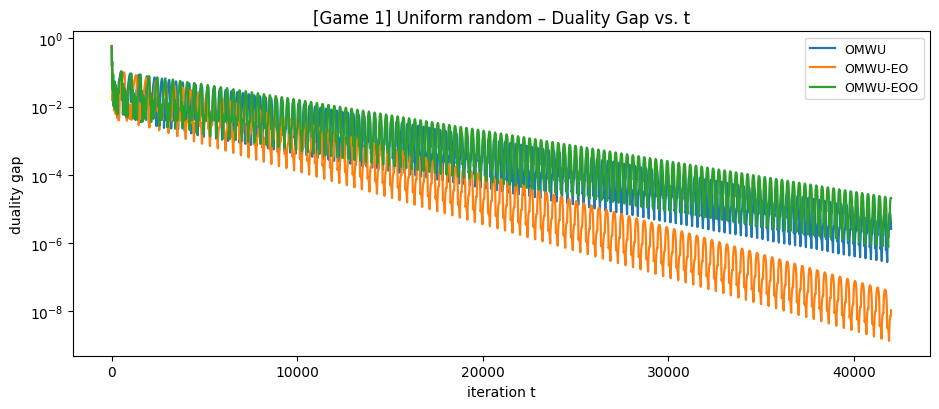

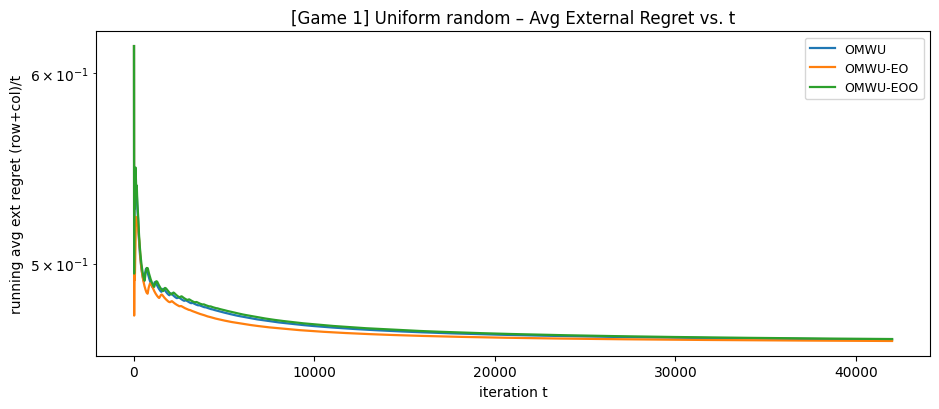

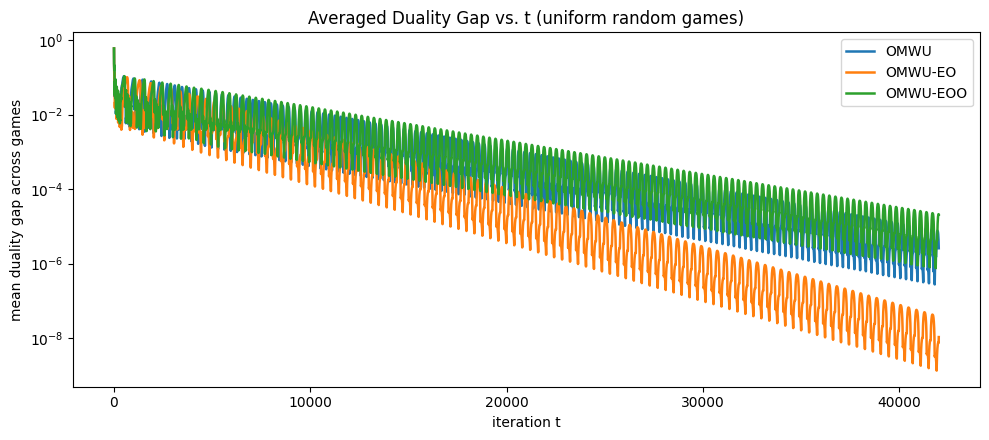

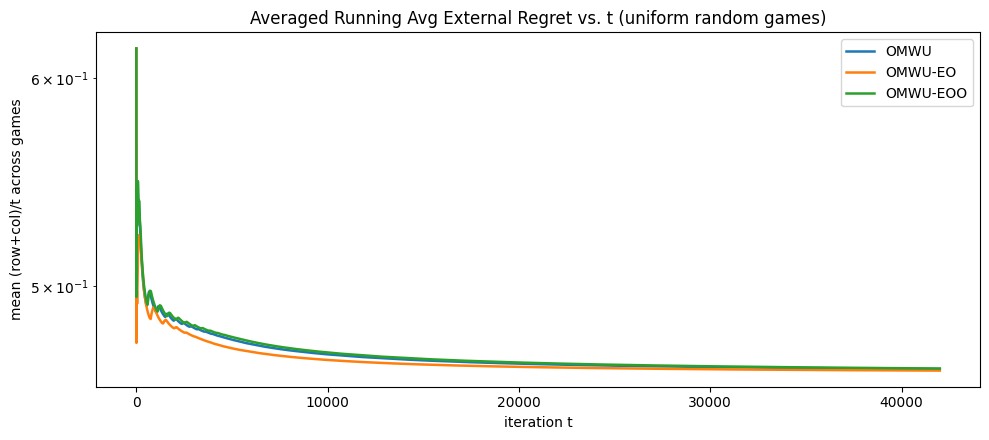

In [151]:
# ============================================================
# OMWU VARIANTS – Uniform Random Games Only
# Per-game trajectory plots + end-of-suite averaged curves
# Variants: OMWU, OMWU-AVG(H), OMWU-EO(α), OMWU-EOO(L), OMWU-L(L), OMWU-KD(α_kd, ρ_kd)
# (DECAY removed)
# ============================================================

from __future__ import annotations
import numpy as np
import matplotlib.pyplot as plt
from dataclasses import dataclass
from typing import Dict, List, Tuple, Any, Optional
import random
import os

# ----------------------------
# numerics / utils
# ----------------------------
EPS = 1e-300

def softmax(v: np.ndarray) -> np.ndarray:
    z = v - np.max(v)
    e = np.exp(z)
    s = e / np.sum(e)
    return s

def clip_probs(p: np.ndarray) -> np.ndarray:
    p = np.clip(p, EPS, 1.0)
    return p / p.sum()

def duality_gap(A: np.ndarray, x: np.ndarray, y: np.ndarray) -> float:
    """
    gap_t = max_i (e_i^T A y_t) - min_j (x_t^T A e_j)
    """
    gy = A @ y
    xA = x @ A
    row_br = float(np.max(gy))
    col_worst = float(np.min(xA))
    return row_br - col_worst

def regret_increments(A: np.ndarray, x: np.ndarray, y: np.ndarray) -> Tuple[float, float]:
    """
    External regret increments at current t.
      Row: max_i e_i^T A y - x^T A y
      Col: max_j x^T A e_j - x^T A y
    """
    gy = A @ y
    xA = x @ A
    val = float(x @ (A @ y))
    row_inc = float(np.max(gy) - val)
    col_inc = float(np.max(xA) - val)
    return row_inc, col_inc

# ----------------------------
# Uniform random games
# ----------------------------
def game_random_uniform(m: int, n: int, low: float, high: float) -> np.ndarray:
    A = np.random.uniform(low=float(low), high=float(high), size=(int(m), int(n)))
    return A.astype(np.float64)

# ----------------------------
# Variants
# ----------------------------
@dataclass
class VariantParams:
    name: str
    eta_row: float = 0.5
    eta_col: float = 0.5
    # AVG
    H: int = 3
    # EO
    alpha: float = 2.0
    # L, EOO
    L: int = 3
    # KD (EMA teacher)
    alpha_kd: float = 1.0
    rho_kd: float = 0.9

@dataclass
class VariantState:
    # EOO pending buffers (per-side)
    pending_row: Optional[np.ndarray] = None
    pending_col: Optional[np.ndarray] = None
    # KD EMA (per-side)
    s_kd_row: Optional[np.ndarray] = None
    s_kd_col: Optional[np.ndarray] = None

def _last(g_hist: List[np.ndarray], k: int) -> Optional[np.ndarray]:
    return g_hist[-k] if len(g_hist) >= k else None

def _window_sum(g_hist: List[np.ndarray], L: int) -> Optional[np.ndarray]:
    if not g_hist or L <= 0:
        return None
    out = np.zeros_like(g_hist[-1])
    c = 0
    for i in range(1, L+1):
        if len(g_hist) >= i:
            out += g_hist[-i]
            c += 1
    return out if c > 0 else None

def _avg_last_H(g_hist: List[np.ndarray], H: int) -> Optional[np.ndarray]:
    ws = _window_sum(g_hist, H)
    if ws is None:
        return None
    denom = max(1, min(H, len(g_hist)))
    return ws / denom

def dir_omwu(g_hist: List[np.ndarray]) -> np.ndarray:
    g_t = g_hist[-1]
    g_prev = _last(g_hist, 2)
    if g_prev is None:
        g_prev = np.zeros_like(g_t)
    return 2.0 * g_t - g_prev

def dir_avg(g_hist: List[np.ndarray], H: int) -> np.ndarray:
    g_t = g_hist[-1]
    m = _avg_last_H(g_hist, H)
    if m is None:
        m = np.zeros_like(g_t)
    return 2.0 * g_t - m

def dir_eo(g_hist: List[np.ndarray], alpha: float) -> np.ndarray:
    g_t = g_hist[-1]
    g_prev = _last(g_hist, 2)
    if g_prev is None:
        g_prev = np.zeros_like(g_t)
    return float(alpha) * g_t - (float(alpha) - 1.0) * g_prev

def dir_L(g_hist: List[np.ndarray], L: int) -> np.ndarray:
    g_t = g_hist[-1]
    s = _window_sum(g_hist, int(L))
    if s is None:
        s = np.zeros_like(g_t)
    return (int(L) + 1.0) * g_t - s

def dir_eoo(state: VariantState, side: str, g_hist: List[np.ndarray], L: int) -> np.ndarray:
    g_t = g_hist[-1]
    g_prev = _last(g_hist, 2)
    if g_prev is None:
        g_prev = np.zeros_like(g_t)
    pending = state.pending_row if side == "row" else state.pending_col
    if pending is None:
        pending = np.zeros_like(g_t)
    d = (int(L) + 1.0) * g_t - g_prev - pending
    new_pending = max(int(L) - 1, 0) * g_prev
    if side == "row":
        state.pending_row = new_pending
    else:
        state.pending_col = new_pending
    return d

# ---- KD (EMA teacher) — EXACTLY your snippet ----
def dir_kd(state: VariantState, side: str, g_hist: List[np.ndarray],
           alpha_kd: float, rho_kd: float) -> np.ndarray:
    """
    KD:
      s_t = rho_kd * s_{t-1} + (1 - rho_kd) * g_{t-1}   (per side; excludes g_t)
      m_t = s_t
      d_t = 2 * g_t - alpha_kd * m_t
    """
    g_t = g_hist[-1]
    g_prev = _last(g_hist, 2)
    if g_prev is None:
        g_prev = np.zeros_like(g_t)

    if side == "row":
        s = state.s_kd_row
        s = (rho_kd * s + (1.0 - rho_kd) * g_prev) if s is not None else (1.0 - rho_kd) * g_prev
        state.s_kd_row = s
    else:
        s = state.s_kd_col
        s = (rho_kd * s + (1.0 - rho_kd) * g_prev) if s is not None else (1.0 - rho_kd) * g_prev
        state.s_kd_col = s

    m = s
    return 2.0 * g_t - float(alpha_kd) * m
# -------------------------------------------------

# ----------------------------
# Single algorithm on a single game (trajectory)
# ----------------------------
def run_algo_trajectory(
    A: np.ndarray,
    variant: str,
    params: VariantParams,
    T: int,
    seed: int,
) -> Tuple[np.ndarray, np.ndarray]:
    """
    Returns:
      gaps[t-1] = duality_gap at t
      avg_regs[t-1] = (row_reg + col_reg)/t
    """
    rng = np.random.default_rng(seed)
    m, n = A.shape

    ux = np.zeros(m, dtype=np.float64)
    uy = np.zeros(n, dtype=np.float64)

    eta_x = float(params.eta_row)
    eta_y = float(params.eta_col)

    state = VariantState()
    g_hist_row: List[np.ndarray] = []
    g_hist_col: List[np.ndarray] = []

    row_reg_sum = 0.0
    col_reg_sum = 0.0

    gaps = np.zeros(T, dtype=np.float64)
    avg_regs = np.zeros(T, dtype=np.float64)

    for t in range(1, T + 1):
        x = softmax(ux)
        y = softmax(uy)

        # gradients
        g_row = A @ y
        g_col = -(A.T @ x)
        g_hist_row.append(g_row)
        g_hist_col.append(g_col)

        # metrics
        gaps[t - 1] = duality_gap(A, x, y)
        inc_r, inc_c = regret_increments(A, x, y)
        row_reg_sum += inc_r
        col_reg_sum += inc_c
        avg_regs[t - 1] = (row_reg_sum + col_reg_sum) / float(t)

        # direction by variant
        if variant == "OMWU":
            dx = dir_omwu(g_hist_row)
            dy = dir_omwu(g_hist_col)
        elif variant == "OMWU-AVG":
            dx = dir_avg(g_hist_row, params.H)
            dy = dir_avg(g_hist_col, params.H)
        elif variant == "OMWU-EO":
            dx = dir_eo(g_hist_row, params.alpha)
            dy = dir_eo(g_hist_col, params.alpha)
        elif variant == "OMWU-EOO":
            dx = dir_eoo(state, "row", g_hist_row, params.L)
            dy = dir_eoo(state, "col", g_hist_col, params.L)
        elif variant == "OMWU-L":
            dx = dir_L(g_hist_row, params.L)
            dy = dir_L(g_hist_col, params.L)
        elif variant == "OMWU-KD":
            dx = dir_kd(state, "row", g_hist_row, params.alpha_kd, params.rho_kd)
            dy = dir_kd(state, "col", g_hist_col, params.alpha_kd, params.rho_kd)
        else:
            raise ValueError(f"Unknown variant: {variant}")

        # entropy mirror ascent in logit space
        ux = ux + eta_x * dx
        uy = uy + eta_y * dy

    return gaps, avg_regs

# ----------------------------
# Plot helpers
# ----------------------------
def plot_trajectories_for_game(
    game_idx: int,
    algo_curves: Dict[str, Tuple[np.ndarray, np.ndarray]],
    LOG_Y_GAP: bool,
    LOG_Y_REGRET: bool,
    save_pngs: bool,
    outdir: str,
):
    T = next(iter(algo_curves.values()))[0].shape[0]
    x = np.arange(1, T + 1)

    # Duality gap vs. t
    plt.figure(figsize=(9.5, 4.2))
    for algo, (gaps, _) in algo_curves.items():
        plt.plot(x, gaps, label=algo, linewidth=1.6)
    if LOG_Y_GAP:
        plt.yscale('log')
    plt.xlabel("iteration t")
    plt.ylabel("duality gap")
    plt.title(f"[Game {game_idx}] Uniform random – Duality Gap vs. t")
    plt.legend(loc="best", fontsize=9)
    plt.tight_layout()
    if save_pngs:
        os.makedirs(outdir, exist_ok=True)
        plt.savefig(os.path.join(outdir, f"game{game_idx:03d}_gap.png"), dpi=150)

    # Running average external regret vs. t
    plt.figure(figsize=(9.5, 4.2))
    for algo, (_, avg_regs) in algo_curves.items():
        plt.plot(x, avg_regs, label=algo, linewidth=1.6)
    if LOG_Y_REGRET:
        plt.yscale('log')
    plt.xlabel("iteration t")
    plt.ylabel("running avg ext regret (row+col)/t")
    plt.title(f"[Game {game_idx}] Uniform random – Avg External Regret vs. t")
    plt.legend(loc="best", fontsize=9)
    plt.tight_layout()
    if save_pngs:
        os.makedirs(outdir, exist_ok=True)
        plt.savefig(os.path.join(outdir, f"game{game_idx:03d}_regret.png"), dpi=150)

    plt.show()

def plot_averaged_curves(
    mean_curves: Dict[str, Tuple[np.ndarray, np.ndarray]],
    LOG_Y_GAP: bool,
    LOG_Y_REGRET: bool,
    save_pngs: bool,
    outdir: str,
):
    T = next(iter(mean_curves.values()))[0].shape[0]
    x = np.arange(1, T + 1)

    # Averaged duality gap
    plt.figure(figsize=(10.0, 4.5))
    for algo, (mean_gap, _) in mean_curves.items():
        plt.plot(x, mean_gap, label=algo, linewidth=1.8)
    if LOG_Y_GAP:
        plt.yscale('log')
    plt.xlabel("iteration t")
    plt.ylabel("mean duality gap across games")
    plt.title("Averaged Duality Gap vs. t (uniform random games)")
    plt.legend(loc="best", fontsize=10)
    plt.tight_layout()
    if save_pngs:
        os.makedirs(outdir, exist_ok=True)
        plt.savefig(os.path.join(outdir, f"mean_gap.png"), dpi=160)

    # Averaged running avg external regret
    plt.figure(figsize=(10.0, 4.5))
    for algo, (_, mean_reg) in mean_curves.items():
        plt.plot(x, mean_reg, label=algo, linewidth=1.8)
    if LOG_Y_REGRET:
        plt.yscale('log')
    plt.xlabel("iteration t")
    plt.ylabel("mean (row+col)/t across games")
    plt.title("Averaged Running Avg External Regret vs. t (uniform random games)")
    plt.legend(loc="best", fontsize=10)
    plt.tight_layout()
    if save_pngs:
        os.makedirs(outdir, exist_ok=True)
        plt.savefig(os.path.join(outdir, f"mean_regret.png"), dpi=160)

    plt.show()

# ----------------------------
# Suite
# ----------------------------
def run_suite(
    RUN_ALGOS: List[str],
    VARIANT_CFG: Dict[str, VariantParams],
    COUNT: int,
    M: int,
    N: int,
    LOW: float,
    HIGH: float,
    T: int,
    SEED: int,
    RANDOMIZE_SEEDS_PER_RUN: bool,
    PRINT_EVERY: int,
    LOG_Y_GAP: bool,
    LOG_Y_REGRET: bool,
    SAVE_PNGS: bool,
    OUTDIR: str,
):
    np.random.seed(SEED)
    random.seed(SEED)

    algos = list(RUN_ALGOS)

    # storage for averages: lists of curves per algo
    all_gaps: Dict[str, List[np.ndarray]] = {a: [] for a in algos}
    all_regs: Dict[str, List[np.ndarray]] = {a: [] for a in algos}

    base_seed = SEED

    for idx in range(1, COUNT + 1):
        # build uniform random game
        A = game_random_uniform(M, N, LOW, HIGH)
        run_seed = base_seed + idx * 1337 if RANDOMIZE_SEEDS_PER_RUN else base_seed

        if (idx % max(1, PRINT_EVERY)) == 0 or PRINT_EVERY == 1:
            print(f"=== Running game {idx}/{COUNT}: uniform ({M}x{N}) in [{LOW},{HIGH}] ===")

        # compute trajectories for each algorithm
        algo_curves: Dict[str, Tuple[np.ndarray, np.ndarray]] = {}
        for algo in algos:
            params = VARIANT_CFG[algo]
            gaps, avg_regs = run_algo_trajectory(A=A, variant=algo, params=params, T=T, seed=run_seed)
            algo_curves[algo] = (gaps, avg_regs)
            all_gaps[algo].append(gaps)
            all_regs[algo].append(avg_regs)

        # quick end-of-game print
        print("  Final (t = T) metrics:")
        for algo in algos:
            gaps, regs = algo_curves[algo]
            print(f"    {algo:<12} gap={gaps[-1]:.6g}  avgReg={regs[-1]:.6g}")

        # plot per-game curves
        plot_trajectories_for_game(
            game_idx=idx,
            algo_curves=algo_curves,
            LOG_Y_GAP=LOG_Y_GAP,
            LOG_Y_REGRET=LOG_Y_REGRET,
            save_pngs=SAVE_PNGS,
            outdir=OUTDIR,
        )

    # ---- end-of-suite: averaged curves over all games ----
    mean_curves: Dict[str, Tuple[np.ndarray, np.ndarray]] = {}
    for algo in algos:
        G = np.stack(all_gaps[algo], axis=0)   # shape: (COUNT, T)
        R = np.stack(all_regs[algo], axis=0)   # shape: (COUNT, T)
        mean_curves[algo] = (np.mean(G, axis=0), np.mean(R, axis=0))

    plot_averaged_curves(
        mean_curves=mean_curves,
        LOG_Y_GAP=LOG_Y_GAP,
        LOG_Y_REGRET=LOG_Y_REGRET,
        save_pngs=SAVE_PNGS,
        outdir=OUTDIR,
    )

# ============================================================
# =====================  EDIT HERE (CONFIG)  =================
# ============================================================

# Suite controls
SEED: int = 1
T: int = 42000
COUNT: int = 1              # number of independent uniform games
M: int = 10                  # rows
N: int = 10                  # cols
LOW: float = -1.0
HIGH: float = 1.0
RANDOMIZE_SEEDS_PER_RUN: bool = True
PRINT_EVERY: int = 1

# Algorithms to run (DECAY removed)
RUN_ALGOS: List[str] = [
    "OMWU",
    # "OMWU-AVG",
    "OMWU-EO",
    "OMWU-EOO",
    # "OMWU-L",
    # "OMWU-KD",   # KD (EMA teacher)
]

# Per-algorithm hyperparameters
VARIANT_CFG: Dict[str, VariantParams] = {
    "OMWU":        VariantParams(name="OMWU",       eta_row=1.0, eta_col=1.0),
    "OMWU-AVG":    VariantParams(name="OMWU-AVG",   eta_row=0.9, eta_col=0.9, H=4),
    "OMWU-EO":     VariantParams(name="OMWU-EO",    eta_row=0.72, eta_col=0.72, alpha=3.0),
    "OMWU-EOO":    VariantParams(name="OMWU-EOO",   eta_row=0.5, eta_col=0.5, L=2),
    # "OMWU-L":      VariantParams(name="OMWU-L",     eta_row=0.1239, eta_col=0.1239, L=2),
    # KD: EMA teacher (exact snippet)
    "OMWU-KD":     VariantParams(name="OMWU-KD",    eta_row=0.1, eta_col=0.1, alpha_kd=1.0, rho_kd=0.9),
}

# Plotting options
LOG_Y_GAP: bool = True
LOG_Y_REGRET: bool = True
SAVE_PNGS: bool = False
OUTDIR: str = "omwu_uniform_runs"

# =====================  RUN  =====================
if __name__ == "__main__":
    run_suite(
        RUN_ALGOS=RUN_ALGOS,
        VARIANT_CFG=VARIANT_CFG,
        COUNT=COUNT,
        M=M, N=N, LOW=LOW, HIGH=HIGH,
        T=T, SEED=SEED,
        RANDOMIZE_SEEDS_PER_RUN=RANDOMIZE_SEEDS_PER_RUN,
        PRINT_EVERY=PRINT_EVERY,
        LOG_Y_GAP=LOG_Y_GAP,
        LOG_Y_REGRET=LOG_Y_REGRET,
        SAVE_PNGS=SAVE_PNGS,
        OUTDIR=OUTDIR,
    )


In [152]:
##########################################

=== Run 1/1 — Biased RPS (bias=0.5305), seed=1 ===
  Final (t = T) metrics:
    OMWU         gap=1.12965e-14  avgReg=0.000740486
    OMWU-EO      gap=1.28786e-14  avgReg=0.000535499


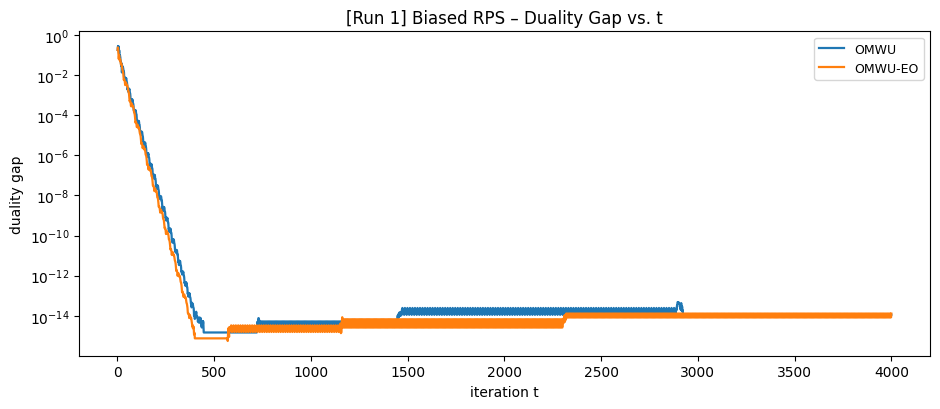

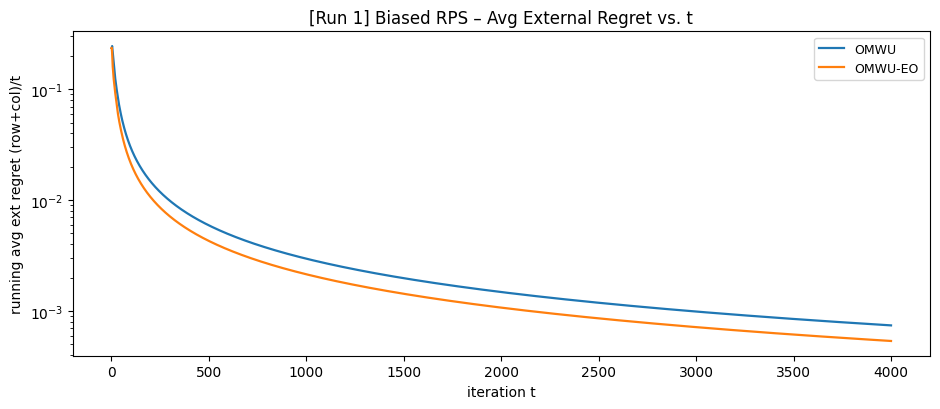

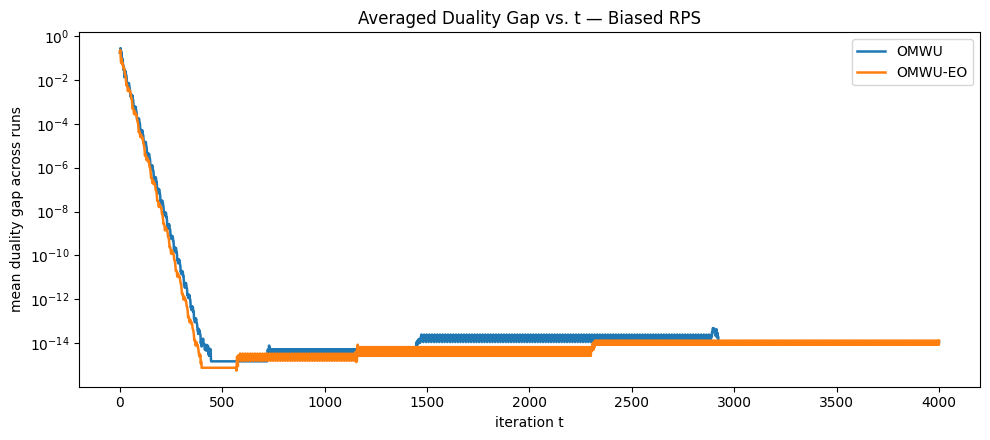

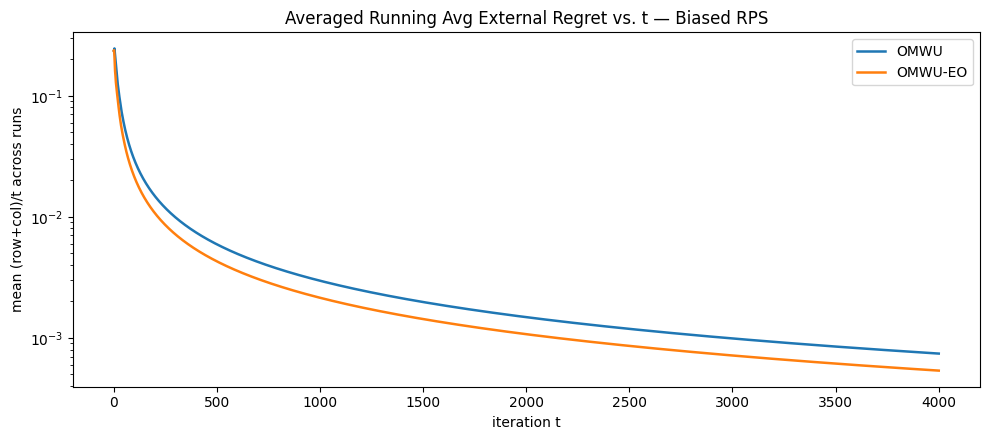

In [252]:
# ============================================================
# OMWU VARIANTS — Biased RPS only
# Per-run (per-seed) trajectory plots + end-of-suite averaged curves
# Variants: OMWU, OMWU-AVG(H), OMWU-EO(α), OMWU-EOO(L), OMWU-L(L), OMWU-KD(α_kd, ρ_kd)
# (DECAY removed)
# ============================================================

from __future__ import annotations
import numpy as np
import matplotlib.pyplot as plt
from dataclasses import dataclass
from typing import Dict, List, Tuple, Any, Optional
import os

# ----------------------------
# numerics / utils
# ----------------------------
EPS = 1e-300

def softmax(v: np.ndarray) -> np.ndarray:
    z = v - np.max(v)
    e = np.exp(z)
    s = e / np.sum(e)
    return s

def clip_probs(p: np.ndarray) -> np.ndarray:
    p = np.clip(p, EPS, 1.0)
    return p / p.sum()

def duality_gap(A: np.ndarray, x: np.ndarray, y: np.ndarray) -> float:
    """ gap_t = max_i e_i^T A y_t - min_j x_t^T A e_j """
    gy = A @ y
    xA = x @ A
    row_br = float(np.max(gy))
    col_worst = float(np.min(xA))
    return row_br - col_worst

def regret_increments(A: np.ndarray, x: np.ndarray, y: np.ndarray) -> Tuple[float, float]:
    """ External regret increments at t. """
    gy = A @ y
    xA = x @ A
    val = float(x @ (A @ y))
    row_inc = float(np.max(gy) - val)
    col_inc = float(np.max(xA) - val)
    return row_inc, col_inc

# ----------------------------
# Biased RPS game
# ----------------------------
def game_biased_rps(bias: float = 0.05) -> np.ndarray:
    A = np.array([[ 0.0, -1.0,  1.0],
                  [ 1.0,  0.0, -1.0],
                  [-1.0,  1.0,  0.0]], dtype=np.float64)
    A[0, 0] += float(bias)  # bias Rock
    return A

# ----------------------------
# Variants
# ----------------------------
@dataclass
class VariantParams:
    name: str
    eta_row: float = 0.5
    eta_col: float = 0.5
    # AVG
    H: int = 3
    # EO
    alpha: float = 2.0
    # L, EOO
    L: int = 3
    # KD (EMA teacher)
    alpha_kd: float = 1.0
    rho_kd: float = 0.9

@dataclass
class VariantState:
    # EOO pending buffers (per-side)
    pending_row: Optional[np.ndarray] = None
    pending_col: Optional[np.ndarray] = None
    # KD EMA (per-side)
    s_kd_row: Optional[np.ndarray] = None
    s_kd_col: Optional[np.ndarray] = None

def _last(g_hist: List[np.ndarray], k: int) -> Optional[np.ndarray]:
    return g_hist[-k] if len(g_hist) >= k else None

def _window_sum(g_hist: List[np.ndarray], L: int) -> Optional[np.ndarray]:
    if not g_hist or L <= 0: return None
    out = np.zeros_like(g_hist[-1]); c = 0
    for i in range(1, L+1):
        if len(g_hist) >= i:
            out += g_hist[-i]; c += 1
    return out if c > 0 else None

def _avg_last_H(g_hist: List[np.ndarray], H: int) -> Optional[np.ndarray]:
    ws = _window_sum(g_hist, H)
    if ws is None: return None
    denom = max(1, min(H, len(g_hist)))
    return ws / denom

def dir_omwu(g_hist: List[np.ndarray]) -> np.ndarray:
    g_t = g_hist[-1]; g_prev = _last(g_hist, 2)
    if g_prev is None: g_prev = np.zeros_like(g_t)
    return 2.0 * g_t - g_prev

def dir_avg(g_hist: List[np.ndarray], H: int) -> np.ndarray:
    g_t = g_hist[-1]; m = _avg_last_H(g_hist, H)
    if m is None: m = np.zeros_like(g_t)
    return 2.0 * g_t - m

def dir_eo(g_hist: List[np.ndarray], alpha: float) -> np.ndarray:
    g_t = g_hist[-1]; g_prev = _last(g_hist, 2)
    if g_prev is None: g_prev = np.zeros_like(g_t)
    return float(alpha) * g_t - (float(alpha) - 1.0) * g_prev

def dir_L(g_hist: List[np.ndarray], L: int) -> np.ndarray:
    g_t = g_hist[-1]; s = _window_sum(g_hist, int(L))
    if s is None: s = np.zeros_like(g_t)
    return (int(L) + 1.0) * g_t - s

def dir_eoo(state: VariantState, side: str, g_hist: List[np.ndarray], L: int) -> np.ndarray:
    g_t = g_hist[-1]; g_prev = _last(g_hist, 2)
    if g_prev is None: g_prev = np.zeros_like(g_t)
    pending = state.pending_row if side == "row" else state.pending_col
    if pending is None: pending = np.zeros_like(g_t)
    d = (int(L) + 1.0) * g_t - g_prev - pending
    new_pending = max(int(L) - 1, 0) * g_prev
    if side == "row": state.pending_row = new_pending
    else:            state.pending_col = new_pending
    return d

# ---- KD (EMA teacher) — EXACTLY your snippet ----
def dir_kd(state: VariantState, side: str, g_hist: List[np.ndarray],
           alpha_kd: float, rho_kd: float) -> np.ndarray:
    """
    KD:
      s_t = rho_kd * s_{t-1} + (1 - rho_kd) * g_{t-1}   (per side; excludes g_t)
      m_t = s_t
      d_t = 2 * g_t - alpha_kd * m_t
    """
    g_t = g_hist[-1]; g_prev = _last(g_hist, 2)
    if g_prev is None: g_prev = np.zeros_like(g_t)
    if side == "row":
        s = state.s_kd_row
        s = (rho_kd * s + (1.0 - rho_kd) * g_prev) if s is not None else (1.0 - rho_kd) * g_prev
        state.s_kd_row = s
    else:
        s = state.s_kd_col
        s = (rho_kd * s + (1.0 - rho_kd) * g_prev) if s is not None else (1.0 - rho_kd) * g_prev
        state.s_kd_col = s
    m = s
    return 2.0 * g_t - float(alpha_kd) * m
# -------------------------------------------------

# ----------------------------
# Single algorithm on a single game (trajectory)
# ----------------------------
def run_algo_trajectory(
    A: np.ndarray,
    variant: str,
    params: VariantParams,
    T: int,
    seed: int,
) -> Tuple[np.ndarray, np.ndarray]:
    """ Return per-iteration curves: duality gap, running average (row+col)/t. """
    rng = np.random.default_rng(seed)
    m, n = A.shape
    ux = np.zeros(m, dtype=np.float64); uy = np.zeros(n, dtype=np.float64)
    eta_x = float(params.eta_row); eta_y = float(params.eta_col)

    state = VariantState()
    g_hist_row: List[np.ndarray] = []
    g_hist_col: List[np.ndarray] = []

    row_reg_sum = 0.0; col_reg_sum = 0.0
    gaps = np.zeros(T, dtype=np.float64)
    avg_regs = np.zeros(T, dtype=np.float64)

    for t in range(1, T + 1):
        x = softmax(ux); y = softmax(uy)
        g_row = A @ y; g_col = -(A.T @ x)
        g_hist_row.append(g_row); g_hist_col.append(g_col)

        gaps[t - 1] = duality_gap(A, x, y)
        inc_r, inc_c = regret_increments(A, x, y)
        row_reg_sum += inc_r; col_reg_sum += inc_c
        avg_regs[t - 1] = (row_reg_sum + col_reg_sum) / float(t)

        if variant == "OMWU":
            dx = dir_omwu(g_hist_row); dy = dir_omwu(g_hist_col)
        elif variant == "OMWU-AVG":
            dx = dir_avg(g_hist_row, params.H); dy = dir_avg(g_hist_col, params.H)
        elif variant == "OMWU-EO":
            dx = dir_eo(g_hist_row, params.alpha); dy = dir_eo(g_hist_col, params.alpha)
        elif variant == "OMWU-EOO":
            dx = dir_eoo(state, "row", g_hist_row, params.L)
            dy = dir_eoo(state, "col", g_hist_col, params.L)
        elif variant == "OMWU-L":
            dx = dir_L(g_hist_row, params.L); dy = dir_L(g_hist_col, params.L)
        elif variant == "OMWU-KD":
            dx = dir_kd(state, "row", g_hist_row, params.alpha_kd, params.rho_kd)
            dy = dir_kd(state, "col", g_hist_col, params.alpha_kd, params.rho_kd)
        else:
            raise ValueError(f"Unknown variant: {variant}")

        ux = ux + eta_x * dx; uy = uy + eta_y * dy

    return gaps, avg_regs

# ----------------------------
# Plot helpers
# ----------------------------
def plot_trajectories_for_run(
    run_idx: int,
    algo_curves: Dict[str, Tuple[np.ndarray, np.ndarray]],
    LOG_Y_GAP: bool,
    LOG_Y_REGRET: bool,
    save_pngs: bool,
    outdir: str,
):
    T = next(iter(algo_curves.values()))[0].shape[0]
    x = np.arange(1, T + 1)

    # Duality gap vs. t
    plt.figure(figsize=(9.5, 4.2))
    for algo, (gaps, _) in algo_curves.items():
        plt.plot(x, gaps, label=algo, linewidth=1.6)
    if LOG_Y_GAP: plt.yscale('log')
    plt.xlabel("iteration t"); plt.ylabel("duality gap")
    plt.title(f"[Run {run_idx}] Biased RPS – Duality Gap vs. t")
    plt.legend(loc="best", fontsize=9); plt.tight_layout()
    if save_pngs:
        os.makedirs(outdir, exist_ok=True)
        plt.savefig(os.path.join(outdir, f"run{run_idx:03d}_gap.png"), dpi=150)

    # Running average external regret vs. t
    plt.figure(figsize=(9.5, 4.2))
    for algo, (_, avg_regs) in algo_curves.items():
        plt.plot(x, avg_regs, label=algo, linewidth=1.6)
    if LOG_Y_REGRET: plt.yscale('log')
    plt.xlabel("iteration t"); plt.ylabel("running avg ext regret (row+col)/t")
    plt.title(f"[Run {run_idx}] Biased RPS – Avg External Regret vs. t")
    plt.legend(loc="best", fontsize=9); plt.tight_layout()
    if save_pngs:
        os.makedirs(outdir, exist_ok=True)
        plt.savefig(os.path.join(outdir, f"run{run_idx:03d}_regret.png"), dpi=150)

    plt.show()

def plot_averaged_curves(
    mean_curves: Dict[str, Tuple[np.ndarray, np.ndarray]],
    LOG_Y_GAP: bool,
    LOG_Y_REGRET: bool,
    save_pngs: bool,
    outdir: str,
):
    T = next(iter(mean_curves.values()))[0].shape[0]
    x = np.arange(1, T + 1)

    # Averaged duality gap
    plt.figure(figsize=(10.0, 4.5))
    for algo, (mean_gap, _) in mean_curves.items():
        plt.plot(x, mean_gap, label=algo, linewidth=1.8)
    if LOG_Y_GAP: plt.yscale('log')
    plt.xlabel("iteration t"); plt.ylabel("mean duality gap across runs")
    plt.title("Averaged Duality Gap vs. t — Biased RPS")
    plt.legend(loc="best", fontsize=10); plt.tight_layout()
    if save_pngs:
        os.makedirs(outdir, exist_ok=True)
        plt.savefig(os.path.join(outdir, f"mean_gap.png"), dpi=160)

    # Averaged running avg external regret
    plt.figure(figsize=(10.0, 4.5))
    for algo, (_, mean_reg) in mean_curves.items():
        plt.plot(x, mean_reg, label=algo, linewidth=1.8)
    if LOG_Y_REGRET: plt.yscale('log')
    plt.xlabel("iteration t"); plt.ylabel("mean (row+col)/t across runs")
    plt.title("Averaged Running Avg External Regret vs. t — Biased RPS")
    plt.legend(loc="best", fontsize=10); plt.tight_layout()
    if save_pngs:
        os.makedirs(outdir, exist_ok=True)
        plt.savefig(os.path.join(outdir, f"mean_regret.png"), dpi=160)

    plt.show()

# ----------------------------
# Suite (biased RPS only)
# ----------------------------
def run_suite(
    RUN_ALGOS: List[str],
    VARIANT_CFG: Dict[str, VariantParams],
    SEEDS: List[int],
    BIAS: float,
    T: int,
    LOG_Y_GAP: bool,
    LOG_Y_REGRET: bool,
    SAVE_PNGS: bool,
    OUTDIR: str,
):
    A = game_biased_rps(bias=BIAS)
    algos = list(RUN_ALGOS)

    # storage to average over seeds
    all_gaps: Dict[str, List[np.ndarray]] = {a: [] for a in algos}
    all_regs: Dict[str, List[np.ndarray]] = {a: [] for a in algos}

    for idx, seed in enumerate(SEEDS, start=1):
        print(f"=== Run {idx}/{len(SEEDS)} — Biased RPS (bias={BIAS}), seed={seed} ===")

        algo_curves: Dict[str, Tuple[np.ndarray, np.ndarray]] = {}
        for algo in algos:
            params = VARIANT_CFG[algo]
            gaps, regs = run_algo_trajectory(A=A, variant=algo, params=params, T=T, seed=seed)
            algo_curves[algo] = (gaps, regs)
            all_gaps[algo].append(gaps)
            all_regs[algo].append(regs)

        # print quick summary
        print("  Final (t = T) metrics:")
        for algo in algos:
            g, r = algo_curves[algo]
            print(f"    {algo:<12} gap={g[-1]:.6g}  avgReg={r[-1]:.6g}")

        # per-run plots
        plot_trajectories_for_run(
            run_idx=idx,
            algo_curves=algo_curves,
            LOG_Y_GAP=LOG_Y_GAP,
            LOG_Y_REGRET=LOG_Y_REGRET,
            save_pngs=SAVE_PNGS,
            outdir=OUTDIR,
        )

    # end-of-suite averages across seeds
    mean_curves: Dict[str, Tuple[np.ndarray, np.ndarray]] = {}
    for algo in algos:
        G = np.stack(all_gaps[algo], axis=0)   # (num_runs, T)
        R = np.stack(all_regs[algo], axis=0)   # (num_runs, T)
        mean_curves[algo] = (np.mean(G, axis=0), np.mean(R, axis=0))

    plot_averaged_curves(
        mean_curves=mean_curves,
        LOG_Y_GAP=LOG_Y_GAP,
        LOG_Y_REGRET=LOG_Y_REGRET,
        save_pngs=SAVE_PNGS,
        outdir=OUTDIR,
    )

# ============================================================
# =====================  EDIT HERE (CONFIG)  =================
# ============================================================

# Iterations
T: int = 4000

# Seeds — default: single seed
SEEDS: List[int] = [1]

# Biased RPS parameter
BIAS: float = 0.5305

# Algorithms to run (DECAY removed)
RUN_ALGOS: List[str] = [
    "OMWU",
    # "OMWU-AVG",
    "OMWU-EO",
    # "OMWU-EOO",
    # "OMWU-L",
    # "OMWU-KD",   # KD (EMA teacher)
]

# Per-algorithm hyperparameters
VARIANT_CFG: Dict[str, VariantParams] = {
    "OMWU":        VariantParams(name="OMWU",       eta_row=0.75, eta_col=0.75),
    "OMWU-AVG":    VariantParams(name="OMWU-AVG",   eta_row=0.5, eta_col=0.5, H=4),
    # "OMWU-EO":     VariantParams(name="OMWU-EO",    eta_row=0.47, eta_col=0.47, alpha=3.0),
    # "OMWU-EO":     VariantParams(name="OMWU-EO",    eta_row=0.37, eta_col=0.37, alpha=4.0),
    # "OMWU-EO":     VariantParams(name="OMWU-EO",    eta_row=0.28, eta_col=0.28, alpha=5.0),
    "OMWU-EO":     VariantParams(name="OMWU-EO",    eta_row=0.47, eta_col=0.47, alpha=3.0),
    "OMWU-EOO":    VariantParams(name="OMWU-EOO",   eta_row=0.35, eta_col=0.35, L=2),
    "OMWU-L":      VariantParams(name="OMWU-L",     eta_row=0.37, eta_col=0.37, L=3),
    "OMWU-KD":     VariantParams(name="OMWU-KD",    eta_row=0.2, eta_col=0.2, alpha_kd=1.0, rho_kd=0.75),
}

# Plotting options
LOG_Y_GAP: bool = True
LOG_Y_REGRET: bool = True
SAVE_PNGS: bool = False
OUTDIR: str = "omwu_biased_rps_runs"

# =====================  RUN  =====================
if __name__ == "__main__":
    run_suite(
        RUN_ALGOS=RUN_ALGOS,
        VARIANT_CFG=VARIANT_CFG,
        SEEDS=SEEDS,
        BIAS=BIAS,
        T=T,
        LOG_Y_GAP=LOG_Y_GAP,
        LOG_Y_REGRET=LOG_Y_REGRET,
        SAVE_PNGS=SAVE_PNGS,
        OUTDIR=OUTDIR,
    )


In [253]:
############################################

In [ ]:
# ============================================================
# OMWU sweep on a fixed biased-RPS game
# Runs Q = 1..100 with eta = Q/100 for OMWU only
# Reports earliest-threshold hits, prints in batches of 5,
# ranks top-5, and plots their curves.
# ============================================================

from __future__ import annotations
import numpy as np
import matplotlib.pyplot as plt
from dataclasses import dataclass
from typing import List, Optional, Dict, Tuple
import math
import os

# ----------------------------
# numerics / utils
# ----------------------------
EPS = 1e-300

def softmax(v: np.ndarray) -> np.ndarray:
    z = v - np.max(v)
    e = np.exp(z)
    return e / np.sum(e)

def clip_probs(p: np.ndarray) -> np.ndarray:
    p = np.clip(p, EPS, 1.0)
    return p / p.sum()

def duality_gap(A: np.ndarray, x: np.ndarray, y: np.ndarray) -> float:
    # gap_t = max_i e_i^T A y - min_j x^T A e_j
    gy = A @ y
    xA = x @ A
    return float(np.max(gy) - np.min(xA))

def regret_increments(A: np.ndarray, x: np.ndarray, y: np.ndarray) -> Tuple[float, float]:
    # External regret increments at current t
    gy = A @ y
    xA = x @ A
    val = float(x @ (A @ y))
    row_inc = float(np.max(gy) - val)
    col_inc = float(np.max(xA) - val)
    return row_inc, col_inc

# ----------------------------
# Biased RPS game (fixed)
# ----------------------------
def game_biased_rps(bias: float = 0.05) -> np.ndarray:
    A = np.array([[ 0.0, -1.0,  1.0],
                  [ 1.0,  0.0, -1.0],
                  [-1.0,  1.0,  0.0]], dtype=np.float64)
    A[0, 0] += float(bias)  # bias Rock
    return A

# ----------------------------
# OMWU direction and runner
# ----------------------------
def dir_omwu(g_hist: List[np.ndarray]) -> np.ndarray:
    g_t = g_hist[-1]
    g_prev = g_hist[-2] if len(g_hist) >= 2 else np.zeros_like(g_t)
    return 2.0 * g_t - g_prev

def run_omwu_trajectory(
    A: np.ndarray,
    eta: float,
    T: int,
    threshold: float,
) -> Tuple[np.ndarray, np.ndarray, Optional[int]]:
    """
    Returns:
      gaps[t-1], avg_regs[t-1], first_hit_iter (1-indexed) if gap<=threshold, else None
    """
    m, n = A.shape
    ux = np.zeros(m, dtype=np.float64)  # logits, row
    uy = np.zeros(n, dtype=np.float64)  # logits, col

    g_hist_row: List[np.ndarray] = []
    g_hist_col: List[np.ndarray] = []

    row_reg_sum = 0.0
    col_reg_sum = 0.0
    gaps = np.zeros(T, dtype=np.float64)
    avg_regs = np.zeros(T, dtype=np.float64)

    first_hit: Optional[int] = None

    for t in range(1, T + 1):
        x = softmax(ux)
        y = softmax(uy)

        g_row = A @ y
        g_col = -(A.T @ x)

        g_hist_row.append(g_row)
        g_hist_col.append(g_col)

        gaps[t - 1] = duality_gap(A, x, y)
        inc_r, inc_c = regret_increments(A, x, y)
        row_reg_sum += inc_r
        col_reg_sum += inc_c
        avg_regs[t - 1] = (row_reg_sum + col_reg_sum) / float(t)

        # record first threshold hit
        if first_hit is None and gaps[t - 1] <= threshold:
            first_hit = t

        # OMWU update in logit space (entropy mirror ascent)
        dx = dir_omwu(g_hist_row)
        dy = dir_omwu(g_hist_col)
        ux = ux + eta * dx
        uy = uy + eta * dy

    return gaps, avg_regs, first_hit

# ----------------------------
# Plot helpers (top-5 curves)
# ----------------------------
def plot_top5(top5: List[Dict], T: int, outdir: Optional[str] = None):
    x = np.arange(1, T + 1)
    # Duality gap
    plt.figure(figsize=(10.0, 4.6))
    for rec in top5:
        label = f"η={rec['eta']:.2f} (hit={rec['hit'] if rec['hit'] is not None else '—'})"
        plt.plot(x, rec["gaps"], label=label, linewidth=1.8)
    plt.yscale('log')
    plt.xlabel("iteration t"); plt.ylabel("duality gap")
    plt.title("Top-5 (by earliest 1e-12 hit; tie-break final gap) — Duality Gap")
    plt.legend(loc="best", fontsize=9)
    plt.tight_layout()
    if outdir:
        os.makedirs(outdir, exist_ok=True)
        plt.savefig(os.path.join(outdir, "top5_gap.png"), dpi=160)
    plt.show()

    # Running average external regret
    plt.figure(figsize=(10.0, 4.6))
    for rec in top5:
        label = f"η={rec['eta']:.2f} (hit={rec['hit'] if rec['hit'] is not None else '—'})"
        plt.plot(x, rec["avg_reg"], label=label, linewidth=1.8)
    plt.yscale('log')
    plt.xlabel("iteration t"); plt.ylabel("running avg ext regret (row+col)/t")
    plt.title("Top-5 — Running Avg External Regret")
    plt.legend(loc="best", fontsize=9)
    plt.tight_layout()
    if outdir:
        os.makedirs(outdir, exist_ok=True)
        plt.savefig(os.path.join(outdir, "top5_regret.png"), dpi=160)
    plt.show()

# ----------------------------
# Sweep driver
# ----------------------------
def sweep_eta_on_fixed_game(
    T: int,
    threshold: float,
    bias: float,
    seed: int,
    save_pngs: bool = False,
    outdir: str = "omwu_eta_sweep",
):
    # Fix "same game" & seed (the game itself is deterministic; seed kept for completeness)
    np.random.seed(seed)

    A = game_biased_rps(bias=bias)

    results: List[Dict] = []

    print(f"=== OMWU sweep on SAME biased-RPS game (bias={bias}), T={T}, threshold={threshold:.1e} ===")
    for Q in range(1, 101):
        eta = Q / 100.0
        gaps, avg_reg, hit = run_omwu_trajectory(A=A, eta=eta, T=T, threshold=threshold)
        final_gap = gaps[-1]
        results.append({
            "Q": Q,
            "eta": eta,
            "gaps": gaps,
            "avg_reg": avg_reg,
            "hit": hit,
            "final_gap": final_gap,
        })

        # Print batches of 5 (Q=1..5, 6..10, ...)
        if Q % 5 == 0:
            print(f"\n--- Results for Q={Q-4}..{Q} (η from {(Q-4)/100:.2f} to {Q/100:.2f}) ---")
            for k in range(Q-4, Q+1):
                rec = results[k-1]
                status = f"hit@t={rec['hit']}" if rec["hit"] is not None else f"no hit; final gap={rec['final_gap']:.3e}"
                print(f"  Q={rec['Q']:3d}  η={rec['eta']:.2f}  -> {status}")

    # Rank: earliest hit wins; if no hit, use final gap (smaller is better)
    def key_fn(rec):
        hit = rec["hit"]
        return (hit if hit is not None else math.inf, rec["final_gap"])

    results_sorted = sorted(results, key=key_fn)
    top5 = results_sorted[:5]

    print("\n==================== TOP 5 ====================")
    for i, rec in enumerate(top5, 1):
        status = f"hit@t={rec['hit']}" if rec["hit"] is not None else f"no hit; final gap={rec['final_gap']:.3e}"
        print(f"{i}. η={rec['eta']:.2f}  (Q={rec['Q']:3d})  -> {status}")
    print("===============================================")

    # Plot top-5 curves
    plot_top5(top5, T=T, outdir=(outdir if save_pngs else None))

    # Summary
    total_hits = sum(1 for r in results if r["hit"] is not None)
    best = top5[0]
    print("\nSummary:")
    print(f"- Hits at threshold: {total_hits}/100")
    if best["hit"] is not None:
        print(f"- Best η={best['eta']:.2f} reached 1e-12 at t={best['hit']}.")
    else:
        print(f"- No run reached the threshold; best η={best['eta']:.2f} had final gap {best['final_gap']:.3e}.")
    # Optional: show where performance clustered
    best5_str = ", ".join([f"{rec['eta']:.2f}" for rec in top5])
    print(f"- Top-5 η values: [{best5_str}]")

# ============================================================
# =====================  EDIT HERE (CONFIG)  =================
# ============================================================

T = 4000                   # iterations per run
THRESHOLD = 1e-12          # duality-gap threshold
BIAS = 0.05                # biased RPS bias (same game kept fixed)
SEED = 1                   # kept for reproducibility (game is deterministic)
SAVE_PNGS = False
OUTDIR = "omwu_eta_sweep"

if __name__ == "__main__":
    sweep_eta_on_fixed_game(
        T=T,
        threshold=THRESHOLD,
        bias=BIAS,
        seed=SEED,
        save_pngs=SAVE_PNGS,
        outdir=OUTDIR,
    )
